In [19]:
## 必要なライブラリのimport
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Conv1D, MaxPooling1D, Dense, Flatten
from keras.optimizers import RMSprop
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import random

In [42]:
## データについて

### データファイルのpath
no_hole_path = './../tmp_simulation/tmp_data/no_hole_data.csv'
one_hole_path = './../tmp_simulation/tmp_data/one_hole_data.csv'
four_holes_path = './../tmp_simulation/tmp_data/four_holes_data.csv'
nine_holes_path = './../tmp_simulation/tmp_data/nine_holes_data.csv'
sixteen_holes_path = './../tmp_simulation/tmp_data/sixteen_holes_data.csv'
twentyfive_holes_path = './../tmp_simulation/tmp_data/twentyfive_holes_data.csv'

### 入力データと正解データ
no_hole_data = []
size_x_data = []
size_y_data = []
position_x_data = []
position_one_data = []
position_two_data = []
position_three_data = []
position_four_data = []
position_five_data = []
position_y_data = []

### ファイル読み込み

#### 欠陥がない場合の温度データ
with open(no_hole_path) as f:
    for line in f:
        no_hole_data = line.split(',')[:-1]

#### 大きさに関するデータ
with open(one_hole_path) as fs1:
  for line in fs1:
    data_array = line.split(',')
    size_x_data.append(data_array[3:-1])
    size_y_data.append(data_array[2])
with open(four_holes_path) as fs2:
  for line in fs2:
    data_array = line.split(',')
    size_x_data.append(data_array[3:-1])
    size_y_data.append(data_array[2])
with open(nine_holes_path) as fs3:
  for line in fs3:
    data_array = line.split(',')
    size_x_data.append(data_array[3:-1])
    size_y_data.append(data_array[2])
with open(sixteen_holes_path) as fs4:
  for line in fs4:
    data_array = line.split(',')
    size_x_data.append(data_array[3:-1])
    size_y_data.append(data_array[2])
with open(twentyfive_holes_path) as fs5:
  for line in fs5:
    data_array = line.split(',')
    size_x_data.append(data_array[3:-1])
    size_y_data.append(data_array[2])

#### 位置に関するデータ
with open(one_hole_path) as fp1:
  for line in fp1:
    data_array = line.split(',')
    position_x_data.append(data_array[3:-1])
    position_one_data.append(data_array[3:-1])
    position_y_data.append(data_array[0:2])
with open(four_holes_path) as fp2:
  for line in fp2:
    data_array = line.split(',')
    position_x_data.append(data_array[3:-1])
    position_two_data.append(data_array[3:-1])
    position_y_data.append(data_array[0:2])
with open(nine_holes_path) as fp3:
  for line in fp3:
    data_array = line.split(',')
    position_x_data.append(data_array[3:-1])
    position_three_data.append(data_array[3:-1])
    position_y_data.append(data_array[0:2])
with open(sixteen_holes_path) as fp4:
  for line in fp4:
    data_array = line.split(',')
    position_x_data.append(data_array[3:-1])
    position_four_data.append(data_array[3:-1])
    position_y_data.append(data_array[0:2])
with open(twentyfive_holes_path) as fp5:
  for line in fp5:
    data_array = line.split(',')
    position_x_data.append(data_array[3:-1])
    position_five_data.append(data_array[3:-1])
    position_y_data.append(data_array[0:2])

### 各配列をnp.array型にして各要素を型変換
no_hole_data = np.array(no_hole_data, dtype=float)
size_x_data = np.array(size_x_data, dtype=float)
size_y_data = np.array(size_y_data, dtype=int)
position_x_data = np.array(position_x_data, dtype=float)
position_one_data = np.array(position_one_data, dtype=float)
position_two_data = np.array(position_two_data, dtype=float)
position_three_data = np.array(position_three_data, dtype=float)
position_four_data = np.array(position_four_data, dtype=float)
position_five_data = np.array(position_five_data, dtype=float)
position_y_data = np.array(position_y_data, dtype=float)

### データの加工
size_x_data = (size_x_data-no_hole_data)
position_x_data = (position_x_data-no_hole_data)
position_one_data = (position_one_data-no_hole_data)
position_two_data = (position_two_data-no_hole_data)
position_three_data = (position_three_data-no_hole_data)
position_four_data = (position_four_data-no_hole_data)
position_five_data = (position_five_data-no_hole_data)
position_y_data = position_y_data/50

### データを250個から5000個ランダムに選んだときのデータセット作成
x_size_data_array = []
x_position_data_array = []
y_size_data_array = []
y_position_data_array = []
x_index = []
for i in range(len(size_x_data)):
    x_index.append(i)
for i in range(20):
    data_count = 250*(i + 1)
    used_index = random.sample(x_index, data_count)
    used_x_size_data = []
    used_x_position_data = []
    used_y_size_data = []
    used_y_position_data = []
    for i in range(len(used_index)):
        used_x_size_data.append(size_x_data[used_index[i]])
        used_x_position_data.append(position_x_data[used_index[i]])
        used_y_size_data.append(size_y_data[used_index[i]])
        used_y_position_data.append(position_y_data[used_index[i]])
    y_size_data_array.append(used_y_size_data)
    y_position_data_array.append(used_y_position_data)
    x_size_data_array.append(used_x_size_data)
    x_position_data_array.append(used_x_position_data)
    
### train用とtest用に分割(4:1)
x_size_train_array = []
x_size_test_array = []
x_position_train_array = []
x_position_test_array = []
y_size_train_array = []
y_size_test_array = []
y_position_train_array = []
y_position_test_array = []
for i in range(20):
    x_size_train, x_size_test, y_size_train, y_size_test = train_test_split(x_size_data_array[i], y_size_data_array[i], test_size=0.20)
    x_position_train, x_position_test, y_position_train, y_position_test = train_test_split(x_position_data_array[i], y_position_data_array[i], test_size=0.20)
    x_size_train_array.append(np.array(x_size_train))
    x_size_test_array.append(np.array(x_size_test))
    x_position_train_array.append(np.array(x_position_train))
    x_position_test_array.append(np.array(x_position_test))
    y_size_train_array.append(np.array(y_size_train))
    y_size_test_array.append(np.array(y_size_test))
    y_position_train_array.append(np.array(y_position_train))
    y_position_test_array.append(np.array(y_position_test))

### reshape
x_size_train_array = np.array(x_size_train_array)
x_position_train_array = np.array(x_position_train_array)
for i in range(20):
    train_count = 200*(i+1)
    test_count = 50*(i+1)
    x_size_train_array[i] = x_size_train_array[i].reshape(train_count, 50, 1)
    x_size_test_array[i] = x_size_test_array[i].reshape(test_count, 50, 1)
    x_position_train_array[i] = x_position_train_array[i].reshape(train_count, 50, 1)
    x_position_test_array[i] = x_position_test_array[i].reshape(test_count, 50, 1)

/opt/anaconda3/envs/graduation_thesis/lib/python3.7/site-packages/ipykernel_launcher.py:158: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
/opt/anaconda3/envs/graduation_thesis/lib/python3.7/site-packages/ipykernel_launcher.py:159: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


In [43]:
# 大きさ推定のモデル
model_size_array = []

for i in range(20):
    size_model = Sequential()
    ### 畳み込み層
    size_model.add(Conv1D(32, 3, padding='same', activation='tanh', input_shape=(50, 1)))
    ### プーリング層
    size_model.add(MaxPooling1D(2, padding='same'))
    ### Flatten層
    size_model.add(Flatten())
    ### 全結合層
    size_model.add(Dense(1, activation='linear'))
    ### optimizer
    adam = keras.optimizers.Adam()
    ### コンパイル
    size_model.compile(loss='mse', optimizer=adam, metrics=['accuracy'])
    ### 配列にいれる
    model_size_array.append(size_model)

In [44]:
# 学習ループ
history_size_array = []
for i in range(len(model_size_array)):
    epochs = 1000
    batch_size = 128
    history_size_array.append(model_size_array[i].fit(x_size_train_array[i], y_size_train_array[i], batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(x_size_test_array[i], y_size_test_array[i])))

Epoch 1/1000
2/2 [==============================] - 0s 88ms/step - loss: 9.0280 - accuracy: 0.0750 - val_loss: 4.7312 - val_accuracy: 0.2800
Epoch 2/1000
2/2 [==============================] - 0s 18ms/step - loss: 6.2515 - accuracy: 0.1850 - val_loss: 3.1877 - val_accuracy: 0.2800
Epoch 3/1000
2/2 [==============================] - 0s 20ms/step - loss: 4.2170 - accuracy: 0.1850 - val_loss: 2.4034 - val_accuracy: 0.2800
Epoch 4/1000
2/2 [==============================] - 0s 17ms/step - loss: 2.9478 - accuracy: 0.1850 - val_loss: 2.3023 - val_accuracy: 0.2800
Epoch 5/1000
2/2 [==============================] - 0s 18ms/step - loss: 2.4630 - accuracy: 0.1850 - val_loss: 2.7060 - val_accuracy: 0.2800
Epoch 6/1000
2/2 [==============================] - 0s 21ms/step - loss: 2.4668 - accuracy: 0.1850 - val_loss: 3.3038 - val_accuracy: 0.2800
Epoch 7/1000
2/2 [==============================] - 0s 22ms/step - loss: 2.7330 - accuracy: 0.1850 - val_loss: 3.7691 - val_accuracy: 0.2800
Epoch 8/1000


Epoch 59/1000
2/2 [==============================] - 0s 20ms/step - loss: 2.1258 - accuracy: 0.1850 - val_loss: 2.3763 - val_accuracy: 0.2800
Epoch 60/1000
2/2 [==============================] - 0s 20ms/step - loss: 2.1230 - accuracy: 0.1850 - val_loss: 2.3697 - val_accuracy: 0.2800
Epoch 61/1000
2/2 [==============================] - 0s 14ms/step - loss: 2.1202 - accuracy: 0.1850 - val_loss: 2.3667 - val_accuracy: 0.2800
Epoch 62/1000
2/2 [==============================] - 0s 17ms/step - loss: 2.1161 - accuracy: 0.1850 - val_loss: 2.3668 - val_accuracy: 0.2800
Epoch 63/1000
2/2 [==============================] - 0s 16ms/step - loss: 2.1116 - accuracy: 0.1850 - val_loss: 2.3647 - val_accuracy: 0.2800
Epoch 64/1000
2/2 [==============================] - 0s 16ms/step - loss: 2.1072 - accuracy: 0.1850 - val_loss: 2.3658 - val_accuracy: 0.2800
Epoch 65/1000
2/2 [==============================] - 0s 14ms/step - loss: 2.1030 - accuracy: 0.1850 - val_loss: 2.3717 - val_accuracy: 0.2800
Epoch 

2/2 [==============================] - 0s 15ms/step - loss: 1.4616 - accuracy: 0.1850 - val_loss: 1.6495 - val_accuracy: 0.2800
Epoch 174/1000
2/2 [==============================] - 0s 19ms/step - loss: 1.4537 - accuracy: 0.1850 - val_loss: 1.6402 - val_accuracy: 0.2800
Epoch 175/1000
2/2 [==============================] - 0s 15ms/step - loss: 1.4483 - accuracy: 0.1850 - val_loss: 1.6293 - val_accuracy: 0.2800
Epoch 176/1000
2/2 [==============================] - 0s 15ms/step - loss: 1.4410 - accuracy: 0.1850 - val_loss: 1.6276 - val_accuracy: 0.2800
Epoch 177/1000
2/2 [==============================] - 0s 15ms/step - loss: 1.4337 - accuracy: 0.1850 - val_loss: 1.6194 - val_accuracy: 0.2800
Epoch 178/1000
2/2 [==============================] - 0s 16ms/step - loss: 1.4276 - accuracy: 0.1850 - val_loss: 1.6176 - val_accuracy: 0.2800
Epoch 179/1000
2/2 [==============================] - 0s 15ms/step - loss: 1.4212 - accuracy: 0.1850 - val_loss: 1.5963 - val_accuracy: 0.2800
Epoch 180/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.8274 - accuracy: 0.1850 - val_loss: 0.9957 - val_accuracy: 0.2800
Epoch 288/1000
2/2 [==============================] - 0s 16ms/step - loss: 0.8239 - accuracy: 0.1850 - val_loss: 0.9906 - val_accuracy: 0.2800
Epoch 289/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.8220 - accuracy: 0.1850 - val_loss: 0.9978 - val_accuracy: 0.2800
Epoch 290/1000
2/2 [==============================] - 0s 17ms/step - loss: 0.8156 - accuracy: 0.1850 - val_loss: 0.9919 - val_accuracy: 0.2800
Epoch 291/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.8123 - accuracy: 0.1850 - val_loss: 0.9798 - val_accuracy: 0.2800
Epoch 292/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.8073 - accuracy: 0.1850 - val_loss: 0.9903 - val_accuracy: 0.2800
Epoch 293/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.8032 - accuracy: 0.1850 - val_loss: 0.9940 - val_accuracy: 0.2800
Epoch 294/1000

2/2 [==============================] - 0s 15ms/step - loss: 0.4992 - accuracy: 0.1850 - val_loss: 0.7128 - val_accuracy: 0.2800
Epoch 402/1000
2/2 [==============================] - 0s 16ms/step - loss: 0.5017 - accuracy: 0.1850 - val_loss: 0.7105 - val_accuracy: 0.2800
Epoch 403/1000
2/2 [==============================] - 0s 15ms/step - loss: 0.5038 - accuracy: 0.1850 - val_loss: 0.7286 - val_accuracy: 0.2800
Epoch 404/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.4957 - accuracy: 0.1850 - val_loss: 0.7271 - val_accuracy: 0.2800
Epoch 405/1000
2/2 [==============================] - 0s 19ms/step - loss: 0.4932 - accuracy: 0.1850 - val_loss: 0.7308 - val_accuracy: 0.2800
Epoch 406/1000
2/2 [==============================] - 0s 15ms/step - loss: 0.4922 - accuracy: 0.1850 - val_loss: 0.7277 - val_accuracy: 0.2800
Epoch 407/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.4901 - accuracy: 0.1850 - val_loss: 0.7170 - val_accuracy: 0.2800
Epoch 408/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.4061 - accuracy: 0.1850 - val_loss: 0.6374 - val_accuracy: 0.2800
Epoch 516/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.4008 - accuracy: 0.1850 - val_loss: 0.6057 - val_accuracy: 0.2800
Epoch 517/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.4014 - accuracy: 0.1850 - val_loss: 0.6153 - val_accuracy: 0.2800
Epoch 518/1000
2/2 [==============================] - 0s 15ms/step - loss: 0.3978 - accuracy: 0.1850 - val_loss: 0.6453 - val_accuracy: 0.2800
Epoch 519/1000
2/2 [==============================] - 0s 15ms/step - loss: 0.4036 - accuracy: 0.1850 - val_loss: 0.6213 - val_accuracy: 0.2800
Epoch 520/1000
2/2 [==============================] - 0s 17ms/step - loss: 0.3961 - accuracy: 0.1850 - val_loss: 0.6073 - val_accuracy: 0.2800
Epoch 521/1000
2/2 [==============================] - 0s 13ms/step - loss: 0.3942 - accuracy: 0.1850 - val_loss: 0.5922 - val_accuracy: 0.2800
Epoch 522/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.3597 - accuracy: 0.1850 - val_loss: 0.5417 - val_accuracy: 0.2800
Epoch 630/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3590 - accuracy: 0.1850 - val_loss: 0.5409 - val_accuracy: 0.2800
Epoch 631/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3596 - accuracy: 0.1850 - val_loss: 0.5482 - val_accuracy: 0.2800
Epoch 632/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3595 - accuracy: 0.1850 - val_loss: 0.5627 - val_accuracy: 0.2800
Epoch 633/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3606 - accuracy: 0.1850 - val_loss: 0.5557 - val_accuracy: 0.2800
Epoch 634/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3584 - accuracy: 0.1850 - val_loss: 0.5536 - val_accuracy: 0.2800
Epoch 635/1000
2/2 [==============================] - 0s 19ms/step - loss: 0.3580 - accuracy: 0.1850 - val_loss: 0.5467 - val_accuracy: 0.2800
Epoch 636/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.3372 - accuracy: 0.1850 - val_loss: 0.5471 - val_accuracy: 0.2800
Epoch 744/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3356 - accuracy: 0.1850 - val_loss: 0.5442 - val_accuracy: 0.2800
Epoch 745/1000
2/2 [==============================] - 0s 13ms/step - loss: 0.3374 - accuracy: 0.1850 - val_loss: 0.5559 - val_accuracy: 0.2800
Epoch 746/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3356 - accuracy: 0.1850 - val_loss: 0.5531 - val_accuracy: 0.2800
Epoch 747/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3342 - accuracy: 0.1850 - val_loss: 0.5371 - val_accuracy: 0.2800
Epoch 748/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3394 - accuracy: 0.1850 - val_loss: 0.5360 - val_accuracy: 0.2800
Epoch 749/1000
2/2 [==============================] - 0s 16ms/step - loss: 0.3378 - accuracy: 0.1850 - val_loss: 0.5610 - val_accuracy: 0.2800
Epoch 750/1000

2/2 [==============================] - 0s 18ms/step - loss: 0.3179 - accuracy: 0.1850 - val_loss: 0.6052 - val_accuracy: 0.2800
Epoch 858/1000
2/2 [==============================] - 0s 15ms/step - loss: 0.3257 - accuracy: 0.1850 - val_loss: 0.6172 - val_accuracy: 0.2800
Epoch 859/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3195 - accuracy: 0.1850 - val_loss: 0.5994 - val_accuracy: 0.2800
Epoch 860/1000
2/2 [==============================] - 0s 13ms/step - loss: 0.3147 - accuracy: 0.1850 - val_loss: 0.6126 - val_accuracy: 0.2800
Epoch 861/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3177 - accuracy: 0.1850 - val_loss: 0.6056 - val_accuracy: 0.2800
Epoch 862/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3166 - accuracy: 0.1850 - val_loss: 0.5832 - val_accuracy: 0.2800
Epoch 863/1000
2/2 [==============================] - 0s 13ms/step - loss: 0.3174 - accuracy: 0.1850 - val_loss: 0.5758 - val_accuracy: 0.2800
Epoch 864/1000

2/2 [==============================] - 0s 14ms/step - loss: 0.3038 - accuracy: 0.1850 - val_loss: 0.6775 - val_accuracy: 0.2800
Epoch 972/1000
2/2 [==============================] - 0s 18ms/step - loss: 0.3023 - accuracy: 0.1850 - val_loss: 0.7231 - val_accuracy: 0.2800
Epoch 973/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3112 - accuracy: 0.1850 - val_loss: 0.7404 - val_accuracy: 0.2800
Epoch 974/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.3153 - accuracy: 0.1850 - val_loss: 0.6769 - val_accuracy: 0.2800
Epoch 975/1000
2/2 [==============================] - 0s 13ms/step - loss: 0.3048 - accuracy: 0.1850 - val_loss: 0.6896 - val_accuracy: 0.2800
Epoch 976/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.2982 - accuracy: 0.1850 - val_loss: 0.7120 - val_accuracy: 0.2800
Epoch 977/1000
2/2 [==============================] - 0s 14ms/step - loss: 0.2983 - accuracy: 0.1850 - val_loss: 0.7275 - val_accuracy: 0.2800
Epoch 978/1000

Epoch 29/1000
4/4 [==============================] - 0s 8ms/step - loss: 1.5297 - accuracy: 0.2250 - val_loss: 1.8423 - val_accuracy: 0.2600
Epoch 30/1000
4/4 [==============================] - 0s 8ms/step - loss: 1.5235 - accuracy: 0.2250 - val_loss: 1.8350 - val_accuracy: 0.2600
Epoch 31/1000
4/4 [==============================] - 0s 10ms/step - loss: 1.4962 - accuracy: 0.2250 - val_loss: 1.8379 - val_accuracy: 0.2600
Epoch 32/1000
4/4 [==============================] - 0s 8ms/step - loss: 1.4754 - accuracy: 0.2250 - val_loss: 1.8314 - val_accuracy: 0.2600
Epoch 33/1000
4/4 [==============================] - 0s 8ms/step - loss: 1.4591 - accuracy: 0.2250 - val_loss: 1.8292 - val_accuracy: 0.2600
Epoch 34/1000
4/4 [==============================] - 0s 8ms/step - loss: 1.4388 - accuracy: 0.2250 - val_loss: 1.8227 - val_accuracy: 0.2600
Epoch 35/1000
4/4 [==============================] - 0s 9ms/step - loss: 1.4218 - accuracy: 0.2250 - val_loss: 1.8269 - val_accuracy: 0.2600
Epoch 36/100

4/4 [==============================] - 0s 8ms/step - loss: 0.9541 - accuracy: 0.2250 - val_loss: 1.6672 - val_accuracy: 0.2600
Epoch 88/1000
4/4 [==============================] - 0s 10ms/step - loss: 0.9383 - accuracy: 0.2250 - val_loss: 1.6380 - val_accuracy: 0.2600
Epoch 89/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.9323 - accuracy: 0.2225 - val_loss: 1.6864 - val_accuracy: 0.2600
Epoch 90/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.9361 - accuracy: 0.2250 - val_loss: 1.7008 - val_accuracy: 0.2600
Epoch 91/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.9373 - accuracy: 0.2250 - val_loss: 1.6064 - val_accuracy: 0.2600
Epoch 92/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.9124 - accuracy: 0.2250 - val_loss: 1.5814 - val_accuracy: 0.2600
Epoch 93/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.9062 - accuracy: 0.2250 - val_loss: 1.5640 - val_accuracy: 0.2600
Epoch 94/1000
4/4 [=======

Epoch 145/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.7230 - accuracy: 0.2250 - val_loss: 1.3259 - val_accuracy: 0.2600
Epoch 146/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.7128 - accuracy: 0.2225 - val_loss: 1.3067 - val_accuracy: 0.2600
Epoch 147/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.7205 - accuracy: 0.2225 - val_loss: 1.3521 - val_accuracy: 0.2600
Epoch 148/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.7160 - accuracy: 0.2250 - val_loss: 1.3611 - val_accuracy: 0.2600
Epoch 149/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.6968 - accuracy: 0.2250 - val_loss: 1.2996 - val_accuracy: 0.2600
Epoch 150/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.6978 - accuracy: 0.2225 - val_loss: 1.2960 - val_accuracy: 0.2600
Epoch 151/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.6939 - accuracy: 0.2225 - val_loss: 1.2908 - val_accuracy: 0.2600
Epoch 

Epoch 260/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.5012 - accuracy: 0.2250 - val_loss: 0.9354 - val_accuracy: 0.2600
Epoch 261/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.4804 - accuracy: 0.2225 - val_loss: 0.9335 - val_accuracy: 0.2600
Epoch 262/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.4821 - accuracy: 0.2250 - val_loss: 0.9550 - val_accuracy: 0.2600
Epoch 263/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.4835 - accuracy: 0.2250 - val_loss: 0.9408 - val_accuracy: 0.2600
Epoch 264/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.4752 - accuracy: 0.2250 - val_loss: 0.9359 - val_accuracy: 0.2600
Epoch 265/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.4922 - accuracy: 0.2225 - val_loss: 0.9356 - val_accuracy: 0.2600
Epoch 266/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.4762 - accuracy: 0.2250 - val_loss: 0.9751 - val_accuracy: 0.2600
Epoch 

Epoch 375/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3839 - accuracy: 0.2250 - val_loss: 0.7127 - val_accuracy: 0.2600
Epoch 376/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3850 - accuracy: 0.2250 - val_loss: 0.7174 - val_accuracy: 0.2600
Epoch 377/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.3809 - accuracy: 0.2250 - val_loss: 0.7117 - val_accuracy: 0.2600
Epoch 378/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3836 - accuracy: 0.2250 - val_loss: 0.7112 - val_accuracy: 0.2600
Epoch 379/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3923 - accuracy: 0.2250 - val_loss: 0.7209 - val_accuracy: 0.2600
Epoch 380/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3758 - accuracy: 0.2250 - val_loss: 0.7157 - val_accuracy: 0.2600
Epoch 381/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3805 - accuracy: 0.2250 - val_loss: 0.7375 - val_accuracy: 0.2600
Epoch 

4/4 [==============================] - 0s 8ms/step - loss: 0.3144 - accuracy: 0.2250 - val_loss: 0.5837 - val_accuracy: 0.2600
Epoch 490/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3357 - accuracy: 0.2250 - val_loss: 0.5656 - val_accuracy: 0.2600
Epoch 491/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3155 - accuracy: 0.2250 - val_loss: 0.5550 - val_accuracy: 0.2600
Epoch 492/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3243 - accuracy: 0.2250 - val_loss: 0.5372 - val_accuracy: 0.2600
Epoch 493/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3206 - accuracy: 0.2250 - val_loss: 0.5296 - val_accuracy: 0.2600
Epoch 494/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.3579 - accuracy: 0.2250 - val_loss: 0.5215 - val_accuracy: 0.2600
Epoch 495/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.3193 - accuracy: 0.2250 - val_loss: 0.5184 - val_accuracy: 0.2600
Epoch 496/1000
4/4 [=

Epoch 547/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2947 - accuracy: 0.2250 - val_loss: 0.5185 - val_accuracy: 0.2600
Epoch 548/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2975 - accuracy: 0.2250 - val_loss: 0.5152 - val_accuracy: 0.2600
Epoch 549/1000
4/4 [==============================] - 0s 14ms/step - loss: 0.2928 - accuracy: 0.2250 - val_loss: 0.5149 - val_accuracy: 0.2600
Epoch 550/1000
4/4 [==============================] - 0s 10ms/step - loss: 0.2929 - accuracy: 0.2250 - val_loss: 0.5143 - val_accuracy: 0.2600
Epoch 551/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2916 - accuracy: 0.2250 - val_loss: 0.5085 - val_accuracy: 0.2600
Epoch 552/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2908 - accuracy: 0.2250 - val_loss: 0.5004 - val_accuracy: 0.2600
Epoch 553/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2915 - accuracy: 0.2250 - val_loss: 0.4955 - val_accuracy: 0.2600
Epoc

Epoch 662/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2764 - accuracy: 0.2250 - val_loss: 0.4160 - val_accuracy: 0.2600
Epoch 663/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2687 - accuracy: 0.2250 - val_loss: 0.4225 - val_accuracy: 0.2600
Epoch 664/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2581 - accuracy: 0.2250 - val_loss: 0.4269 - val_accuracy: 0.2600
Epoch 665/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2589 - accuracy: 0.2250 - val_loss: 0.4262 - val_accuracy: 0.2600
Epoch 666/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2635 - accuracy: 0.2250 - val_loss: 0.4207 - val_accuracy: 0.2600
Epoch 667/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2611 - accuracy: 0.2250 - val_loss: 0.4157 - val_accuracy: 0.2600
Epoch 668/1000
4/4 [==============================] - 0s 10ms/step - loss: 0.2603 - accuracy: 0.2250 - val_loss: 0.4164 - val_accuracy: 0.2600
Epoch

Epoch 777/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2464 - accuracy: 0.2250 - val_loss: 0.3548 - val_accuracy: 0.2600
Epoch 778/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2371 - accuracy: 0.2250 - val_loss: 0.3550 - val_accuracy: 0.2600
Epoch 779/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2392 - accuracy: 0.2250 - val_loss: 0.3531 - val_accuracy: 0.2600
Epoch 780/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2376 - accuracy: 0.2250 - val_loss: 0.3637 - val_accuracy: 0.2600
Epoch 781/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2398 - accuracy: 0.2250 - val_loss: 0.3615 - val_accuracy: 0.2600
Epoch 782/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2481 - accuracy: 0.2250 - val_loss: 0.3534 - val_accuracy: 0.2600
Epoch 783/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.2451 - accuracy: 0.2250 - val_loss: 0.3485 - val_accuracy: 0.2600
Epoch 

Epoch 892/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2190 - accuracy: 0.2250 - val_loss: 0.3125 - val_accuracy: 0.2600
Epoch 893/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2320 - accuracy: 0.2250 - val_loss: 0.3102 - val_accuracy: 0.2600
Epoch 894/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.2265 - accuracy: 0.2250 - val_loss: 0.3094 - val_accuracy: 0.2600
Epoch 895/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2204 - accuracy: 0.2250 - val_loss: 0.3275 - val_accuracy: 0.2600
Epoch 896/1000
4/4 [==============================] - 0s 8ms/step - loss: 0.2290 - accuracy: 0.2250 - val_loss: 0.3112 - val_accuracy: 0.2600
Epoch 897/1000
4/4 [==============================] - 0s 10ms/step - loss: 0.2215 - accuracy: 0.2250 - val_loss: 0.3169 - val_accuracy: 0.2600
Epoch 898/1000
4/4 [==============================] - 0s 9ms/step - loss: 0.2233 - accuracy: 0.2250 - val_loss: 0.3141 - val_accuracy: 0.2600
Epoch

Epoch 7/1000
5/5 [==============================] - 0s 7ms/step - loss: 2.2281 - accuracy: 0.2167 - val_loss: 2.4145 - val_accuracy: 0.2533
Epoch 8/1000
5/5 [==============================] - 0s 7ms/step - loss: 2.2480 - accuracy: 0.2167 - val_loss: 2.3314 - val_accuracy: 0.2533
Epoch 9/1000
5/5 [==============================] - 0s 7ms/step - loss: 2.1608 - accuracy: 0.2167 - val_loss: 2.2619 - val_accuracy: 0.2533
Epoch 10/1000
5/5 [==============================] - 0s 7ms/step - loss: 2.1257 - accuracy: 0.2167 - val_loss: 2.2626 - val_accuracy: 0.2533
Epoch 11/1000
5/5 [==============================] - 0s 8ms/step - loss: 2.1289 - accuracy: 0.2167 - val_loss: 2.2417 - val_accuracy: 0.2533
Epoch 12/1000
5/5 [==============================] - 0s 9ms/step - loss: 2.1025 - accuracy: 0.2167 - val_loss: 2.2116 - val_accuracy: 0.2533
Epoch 13/1000
5/5 [==============================] - 0s 7ms/step - loss: 2.0862 - accuracy: 0.2167 - val_loss: 2.1988 - val_accuracy: 0.2533
Epoch 14/1000
5/

5/5 [==============================] - 0s 7ms/step - loss: 0.9657 - accuracy: 0.2167 - val_loss: 1.0401 - val_accuracy: 0.2533
Epoch 124/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.9558 - accuracy: 0.2167 - val_loss: 1.0254 - val_accuracy: 0.2533
Epoch 125/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.9529 - accuracy: 0.2167 - val_loss: 1.0178 - val_accuracy: 0.2533
Epoch 126/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.9374 - accuracy: 0.2167 - val_loss: 1.0233 - val_accuracy: 0.2533
Epoch 127/1000
5/5 [==============================] - 0s 9ms/step - loss: 0.9610 - accuracy: 0.2167 - val_loss: 1.0048 - val_accuracy: 0.2533
Epoch 128/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.9172 - accuracy: 0.2167 - val_loss: 1.0165 - val_accuracy: 0.2533
Epoch 129/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.9152 - accuracy: 0.2167 - val_loss: 0.9913 - val_accuracy: 0.2533
Epoch 130/1000
5/5 [=

Epoch 181/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.5788 - accuracy: 0.2167 - val_loss: 0.6660 - val_accuracy: 0.2533
Epoch 182/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.5581 - accuracy: 0.2167 - val_loss: 0.6567 - val_accuracy: 0.2533
Epoch 183/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.5454 - accuracy: 0.2167 - val_loss: 0.6507 - val_accuracy: 0.2533
Epoch 184/1000
5/5 [==============================] - 0s 9ms/step - loss: 0.5389 - accuracy: 0.2167 - val_loss: 0.6462 - val_accuracy: 0.2533
Epoch 185/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.5347 - accuracy: 0.2167 - val_loss: 0.6446 - val_accuracy: 0.2533
Epoch 186/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.5299 - accuracy: 0.2167 - val_loss: 0.6397 - val_accuracy: 0.2533
Epoch 187/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.5256 - accuracy: 0.2167 - val_loss: 0.6345 - val_accuracy: 0.2533
Epoch 

Epoch 239/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.3600 - accuracy: 0.2167 - val_loss: 0.4708 - val_accuracy: 0.2533
Epoch 240/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.3634 - accuracy: 0.2167 - val_loss: 0.4695 - val_accuracy: 0.2533
Epoch 241/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.3579 - accuracy: 0.2167 - val_loss: 0.4660 - val_accuracy: 0.2533
Epoch 242/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.3535 - accuracy: 0.2167 - val_loss: 0.4640 - val_accuracy: 0.2533
Epoch 243/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.3533 - accuracy: 0.2167 - val_loss: 0.4630 - val_accuracy: 0.2533
Epoch 244/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.3527 - accuracy: 0.2167 - val_loss: 0.4608 - val_accuracy: 0.2533
Epoch 245/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.3486 - accuracy: 0.2167 - val_loss: 0.4578 - val_accuracy: 0.2533
Epoch 

Epoch 297/1000
5/5 [==============================] - 0s 9ms/step - loss: 0.2902 - accuracy: 0.2167 - val_loss: 0.3929 - val_accuracy: 0.2533
Epoch 298/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2904 - accuracy: 0.2167 - val_loss: 0.4050 - val_accuracy: 0.2533
Epoch 299/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2977 - accuracy: 0.2150 - val_loss: 0.3911 - val_accuracy: 0.2533
Epoch 300/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2961 - accuracy: 0.2150 - val_loss: 0.3983 - val_accuracy: 0.2533
Epoch 301/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2985 - accuracy: 0.2167 - val_loss: 0.4133 - val_accuracy: 0.2533
Epoch 302/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2956 - accuracy: 0.2150 - val_loss: 0.3887 - val_accuracy: 0.2533
Epoch 303/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2839 - accuracy: 0.2167 - val_loss: 0.3877 - val_accuracy: 0.2533
Epoch 

Epoch 355/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2673 - accuracy: 0.2150 - val_loss: 0.3700 - val_accuracy: 0.2533
Epoch 356/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2699 - accuracy: 0.2167 - val_loss: 0.3636 - val_accuracy: 0.2533
Epoch 357/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2635 - accuracy: 0.2150 - val_loss: 0.3635 - val_accuracy: 0.2533
Epoch 358/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2603 - accuracy: 0.2150 - val_loss: 0.3590 - val_accuracy: 0.2533
Epoch 359/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2641 - accuracy: 0.2150 - val_loss: 0.3764 - val_accuracy: 0.2533
Epoch 360/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2712 - accuracy: 0.2167 - val_loss: 0.4008 - val_accuracy: 0.2533
Epoch 361/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2736 - accuracy: 0.2167 - val_loss: 0.4370 - val_accuracy: 0.2533
Epoch 

Epoch 413/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2508 - accuracy: 0.2150 - val_loss: 0.3394 - val_accuracy: 0.2533
Epoch 414/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2476 - accuracy: 0.2150 - val_loss: 0.3377 - val_accuracy: 0.2533
Epoch 415/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2467 - accuracy: 0.2150 - val_loss: 0.3367 - val_accuracy: 0.2533
Epoch 416/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2462 - accuracy: 0.2150 - val_loss: 0.3417 - val_accuracy: 0.2533
Epoch 417/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2463 - accuracy: 0.2150 - val_loss: 0.3498 - val_accuracy: 0.2533
Epoch 418/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2480 - accuracy: 0.2150 - val_loss: 0.3434 - val_accuracy: 0.2533
Epoch 419/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2463 - accuracy: 0.2150 - val_loss: 0.3386 - val_accuracy: 0.2533
Epoch 

Epoch 471/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2378 - accuracy: 0.2150 - val_loss: 0.3285 - val_accuracy: 0.2533
Epoch 472/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2385 - accuracy: 0.2150 - val_loss: 0.3288 - val_accuracy: 0.2533
Epoch 473/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2377 - accuracy: 0.2150 - val_loss: 0.3267 - val_accuracy: 0.2533
Epoch 474/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2390 - accuracy: 0.2150 - val_loss: 0.3344 - val_accuracy: 0.2533
Epoch 475/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2420 - accuracy: 0.2150 - val_loss: 0.3278 - val_accuracy: 0.2533
Epoch 476/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2373 - accuracy: 0.2150 - val_loss: 0.3280 - val_accuracy: 0.2533
Epoch 477/1000
5/5 [==============================] - 0s 10ms/step - loss: 0.2371 - accuracy: 0.2150 - val_loss: 0.3333 - val_accuracy: 0.2533
Epoch

Epoch 529/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2311 - accuracy: 0.2150 - val_loss: 0.3185 - val_accuracy: 0.2533
Epoch 530/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2325 - accuracy: 0.2150 - val_loss: 0.3259 - val_accuracy: 0.2533
Epoch 531/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2356 - accuracy: 0.2150 - val_loss: 0.3164 - val_accuracy: 0.2533
Epoch 532/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2320 - accuracy: 0.2150 - val_loss: 0.3152 - val_accuracy: 0.2533
Epoch 533/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2322 - accuracy: 0.2150 - val_loss: 0.3239 - val_accuracy: 0.2533
Epoch 534/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2354 - accuracy: 0.2150 - val_loss: 0.3204 - val_accuracy: 0.2533
Epoch 535/1000
5/5 [==============================] - 0s 9ms/step - loss: 0.2344 - accuracy: 0.2150 - val_loss: 0.3195 - val_accuracy: 0.2533
Epoch 

Epoch 587/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2264 - accuracy: 0.2150 - val_loss: 0.3073 - val_accuracy: 0.2533
Epoch 588/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2275 - accuracy: 0.2150 - val_loss: 0.3052 - val_accuracy: 0.2533
Epoch 589/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2299 - accuracy: 0.2150 - val_loss: 0.3229 - val_accuracy: 0.2533
Epoch 590/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2353 - accuracy: 0.2150 - val_loss: 0.3111 - val_accuracy: 0.2533
Epoch 591/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2339 - accuracy: 0.2150 - val_loss: 0.3126 - val_accuracy: 0.2533
Epoch 592/1000
5/5 [==============================] - 0s 9ms/step - loss: 0.2274 - accuracy: 0.2150 - val_loss: 0.3092 - val_accuracy: 0.2533
Epoch 593/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2349 - accuracy: 0.2150 - val_loss: 0.3199 - val_accuracy: 0.2533
Epoch 

Epoch 645/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2227 - accuracy: 0.2150 - val_loss: 0.3013 - val_accuracy: 0.2533
Epoch 646/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2249 - accuracy: 0.2150 - val_loss: 0.2974 - val_accuracy: 0.2533
Epoch 647/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2219 - accuracy: 0.2150 - val_loss: 0.2981 - val_accuracy: 0.2533
Epoch 648/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2195 - accuracy: 0.2150 - val_loss: 0.2971 - val_accuracy: 0.2533
Epoch 649/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2205 - accuracy: 0.2150 - val_loss: 0.3022 - val_accuracy: 0.2533
Epoch 650/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2214 - accuracy: 0.2150 - val_loss: 0.3046 - val_accuracy: 0.2533
Epoch 651/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2252 - accuracy: 0.2150 - val_loss: 0.3129 - val_accuracy: 0.2533
Epoch 

Epoch 703/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2207 - accuracy: 0.2150 - val_loss: 0.2976 - val_accuracy: 0.2533
Epoch 704/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2229 - accuracy: 0.2150 - val_loss: 0.2886 - val_accuracy: 0.2533
Epoch 705/1000
5/5 [==============================] - 0s 7ms/step - loss: 0.2182 - accuracy: 0.2150 - val_loss: 0.2925 - val_accuracy: 0.2533
Epoch 706/1000
5/5 [==============================] - 0s 10ms/step - loss: 0.2246 - accuracy: 0.2150 - val_loss: 0.3004 - val_accuracy: 0.2533
Epoch 707/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2193 - accuracy: 0.2150 - val_loss: 0.2882 - val_accuracy: 0.2533
Epoch 708/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2151 - accuracy: 0.2150 - val_loss: 0.2896 - val_accuracy: 0.2533
Epoch 709/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.2142 - accuracy: 0.2150 - val_loss: 0.2923 - val_accuracy: 0.2533
Epoch

Epoch 818/1000
5/5 [==============================] - 0s 10ms/step - loss: 0.2053 - accuracy: 0.2150 - val_loss: 0.2735 - val_accuracy: 0.2533
Epoch 819/1000
5/5 [==============================] - 0s 15ms/step - loss: 0.2055 - accuracy: 0.2150 - val_loss: 0.2778 - val_accuracy: 0.2533
Epoch 820/1000
5/5 [==============================] - 0s 11ms/step - loss: 0.2044 - accuracy: 0.2150 - val_loss: 0.2698 - val_accuracy: 0.2533
Epoch 821/1000
5/5 [==============================] - 0s 10ms/step - loss: 0.2039 - accuracy: 0.2150 - val_loss: 0.2713 - val_accuracy: 0.2533
Epoch 822/1000
5/5 [==============================] - 0s 11ms/step - loss: 0.2036 - accuracy: 0.2150 - val_loss: 0.2723 - val_accuracy: 0.2533
Epoch 823/1000
5/5 [==============================] - 0s 11ms/step - loss: 0.2048 - accuracy: 0.2150 - val_loss: 0.2722 - val_accuracy: 0.2533
Epoch 824/1000
5/5 [==============================] - 0s 19ms/step - loss: 0.2048 - accuracy: 0.2150 - val_loss: 0.2701 - val_accuracy: 0.2533

Epoch 930/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.1938 - accuracy: 0.2150 - val_loss: 0.2573 - val_accuracy: 0.2533
Epoch 931/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.1950 - accuracy: 0.2150 - val_loss: 0.2565 - val_accuracy: 0.2533
Epoch 932/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.1945 - accuracy: 0.2150 - val_loss: 0.2542 - val_accuracy: 0.2533
Epoch 933/1000
5/5 [==============================] - 0s 9ms/step - loss: 0.1954 - accuracy: 0.2150 - val_loss: 0.2578 - val_accuracy: 0.2533
Epoch 934/1000
5/5 [==============================] - 0s 10ms/step - loss: 0.2009 - accuracy: 0.2150 - val_loss: 0.2537 - val_accuracy: 0.2533
Epoch 935/1000
5/5 [==============================] - 0s 9ms/step - loss: 0.1995 - accuracy: 0.2150 - val_loss: 0.2578 - val_accuracy: 0.2533
Epoch 936/1000
5/5 [==============================] - 0s 8ms/step - loss: 0.1950 - accuracy: 0.2150 - val_loss: 0.2534 - val_accuracy: 0.2533
Epoch

7/7 [==============================] - 0s 6ms/step - loss: 1.6993 - accuracy: 0.2188 - val_loss: 1.5920 - val_accuracy: 0.1850
Epoch 46/1000
7/7 [==============================] - 0s 6ms/step - loss: 1.6898 - accuracy: 0.2188 - val_loss: 1.5720 - val_accuracy: 0.1850
Epoch 47/1000
7/7 [==============================] - 0s 6ms/step - loss: 1.6697 - accuracy: 0.2188 - val_loss: 1.5594 - val_accuracy: 0.1850
Epoch 48/1000
7/7 [==============================] - 0s 6ms/step - loss: 1.6546 - accuracy: 0.2188 - val_loss: 1.5466 - val_accuracy: 0.1850
Epoch 49/1000
7/7 [==============================] - 0s 7ms/step - loss: 1.6436 - accuracy: 0.2188 - val_loss: 1.5307 - val_accuracy: 0.1850
Epoch 50/1000
7/7 [==============================] - 0s 6ms/step - loss: 1.6231 - accuracy: 0.2188 - val_loss: 1.5395 - val_accuracy: 0.1850
Epoch 51/1000
7/7 [==============================] - 0s 6ms/step - loss: 1.6076 - accuracy: 0.2188 - val_loss: 1.5262 - val_accuracy: 0.1850
Epoch 52/1000
7/7 [========

Epoch 161/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.4938 - accuracy: 0.2163 - val_loss: 0.3751 - val_accuracy: 0.1850
Epoch 162/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.4821 - accuracy: 0.2163 - val_loss: 0.3689 - val_accuracy: 0.1850
Epoch 163/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.4818 - accuracy: 0.2163 - val_loss: 0.3938 - val_accuracy: 0.1850
Epoch 164/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.4828 - accuracy: 0.2163 - val_loss: 0.3807 - val_accuracy: 0.1850
Epoch 165/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.4837 - accuracy: 0.2175 - val_loss: 0.3575 - val_accuracy: 0.1850
Epoch 166/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.4709 - accuracy: 0.2163 - val_loss: 0.3542 - val_accuracy: 0.1850
Epoch 167/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.4652 - accuracy: 0.2163 - val_loss: 0.3514 - val_accuracy: 0.1850
Epoch 

Epoch 219/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.3515 - accuracy: 0.2163 - val_loss: 0.2502 - val_accuracy: 0.1850
Epoch 220/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.3450 - accuracy: 0.2163 - val_loss: 0.2583 - val_accuracy: 0.1850
Epoch 221/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.3407 - accuracy: 0.2163 - val_loss: 0.2537 - val_accuracy: 0.1850
Epoch 222/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.3389 - accuracy: 0.2163 - val_loss: 0.2562 - val_accuracy: 0.1850
Epoch 223/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.3493 - accuracy: 0.2163 - val_loss: 0.2499 - val_accuracy: 0.1850
Epoch 224/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.3424 - accuracy: 0.2150 - val_loss: 0.2497 - val_accuracy: 0.1850
Epoch 225/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.3417 - accuracy: 0.2163 - val_loss: 0.2551 - val_accuracy: 0.1850
Epoch 

Epoch 277/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.2977 - accuracy: 0.2175 - val_loss: 0.2453 - val_accuracy: 0.1850
Epoch 278/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2953 - accuracy: 0.2175 - val_loss: 0.2401 - val_accuracy: 0.1850
Epoch 279/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.2963 - accuracy: 0.2163 - val_loss: 0.2318 - val_accuracy: 0.1850
Epoch 280/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2927 - accuracy: 0.2175 - val_loss: 0.2398 - val_accuracy: 0.1850
Epoch 281/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2934 - accuracy: 0.2163 - val_loss: 0.2363 - val_accuracy: 0.1850
Epoch 282/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2957 - accuracy: 0.2163 - val_loss: 0.2382 - val_accuracy: 0.1850
Epoch 283/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2911 - accuracy: 0.2163 - val_loss: 0.2543 - val_accuracy: 0.1850
Epoch 

Epoch 335/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.2698 - accuracy: 0.2163 - val_loss: 0.2421 - val_accuracy: 0.1850
Epoch 336/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2700 - accuracy: 0.2163 - val_loss: 0.2288 - val_accuracy: 0.1850
Epoch 337/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2679 - accuracy: 0.2175 - val_loss: 0.2328 - val_accuracy: 0.1850
Epoch 338/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2698 - accuracy: 0.2163 - val_loss: 0.2313 - val_accuracy: 0.1850
Epoch 339/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2767 - accuracy: 0.2175 - val_loss: 0.2300 - val_accuracy: 0.1850
Epoch 340/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2712 - accuracy: 0.2175 - val_loss: 0.2511 - val_accuracy: 0.1850
Epoch 341/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2727 - accuracy: 0.2175 - val_loss: 0.2331 - val_accuracy: 0.1850
Epoch 

Epoch 393/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2530 - accuracy: 0.2163 - val_loss: 0.2144 - val_accuracy: 0.1850
Epoch 394/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.2500 - accuracy: 0.2163 - val_loss: 0.2193 - val_accuracy: 0.1850
Epoch 395/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2554 - accuracy: 0.2163 - val_loss: 0.2200 - val_accuracy: 0.1850
Epoch 396/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2534 - accuracy: 0.2163 - val_loss: 0.2417 - val_accuracy: 0.1850
Epoch 397/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2600 - accuracy: 0.2163 - val_loss: 0.2233 - val_accuracy: 0.1850
Epoch 398/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2584 - accuracy: 0.2175 - val_loss: 0.2581 - val_accuracy: 0.1850
Epoch 399/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2648 - accuracy: 0.2175 - val_loss: 0.2257 - val_accuracy: 0.1850
Epoch 

Epoch 451/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2364 - accuracy: 0.2163 - val_loss: 0.2033 - val_accuracy: 0.1850
Epoch 452/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2377 - accuracy: 0.2163 - val_loss: 0.2094 - val_accuracy: 0.1850
Epoch 453/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2359 - accuracy: 0.2163 - val_loss: 0.2057 - val_accuracy: 0.1850
Epoch 454/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2413 - accuracy: 0.2175 - val_loss: 0.2377 - val_accuracy: 0.1850
Epoch 455/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2493 - accuracy: 0.2163 - val_loss: 0.2095 - val_accuracy: 0.1850
Epoch 456/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.2545 - accuracy: 0.2163 - val_loss: 0.2280 - val_accuracy: 0.1850
Epoch 457/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.2498 - accuracy: 0.2163 - val_loss: 0.2176 - val_accuracy: 0.1850
Epoch 

Epoch 509/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2259 - accuracy: 0.2163 - val_loss: 0.1957 - val_accuracy: 0.1850
Epoch 510/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2250 - accuracy: 0.2163 - val_loss: 0.1938 - val_accuracy: 0.1850
Epoch 511/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2261 - accuracy: 0.2163 - val_loss: 0.1930 - val_accuracy: 0.1850
Epoch 512/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2229 - accuracy: 0.2163 - val_loss: 0.1914 - val_accuracy: 0.1850
Epoch 513/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2240 - accuracy: 0.2163 - val_loss: 0.1917 - val_accuracy: 0.1850
Epoch 514/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.2238 - accuracy: 0.2163 - val_loss: 0.1980 - val_accuracy: 0.1850
Epoch 515/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2236 - accuracy: 0.2163 - val_loss: 0.1973 - val_accuracy: 0.1850
Epoch 

Epoch 567/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2166 - accuracy: 0.2163 - val_loss: 0.1898 - val_accuracy: 0.1850
Epoch 568/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2240 - accuracy: 0.2163 - val_loss: 0.1961 - val_accuracy: 0.1850
Epoch 569/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2232 - accuracy: 0.2163 - val_loss: 0.2088 - val_accuracy: 0.1850
Epoch 570/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2286 - accuracy: 0.2163 - val_loss: 0.1893 - val_accuracy: 0.1850
Epoch 571/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2172 - accuracy: 0.2163 - val_loss: 0.2038 - val_accuracy: 0.1850
Epoch 572/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.2217 - accuracy: 0.2163 - val_loss: 0.1863 - val_accuracy: 0.1850
Epoch 573/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.2134 - accuracy: 0.2163 - val_loss: 0.1956 - val_accuracy: 0.1850
Epoch 

Epoch 625/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2128 - accuracy: 0.2163 - val_loss: 0.1896 - val_accuracy: 0.1850
Epoch 626/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2132 - accuracy: 0.2163 - val_loss: 0.1944 - val_accuracy: 0.1850
Epoch 627/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2102 - accuracy: 0.2163 - val_loss: 0.1962 - val_accuracy: 0.1850
Epoch 628/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.2091 - accuracy: 0.2163 - val_loss: 0.1830 - val_accuracy: 0.1850
Epoch 629/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2089 - accuracy: 0.2163 - val_loss: 0.1855 - val_accuracy: 0.1850
Epoch 630/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2097 - accuracy: 0.2163 - val_loss: 0.1838 - val_accuracy: 0.1850
Epoch 631/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2066 - accuracy: 0.2163 - val_loss: 0.1967 - val_accuracy: 0.1850
Epoch 

Epoch 683/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2093 - accuracy: 0.2163 - val_loss: 0.2059 - val_accuracy: 0.1850
Epoch 684/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2037 - accuracy: 0.2163 - val_loss: 0.1818 - val_accuracy: 0.1850
Epoch 685/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.1993 - accuracy: 0.2163 - val_loss: 0.1830 - val_accuracy: 0.1850
Epoch 686/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.2058 - accuracy: 0.2163 - val_loss: 0.1821 - val_accuracy: 0.1850
Epoch 687/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1975 - accuracy: 0.2163 - val_loss: 0.1827 - val_accuracy: 0.1850
Epoch 688/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1996 - accuracy: 0.2163 - val_loss: 0.1814 - val_accuracy: 0.1850
Epoch 689/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.1977 - accuracy: 0.2163 - val_loss: 0.1781 - val_accuracy: 0.1850
Epoch 

Epoch 741/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1934 - accuracy: 0.2163 - val_loss: 0.1714 - val_accuracy: 0.1850
Epoch 742/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.1913 - accuracy: 0.2163 - val_loss: 0.1742 - val_accuracy: 0.1850
Epoch 743/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1965 - accuracy: 0.2163 - val_loss: 0.1733 - val_accuracy: 0.1850
Epoch 744/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.1923 - accuracy: 0.2163 - val_loss: 0.1715 - val_accuracy: 0.1850
Epoch 745/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1920 - accuracy: 0.2163 - val_loss: 0.1698 - val_accuracy: 0.1850
Epoch 746/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1937 - accuracy: 0.2163 - val_loss: 0.1703 - val_accuracy: 0.1850
Epoch 747/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1899 - accuracy: 0.2163 - val_loss: 0.1742 - val_accuracy: 0.1850
Epoch 

Epoch 799/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.2014 - accuracy: 0.2163 - val_loss: 0.1686 - val_accuracy: 0.1850
Epoch 800/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1916 - accuracy: 0.2163 - val_loss: 0.1761 - val_accuracy: 0.1850
Epoch 801/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1897 - accuracy: 0.2163 - val_loss: 0.1784 - val_accuracy: 0.1850
Epoch 802/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1975 - accuracy: 0.2163 - val_loss: 0.1730 - val_accuracy: 0.1850
Epoch 803/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.1983 - accuracy: 0.2163 - val_loss: 0.1739 - val_accuracy: 0.1850
Epoch 804/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.1943 - accuracy: 0.2163 - val_loss: 0.1907 - val_accuracy: 0.1850
Epoch 805/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.1953 - accuracy: 0.2163 - val_loss: 0.2025 - val_accuracy: 0.1850
Epoch 

Epoch 857/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1790 - accuracy: 0.2163 - val_loss: 0.1643 - val_accuracy: 0.1850
Epoch 858/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1789 - accuracy: 0.2163 - val_loss: 0.1643 - val_accuracy: 0.1850
Epoch 859/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.1806 - accuracy: 0.2163 - val_loss: 0.1734 - val_accuracy: 0.1850
Epoch 860/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1842 - accuracy: 0.2163 - val_loss: 0.1643 - val_accuracy: 0.1850
Epoch 861/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1806 - accuracy: 0.2163 - val_loss: 0.1729 - val_accuracy: 0.1850
Epoch 862/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1769 - accuracy: 0.2163 - val_loss: 0.1639 - val_accuracy: 0.1850
Epoch 863/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1787 - accuracy: 0.2163 - val_loss: 0.1646 - val_accuracy: 0.1850
Epoch 

Epoch 915/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.1717 - accuracy: 0.2163 - val_loss: 0.1648 - val_accuracy: 0.1850
Epoch 916/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1730 - accuracy: 0.2163 - val_loss: 0.1642 - val_accuracy: 0.1850
Epoch 917/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1713 - accuracy: 0.2163 - val_loss: 0.1623 - val_accuracy: 0.1850
Epoch 918/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1713 - accuracy: 0.2163 - val_loss: 0.1624 - val_accuracy: 0.1850
Epoch 919/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.1743 - accuracy: 0.2163 - val_loss: 0.1648 - val_accuracy: 0.1850
Epoch 920/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1764 - accuracy: 0.2163 - val_loss: 0.1712 - val_accuracy: 0.1850
Epoch 921/1000
7/7 [==============================] - 0s 7ms/step - loss: 0.2046 - accuracy: 0.2163 - val_loss: 0.1603 - val_accuracy: 0.1850
Epoch 

Epoch 973/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1659 - accuracy: 0.2163 - val_loss: 0.1558 - val_accuracy: 0.1850
Epoch 974/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1664 - accuracy: 0.2163 - val_loss: 0.1563 - val_accuracy: 0.1850
Epoch 975/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1659 - accuracy: 0.2163 - val_loss: 0.1567 - val_accuracy: 0.1850
Epoch 976/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1657 - accuracy: 0.2163 - val_loss: 0.1641 - val_accuracy: 0.1850
Epoch 977/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1792 - accuracy: 0.2163 - val_loss: 0.1652 - val_accuracy: 0.1850
Epoch 978/1000
7/7 [==============================] - 0s 6ms/step - loss: 0.1737 - accuracy: 0.2163 - val_loss: 0.1546 - val_accuracy: 0.1850
Epoch 979/1000
7/7 [==============================] - 0s 5ms/step - loss: 0.1739 - accuracy: 0.2163 - val_loss: 0.1574 - val_accuracy: 0.1850
Epoch 

Epoch 31/1000
8/8 [==============================] - 0s 5ms/step - loss: 1.9136 - accuracy: 0.2130 - val_loss: 1.7284 - val_accuracy: 0.1800
Epoch 32/1000
8/8 [==============================] - 0s 5ms/step - loss: 1.9036 - accuracy: 0.2130 - val_loss: 1.7160 - val_accuracy: 0.1800
Epoch 33/1000
8/8 [==============================] - 0s 6ms/step - loss: 1.8879 - accuracy: 0.2130 - val_loss: 1.7068 - val_accuracy: 0.1800
Epoch 34/1000
8/8 [==============================] - 0s 5ms/step - loss: 1.8748 - accuracy: 0.2130 - val_loss: 1.6859 - val_accuracy: 0.1800
Epoch 35/1000
8/8 [==============================] - 0s 6ms/step - loss: 1.8583 - accuracy: 0.2130 - val_loss: 1.6737 - val_accuracy: 0.1800
Epoch 36/1000
8/8 [==============================] - 0s 5ms/step - loss: 1.8386 - accuracy: 0.2130 - val_loss: 1.6636 - val_accuracy: 0.1800
Epoch 37/1000
8/8 [==============================] - 0s 5ms/step - loss: 1.8273 - accuracy: 0.2130 - val_loss: 1.6541 - val_accuracy: 0.1800
Epoch 38/1000

Epoch 89/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.8994 - accuracy: 0.2130 - val_loss: 0.8752 - val_accuracy: 0.1800
Epoch 90/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.8840 - accuracy: 0.2130 - val_loss: 0.8637 - val_accuracy: 0.1800
Epoch 91/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.8782 - accuracy: 0.2130 - val_loss: 0.8449 - val_accuracy: 0.1800
Epoch 92/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.8657 - accuracy: 0.2130 - val_loss: 0.8389 - val_accuracy: 0.1800
Epoch 93/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.8526 - accuracy: 0.2130 - val_loss: 0.8176 - val_accuracy: 0.1800
Epoch 94/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.8362 - accuracy: 0.2130 - val_loss: 0.8069 - val_accuracy: 0.1800
Epoch 95/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.8247 - accuracy: 0.2130 - val_loss: 0.8061 - val_accuracy: 0.1800
Epoch 96/1000

Epoch 147/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.4349 - accuracy: 0.2130 - val_loss: 0.4490 - val_accuracy: 0.1800
Epoch 148/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.4303 - accuracy: 0.2130 - val_loss: 0.4487 - val_accuracy: 0.1800
Epoch 149/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.4207 - accuracy: 0.2130 - val_loss: 0.4512 - val_accuracy: 0.1800
Epoch 150/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.4178 - accuracy: 0.2130 - val_loss: 0.4494 - val_accuracy: 0.1800
Epoch 151/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.4216 - accuracy: 0.2130 - val_loss: 0.4395 - val_accuracy: 0.1800
Epoch 152/1000
8/8 [==============================] - 0s 7ms/step - loss: 0.4262 - accuracy: 0.2130 - val_loss: 0.4449 - val_accuracy: 0.1800
Epoch 153/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.4128 - accuracy: 0.2130 - val_loss: 0.4398 - val_accuracy: 0.1800
Epoch 

Epoch 205/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.3073 - accuracy: 0.2130 - val_loss: 0.3494 - val_accuracy: 0.1800
Epoch 206/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.3070 - accuracy: 0.2130 - val_loss: 0.3507 - val_accuracy: 0.1800
Epoch 207/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.3103 - accuracy: 0.2130 - val_loss: 0.3481 - val_accuracy: 0.1800
Epoch 208/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.3118 - accuracy: 0.2130 - val_loss: 0.3463 - val_accuracy: 0.1800
Epoch 209/1000
8/8 [==============================] - 0s 7ms/step - loss: 0.3116 - accuracy: 0.2130 - val_loss: 0.3557 - val_accuracy: 0.1800
Epoch 210/1000
8/8 [==============================] - 0s 7ms/step - loss: 0.3029 - accuracy: 0.2130 - val_loss: 0.3453 - val_accuracy: 0.1800
Epoch 211/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.3014 - accuracy: 0.2130 - val_loss: 0.3450 - val_accuracy: 0.1800
Epoch 

Epoch 263/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2699 - accuracy: 0.2130 - val_loss: 0.3084 - val_accuracy: 0.1800
Epoch 264/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2687 - accuracy: 0.2130 - val_loss: 0.3052 - val_accuracy: 0.1800
Epoch 265/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2624 - accuracy: 0.2130 - val_loss: 0.3090 - val_accuracy: 0.1800
Epoch 266/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2649 - accuracy: 0.2130 - val_loss: 0.3053 - val_accuracy: 0.1800
Epoch 267/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2731 - accuracy: 0.2130 - val_loss: 0.3138 - val_accuracy: 0.1800
Epoch 268/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2727 - accuracy: 0.2130 - val_loss: 0.3111 - val_accuracy: 0.1800
Epoch 269/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2642 - accuracy: 0.2130 - val_loss: 0.3116 - val_accuracy: 0.1800
Epoch 

Epoch 321/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2403 - accuracy: 0.2130 - val_loss: 0.2816 - val_accuracy: 0.1800
Epoch 322/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2410 - accuracy: 0.2130 - val_loss: 0.2760 - val_accuracy: 0.1800
Epoch 323/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2374 - accuracy: 0.2130 - val_loss: 0.2788 - val_accuracy: 0.1800
Epoch 324/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2397 - accuracy: 0.2130 - val_loss: 0.2761 - val_accuracy: 0.1800
Epoch 325/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2379 - accuracy: 0.2130 - val_loss: 0.2748 - val_accuracy: 0.1800
Epoch 326/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2361 - accuracy: 0.2130 - val_loss: 0.2741 - val_accuracy: 0.1800
Epoch 327/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2365 - accuracy: 0.2130 - val_loss: 0.2751 - val_accuracy: 0.1800
Epoch 

Epoch 379/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2260 - accuracy: 0.2130 - val_loss: 0.2570 - val_accuracy: 0.1800
Epoch 380/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2218 - accuracy: 0.2130 - val_loss: 0.2620 - val_accuracy: 0.1800
Epoch 381/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2259 - accuracy: 0.2130 - val_loss: 0.2622 - val_accuracy: 0.1800
Epoch 382/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2323 - accuracy: 0.2130 - val_loss: 0.2768 - val_accuracy: 0.1800
Epoch 383/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2347 - accuracy: 0.2130 - val_loss: 0.2752 - val_accuracy: 0.1800
Epoch 384/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2243 - accuracy: 0.2130 - val_loss: 0.2561 - val_accuracy: 0.1800
Epoch 385/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2202 - accuracy: 0.2130 - val_loss: 0.2569 - val_accuracy: 0.1800
Epoch 

Epoch 437/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2094 - accuracy: 0.2130 - val_loss: 0.2546 - val_accuracy: 0.1800
Epoch 438/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2188 - accuracy: 0.2130 - val_loss: 0.2673 - val_accuracy: 0.1800
Epoch 439/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2253 - accuracy: 0.2130 - val_loss: 0.2544 - val_accuracy: 0.1800
Epoch 440/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2089 - accuracy: 0.2130 - val_loss: 0.2429 - val_accuracy: 0.1800
Epoch 441/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2191 - accuracy: 0.2130 - val_loss: 0.2440 - val_accuracy: 0.1800
Epoch 442/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2165 - accuracy: 0.2130 - val_loss: 0.2449 - val_accuracy: 0.1800
Epoch 443/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.2212 - accuracy: 0.2130 - val_loss: 0.2450 - val_accuracy: 0.1800
Epoch 

Epoch 495/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2058 - accuracy: 0.2130 - val_loss: 0.2349 - val_accuracy: 0.1800
Epoch 496/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2089 - accuracy: 0.2130 - val_loss: 0.2340 - val_accuracy: 0.1800
Epoch 497/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1986 - accuracy: 0.2130 - val_loss: 0.2340 - val_accuracy: 0.1800
Epoch 498/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1992 - accuracy: 0.2130 - val_loss: 0.2330 - val_accuracy: 0.1800
Epoch 499/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1996 - accuracy: 0.2130 - val_loss: 0.2322 - val_accuracy: 0.1800
Epoch 500/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2013 - accuracy: 0.2130 - val_loss: 0.2329 - val_accuracy: 0.1800
Epoch 501/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2027 - accuracy: 0.2130 - val_loss: 0.2334 - val_accuracy: 0.1800
Epoch 

Epoch 553/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2103 - accuracy: 0.2130 - val_loss: 0.2533 - val_accuracy: 0.1800
Epoch 554/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2074 - accuracy: 0.2120 - val_loss: 0.2242 - val_accuracy: 0.1800
Epoch 555/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1958 - accuracy: 0.2130 - val_loss: 0.2252 - val_accuracy: 0.1800
Epoch 556/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1917 - accuracy: 0.2130 - val_loss: 0.2246 - val_accuracy: 0.1800
Epoch 557/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1907 - accuracy: 0.2130 - val_loss: 0.2262 - val_accuracy: 0.1800
Epoch 558/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2037 - accuracy: 0.2130 - val_loss: 0.2284 - val_accuracy: 0.1800
Epoch 559/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.2008 - accuracy: 0.2130 - val_loss: 0.2270 - val_accuracy: 0.1800
Epoch 

Epoch 611/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1956 - accuracy: 0.2120 - val_loss: 0.2316 - val_accuracy: 0.1800
Epoch 612/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1906 - accuracy: 0.2130 - val_loss: 0.2178 - val_accuracy: 0.1800
Epoch 613/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1894 - accuracy: 0.2130 - val_loss: 0.2172 - val_accuracy: 0.1800
Epoch 614/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1913 - accuracy: 0.2130 - val_loss: 0.2150 - val_accuracy: 0.1800
Epoch 615/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1910 - accuracy: 0.2130 - val_loss: 0.2219 - val_accuracy: 0.1800
Epoch 616/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1870 - accuracy: 0.2130 - val_loss: 0.2170 - val_accuracy: 0.1800
Epoch 617/1000
8/8 [==============================] - 0s 7ms/step - loss: 0.1875 - accuracy: 0.2130 - val_loss: 0.2154 - val_accuracy: 0.1800
Epoch 

Epoch 669/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1784 - accuracy: 0.2130 - val_loss: 0.2097 - val_accuracy: 0.1800
Epoch 670/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1831 - accuracy: 0.2130 - val_loss: 0.2167 - val_accuracy: 0.1800
Epoch 671/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1817 - accuracy: 0.2130 - val_loss: 0.2105 - val_accuracy: 0.1800
Epoch 672/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1788 - accuracy: 0.2130 - val_loss: 0.2093 - val_accuracy: 0.1800
Epoch 673/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1787 - accuracy: 0.2130 - val_loss: 0.2088 - val_accuracy: 0.1800
Epoch 674/1000
8/8 [==============================] - 0s 7ms/step - loss: 0.1797 - accuracy: 0.2130 - val_loss: 0.2121 - val_accuracy: 0.1800
Epoch 675/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1800 - accuracy: 0.2130 - val_loss: 0.2104 - val_accuracy: 0.1800
Epoch 

Epoch 727/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1742 - accuracy: 0.2130 - val_loss: 0.2044 - val_accuracy: 0.1800
Epoch 728/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1761 - accuracy: 0.2130 - val_loss: 0.2125 - val_accuracy: 0.1800
Epoch 729/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1812 - accuracy: 0.2130 - val_loss: 0.2034 - val_accuracy: 0.1800
Epoch 730/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1730 - accuracy: 0.2130 - val_loss: 0.2055 - val_accuracy: 0.1800
Epoch 731/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1774 - accuracy: 0.2130 - val_loss: 0.2060 - val_accuracy: 0.1800
Epoch 732/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1754 - accuracy: 0.2130 - val_loss: 0.2047 - val_accuracy: 0.1800
Epoch 733/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1789 - accuracy: 0.2130 - val_loss: 0.2031 - val_accuracy: 0.1800
Epoch 

Epoch 785/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1709 - accuracy: 0.2130 - val_loss: 0.1966 - val_accuracy: 0.1800
Epoch 786/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1699 - accuracy: 0.2130 - val_loss: 0.1973 - val_accuracy: 0.1800
Epoch 787/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1708 - accuracy: 0.2130 - val_loss: 0.1988 - val_accuracy: 0.1800
Epoch 788/1000
8/8 [==============================] - 0s 7ms/step - loss: 0.1775 - accuracy: 0.2130 - val_loss: 0.2063 - val_accuracy: 0.1800
Epoch 789/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1717 - accuracy: 0.2130 - val_loss: 0.1965 - val_accuracy: 0.1800
Epoch 790/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1675 - accuracy: 0.2130 - val_loss: 0.1954 - val_accuracy: 0.1800
Epoch 791/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1713 - accuracy: 0.2130 - val_loss: 0.1982 - val_accuracy: 0.1800
Epoch 

Epoch 843/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1645 - accuracy: 0.2130 - val_loss: 0.1923 - val_accuracy: 0.1800
Epoch 844/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1657 - accuracy: 0.2130 - val_loss: 0.2000 - val_accuracy: 0.1800
Epoch 845/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1721 - accuracy: 0.2130 - val_loss: 0.2192 - val_accuracy: 0.1800
Epoch 846/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1708 - accuracy: 0.2130 - val_loss: 0.1900 - val_accuracy: 0.1800
Epoch 847/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1649 - accuracy: 0.2130 - val_loss: 0.2048 - val_accuracy: 0.1800
Epoch 848/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1688 - accuracy: 0.2130 - val_loss: 0.1914 - val_accuracy: 0.1800
Epoch 849/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1663 - accuracy: 0.2130 - val_loss: 0.1951 - val_accuracy: 0.1800
Epoch 

Epoch 901/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1656 - accuracy: 0.2130 - val_loss: 0.1856 - val_accuracy: 0.1800
Epoch 902/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1616 - accuracy: 0.2130 - val_loss: 0.1851 - val_accuracy: 0.1800
Epoch 903/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1604 - accuracy: 0.2130 - val_loss: 0.1857 - val_accuracy: 0.1800
Epoch 904/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1625 - accuracy: 0.2130 - val_loss: 0.1874 - val_accuracy: 0.1800
Epoch 905/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1635 - accuracy: 0.2130 - val_loss: 0.1871 - val_accuracy: 0.1800
Epoch 906/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1639 - accuracy: 0.2130 - val_loss: 0.1875 - val_accuracy: 0.1800
Epoch 907/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1654 - accuracy: 0.2130 - val_loss: 0.1899 - val_accuracy: 0.1800
Epoch 

Epoch 959/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1583 - accuracy: 0.2130 - val_loss: 0.1810 - val_accuracy: 0.1800
Epoch 960/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1572 - accuracy: 0.2130 - val_loss: 0.1816 - val_accuracy: 0.1800
Epoch 961/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1577 - accuracy: 0.2130 - val_loss: 0.1785 - val_accuracy: 0.1800
Epoch 962/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1587 - accuracy: 0.2130 - val_loss: 0.1833 - val_accuracy: 0.1800
Epoch 963/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1569 - accuracy: 0.2130 - val_loss: 0.1815 - val_accuracy: 0.1800
Epoch 964/1000
8/8 [==============================] - 0s 5ms/step - loss: 0.1586 - accuracy: 0.2130 - val_loss: 0.1798 - val_accuracy: 0.1800
Epoch 965/1000
8/8 [==============================] - 0s 6ms/step - loss: 0.1571 - accuracy: 0.2130 - val_loss: 0.1821 - val_accuracy: 0.1800
Epoch 

10/10 [==============================] - 0s 6ms/step - loss: 0.8523 - accuracy: 0.2017 - val_loss: 0.8766 - val_accuracy: 0.2633
Epoch 74/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.8295 - accuracy: 0.2017 - val_loss: 0.8607 - val_accuracy: 0.2633
Epoch 75/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.7896 - accuracy: 0.2017 - val_loss: 0.8431 - val_accuracy: 0.2633
Epoch 76/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.7623 - accuracy: 0.2017 - val_loss: 0.8091 - val_accuracy: 0.2633
Epoch 77/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.7604 - accuracy: 0.2017 - val_loss: 0.7852 - val_accuracy: 0.2633
Epoch 78/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.7345 - accuracy: 0.2017 - val_loss: 0.7721 - val_accuracy: 0.2633
Epoch 79/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.7177 - accuracy: 0.2017 - val_loss: 0.7577 - val_accuracy: 0.2633
Epoch 80/1000

Epoch 187/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2567 - accuracy: 0.2017 - val_loss: 0.3339 - val_accuracy: 0.2600
Epoch 188/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2601 - accuracy: 0.2008 - val_loss: 0.3377 - val_accuracy: 0.2600
Epoch 189/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2631 - accuracy: 0.2017 - val_loss: 0.3362 - val_accuracy: 0.2600
Epoch 190/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2578 - accuracy: 0.2017 - val_loss: 0.3345 - val_accuracy: 0.2600
Epoch 191/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2544 - accuracy: 0.2017 - val_loss: 0.3408 - val_accuracy: 0.2600
Epoch 192/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2561 - accuracy: 0.2017 - val_loss: 0.3331 - val_accuracy: 0.2600
Epoch 193/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2523 - accuracy: 0.2017 - val_loss: 0.3334 - val_accuracy:

Epoch 244/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2354 - accuracy: 0.2025 - val_loss: 0.3142 - val_accuracy: 0.2600
Epoch 245/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2289 - accuracy: 0.2017 - val_loss: 0.3061 - val_accuracy: 0.2600
Epoch 246/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2291 - accuracy: 0.2017 - val_loss: 0.3068 - val_accuracy: 0.2600
Epoch 247/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2293 - accuracy: 0.2008 - val_loss: 0.3067 - val_accuracy: 0.2600
Epoch 248/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2289 - accuracy: 0.2008 - val_loss: 0.3083 - val_accuracy: 0.2600
Epoch 249/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2344 - accuracy: 0.2017 - val_loss: 0.3044 - val_accuracy: 0.2600
Epoch 250/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2315 - accuracy: 0.2025 - val_loss: 0.3172 - val_accuracy:

Epoch 301/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2148 - accuracy: 0.2017 - val_loss: 0.3192 - val_accuracy: 0.2600
Epoch 302/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2236 - accuracy: 0.2025 - val_loss: 0.2940 - val_accuracy: 0.2600
Epoch 303/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2144 - accuracy: 0.2025 - val_loss: 0.2872 - val_accuracy: 0.2600
Epoch 304/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2148 - accuracy: 0.2017 - val_loss: 0.2972 - val_accuracy: 0.2600
Epoch 305/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2173 - accuracy: 0.2017 - val_loss: 0.2847 - val_accuracy: 0.2600
Epoch 306/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2144 - accuracy: 0.2025 - val_loss: 0.2838 - val_accuracy: 0.2600
Epoch 307/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2120 - accuracy: 0.2025 - val_loss: 0.2848 - val_accuracy:

Epoch 358/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2037 - accuracy: 0.2017 - val_loss: 0.2781 - val_accuracy: 0.2600
Epoch 359/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2137 - accuracy: 0.2017 - val_loss: 0.2722 - val_accuracy: 0.2600
Epoch 360/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2039 - accuracy: 0.2025 - val_loss: 0.2725 - val_accuracy: 0.2600
Epoch 361/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2015 - accuracy: 0.2025 - val_loss: 0.2736 - val_accuracy: 0.2600
Epoch 362/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2010 - accuracy: 0.2017 - val_loss: 0.2710 - val_accuracy: 0.2600
Epoch 363/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2045 - accuracy: 0.2025 - val_loss: 0.2708 - val_accuracy: 0.2600
Epoch 364/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2024 - accuracy: 0.2025 - val_loss: 0.2972 - val_accuracy:

Epoch 415/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1921 - accuracy: 0.2025 - val_loss: 0.2675 - val_accuracy: 0.2600
Epoch 416/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1911 - accuracy: 0.2017 - val_loss: 0.2616 - val_accuracy: 0.2600
Epoch 417/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1953 - accuracy: 0.2017 - val_loss: 0.2623 - val_accuracy: 0.2600
Epoch 418/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1914 - accuracy: 0.2017 - val_loss: 0.2735 - val_accuracy: 0.2600
Epoch 419/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1925 - accuracy: 0.2025 - val_loss: 0.2597 - val_accuracy: 0.2600
Epoch 420/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1917 - accuracy: 0.2017 - val_loss: 0.2717 - val_accuracy: 0.2600
Epoch 421/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1902 - accuracy: 0.2017 - val_loss: 0.2591 - val_accuracy:

Epoch 472/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1973 - accuracy: 0.2025 - val_loss: 0.2665 - val_accuracy: 0.2600
Epoch 473/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1841 - accuracy: 0.2017 - val_loss: 0.2534 - val_accuracy: 0.2600
Epoch 474/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1877 - accuracy: 0.2017 - val_loss: 0.2822 - val_accuracy: 0.2600
Epoch 475/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2030 - accuracy: 0.2017 - val_loss: 0.2652 - val_accuracy: 0.2600
Epoch 476/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1947 - accuracy: 0.2025 - val_loss: 0.2517 - val_accuracy: 0.2600
Epoch 477/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1824 - accuracy: 0.2017 - val_loss: 0.2533 - val_accuracy: 0.2600
Epoch 478/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1826 - accuracy: 0.2017 - val_loss: 0.2517 - val_accuracy:

Epoch 529/1000
10/10 [==============================] - 0s 6ms/step - loss: 0.1772 - accuracy: 0.2017 - val_loss: 0.2448 - val_accuracy: 0.2600
Epoch 530/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1854 - accuracy: 0.2017 - val_loss: 0.2450 - val_accuracy: 0.2600
Epoch 531/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1917 - accuracy: 0.2025 - val_loss: 0.2640 - val_accuracy: 0.2600
Epoch 532/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1881 - accuracy: 0.2008 - val_loss: 0.2906 - val_accuracy: 0.2600
Epoch 533/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.2038 - accuracy: 0.2017 - val_loss: 0.2445 - val_accuracy: 0.2600
Epoch 534/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1800 - accuracy: 0.2017 - val_loss: 0.2775 - val_accuracy: 0.2600
Epoch 535/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1858 - accuracy: 0.2017 - val_loss: 0.2461 - val_accuracy:

Epoch 586/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1677 - accuracy: 0.2017 - val_loss: 0.2420 - val_accuracy: 0.2600
Epoch 587/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1700 - accuracy: 0.2017 - val_loss: 0.2377 - val_accuracy: 0.2600
Epoch 588/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1683 - accuracy: 0.2017 - val_loss: 0.2387 - val_accuracy: 0.2600
Epoch 589/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1683 - accuracy: 0.2017 - val_loss: 0.2422 - val_accuracy: 0.2600
Epoch 590/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1675 - accuracy: 0.2017 - val_loss: 0.2456 - val_accuracy: 0.2600
Epoch 591/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1808 - accuracy: 0.2017 - val_loss: 0.2518 - val_accuracy: 0.2600
Epoch 592/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1781 - accuracy: 0.2025 - val_loss: 0.2971 - val_accuracy:

Epoch 643/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1684 - accuracy: 0.2017 - val_loss: 0.2337 - val_accuracy: 0.2600
Epoch 644/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1680 - accuracy: 0.2017 - val_loss: 0.2372 - val_accuracy: 0.2600
Epoch 645/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1615 - accuracy: 0.2017 - val_loss: 0.2323 - val_accuracy: 0.2600
Epoch 646/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1615 - accuracy: 0.2017 - val_loss: 0.2360 - val_accuracy: 0.2600
Epoch 647/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1635 - accuracy: 0.2017 - val_loss: 0.2320 - val_accuracy: 0.2600
Epoch 648/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1606 - accuracy: 0.2017 - val_loss: 0.2372 - val_accuracy: 0.2600
Epoch 649/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1650 - accuracy: 0.2017 - val_loss: 0.2412 - val_accuracy:

Epoch 700/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1627 - accuracy: 0.2017 - val_loss: 0.2267 - val_accuracy: 0.2600
Epoch 701/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1560 - accuracy: 0.2017 - val_loss: 0.2287 - val_accuracy: 0.2600
Epoch 702/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1578 - accuracy: 0.2017 - val_loss: 0.2268 - val_accuracy: 0.2600
Epoch 703/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1564 - accuracy: 0.2017 - val_loss: 0.2256 - val_accuracy: 0.2600
Epoch 704/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1540 - accuracy: 0.2017 - val_loss: 0.2244 - val_accuracy: 0.2600
Epoch 705/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1563 - accuracy: 0.2017 - val_loss: 0.2348 - val_accuracy: 0.2600
Epoch 706/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1621 - accuracy: 0.2017 - val_loss: 0.2267 - val_accuracy:

Epoch 757/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1521 - accuracy: 0.2017 - val_loss: 0.2203 - val_accuracy: 0.2600
Epoch 758/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1488 - accuracy: 0.2017 - val_loss: 0.2204 - val_accuracy: 0.2600
Epoch 759/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1498 - accuracy: 0.2017 - val_loss: 0.2191 - val_accuracy: 0.2600
Epoch 760/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1495 - accuracy: 0.2017 - val_loss: 0.2176 - val_accuracy: 0.2600
Epoch 761/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1535 - accuracy: 0.2017 - val_loss: 0.2339 - val_accuracy: 0.2600
Epoch 762/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1578 - accuracy: 0.2025 - val_loss: 0.2183 - val_accuracy: 0.2600
Epoch 763/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1504 - accuracy: 0.2017 - val_loss: 0.2180 - val_accuracy:

Epoch 814/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1520 - accuracy: 0.2017 - val_loss: 0.2248 - val_accuracy: 0.2600
Epoch 815/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1536 - accuracy: 0.2017 - val_loss: 0.2201 - val_accuracy: 0.2600
Epoch 816/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1475 - accuracy: 0.2017 - val_loss: 0.2108 - val_accuracy: 0.2600
Epoch 817/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1446 - accuracy: 0.2017 - val_loss: 0.2119 - val_accuracy: 0.2600
Epoch 818/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1446 - accuracy: 0.2017 - val_loss: 0.2106 - val_accuracy: 0.2600
Epoch 819/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1438 - accuracy: 0.2025 - val_loss: 0.2130 - val_accuracy: 0.2600
Epoch 820/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1516 - accuracy: 0.2025 - val_loss: 0.2105 - val_accuracy:

Epoch 871/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1453 - accuracy: 0.2017 - val_loss: 0.2103 - val_accuracy: 0.2600
Epoch 872/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1439 - accuracy: 0.2017 - val_loss: 0.2272 - val_accuracy: 0.2600
Epoch 873/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1432 - accuracy: 0.2017 - val_loss: 0.2138 - val_accuracy: 0.2600
Epoch 874/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1513 - accuracy: 0.2025 - val_loss: 0.2041 - val_accuracy: 0.2600
Epoch 875/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1408 - accuracy: 0.2017 - val_loss: 0.2218 - val_accuracy: 0.2600
Epoch 876/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1408 - accuracy: 0.2017 - val_loss: 0.2042 - val_accuracy: 0.2600
Epoch 877/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1393 - accuracy: 0.2017 - val_loss: 0.2100 - val_accuracy:

Epoch 928/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1364 - accuracy: 0.2017 - val_loss: 0.2019 - val_accuracy: 0.2600
Epoch 929/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1350 - accuracy: 0.2017 - val_loss: 0.2328 - val_accuracy: 0.2600
Epoch 930/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1447 - accuracy: 0.2017 - val_loss: 0.2040 - val_accuracy: 0.2600
Epoch 931/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1344 - accuracy: 0.2017 - val_loss: 0.2049 - val_accuracy: 0.2600
Epoch 932/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1352 - accuracy: 0.2017 - val_loss: 0.1991 - val_accuracy: 0.2600
Epoch 933/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1341 - accuracy: 0.2017 - val_loss: 0.1991 - val_accuracy: 0.2600
Epoch 934/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1359 - accuracy: 0.2017 - val_loss: 0.1992 - val_accuracy:

Epoch 985/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1351 - accuracy: 0.2017 - val_loss: 0.1960 - val_accuracy: 0.2600
Epoch 986/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1300 - accuracy: 0.2017 - val_loss: 0.2104 - val_accuracy: 0.2600
Epoch 987/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1356 - accuracy: 0.2017 - val_loss: 0.1957 - val_accuracy: 0.2600
Epoch 988/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1325 - accuracy: 0.2017 - val_loss: 0.2085 - val_accuracy: 0.2600
Epoch 989/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1318 - accuracy: 0.2017 - val_loss: 0.2003 - val_accuracy: 0.2600
Epoch 990/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1462 - accuracy: 0.2025 - val_loss: 0.1994 - val_accuracy: 0.2600
Epoch 991/1000
10/10 [==============================] - 0s 5ms/step - loss: 0.1373 - accuracy: 0.2017 - val_loss: 0.2034 - val_accuracy:

11/11 [==============================] - 0s 5ms/step - loss: 0.4304 - accuracy: 0.2229 - val_loss: 0.4080 - val_accuracy: 0.2114
Epoch 100/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.4318 - accuracy: 0.2229 - val_loss: 0.4148 - val_accuracy: 0.2114
Epoch 101/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.4288 - accuracy: 0.2229 - val_loss: 0.4182 - val_accuracy: 0.2114
Epoch 102/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.4299 - accuracy: 0.2229 - val_loss: 0.4037 - val_accuracy: 0.2114
Epoch 103/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.4181 - accuracy: 0.2229 - val_loss: 0.4126 - val_accuracy: 0.2114
Epoch 104/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.4056 - accuracy: 0.2229 - val_loss: 0.3942 - val_accuracy: 0.2114
Epoch 105/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.3935 - accuracy: 0.2229 - val_loss: 0.4023 - val_accuracy: 0.2114
Epoch 1

Epoch 156/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.3007 - accuracy: 0.2229 - val_loss: 0.3253 - val_accuracy: 0.2114
Epoch 157/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2985 - accuracy: 0.2229 - val_loss: 0.3158 - val_accuracy: 0.2114
Epoch 158/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.3010 - accuracy: 0.2229 - val_loss: 0.3141 - val_accuracy: 0.2114
Epoch 159/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2943 - accuracy: 0.2229 - val_loss: 0.3151 - val_accuracy: 0.2114
Epoch 160/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2977 - accuracy: 0.2229 - val_loss: 0.3128 - val_accuracy: 0.2114
Epoch 161/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2959 - accuracy: 0.2229 - val_loss: 0.3153 - val_accuracy: 0.2114
Epoch 162/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2939 - accuracy: 0.2229 - val_loss: 0.3106 - val_accuracy:

Epoch 213/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2711 - accuracy: 0.2229 - val_loss: 0.2936 - val_accuracy: 0.2114
Epoch 214/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2716 - accuracy: 0.2229 - val_loss: 0.2920 - val_accuracy: 0.2114
Epoch 215/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2663 - accuracy: 0.2229 - val_loss: 0.2929 - val_accuracy: 0.2114
Epoch 216/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2685 - accuracy: 0.2229 - val_loss: 0.2909 - val_accuracy: 0.2114
Epoch 217/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2740 - accuracy: 0.2229 - val_loss: 0.2913 - val_accuracy: 0.2114
Epoch 218/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2773 - accuracy: 0.2229 - val_loss: 0.2979 - val_accuracy: 0.2114
Epoch 219/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2768 - accuracy: 0.2229 - val_loss: 0.2895 - val_accuracy:

Epoch 270/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2507 - accuracy: 0.2229 - val_loss: 0.2812 - val_accuracy: 0.2114
Epoch 271/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2522 - accuracy: 0.2229 - val_loss: 0.2810 - val_accuracy: 0.2114
Epoch 272/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2531 - accuracy: 0.2229 - val_loss: 0.2957 - val_accuracy: 0.2114
Epoch 273/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2586 - accuracy: 0.2229 - val_loss: 0.2809 - val_accuracy: 0.2114
Epoch 274/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2553 - accuracy: 0.2229 - val_loss: 0.2804 - val_accuracy: 0.2114
Epoch 275/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2564 - accuracy: 0.2229 - val_loss: 0.2804 - val_accuracy: 0.2114
Epoch 276/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2494 - accuracy: 0.2229 - val_loss: 0.2803 - val_accuracy:

Epoch 327/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2396 - accuracy: 0.2229 - val_loss: 0.2736 - val_accuracy: 0.2114
Epoch 328/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2381 - accuracy: 0.2229 - val_loss: 0.2739 - val_accuracy: 0.2114
Epoch 329/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2410 - accuracy: 0.2229 - val_loss: 0.2763 - val_accuracy: 0.2114
Epoch 330/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2378 - accuracy: 0.2229 - val_loss: 0.2953 - val_accuracy: 0.2114
Epoch 331/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2411 - accuracy: 0.2229 - val_loss: 0.2801 - val_accuracy: 0.2114
Epoch 332/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2375 - accuracy: 0.2229 - val_loss: 0.2797 - val_accuracy: 0.2114
Epoch 333/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2378 - accuracy: 0.2229 - val_loss: 0.2764 - val_accuracy:

Epoch 384/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2294 - accuracy: 0.2229 - val_loss: 0.3009 - val_accuracy: 0.2114
Epoch 385/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2373 - accuracy: 0.2229 - val_loss: 0.2840 - val_accuracy: 0.2114
Epoch 386/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2318 - accuracy: 0.2229 - val_loss: 0.2813 - val_accuracy: 0.2114
Epoch 387/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2289 - accuracy: 0.2229 - val_loss: 0.2723 - val_accuracy: 0.2114
Epoch 388/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2245 - accuracy: 0.2229 - val_loss: 0.2706 - val_accuracy: 0.2114
Epoch 389/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2252 - accuracy: 0.2229 - val_loss: 0.2849 - val_accuracy: 0.2114
Epoch 390/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2266 - accuracy: 0.2229 - val_loss: 0.2759 - val_accuracy:

Epoch 441/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2150 - accuracy: 0.2229 - val_loss: 0.2714 - val_accuracy: 0.2114
Epoch 442/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2139 - accuracy: 0.2229 - val_loss: 0.2874 - val_accuracy: 0.2114
Epoch 443/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2160 - accuracy: 0.2229 - val_loss: 0.2692 - val_accuracy: 0.2114
Epoch 444/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2141 - accuracy: 0.2229 - val_loss: 0.2744 - val_accuracy: 0.2114
Epoch 445/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2143 - accuracy: 0.2229 - val_loss: 0.2732 - val_accuracy: 0.2114
Epoch 446/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2139 - accuracy: 0.2229 - val_loss: 0.2788 - val_accuracy: 0.2114
Epoch 447/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2112 - accuracy: 0.2229 - val_loss: 0.2780 - val_accuracy:

Epoch 498/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2118 - accuracy: 0.2229 - val_loss: 0.2939 - val_accuracy: 0.2114
Epoch 499/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2121 - accuracy: 0.2229 - val_loss: 0.2757 - val_accuracy: 0.2114
Epoch 500/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2161 - accuracy: 0.2229 - val_loss: 0.2665 - val_accuracy: 0.2114
Epoch 501/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2101 - accuracy: 0.2229 - val_loss: 0.2839 - val_accuracy: 0.2114
Epoch 502/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2011 - accuracy: 0.2229 - val_loss: 0.2655 - val_accuracy: 0.2114
Epoch 503/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1986 - accuracy: 0.2229 - val_loss: 0.2658 - val_accuracy: 0.2114
Epoch 504/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1989 - accuracy: 0.2229 - val_loss: 0.2675 - val_accuracy:

Epoch 555/1000
11/11 [==============================] - 0s 8ms/step - loss: 0.1914 - accuracy: 0.2229 - val_loss: 0.2679 - val_accuracy: 0.2114
Epoch 556/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1974 - accuracy: 0.2229 - val_loss: 0.2644 - val_accuracy: 0.2114
Epoch 557/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1969 - accuracy: 0.2229 - val_loss: 0.2727 - val_accuracy: 0.2114
Epoch 558/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1996 - accuracy: 0.2229 - val_loss: 0.2739 - val_accuracy: 0.2114
Epoch 559/1000
11/11 [==============================] - 0s 4ms/step - loss: 0.1938 - accuracy: 0.2229 - val_loss: 0.2653 - val_accuracy: 0.2114
Epoch 560/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1948 - accuracy: 0.2229 - val_loss: 0.2891 - val_accuracy: 0.2114
Epoch 561/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1914 - accuracy: 0.2229 - val_loss: 0.2637 - val_accuracy:

Epoch 612/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1974 - accuracy: 0.2229 - val_loss: 0.2713 - val_accuracy: 0.2114
Epoch 613/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.2021 - accuracy: 0.2229 - val_loss: 0.2821 - val_accuracy: 0.2114
Epoch 614/1000
11/11 [==============================] - 0s 4ms/step - loss: 0.1883 - accuracy: 0.2229 - val_loss: 0.2832 - val_accuracy: 0.2086
Epoch 615/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1865 - accuracy: 0.2229 - val_loss: 0.2962 - val_accuracy: 0.2114
Epoch 616/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1853 - accuracy: 0.2229 - val_loss: 0.2655 - val_accuracy: 0.2114
Epoch 617/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1854 - accuracy: 0.2229 - val_loss: 0.2986 - val_accuracy: 0.2114
Epoch 618/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1825 - accuracy: 0.2229 - val_loss: 0.2744 - val_accuracy:

Epoch 669/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1776 - accuracy: 0.2229 - val_loss: 0.2657 - val_accuracy: 0.2114
Epoch 670/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1834 - accuracy: 0.2229 - val_loss: 0.2631 - val_accuracy: 0.2114
Epoch 671/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1753 - accuracy: 0.2229 - val_loss: 0.2750 - val_accuracy: 0.2114
Epoch 672/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1802 - accuracy: 0.2229 - val_loss: 0.2665 - val_accuracy: 0.2114
Epoch 673/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1759 - accuracy: 0.2229 - val_loss: 0.2677 - val_accuracy: 0.2114
Epoch 674/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1724 - accuracy: 0.2229 - val_loss: 0.2683 - val_accuracy: 0.2114
Epoch 675/1000
11/11 [==============================] - 0s 6ms/step - loss: 0.1752 - accuracy: 0.2229 - val_loss: 0.2798 - val_accuracy:

Epoch 726/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1710 - accuracy: 0.2229 - val_loss: 0.2654 - val_accuracy: 0.2114
Epoch 727/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1747 - accuracy: 0.2229 - val_loss: 0.2732 - val_accuracy: 0.2114
Epoch 728/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1808 - accuracy: 0.2229 - val_loss: 0.2654 - val_accuracy: 0.2114
Epoch 729/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1710 - accuracy: 0.2229 - val_loss: 0.2667 - val_accuracy: 0.2114
Epoch 730/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1676 - accuracy: 0.2229 - val_loss: 0.2634 - val_accuracy: 0.2114
Epoch 731/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1668 - accuracy: 0.2229 - val_loss: 0.2640 - val_accuracy: 0.2114
Epoch 732/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1647 - accuracy: 0.2229 - val_loss: 0.2637 - val_accuracy:

Epoch 783/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1693 - accuracy: 0.2229 - val_loss: 0.2828 - val_accuracy: 0.2114
Epoch 784/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1631 - accuracy: 0.2229 - val_loss: 0.2616 - val_accuracy: 0.2114
Epoch 785/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1586 - accuracy: 0.2229 - val_loss: 0.2601 - val_accuracy: 0.2114
Epoch 786/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1644 - accuracy: 0.2229 - val_loss: 0.2735 - val_accuracy: 0.2114
Epoch 787/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1646 - accuracy: 0.2229 - val_loss: 0.2668 - val_accuracy: 0.2114
Epoch 788/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1590 - accuracy: 0.2229 - val_loss: 0.2613 - val_accuracy: 0.2114
Epoch 789/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1608 - accuracy: 0.2229 - val_loss: 0.2768 - val_accuracy:

Epoch 840/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1740 - accuracy: 0.2229 - val_loss: 0.2601 - val_accuracy: 0.2114
Epoch 841/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1812 - accuracy: 0.2229 - val_loss: 0.2570 - val_accuracy: 0.2114
Epoch 842/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1785 - accuracy: 0.2229 - val_loss: 0.2678 - val_accuracy: 0.2114
Epoch 843/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1564 - accuracy: 0.2229 - val_loss: 0.2590 - val_accuracy: 0.2114
Epoch 844/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1554 - accuracy: 0.2229 - val_loss: 0.2631 - val_accuracy: 0.2114
Epoch 845/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1553 - accuracy: 0.2229 - val_loss: 0.2664 - val_accuracy: 0.2114
Epoch 846/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1573 - accuracy: 0.2229 - val_loss: 0.2571 - val_accuracy:

Epoch 897/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1527 - accuracy: 0.2229 - val_loss: 0.2603 - val_accuracy: 0.2114
Epoch 898/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1589 - accuracy: 0.2229 - val_loss: 0.2550 - val_accuracy: 0.2114
Epoch 899/1000
11/11 [==============================] - 0s 4ms/step - loss: 0.1630 - accuracy: 0.2229 - val_loss: 0.2559 - val_accuracy: 0.2114
Epoch 900/1000
11/11 [==============================] - 0s 4ms/step - loss: 0.1602 - accuracy: 0.2229 - val_loss: 0.2528 - val_accuracy: 0.2114
Epoch 901/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1509 - accuracy: 0.2229 - val_loss: 0.2594 - val_accuracy: 0.2114
Epoch 902/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1486 - accuracy: 0.2229 - val_loss: 0.2589 - val_accuracy: 0.2114
Epoch 903/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1479 - accuracy: 0.2229 - val_loss: 0.2503 - val_accuracy:

Epoch 954/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1439 - accuracy: 0.2229 - val_loss: 0.2582 - val_accuracy: 0.2114
Epoch 955/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1489 - accuracy: 0.2229 - val_loss: 0.2555 - val_accuracy: 0.2114
Epoch 956/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1482 - accuracy: 0.2229 - val_loss: 0.2463 - val_accuracy: 0.2114
Epoch 957/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1467 - accuracy: 0.2229 - val_loss: 0.2591 - val_accuracy: 0.2114
Epoch 958/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1448 - accuracy: 0.2229 - val_loss: 0.2553 - val_accuracy: 0.2114
Epoch 959/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1469 - accuracy: 0.2229 - val_loss: 0.2556 - val_accuracy: 0.2114
Epoch 960/1000
11/11 [==============================] - 0s 5ms/step - loss: 0.1449 - accuracy: 0.2229 - val_loss: 0.2557 - val_accuracy:

13/13 [==============================] - 0s 5ms/step - loss: 1.9836 - accuracy: 0.2281 - val_loss: 1.6596 - val_accuracy: 0.1850
Epoch 12/1000
13/13 [==============================] - 0s 5ms/step - loss: 1.9545 - accuracy: 0.2281 - val_loss: 1.6398 - val_accuracy: 0.1850
Epoch 13/1000
13/13 [==============================] - 0s 5ms/step - loss: 1.9282 - accuracy: 0.2281 - val_loss: 1.5951 - val_accuracy: 0.1850
Epoch 14/1000
13/13 [==============================] - 0s 4ms/step - loss: 1.8944 - accuracy: 0.2281 - val_loss: 1.5929 - val_accuracy: 0.1850
Epoch 15/1000
13/13 [==============================] - 0s 5ms/step - loss: 1.8654 - accuracy: 0.2281 - val_loss: 1.5388 - val_accuracy: 0.1850
Epoch 16/1000
13/13 [==============================] - 0s 5ms/step - loss: 1.8416 - accuracy: 0.2281 - val_loss: 1.5020 - val_accuracy: 0.1850
Epoch 17/1000
13/13 [==============================] - 0s 5ms/step - loss: 1.8123 - accuracy: 0.2281 - val_loss: 1.5012 - val_accuracy: 0.1850
Epoch 18/1000

13/13 [==============================] - 0s 5ms/step - loss: 0.2933 - accuracy: 0.2275 - val_loss: 0.2320 - val_accuracy: 0.1850
Epoch 126/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2917 - accuracy: 0.2275 - val_loss: 0.2376 - val_accuracy: 0.1850
Epoch 127/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2919 - accuracy: 0.2275 - val_loss: 0.2393 - val_accuracy: 0.1850
Epoch 128/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2904 - accuracy: 0.2275 - val_loss: 0.2344 - val_accuracy: 0.1850
Epoch 129/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2892 - accuracy: 0.2275 - val_loss: 0.2609 - val_accuracy: 0.1850
Epoch 130/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2928 - accuracy: 0.2275 - val_loss: 0.2339 - val_accuracy: 0.1850
Epoch 131/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2873 - accuracy: 0.2275 - val_loss: 0.2437 - val_accuracy: 0.1850
Epoch 1

Epoch 182/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2613 - accuracy: 0.2269 - val_loss: 0.2236 - val_accuracy: 0.1850
Epoch 183/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.2531 - accuracy: 0.2281 - val_loss: 0.2226 - val_accuracy: 0.1850
Epoch 184/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2519 - accuracy: 0.2275 - val_loss: 0.2256 - val_accuracy: 0.1850
Epoch 185/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2573 - accuracy: 0.2275 - val_loss: 0.2310 - val_accuracy: 0.1850
Epoch 186/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.2477 - accuracy: 0.2275 - val_loss: 0.2188 - val_accuracy: 0.1850
Epoch 187/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2488 - accuracy: 0.2275 - val_loss: 0.2254 - val_accuracy: 0.1850
Epoch 188/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2474 - accuracy: 0.2275 - val_loss: 0.2240 - val_accuracy:

Epoch 239/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2400 - accuracy: 0.2269 - val_loss: 0.2371 - val_accuracy: 0.1850
Epoch 240/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2346 - accuracy: 0.2275 - val_loss: 0.2248 - val_accuracy: 0.1850
Epoch 241/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2333 - accuracy: 0.2275 - val_loss: 0.2134 - val_accuracy: 0.1850
Epoch 242/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2303 - accuracy: 0.2269 - val_loss: 0.2108 - val_accuracy: 0.1850
Epoch 243/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2380 - accuracy: 0.2275 - val_loss: 0.2319 - val_accuracy: 0.1850
Epoch 244/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2320 - accuracy: 0.2275 - val_loss: 0.2152 - val_accuracy: 0.1850
Epoch 245/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2401 - accuracy: 0.2269 - val_loss: 0.2116 - val_accuracy:

Epoch 296/1000
13/13 [==============================] - 0s 6ms/step - loss: 0.2214 - accuracy: 0.2269 - val_loss: 0.2112 - val_accuracy: 0.1850
Epoch 297/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.2137 - accuracy: 0.2275 - val_loss: 0.2123 - val_accuracy: 0.1850
Epoch 298/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2151 - accuracy: 0.2269 - val_loss: 0.2091 - val_accuracy: 0.1850
Epoch 299/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.2208 - accuracy: 0.2269 - val_loss: 0.2576 - val_accuracy: 0.1825
Epoch 300/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2291 - accuracy: 0.2269 - val_loss: 0.2373 - val_accuracy: 0.1850
Epoch 301/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.2268 - accuracy: 0.2269 - val_loss: 0.2164 - val_accuracy: 0.1850
Epoch 302/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.2235 - accuracy: 0.2269 - val_loss: 0.2176 - val_accuracy:

Epoch 353/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2065 - accuracy: 0.2275 - val_loss: 0.2057 - val_accuracy: 0.1850
Epoch 354/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2032 - accuracy: 0.2275 - val_loss: 0.2167 - val_accuracy: 0.1850
Epoch 355/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2048 - accuracy: 0.2269 - val_loss: 0.2038 - val_accuracy: 0.1850
Epoch 356/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2016 - accuracy: 0.2275 - val_loss: 0.2142 - val_accuracy: 0.1850
Epoch 357/1000
13/13 [==============================] - 0s 6ms/step - loss: 0.2049 - accuracy: 0.2275 - val_loss: 0.2041 - val_accuracy: 0.1850
Epoch 358/1000
13/13 [==============================] - 0s 6ms/step - loss: 0.2007 - accuracy: 0.2275 - val_loss: 0.2035 - val_accuracy: 0.1850
Epoch 359/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2040 - accuracy: 0.2269 - val_loss: 0.2112 - val_accuracy:

Epoch 410/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1918 - accuracy: 0.2275 - val_loss: 0.2111 - val_accuracy: 0.1850
Epoch 411/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1947 - accuracy: 0.2275 - val_loss: 0.1988 - val_accuracy: 0.1850
Epoch 412/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1937 - accuracy: 0.2275 - val_loss: 0.1993 - val_accuracy: 0.1850
Epoch 413/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1979 - accuracy: 0.2275 - val_loss: 0.2090 - val_accuracy: 0.1850
Epoch 414/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.2011 - accuracy: 0.2269 - val_loss: 0.2222 - val_accuracy: 0.1850
Epoch 415/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1966 - accuracy: 0.2275 - val_loss: 0.2064 - val_accuracy: 0.1850
Epoch 416/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.2175 - accuracy: 0.2281 - val_loss: 0.2393 - val_accuracy:

Epoch 467/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1865 - accuracy: 0.2275 - val_loss: 0.1944 - val_accuracy: 0.1850
Epoch 468/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1852 - accuracy: 0.2275 - val_loss: 0.1929 - val_accuracy: 0.1850
Epoch 469/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1851 - accuracy: 0.2275 - val_loss: 0.2237 - val_accuracy: 0.1825
Epoch 470/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1923 - accuracy: 0.2275 - val_loss: 0.2112 - val_accuracy: 0.1850
Epoch 471/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1974 - accuracy: 0.2281 - val_loss: 0.1996 - val_accuracy: 0.1850
Epoch 472/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1862 - accuracy: 0.2275 - val_loss: 0.1965 - val_accuracy: 0.1850
Epoch 473/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1812 - accuracy: 0.2275 - val_loss: 0.1939 - val_accuracy:

Epoch 524/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1733 - accuracy: 0.2275 - val_loss: 0.1903 - val_accuracy: 0.1850
Epoch 525/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1745 - accuracy: 0.2275 - val_loss: 0.1893 - val_accuracy: 0.1850
Epoch 526/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1742 - accuracy: 0.2275 - val_loss: 0.2129 - val_accuracy: 0.1825
Epoch 527/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1738 - accuracy: 0.2275 - val_loss: 0.2034 - val_accuracy: 0.1850
Epoch 528/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1745 - accuracy: 0.2275 - val_loss: 0.2085 - val_accuracy: 0.1825
Epoch 529/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1806 - accuracy: 0.2275 - val_loss: 0.1873 - val_accuracy: 0.1850
Epoch 530/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1772 - accuracy: 0.2275 - val_loss: 0.1859 - val_accuracy:

Epoch 581/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1676 - accuracy: 0.2275 - val_loss: 0.1928 - val_accuracy: 0.1825
Epoch 582/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1661 - accuracy: 0.2275 - val_loss: 0.1817 - val_accuracy: 0.1850
Epoch 583/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1705 - accuracy: 0.2275 - val_loss: 0.1827 - val_accuracy: 0.1850
Epoch 584/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1740 - accuracy: 0.2275 - val_loss: 0.1852 - val_accuracy: 0.1825
Epoch 585/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1717 - accuracy: 0.2275 - val_loss: 0.1820 - val_accuracy: 0.1850
Epoch 586/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1652 - accuracy: 0.2275 - val_loss: 0.1895 - val_accuracy: 0.1825
Epoch 587/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1664 - accuracy: 0.2275 - val_loss: 0.1808 - val_accuracy:

Epoch 638/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1586 - accuracy: 0.2275 - val_loss: 0.1760 - val_accuracy: 0.1850
Epoch 639/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1571 - accuracy: 0.2275 - val_loss: 0.1786 - val_accuracy: 0.1850
Epoch 640/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1592 - accuracy: 0.2275 - val_loss: 0.1785 - val_accuracy: 0.1850
Epoch 641/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1633 - accuracy: 0.2275 - val_loss: 0.1760 - val_accuracy: 0.1850
Epoch 642/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1590 - accuracy: 0.2275 - val_loss: 0.1799 - val_accuracy: 0.1825
Epoch 643/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1568 - accuracy: 0.2275 - val_loss: 0.1788 - val_accuracy: 0.1850
Epoch 644/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1592 - accuracy: 0.2275 - val_loss: 0.1829 - val_accuracy:

Epoch 695/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1504 - accuracy: 0.2275 - val_loss: 0.1756 - val_accuracy: 0.1825
Epoch 696/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1524 - accuracy: 0.2275 - val_loss: 0.1964 - val_accuracy: 0.1825
Epoch 697/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1704 - accuracy: 0.2281 - val_loss: 0.1860 - val_accuracy: 0.1825
Epoch 698/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1682 - accuracy: 0.2275 - val_loss: 0.1782 - val_accuracy: 0.1825
Epoch 699/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1548 - accuracy: 0.2275 - val_loss: 0.1722 - val_accuracy: 0.1825
Epoch 700/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1504 - accuracy: 0.2275 - val_loss: 0.1741 - val_accuracy: 0.1850
Epoch 701/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1509 - accuracy: 0.2275 - val_loss: 0.1905 - val_accuracy:

Epoch 752/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1437 - accuracy: 0.2275 - val_loss: 0.1886 - val_accuracy: 0.1825
Epoch 753/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1483 - accuracy: 0.2275 - val_loss: 0.1681 - val_accuracy: 0.1825
Epoch 754/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1476 - accuracy: 0.2275 - val_loss: 0.1723 - val_accuracy: 0.1825
Epoch 755/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1524 - accuracy: 0.2281 - val_loss: 0.1661 - val_accuracy: 0.1850
Epoch 756/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1491 - accuracy: 0.2275 - val_loss: 0.1804 - val_accuracy: 0.1825
Epoch 757/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1509 - accuracy: 0.2275 - val_loss: 0.1769 - val_accuracy: 0.1825
Epoch 758/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1477 - accuracy: 0.2275 - val_loss: 0.1670 - val_accuracy:

Epoch 809/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1435 - accuracy: 0.2275 - val_loss: 0.1629 - val_accuracy: 0.1850
Epoch 810/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1418 - accuracy: 0.2275 - val_loss: 0.1625 - val_accuracy: 0.1825
Epoch 811/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1396 - accuracy: 0.2275 - val_loss: 0.1741 - val_accuracy: 0.1825
Epoch 812/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1379 - accuracy: 0.2275 - val_loss: 0.1612 - val_accuracy: 0.1825
Epoch 813/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1378 - accuracy: 0.2275 - val_loss: 0.1612 - val_accuracy: 0.1825
Epoch 814/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1392 - accuracy: 0.2275 - val_loss: 0.1635 - val_accuracy: 0.1850
Epoch 815/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1379 - accuracy: 0.2275 - val_loss: 0.1613 - val_accuracy:

Epoch 866/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1430 - accuracy: 0.2269 - val_loss: 0.1574 - val_accuracy: 0.1825
Epoch 867/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1411 - accuracy: 0.2275 - val_loss: 0.1638 - val_accuracy: 0.1825
Epoch 868/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1366 - accuracy: 0.2275 - val_loss: 0.1742 - val_accuracy: 0.1825
Epoch 869/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1384 - accuracy: 0.2275 - val_loss: 0.1663 - val_accuracy: 0.1825
Epoch 870/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1356 - accuracy: 0.2275 - val_loss: 0.1606 - val_accuracy: 0.1825
Epoch 871/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1340 - accuracy: 0.2275 - val_loss: 0.1564 - val_accuracy: 0.1825
Epoch 872/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1339 - accuracy: 0.2275 - val_loss: 0.1614 - val_accuracy:

Epoch 923/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1265 - accuracy: 0.2275 - val_loss: 0.1560 - val_accuracy: 0.1825
Epoch 924/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1285 - accuracy: 0.2275 - val_loss: 0.1596 - val_accuracy: 0.1825
Epoch 925/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1273 - accuracy: 0.2275 - val_loss: 0.1632 - val_accuracy: 0.1850
Epoch 926/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1301 - accuracy: 0.2281 - val_loss: 0.1535 - val_accuracy: 0.1825
Epoch 927/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1282 - accuracy: 0.2281 - val_loss: 0.1548 - val_accuracy: 0.1825
Epoch 928/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1287 - accuracy: 0.2281 - val_loss: 0.1538 - val_accuracy: 0.1825
Epoch 929/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1294 - accuracy: 0.2275 - val_loss: 0.1699 - val_accuracy:

Epoch 980/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1267 - accuracy: 0.2281 - val_loss: 0.1528 - val_accuracy: 0.1825
Epoch 981/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1262 - accuracy: 0.2275 - val_loss: 0.1509 - val_accuracy: 0.1825
Epoch 982/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1261 - accuracy: 0.2281 - val_loss: 0.1541 - val_accuracy: 0.1825
Epoch 983/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1270 - accuracy: 0.2275 - val_loss: 0.1508 - val_accuracy: 0.1825
Epoch 984/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1256 - accuracy: 0.2275 - val_loss: 0.1574 - val_accuracy: 0.1825
Epoch 985/1000
13/13 [==============================] - 0s 4ms/step - loss: 0.1242 - accuracy: 0.2275 - val_loss: 0.1501 - val_accuracy: 0.1825
Epoch 986/1000
13/13 [==============================] - 0s 5ms/step - loss: 0.1253 - accuracy: 0.2275 - val_loss: 0.1509 - val_accuracy:

15/15 [==============================] - 0s 4ms/step - loss: 0.3628 - accuracy: 0.2178 - val_loss: 0.3623 - val_accuracy: 0.2356
Epoch 95/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.3764 - accuracy: 0.2172 - val_loss: 0.3550 - val_accuracy: 0.2356
Epoch 96/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.3574 - accuracy: 0.2172 - val_loss: 0.3499 - val_accuracy: 0.2356
Epoch 97/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.3444 - accuracy: 0.2172 - val_loss: 0.3499 - val_accuracy: 0.2356
Epoch 98/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.3526 - accuracy: 0.2172 - val_loss: 0.3360 - val_accuracy: 0.2356
Epoch 99/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.3414 - accuracy: 0.2172 - val_loss: 0.3369 - val_accuracy: 0.2356
Epoch 100/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.3362 - accuracy: 0.2172 - val_loss: 0.3384 - val_accuracy: 0.2356
Epoch 101/10

15/15 [==============================] - 0s 4ms/step - loss: 0.2851 - accuracy: 0.2178 - val_loss: 0.3027 - val_accuracy: 0.2378
Epoch 152/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2844 - accuracy: 0.2178 - val_loss: 0.2854 - val_accuracy: 0.2378
Epoch 153/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2779 - accuracy: 0.2172 - val_loss: 0.2831 - val_accuracy: 0.2378
Epoch 154/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2763 - accuracy: 0.2172 - val_loss: 0.2857 - val_accuracy: 0.2378
Epoch 155/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.2741 - accuracy: 0.2172 - val_loss: 0.3861 - val_accuracy: 0.2378
Epoch 156/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.3369 - accuracy: 0.2178 - val_loss: 0.3204 - val_accuracy: 0.2378
Epoch 157/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.2903 - accuracy: 0.2172 - val_loss: 0.2845 - val_accuracy: 0.2378
Epoch 1

Epoch 208/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2639 - accuracy: 0.2178 - val_loss: 0.2783 - val_accuracy: 0.2378
Epoch 209/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2591 - accuracy: 0.2172 - val_loss: 0.2628 - val_accuracy: 0.2378
Epoch 210/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2467 - accuracy: 0.2172 - val_loss: 0.2641 - val_accuracy: 0.2378
Epoch 211/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2442 - accuracy: 0.2172 - val_loss: 0.2864 - val_accuracy: 0.2378
Epoch 212/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2595 - accuracy: 0.2172 - val_loss: 0.2655 - val_accuracy: 0.2378
Epoch 213/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.2453 - accuracy: 0.2172 - val_loss: 0.2828 - val_accuracy: 0.2378
Epoch 214/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2486 - accuracy: 0.2178 - val_loss: 0.2801 - val_accuracy:

Epoch 265/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2272 - accuracy: 0.2172 - val_loss: 0.2525 - val_accuracy: 0.2378
Epoch 266/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2273 - accuracy: 0.2172 - val_loss: 0.2499 - val_accuracy: 0.2378
Epoch 267/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2254 - accuracy: 0.2167 - val_loss: 0.2741 - val_accuracy: 0.2378
Epoch 268/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2377 - accuracy: 0.2172 - val_loss: 0.2639 - val_accuracy: 0.2378
Epoch 269/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2465 - accuracy: 0.2172 - val_loss: 0.2490 - val_accuracy: 0.2378
Epoch 270/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.2261 - accuracy: 0.2172 - val_loss: 0.2570 - val_accuracy: 0.2378
Epoch 271/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2415 - accuracy: 0.2172 - val_loss: 0.3711 - val_accuracy:

Epoch 322/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2179 - accuracy: 0.2172 - val_loss: 0.2473 - val_accuracy: 0.2378
Epoch 323/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2138 - accuracy: 0.2172 - val_loss: 0.2451 - val_accuracy: 0.2378
Epoch 324/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2181 - accuracy: 0.2167 - val_loss: 0.2417 - val_accuracy: 0.2378
Epoch 325/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2103 - accuracy: 0.2172 - val_loss: 0.2582 - val_accuracy: 0.2378
Epoch 326/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2121 - accuracy: 0.2178 - val_loss: 0.2708 - val_accuracy: 0.2378
Epoch 327/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.2228 - accuracy: 0.2178 - val_loss: 0.2697 - val_accuracy: 0.2378
Epoch 328/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2180 - accuracy: 0.2167 - val_loss: 0.2428 - val_accuracy:

Epoch 379/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2145 - accuracy: 0.2172 - val_loss: 0.2359 - val_accuracy: 0.2378
Epoch 380/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.2108 - accuracy: 0.2172 - val_loss: 0.2343 - val_accuracy: 0.2378
Epoch 381/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1926 - accuracy: 0.2172 - val_loss: 0.2240 - val_accuracy: 0.2378
Epoch 382/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1960 - accuracy: 0.2178 - val_loss: 0.2276 - val_accuracy: 0.2378
Epoch 383/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1987 - accuracy: 0.2172 - val_loss: 0.2323 - val_accuracy: 0.2378
Epoch 384/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1928 - accuracy: 0.2178 - val_loss: 0.2234 - val_accuracy: 0.2378
Epoch 385/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1919 - accuracy: 0.2178 - val_loss: 0.2323 - val_accuracy:

Epoch 436/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1909 - accuracy: 0.2178 - val_loss: 0.2178 - val_accuracy: 0.2378
Epoch 437/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1826 - accuracy: 0.2178 - val_loss: 0.2229 - val_accuracy: 0.2378
Epoch 438/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1865 - accuracy: 0.2172 - val_loss: 0.2253 - val_accuracy: 0.2378
Epoch 439/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1858 - accuracy: 0.2178 - val_loss: 0.2270 - val_accuracy: 0.2378
Epoch 440/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1842 - accuracy: 0.2178 - val_loss: 0.2258 - val_accuracy: 0.2378
Epoch 441/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1812 - accuracy: 0.2172 - val_loss: 0.2266 - val_accuracy: 0.2378
Epoch 442/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1828 - accuracy: 0.2178 - val_loss: 0.2151 - val_accuracy:

Epoch 493/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1765 - accuracy: 0.2178 - val_loss: 0.2332 - val_accuracy: 0.2378
Epoch 494/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1731 - accuracy: 0.2172 - val_loss: 0.2229 - val_accuracy: 0.2378
Epoch 495/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1727 - accuracy: 0.2172 - val_loss: 0.2200 - val_accuracy: 0.2378
Epoch 496/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1770 - accuracy: 0.2172 - val_loss: 0.2311 - val_accuracy: 0.2378
Epoch 497/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1783 - accuracy: 0.2172 - val_loss: 0.2138 - val_accuracy: 0.2378
Epoch 498/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1750 - accuracy: 0.2172 - val_loss: 0.2593 - val_accuracy: 0.2378
Epoch 499/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1852 - accuracy: 0.2178 - val_loss: 0.2098 - val_accuracy:

Epoch 550/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1610 - accuracy: 0.2172 - val_loss: 0.2024 - val_accuracy: 0.2378
Epoch 551/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1641 - accuracy: 0.2178 - val_loss: 0.2060 - val_accuracy: 0.2378
Epoch 552/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1675 - accuracy: 0.2178 - val_loss: 0.2067 - val_accuracy: 0.2378
Epoch 553/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1626 - accuracy: 0.2172 - val_loss: 0.2053 - val_accuracy: 0.2378
Epoch 554/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1611 - accuracy: 0.2172 - val_loss: 0.2349 - val_accuracy: 0.2378
Epoch 555/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1662 - accuracy: 0.2172 - val_loss: 0.2102 - val_accuracy: 0.2378
Epoch 556/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1669 - accuracy: 0.2172 - val_loss: 0.2067 - val_accuracy:

Epoch 607/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1581 - accuracy: 0.2172 - val_loss: 0.2253 - val_accuracy: 0.2378
Epoch 608/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1652 - accuracy: 0.2178 - val_loss: 0.2068 - val_accuracy: 0.2378
Epoch 609/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1598 - accuracy: 0.2172 - val_loss: 0.2174 - val_accuracy: 0.2378
Epoch 610/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1579 - accuracy: 0.2172 - val_loss: 0.2081 - val_accuracy: 0.2378
Epoch 611/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1570 - accuracy: 0.2178 - val_loss: 0.2114 - val_accuracy: 0.2378
Epoch 612/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1563 - accuracy: 0.2178 - val_loss: 0.2203 - val_accuracy: 0.2378
Epoch 613/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1553 - accuracy: 0.2172 - val_loss: 0.2105 - val_accuracy:

Epoch 664/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1690 - accuracy: 0.2172 - val_loss: 0.2014 - val_accuracy: 0.2378
Epoch 665/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1656 - accuracy: 0.2178 - val_loss: 0.2372 - val_accuracy: 0.2378
Epoch 666/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1702 - accuracy: 0.2178 - val_loss: 0.2006 - val_accuracy: 0.2378
Epoch 667/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1493 - accuracy: 0.2172 - val_loss: 0.2154 - val_accuracy: 0.2378
Epoch 668/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1516 - accuracy: 0.2172 - val_loss: 0.2121 - val_accuracy: 0.2378
Epoch 669/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1527 - accuracy: 0.2172 - val_loss: 0.2151 - val_accuracy: 0.2378
Epoch 670/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1517 - accuracy: 0.2172 - val_loss: 0.2102 - val_accuracy:

Epoch 721/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1520 - accuracy: 0.2172 - val_loss: 0.2300 - val_accuracy: 0.2378
Epoch 722/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1786 - accuracy: 0.2172 - val_loss: 0.2191 - val_accuracy: 0.2378
Epoch 723/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1460 - accuracy: 0.2167 - val_loss: 0.1986 - val_accuracy: 0.2378
Epoch 724/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1465 - accuracy: 0.2172 - val_loss: 0.2044 - val_accuracy: 0.2378
Epoch 725/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1429 - accuracy: 0.2172 - val_loss: 0.2118 - val_accuracy: 0.2378
Epoch 726/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1450 - accuracy: 0.2172 - val_loss: 0.2007 - val_accuracy: 0.2378
Epoch 727/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1435 - accuracy: 0.2172 - val_loss: 0.2069 - val_accuracy:

Epoch 778/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1409 - accuracy: 0.2172 - val_loss: 0.2034 - val_accuracy: 0.2378
Epoch 779/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1434 - accuracy: 0.2172 - val_loss: 0.1992 - val_accuracy: 0.2378
Epoch 780/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1409 - accuracy: 0.2172 - val_loss: 0.2359 - val_accuracy: 0.2378
Epoch 781/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1499 - accuracy: 0.2178 - val_loss: 0.2027 - val_accuracy: 0.2378
Epoch 782/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1412 - accuracy: 0.2172 - val_loss: 0.2054 - val_accuracy: 0.2378
Epoch 783/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1397 - accuracy: 0.2172 - val_loss: 0.2722 - val_accuracy: 0.2378
Epoch 784/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1605 - accuracy: 0.2178 - val_loss: 0.2412 - val_accuracy:

Epoch 835/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1385 - accuracy: 0.2172 - val_loss: 0.2109 - val_accuracy: 0.2378
Epoch 836/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1511 - accuracy: 0.2167 - val_loss: 0.2179 - val_accuracy: 0.2378
Epoch 837/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1663 - accuracy: 0.2172 - val_loss: 0.2070 - val_accuracy: 0.2378
Epoch 838/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1507 - accuracy: 0.2178 - val_loss: 0.2037 - val_accuracy: 0.2378
Epoch 839/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1436 - accuracy: 0.2172 - val_loss: 0.2131 - val_accuracy: 0.2378
Epoch 840/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1391 - accuracy: 0.2172 - val_loss: 0.2321 - val_accuracy: 0.2378
Epoch 841/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1495 - accuracy: 0.2178 - val_loss: 0.2009 - val_accuracy:

Epoch 892/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1343 - accuracy: 0.2178 - val_loss: 0.2029 - val_accuracy: 0.2378
Epoch 893/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1334 - accuracy: 0.2172 - val_loss: 0.2019 - val_accuracy: 0.2378
Epoch 894/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1343 - accuracy: 0.2172 - val_loss: 0.2043 - val_accuracy: 0.2378
Epoch 895/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1352 - accuracy: 0.2172 - val_loss: 0.2523 - val_accuracy: 0.2378
Epoch 896/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1477 - accuracy: 0.2167 - val_loss: 0.2118 - val_accuracy: 0.2378
Epoch 897/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1416 - accuracy: 0.2172 - val_loss: 0.2208 - val_accuracy: 0.2378
Epoch 898/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1491 - accuracy: 0.2172 - val_loss: 0.2038 - val_accuracy:

Epoch 949/1000
15/15 [==============================] - 0s 5ms/step - loss: 0.1332 - accuracy: 0.2172 - val_loss: 0.2090 - val_accuracy: 0.2378
Epoch 950/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1326 - accuracy: 0.2172 - val_loss: 0.2773 - val_accuracy: 0.2378
Epoch 951/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1493 - accuracy: 0.2167 - val_loss: 0.2101 - val_accuracy: 0.2378
Epoch 952/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1337 - accuracy: 0.2172 - val_loss: 0.2081 - val_accuracy: 0.2378
Epoch 953/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1318 - accuracy: 0.2172 - val_loss: 0.2101 - val_accuracy: 0.2378
Epoch 954/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1366 - accuracy: 0.2178 - val_loss: 0.2045 - val_accuracy: 0.2378
Epoch 955/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.1350 - accuracy: 0.2172 - val_loss: 0.2178 - val_accuracy:

Epoch 6/1000
16/16 [==============================] - 0s 4ms/step - loss: 2.0186 - accuracy: 0.2220 - val_loss: 2.0421 - val_accuracy: 0.2180
Epoch 7/1000
16/16 [==============================] - 0s 5ms/step - loss: 1.9896 - accuracy: 0.2220 - val_loss: 2.0270 - val_accuracy: 0.2180
Epoch 8/1000
16/16 [==============================] - 0s 4ms/step - loss: 1.9582 - accuracy: 0.2220 - val_loss: 2.0001 - val_accuracy: 0.2180
Epoch 9/1000
16/16 [==============================] - 0s 4ms/step - loss: 1.9262 - accuracy: 0.2220 - val_loss: 1.9799 - val_accuracy: 0.2180
Epoch 10/1000
16/16 [==============================] - 0s 4ms/step - loss: 1.9000 - accuracy: 0.2220 - val_loss: 1.9649 - val_accuracy: 0.2180
Epoch 11/1000
16/16 [==============================] - 0s 4ms/step - loss: 1.8749 - accuracy: 0.2220 - val_loss: 1.9331 - val_accuracy: 0.2180
Epoch 12/1000
16/16 [==============================] - 0s 4ms/step - loss: 1.8492 - accuracy: 0.2220 - val_loss: 1.9091 - val_accuracy: 0.2180
Epo

16/16 [==============================] - 0s 5ms/step - loss: 0.2916 - accuracy: 0.2210 - val_loss: 0.3243 - val_accuracy: 0.2180
Epoch 121/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2894 - accuracy: 0.2215 - val_loss: 0.3264 - val_accuracy: 0.2180
Epoch 122/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2852 - accuracy: 0.2210 - val_loss: 0.3216 - val_accuracy: 0.2180
Epoch 123/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2825 - accuracy: 0.2210 - val_loss: 0.3387 - val_accuracy: 0.2180
Epoch 124/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2919 - accuracy: 0.2210 - val_loss: 0.3329 - val_accuracy: 0.2180
Epoch 125/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2820 - accuracy: 0.2210 - val_loss: 0.3204 - val_accuracy: 0.2180
Epoch 126/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.2830 - accuracy: 0.2215 - val_loss: 0.3246 - val_accuracy: 0.2180
Epoch 1

Epoch 177/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2516 - accuracy: 0.2210 - val_loss: 0.2928 - val_accuracy: 0.2180
Epoch 178/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2503 - accuracy: 0.2210 - val_loss: 0.2847 - val_accuracy: 0.2180
Epoch 179/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2504 - accuracy: 0.2210 - val_loss: 0.2867 - val_accuracy: 0.2180
Epoch 180/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2491 - accuracy: 0.2210 - val_loss: 0.2814 - val_accuracy: 0.2180
Epoch 181/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2490 - accuracy: 0.2210 - val_loss: 0.2844 - val_accuracy: 0.2180
Epoch 182/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2489 - accuracy: 0.2210 - val_loss: 0.2876 - val_accuracy: 0.2180
Epoch 183/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2557 - accuracy: 0.2210 - val_loss: 0.2912 - val_accuracy:

Epoch 234/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2278 - accuracy: 0.2210 - val_loss: 0.2679 - val_accuracy: 0.2180
Epoch 235/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2266 - accuracy: 0.2210 - val_loss: 0.2579 - val_accuracy: 0.2180
Epoch 236/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2272 - accuracy: 0.2210 - val_loss: 0.2683 - val_accuracy: 0.2180
Epoch 237/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2305 - accuracy: 0.2210 - val_loss: 0.2748 - val_accuracy: 0.2180
Epoch 238/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2329 - accuracy: 0.2210 - val_loss: 0.2571 - val_accuracy: 0.2180
Epoch 239/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2294 - accuracy: 0.2210 - val_loss: 0.2567 - val_accuracy: 0.2180
Epoch 240/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2262 - accuracy: 0.2210 - val_loss: 0.2585 - val_accuracy:

Epoch 291/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2104 - accuracy: 0.2210 - val_loss: 0.2442 - val_accuracy: 0.2180
Epoch 292/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2107 - accuracy: 0.2210 - val_loss: 0.2395 - val_accuracy: 0.2180
Epoch 293/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2154 - accuracy: 0.2210 - val_loss: 0.2643 - val_accuracy: 0.2180
Epoch 294/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2244 - accuracy: 0.2210 - val_loss: 0.2438 - val_accuracy: 0.2180
Epoch 295/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2099 - accuracy: 0.2210 - val_loss: 0.2794 - val_accuracy: 0.2180
Epoch 296/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2188 - accuracy: 0.2210 - val_loss: 0.2481 - val_accuracy: 0.2180
Epoch 297/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2176 - accuracy: 0.2210 - val_loss: 0.2376 - val_accuracy:

Epoch 348/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1960 - accuracy: 0.2210 - val_loss: 0.2261 - val_accuracy: 0.2180
Epoch 349/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1988 - accuracy: 0.2210 - val_loss: 0.2327 - val_accuracy: 0.2180
Epoch 350/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2127 - accuracy: 0.2205 - val_loss: 0.2587 - val_accuracy: 0.2180
Epoch 351/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2106 - accuracy: 0.2210 - val_loss: 0.2336 - val_accuracy: 0.2180
Epoch 352/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1983 - accuracy: 0.2210 - val_loss: 0.2260 - val_accuracy: 0.2180
Epoch 353/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1969 - accuracy: 0.2210 - val_loss: 0.2310 - val_accuracy: 0.2180
Epoch 354/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.2003 - accuracy: 0.2210 - val_loss: 0.2336 - val_accuracy:

Epoch 405/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1936 - accuracy: 0.2210 - val_loss: 0.2191 - val_accuracy: 0.2180
Epoch 406/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1887 - accuracy: 0.2210 - val_loss: 0.2192 - val_accuracy: 0.2180
Epoch 407/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1844 - accuracy: 0.2210 - val_loss: 0.2172 - val_accuracy: 0.2180
Epoch 408/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1862 - accuracy: 0.2210 - val_loss: 0.2294 - val_accuracy: 0.2180
Epoch 409/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1876 - accuracy: 0.2210 - val_loss: 0.2167 - val_accuracy: 0.2180
Epoch 410/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1837 - accuracy: 0.2210 - val_loss: 0.2156 - val_accuracy: 0.2180
Epoch 411/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1817 - accuracy: 0.2210 - val_loss: 0.2228 - val_accuracy:

Epoch 462/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1727 - accuracy: 0.2210 - val_loss: 0.2095 - val_accuracy: 0.2180
Epoch 463/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1766 - accuracy: 0.2210 - val_loss: 0.2069 - val_accuracy: 0.2180
Epoch 464/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1714 - accuracy: 0.2210 - val_loss: 0.2159 - val_accuracy: 0.2180
Epoch 465/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1748 - accuracy: 0.2210 - val_loss: 0.2092 - val_accuracy: 0.2180
Epoch 466/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1757 - accuracy: 0.2210 - val_loss: 0.2069 - val_accuracy: 0.2180
Epoch 467/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1736 - accuracy: 0.2210 - val_loss: 0.2078 - val_accuracy: 0.2180
Epoch 468/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1715 - accuracy: 0.2210 - val_loss: 0.2086 - val_accuracy:

Epoch 519/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1613 - accuracy: 0.2210 - val_loss: 0.2086 - val_accuracy: 0.2180
Epoch 520/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1629 - accuracy: 0.2210 - val_loss: 0.2039 - val_accuracy: 0.2180
Epoch 521/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1683 - accuracy: 0.2210 - val_loss: 0.2172 - val_accuracy: 0.2180
Epoch 522/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1691 - accuracy: 0.2205 - val_loss: 0.2140 - val_accuracy: 0.2180
Epoch 523/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1902 - accuracy: 0.2200 - val_loss: 0.2488 - val_accuracy: 0.2180
Epoch 524/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1893 - accuracy: 0.2205 - val_loss: 0.1994 - val_accuracy: 0.2180
Epoch 525/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1661 - accuracy: 0.2210 - val_loss: 0.2273 - val_accuracy:

Epoch 576/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1528 - accuracy: 0.2210 - val_loss: 0.2194 - val_accuracy: 0.2180
Epoch 577/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1600 - accuracy: 0.2210 - val_loss: 0.1943 - val_accuracy: 0.2180
Epoch 578/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1554 - accuracy: 0.2210 - val_loss: 0.2052 - val_accuracy: 0.2180
Epoch 579/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1514 - accuracy: 0.2210 - val_loss: 0.1984 - val_accuracy: 0.2180
Epoch 580/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1618 - accuracy: 0.2205 - val_loss: 0.2028 - val_accuracy: 0.2180
Epoch 581/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1624 - accuracy: 0.2205 - val_loss: 0.1933 - val_accuracy: 0.2180
Epoch 582/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1530 - accuracy: 0.2210 - val_loss: 0.1950 - val_accuracy:

Epoch 633/1000
16/16 [==============================] - 0s 6ms/step - loss: 0.1469 - accuracy: 0.2210 - val_loss: 0.1883 - val_accuracy: 0.2180
Epoch 634/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1442 - accuracy: 0.2215 - val_loss: 0.1985 - val_accuracy: 0.2180
Epoch 635/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1464 - accuracy: 0.2215 - val_loss: 0.1883 - val_accuracy: 0.2180
Epoch 636/1000
16/16 [==============================] - 0s 6ms/step - loss: 0.1431 - accuracy: 0.2215 - val_loss: 0.1876 - val_accuracy: 0.2180
Epoch 637/1000
16/16 [==============================] - 0s 6ms/step - loss: 0.1435 - accuracy: 0.2210 - val_loss: 0.1896 - val_accuracy: 0.2180
Epoch 638/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1476 - accuracy: 0.2210 - val_loss: 0.2121 - val_accuracy: 0.2180
Epoch 639/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1450 - accuracy: 0.2205 - val_loss: 0.1955 - val_accuracy:

Epoch 690/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1470 - accuracy: 0.2210 - val_loss: 0.1877 - val_accuracy: 0.2180
Epoch 691/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1377 - accuracy: 0.2210 - val_loss: 0.1834 - val_accuracy: 0.2180
Epoch 692/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1354 - accuracy: 0.2215 - val_loss: 0.1911 - val_accuracy: 0.2180
Epoch 693/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1426 - accuracy: 0.2215 - val_loss: 0.1857 - val_accuracy: 0.2180
Epoch 694/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1416 - accuracy: 0.2215 - val_loss: 0.1845 - val_accuracy: 0.2180
Epoch 695/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1388 - accuracy: 0.2215 - val_loss: 0.1866 - val_accuracy: 0.2180
Epoch 696/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1386 - accuracy: 0.2215 - val_loss: 0.1850 - val_accuracy:

Epoch 747/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1346 - accuracy: 0.2215 - val_loss: 0.1855 - val_accuracy: 0.2180
Epoch 748/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1301 - accuracy: 0.2215 - val_loss: 0.1887 - val_accuracy: 0.2180
Epoch 749/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1337 - accuracy: 0.2210 - val_loss: 0.1833 - val_accuracy: 0.2180
Epoch 750/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1320 - accuracy: 0.2210 - val_loss: 0.1814 - val_accuracy: 0.2180
Epoch 751/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1370 - accuracy: 0.2215 - val_loss: 0.2099 - val_accuracy: 0.2180
Epoch 752/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1434 - accuracy: 0.2205 - val_loss: 0.1846 - val_accuracy: 0.2180
Epoch 753/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1338 - accuracy: 0.2210 - val_loss: 0.1914 - val_accuracy:

Epoch 804/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1327 - accuracy: 0.2210 - val_loss: 0.1923 - val_accuracy: 0.2180
Epoch 805/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1276 - accuracy: 0.2215 - val_loss: 0.1787 - val_accuracy: 0.2180
Epoch 806/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1289 - accuracy: 0.2210 - val_loss: 0.1899 - val_accuracy: 0.2180
Epoch 807/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1298 - accuracy: 0.2215 - val_loss: 0.1872 - val_accuracy: 0.2180
Epoch 808/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1285 - accuracy: 0.2215 - val_loss: 0.1834 - val_accuracy: 0.2180
Epoch 809/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1298 - accuracy: 0.2210 - val_loss: 0.1856 - val_accuracy: 0.2180
Epoch 810/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1358 - accuracy: 0.2210 - val_loss: 0.1967 - val_accuracy:

Epoch 861/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1261 - accuracy: 0.2215 - val_loss: 0.1893 - val_accuracy: 0.2180
Epoch 862/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1274 - accuracy: 0.2210 - val_loss: 0.2052 - val_accuracy: 0.2180
Epoch 863/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1285 - accuracy: 0.2210 - val_loss: 0.1832 - val_accuracy: 0.2180
Epoch 864/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1231 - accuracy: 0.2210 - val_loss: 0.1765 - val_accuracy: 0.2180
Epoch 865/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1265 - accuracy: 0.2215 - val_loss: 0.1847 - val_accuracy: 0.2180
Epoch 866/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1248 - accuracy: 0.2215 - val_loss: 0.1766 - val_accuracy: 0.2180
Epoch 867/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1236 - accuracy: 0.2215 - val_loss: 0.1804 - val_accuracy:

Epoch 918/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1212 - accuracy: 0.2215 - val_loss: 0.1765 - val_accuracy: 0.2180
Epoch 919/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1203 - accuracy: 0.2210 - val_loss: 0.1775 - val_accuracy: 0.2180
Epoch 920/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1212 - accuracy: 0.2215 - val_loss: 0.1798 - val_accuracy: 0.2180
Epoch 921/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1263 - accuracy: 0.2210 - val_loss: 0.1823 - val_accuracy: 0.2180
Epoch 922/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1203 - accuracy: 0.2215 - val_loss: 0.1775 - val_accuracy: 0.2180
Epoch 923/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1195 - accuracy: 0.2215 - val_loss: 0.1803 - val_accuracy: 0.2180
Epoch 924/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1231 - accuracy: 0.2210 - val_loss: 0.1823 - val_accuracy:

Epoch 975/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1237 - accuracy: 0.2215 - val_loss: 0.1746 - val_accuracy: 0.2180
Epoch 976/1000
16/16 [==============================] - 0s 5ms/step - loss: 0.1185 - accuracy: 0.2215 - val_loss: 0.1768 - val_accuracy: 0.2180
Epoch 977/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1214 - accuracy: 0.2210 - val_loss: 0.1878 - val_accuracy: 0.2180
Epoch 978/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1213 - accuracy: 0.2210 - val_loss: 0.1803 - val_accuracy: 0.2180
Epoch 979/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1204 - accuracy: 0.2215 - val_loss: 0.1894 - val_accuracy: 0.2180
Epoch 980/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1246 - accuracy: 0.2210 - val_loss: 0.1792 - val_accuracy: 0.2180
Epoch 981/1000
16/16 [==============================] - 0s 4ms/step - loss: 0.1244 - accuracy: 0.2210 - val_loss: 0.1849 - val_accuracy:

18/18 [==============================] - 0s 4ms/step - loss: 0.3813 - accuracy: 0.2105 - val_loss: 0.3516 - val_accuracy: 0.2382
Epoch 90/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.3859 - accuracy: 0.2105 - val_loss: 0.3515 - val_accuracy: 0.2382
Epoch 91/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.3726 - accuracy: 0.2100 - val_loss: 0.3494 - val_accuracy: 0.2382
Epoch 92/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.3718 - accuracy: 0.2105 - val_loss: 0.3491 - val_accuracy: 0.2382
Epoch 93/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.3656 - accuracy: 0.2105 - val_loss: 0.3563 - val_accuracy: 0.2382
Epoch 94/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.3630 - accuracy: 0.2105 - val_loss: 0.3543 - val_accuracy: 0.2382
Epoch 95/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.3607 - accuracy: 0.2105 - val_loss: 0.3351 - val_accuracy: 0.2382
Epoch 96/1000

18/18 [==============================] - 0s 4ms/step - loss: 0.2956 - accuracy: 0.2109 - val_loss: 0.3816 - val_accuracy: 0.2382
Epoch 147/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2973 - accuracy: 0.2109 - val_loss: 0.3077 - val_accuracy: 0.2382
Epoch 148/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2839 - accuracy: 0.2109 - val_loss: 0.2984 - val_accuracy: 0.2382
Epoch 149/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2851 - accuracy: 0.2109 - val_loss: 0.2953 - val_accuracy: 0.2382
Epoch 150/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2830 - accuracy: 0.2109 - val_loss: 0.3006 - val_accuracy: 0.2382
Epoch 151/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2894 - accuracy: 0.2105 - val_loss: 0.2956 - val_accuracy: 0.2382
Epoch 152/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2831 - accuracy: 0.2105 - val_loss: 0.3012 - val_accuracy: 0.2382
Epoch 1

Epoch 203/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.2560 - accuracy: 0.2105 - val_loss: 0.2922 - val_accuracy: 0.2382
Epoch 204/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2628 - accuracy: 0.2105 - val_loss: 0.3115 - val_accuracy: 0.2382
Epoch 205/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2528 - accuracy: 0.2109 - val_loss: 0.2865 - val_accuracy: 0.2382
Epoch 206/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2517 - accuracy: 0.2109 - val_loss: 0.2747 - val_accuracy: 0.2382
Epoch 207/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2518 - accuracy: 0.2105 - val_loss: 0.2867 - val_accuracy: 0.2382
Epoch 208/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2660 - accuracy: 0.2109 - val_loss: 0.2735 - val_accuracy: 0.2382
Epoch 209/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2492 - accuracy: 0.2105 - val_loss: 0.2838 - val_accuracy:

Epoch 260/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.2303 - accuracy: 0.2105 - val_loss: 0.2608 - val_accuracy: 0.2382
Epoch 261/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2283 - accuracy: 0.2109 - val_loss: 0.2786 - val_accuracy: 0.2382
Epoch 262/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2352 - accuracy: 0.2109 - val_loss: 0.2694 - val_accuracy: 0.2382
Epoch 263/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2301 - accuracy: 0.2114 - val_loss: 0.2596 - val_accuracy: 0.2382
Epoch 264/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2292 - accuracy: 0.2105 - val_loss: 0.2559 - val_accuracy: 0.2382
Epoch 265/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2278 - accuracy: 0.2114 - val_loss: 0.2767 - val_accuracy: 0.2382
Epoch 266/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2489 - accuracy: 0.2109 - val_loss: 0.2912 - val_accuracy:

Epoch 317/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.2137 - accuracy: 0.2109 - val_loss: 0.2377 - val_accuracy: 0.2382
Epoch 318/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2067 - accuracy: 0.2109 - val_loss: 0.2559 - val_accuracy: 0.2382
Epoch 319/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2164 - accuracy: 0.2105 - val_loss: 0.2481 - val_accuracy: 0.2382
Epoch 320/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.2112 - accuracy: 0.2109 - val_loss: 0.2369 - val_accuracy: 0.2382
Epoch 321/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.2151 - accuracy: 0.2105 - val_loss: 0.2649 - val_accuracy: 0.2382
Epoch 322/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2290 - accuracy: 0.2114 - val_loss: 0.2348 - val_accuracy: 0.2382
Epoch 323/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.2110 - accuracy: 0.2109 - val_loss: 0.2422 - val_accuracy:

Epoch 374/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.1901 - accuracy: 0.2109 - val_loss: 0.2205 - val_accuracy: 0.2382
Epoch 375/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1964 - accuracy: 0.2109 - val_loss: 0.2218 - val_accuracy: 0.2382
Epoch 376/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1926 - accuracy: 0.2109 - val_loss: 0.2177 - val_accuracy: 0.2382
Epoch 377/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1925 - accuracy: 0.2109 - val_loss: 0.2195 - val_accuracy: 0.2382
Epoch 378/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1926 - accuracy: 0.2114 - val_loss: 0.2192 - val_accuracy: 0.2382
Epoch 379/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1918 - accuracy: 0.2114 - val_loss: 0.2314 - val_accuracy: 0.2382
Epoch 380/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1900 - accuracy: 0.2109 - val_loss: 0.2187 - val_accuracy:

Epoch 431/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1780 - accuracy: 0.2109 - val_loss: 0.2045 - val_accuracy: 0.2382
Epoch 432/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1787 - accuracy: 0.2109 - val_loss: 0.2056 - val_accuracy: 0.2382
Epoch 433/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1764 - accuracy: 0.2109 - val_loss: 0.2054 - val_accuracy: 0.2382
Epoch 434/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1767 - accuracy: 0.2109 - val_loss: 0.2041 - val_accuracy: 0.2382
Epoch 435/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1765 - accuracy: 0.2109 - val_loss: 0.2076 - val_accuracy: 0.2382
Epoch 436/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1743 - accuracy: 0.2109 - val_loss: 0.2093 - val_accuracy: 0.2382
Epoch 437/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1796 - accuracy: 0.2109 - val_loss: 0.2243 - val_accuracy:

Epoch 488/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1663 - accuracy: 0.2109 - val_loss: 0.1975 - val_accuracy: 0.2382
Epoch 489/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1782 - accuracy: 0.2114 - val_loss: 0.2428 - val_accuracy: 0.2382
Epoch 490/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1895 - accuracy: 0.2109 - val_loss: 0.1932 - val_accuracy: 0.2382
Epoch 491/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1797 - accuracy: 0.2114 - val_loss: 0.1947 - val_accuracy: 0.2382
Epoch 492/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1668 - accuracy: 0.2114 - val_loss: 0.1960 - val_accuracy: 0.2382
Epoch 493/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1688 - accuracy: 0.2114 - val_loss: 0.2080 - val_accuracy: 0.2382
Epoch 494/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1681 - accuracy: 0.2109 - val_loss: 0.1911 - val_accuracy:

Epoch 545/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1656 - accuracy: 0.2114 - val_loss: 0.1881 - val_accuracy: 0.2382
Epoch 546/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1647 - accuracy: 0.2109 - val_loss: 0.2032 - val_accuracy: 0.2382
Epoch 547/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1648 - accuracy: 0.2114 - val_loss: 0.1850 - val_accuracy: 0.2382
Epoch 548/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1613 - accuracy: 0.2109 - val_loss: 0.1897 - val_accuracy: 0.2382
Epoch 549/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1678 - accuracy: 0.2109 - val_loss: 0.1850 - val_accuracy: 0.2382
Epoch 550/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.1694 - accuracy: 0.2114 - val_loss: 0.1965 - val_accuracy: 0.2382
Epoch 551/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1623 - accuracy: 0.2109 - val_loss: 0.2224 - val_accuracy:

Epoch 602/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1507 - accuracy: 0.2114 - val_loss: 0.1740 - val_accuracy: 0.2382
Epoch 603/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1502 - accuracy: 0.2114 - val_loss: 0.1713 - val_accuracy: 0.2382
Epoch 604/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1492 - accuracy: 0.2114 - val_loss: 0.1714 - val_accuracy: 0.2382
Epoch 605/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1496 - accuracy: 0.2114 - val_loss: 0.1747 - val_accuracy: 0.2382
Epoch 606/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1585 - accuracy: 0.2114 - val_loss: 0.1775 - val_accuracy: 0.2382
Epoch 607/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1551 - accuracy: 0.2114 - val_loss: 0.1832 - val_accuracy: 0.2382
Epoch 608/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1503 - accuracy: 0.2114 - val_loss: 0.1723 - val_accuracy:

Epoch 659/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1480 - accuracy: 0.2114 - val_loss: 0.1649 - val_accuracy: 0.2382
Epoch 660/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1500 - accuracy: 0.2114 - val_loss: 0.1732 - val_accuracy: 0.2382
Epoch 661/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1460 - accuracy: 0.2114 - val_loss: 0.1685 - val_accuracy: 0.2382
Epoch 662/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1446 - accuracy: 0.2114 - val_loss: 0.1634 - val_accuracy: 0.2382
Epoch 663/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.1444 - accuracy: 0.2114 - val_loss: 0.1832 - val_accuracy: 0.2382
Epoch 664/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1464 - accuracy: 0.2114 - val_loss: 0.1803 - val_accuracy: 0.2382
Epoch 665/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1471 - accuracy: 0.2114 - val_loss: 0.1628 - val_accuracy:

Epoch 716/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1422 - accuracy: 0.2114 - val_loss: 0.1609 - val_accuracy: 0.2382
Epoch 717/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1451 - accuracy: 0.2114 - val_loss: 0.1616 - val_accuracy: 0.2382
Epoch 718/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1413 - accuracy: 0.2114 - val_loss: 0.1588 - val_accuracy: 0.2382
Epoch 719/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1419 - accuracy: 0.2114 - val_loss: 0.1672 - val_accuracy: 0.2382
Epoch 720/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1423 - accuracy: 0.2114 - val_loss: 0.1681 - val_accuracy: 0.2382
Epoch 721/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1526 - accuracy: 0.2114 - val_loss: 0.1891 - val_accuracy: 0.2382
Epoch 722/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1495 - accuracy: 0.2114 - val_loss: 0.1580 - val_accuracy:

Epoch 773/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1390 - accuracy: 0.2114 - val_loss: 0.1562 - val_accuracy: 0.2382
Epoch 774/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1377 - accuracy: 0.2114 - val_loss: 0.1539 - val_accuracy: 0.2382
Epoch 775/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1360 - accuracy: 0.2114 - val_loss: 0.1776 - val_accuracy: 0.2382
Epoch 776/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1449 - accuracy: 0.2114 - val_loss: 0.1526 - val_accuracy: 0.2382
Epoch 777/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1380 - accuracy: 0.2114 - val_loss: 0.1854 - val_accuracy: 0.2382
Epoch 778/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1430 - accuracy: 0.2114 - val_loss: 0.1632 - val_accuracy: 0.2382
Epoch 779/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1484 - accuracy: 0.2114 - val_loss: 0.1690 - val_accuracy:

Epoch 830/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1427 - accuracy: 0.2114 - val_loss: 0.1705 - val_accuracy: 0.2382
Epoch 831/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1373 - accuracy: 0.2114 - val_loss: 0.1486 - val_accuracy: 0.2382
Epoch 832/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1409 - accuracy: 0.2114 - val_loss: 0.1611 - val_accuracy: 0.2382
Epoch 833/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1439 - accuracy: 0.2114 - val_loss: 0.1477 - val_accuracy: 0.2382
Epoch 834/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1347 - accuracy: 0.2114 - val_loss: 0.1550 - val_accuracy: 0.2382
Epoch 835/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1442 - accuracy: 0.2114 - val_loss: 0.1576 - val_accuracy: 0.2382
Epoch 836/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1395 - accuracy: 0.2114 - val_loss: 0.1524 - val_accuracy:

Epoch 887/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1467 - accuracy: 0.2114 - val_loss: 0.1586 - val_accuracy: 0.2382
Epoch 888/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1366 - accuracy: 0.2114 - val_loss: 0.1464 - val_accuracy: 0.2382
Epoch 889/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1321 - accuracy: 0.2114 - val_loss: 0.1541 - val_accuracy: 0.2382
Epoch 890/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1339 - accuracy: 0.2114 - val_loss: 0.1649 - val_accuracy: 0.2382
Epoch 891/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1318 - accuracy: 0.2114 - val_loss: 0.1484 - val_accuracy: 0.2382
Epoch 892/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1349 - accuracy: 0.2114 - val_loss: 0.1524 - val_accuracy: 0.2382
Epoch 893/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1353 - accuracy: 0.2114 - val_loss: 0.1588 - val_accuracy:

Epoch 944/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1334 - accuracy: 0.2114 - val_loss: 0.1546 - val_accuracy: 0.2382
Epoch 945/1000
18/18 [==============================] - 0s 5ms/step - loss: 0.1332 - accuracy: 0.2114 - val_loss: 0.1478 - val_accuracy: 0.2382
Epoch 946/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1288 - accuracy: 0.2114 - val_loss: 0.1448 - val_accuracy: 0.2382
Epoch 947/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1333 - accuracy: 0.2114 - val_loss: 0.1742 - val_accuracy: 0.2382
Epoch 948/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1382 - accuracy: 0.2114 - val_loss: 0.1484 - val_accuracy: 0.2382
Epoch 949/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1299 - accuracy: 0.2114 - val_loss: 0.1425 - val_accuracy: 0.2382
Epoch 950/1000
18/18 [==============================] - 0s 4ms/step - loss: 0.1299 - accuracy: 0.2114 - val_loss: 0.1501 - val_accuracy:

Epoch 1/1000
19/19 [==============================] - 0s 8ms/step - loss: 3.8446 - accuracy: 0.1867 - val_loss: 2.8497 - val_accuracy: 0.2350
Epoch 2/1000
19/19 [==============================] - 0s 4ms/step - loss: 2.2470 - accuracy: 0.2100 - val_loss: 2.2764 - val_accuracy: 0.2350
Epoch 3/1000
19/19 [==============================] - 0s 4ms/step - loss: 2.0610 - accuracy: 0.2100 - val_loss: 2.1872 - val_accuracy: 0.2350
Epoch 4/1000
19/19 [==============================] - 0s 4ms/step - loss: 2.0182 - accuracy: 0.2100 - val_loss: 2.1452 - val_accuracy: 0.2350
Epoch 5/1000
19/19 [==============================] - 0s 4ms/step - loss: 1.9880 - accuracy: 0.2100 - val_loss: 2.1259 - val_accuracy: 0.2350
Epoch 6/1000
19/19 [==============================] - 0s 4ms/step - loss: 1.9523 - accuracy: 0.2100 - val_loss: 2.0997 - val_accuracy: 0.2350
Epoch 7/1000
19/19 [==============================] - 0s 4ms/step - loss: 1.9255 - accuracy: 0.2100 - val_loss: 2.0852 - val_accuracy: 0.2350
Epoch 

19/19 [==============================] - 0s 5ms/step - loss: 0.2579 - accuracy: 0.2087 - val_loss: 0.3536 - val_accuracy: 0.2350
Epoch 116/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2553 - accuracy: 0.2083 - val_loss: 0.3453 - val_accuracy: 0.2350
Epoch 117/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2637 - accuracy: 0.2083 - val_loss: 0.3717 - val_accuracy: 0.2350
Epoch 118/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2759 - accuracy: 0.2079 - val_loss: 0.3575 - val_accuracy: 0.2350
Epoch 119/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2673 - accuracy: 0.2083 - val_loss: 0.3555 - val_accuracy: 0.2350
Epoch 120/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2675 - accuracy: 0.2079 - val_loss: 0.3578 - val_accuracy: 0.2350
Epoch 121/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2569 - accuracy: 0.2083 - val_loss: 0.3439 - val_accuracy: 0.2350
Epoch 1

Epoch 172/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.2352 - accuracy: 0.2087 - val_loss: 0.3144 - val_accuracy: 0.2350
Epoch 173/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2289 - accuracy: 0.2087 - val_loss: 0.3142 - val_accuracy: 0.2350
Epoch 174/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2268 - accuracy: 0.2087 - val_loss: 0.3144 - val_accuracy: 0.2350
Epoch 175/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2269 - accuracy: 0.2087 - val_loss: 0.3169 - val_accuracy: 0.2350
Epoch 176/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2267 - accuracy: 0.2087 - val_loss: 0.3120 - val_accuracy: 0.2350
Epoch 177/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2281 - accuracy: 0.2083 - val_loss: 0.3161 - val_accuracy: 0.2350
Epoch 178/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2257 - accuracy: 0.2087 - val_loss: 0.3281 - val_accuracy:

Epoch 229/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.2089 - accuracy: 0.2087 - val_loss: 0.2888 - val_accuracy: 0.2350
Epoch 230/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2119 - accuracy: 0.2083 - val_loss: 0.3160 - val_accuracy: 0.2350
Epoch 231/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2198 - accuracy: 0.2087 - val_loss: 0.3046 - val_accuracy: 0.2350
Epoch 232/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2168 - accuracy: 0.2087 - val_loss: 0.2886 - val_accuracy: 0.2350
Epoch 233/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2129 - accuracy: 0.2083 - val_loss: 0.2908 - val_accuracy: 0.2350
Epoch 234/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2080 - accuracy: 0.2083 - val_loss: 0.2931 - val_accuracy: 0.2350
Epoch 235/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.2077 - accuracy: 0.2083 - val_loss: 0.2901 - val_accuracy:

Epoch 286/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1940 - accuracy: 0.2083 - val_loss: 0.2717 - val_accuracy: 0.2350
Epoch 287/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1947 - accuracy: 0.2087 - val_loss: 0.2725 - val_accuracy: 0.2350
Epoch 288/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1945 - accuracy: 0.2083 - val_loss: 0.2791 - val_accuracy: 0.2350
Epoch 289/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1967 - accuracy: 0.2087 - val_loss: 0.2690 - val_accuracy: 0.2350
Epoch 290/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1913 - accuracy: 0.2083 - val_loss: 0.2820 - val_accuracy: 0.2350
Epoch 291/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1912 - accuracy: 0.2083 - val_loss: 0.2698 - val_accuracy: 0.2350
Epoch 292/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1876 - accuracy: 0.2083 - val_loss: 0.2723 - val_accuracy:

Epoch 343/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1802 - accuracy: 0.2087 - val_loss: 0.2571 - val_accuracy: 0.2350
Epoch 344/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1833 - accuracy: 0.2083 - val_loss: 0.2586 - val_accuracy: 0.2350
Epoch 345/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1794 - accuracy: 0.2083 - val_loss: 0.2523 - val_accuracy: 0.2350
Epoch 346/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1811 - accuracy: 0.2087 - val_loss: 0.2549 - val_accuracy: 0.2350
Epoch 347/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1887 - accuracy: 0.2083 - val_loss: 0.2519 - val_accuracy: 0.2350
Epoch 348/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1721 - accuracy: 0.2083 - val_loss: 0.2550 - val_accuracy: 0.2350
Epoch 349/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1928 - accuracy: 0.2087 - val_loss: 0.2910 - val_accuracy:

Epoch 400/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1676 - accuracy: 0.2083 - val_loss: 0.2671 - val_accuracy: 0.2350
Epoch 401/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1683 - accuracy: 0.2083 - val_loss: 0.2387 - val_accuracy: 0.2350
Epoch 402/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1648 - accuracy: 0.2083 - val_loss: 0.2382 - val_accuracy: 0.2350
Epoch 403/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1640 - accuracy: 0.2083 - val_loss: 0.2508 - val_accuracy: 0.2350
Epoch 404/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1633 - accuracy: 0.2087 - val_loss: 0.2374 - val_accuracy: 0.2350
Epoch 405/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1622 - accuracy: 0.2083 - val_loss: 0.2367 - val_accuracy: 0.2350
Epoch 406/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1663 - accuracy: 0.2087 - val_loss: 0.2381 - val_accuracy:

Epoch 457/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1612 - accuracy: 0.2083 - val_loss: 0.2254 - val_accuracy: 0.2350
Epoch 458/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1588 - accuracy: 0.2083 - val_loss: 0.2384 - val_accuracy: 0.2350
Epoch 459/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1555 - accuracy: 0.2083 - val_loss: 0.2289 - val_accuracy: 0.2350
Epoch 460/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1546 - accuracy: 0.2087 - val_loss: 0.2313 - val_accuracy: 0.2350
Epoch 461/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1538 - accuracy: 0.2087 - val_loss: 0.2482 - val_accuracy: 0.2350
Epoch 462/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1621 - accuracy: 0.2083 - val_loss: 0.2399 - val_accuracy: 0.2350
Epoch 463/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1572 - accuracy: 0.2083 - val_loss: 0.2275 - val_accuracy:

Epoch 514/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1493 - accuracy: 0.2087 - val_loss: 0.2157 - val_accuracy: 0.2350
Epoch 515/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1463 - accuracy: 0.2087 - val_loss: 0.2154 - val_accuracy: 0.2350
Epoch 516/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1474 - accuracy: 0.2087 - val_loss: 0.2162 - val_accuracy: 0.2350
Epoch 517/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1514 - accuracy: 0.2087 - val_loss: 0.2172 - val_accuracy: 0.2350
Epoch 518/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1490 - accuracy: 0.2087 - val_loss: 0.2228 - val_accuracy: 0.2350
Epoch 519/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1491 - accuracy: 0.2087 - val_loss: 0.2186 - val_accuracy: 0.2350
Epoch 520/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1523 - accuracy: 0.2087 - val_loss: 0.2233 - val_accuracy:

Epoch 571/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1415 - accuracy: 0.2087 - val_loss: 0.2149 - val_accuracy: 0.2350
Epoch 572/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1420 - accuracy: 0.2087 - val_loss: 0.2134 - val_accuracy: 0.2350
Epoch 573/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1416 - accuracy: 0.2087 - val_loss: 0.2066 - val_accuracy: 0.2350
Epoch 574/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1445 - accuracy: 0.2087 - val_loss: 0.2081 - val_accuracy: 0.2350
Epoch 575/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1471 - accuracy: 0.2087 - val_loss: 0.2057 - val_accuracy: 0.2350
Epoch 576/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1431 - accuracy: 0.2092 - val_loss: 0.2064 - val_accuracy: 0.2350
Epoch 577/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1410 - accuracy: 0.2087 - val_loss: 0.2051 - val_accuracy:

Epoch 628/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1397 - accuracy: 0.2087 - val_loss: 0.1991 - val_accuracy: 0.2350
Epoch 629/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1404 - accuracy: 0.2087 - val_loss: 0.1994 - val_accuracy: 0.2350
Epoch 630/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1394 - accuracy: 0.2092 - val_loss: 0.2012 - val_accuracy: 0.2350
Epoch 631/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1382 - accuracy: 0.2092 - val_loss: 0.1987 - val_accuracy: 0.2350
Epoch 632/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1362 - accuracy: 0.2087 - val_loss: 0.1996 - val_accuracy: 0.2350
Epoch 633/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1359 - accuracy: 0.2092 - val_loss: 0.1990 - val_accuracy: 0.2350
Epoch 634/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1372 - accuracy: 0.2087 - val_loss: 0.2014 - val_accuracy:

Epoch 685/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1395 - accuracy: 0.2087 - val_loss: 0.1963 - val_accuracy: 0.2350
Epoch 686/1000
19/19 [==============================] - 0s 6ms/step - loss: 0.1336 - accuracy: 0.2087 - val_loss: 0.1950 - val_accuracy: 0.2350
Epoch 687/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1339 - accuracy: 0.2087 - val_loss: 0.1971 - val_accuracy: 0.2350
Epoch 688/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1350 - accuracy: 0.2087 - val_loss: 0.2076 - val_accuracy: 0.2350
Epoch 689/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1337 - accuracy: 0.2087 - val_loss: 0.1923 - val_accuracy: 0.2350
Epoch 690/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1374 - accuracy: 0.2092 - val_loss: 0.1931 - val_accuracy: 0.2350
Epoch 691/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1390 - accuracy: 0.2092 - val_loss: 0.1933 - val_accuracy:

Epoch 742/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1300 - accuracy: 0.2087 - val_loss: 0.1895 - val_accuracy: 0.2350
Epoch 743/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1326 - accuracy: 0.2096 - val_loss: 0.1893 - val_accuracy: 0.2350
Epoch 744/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1302 - accuracy: 0.2087 - val_loss: 0.1888 - val_accuracy: 0.2350
Epoch 745/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1305 - accuracy: 0.2087 - val_loss: 0.1874 - val_accuracy: 0.2350
Epoch 746/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1308 - accuracy: 0.2092 - val_loss: 0.1947 - val_accuracy: 0.2350
Epoch 747/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1289 - accuracy: 0.2087 - val_loss: 0.1879 - val_accuracy: 0.2350
Epoch 748/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1319 - accuracy: 0.2087 - val_loss: 0.1966 - val_accuracy:

Epoch 799/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1343 - accuracy: 0.2087 - val_loss: 0.2000 - val_accuracy: 0.2350
Epoch 800/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1288 - accuracy: 0.2087 - val_loss: 0.2053 - val_accuracy: 0.2350
Epoch 801/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1271 - accuracy: 0.2087 - val_loss: 0.1915 - val_accuracy: 0.2350
Epoch 802/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1250 - accuracy: 0.2087 - val_loss: 0.1842 - val_accuracy: 0.2350
Epoch 803/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1304 - accuracy: 0.2092 - val_loss: 0.1982 - val_accuracy: 0.2350
Epoch 804/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1276 - accuracy: 0.2087 - val_loss: 0.1866 - val_accuracy: 0.2350
Epoch 805/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1251 - accuracy: 0.2087 - val_loss: 0.1845 - val_accuracy:

Epoch 856/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1273 - accuracy: 0.2092 - val_loss: 0.1818 - val_accuracy: 0.2350
Epoch 857/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1277 - accuracy: 0.2092 - val_loss: 0.1859 - val_accuracy: 0.2350
Epoch 858/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1276 - accuracy: 0.2092 - val_loss: 0.1868 - val_accuracy: 0.2350
Epoch 859/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1285 - accuracy: 0.2092 - val_loss: 0.1809 - val_accuracy: 0.2350
Epoch 860/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1224 - accuracy: 0.2087 - val_loss: 0.1803 - val_accuracy: 0.2350
Epoch 861/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1224 - accuracy: 0.2087 - val_loss: 0.1799 - val_accuracy: 0.2350
Epoch 862/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1247 - accuracy: 0.2096 - val_loss: 0.1804 - val_accuracy:

Epoch 913/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1205 - accuracy: 0.2087 - val_loss: 0.1773 - val_accuracy: 0.2350
Epoch 914/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1251 - accuracy: 0.2096 - val_loss: 0.1770 - val_accuracy: 0.2350
Epoch 915/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1286 - accuracy: 0.2087 - val_loss: 0.1773 - val_accuracy: 0.2350
Epoch 916/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1308 - accuracy: 0.2096 - val_loss: 0.1774 - val_accuracy: 0.2350
Epoch 917/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1187 - accuracy: 0.2096 - val_loss: 0.1915 - val_accuracy: 0.2350
Epoch 918/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1191 - accuracy: 0.2092 - val_loss: 0.1783 - val_accuracy: 0.2350
Epoch 919/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1186 - accuracy: 0.2100 - val_loss: 0.1800 - val_accuracy:

Epoch 970/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1215 - accuracy: 0.2100 - val_loss: 0.1759 - val_accuracy: 0.2350
Epoch 971/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1202 - accuracy: 0.2096 - val_loss: 0.1743 - val_accuracy: 0.2350
Epoch 972/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1217 - accuracy: 0.2092 - val_loss: 0.1986 - val_accuracy: 0.2350
Epoch 973/1000
19/19 [==============================] - 0s 5ms/step - loss: 0.1242 - accuracy: 0.2096 - val_loss: 0.1783 - val_accuracy: 0.2350
Epoch 974/1000
19/19 [==============================] - 0s 7ms/step - loss: 0.1241 - accuracy: 0.2100 - val_loss: 0.1796 - val_accuracy: 0.2350
Epoch 975/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1204 - accuracy: 0.2096 - val_loss: 0.1779 - val_accuracy: 0.2350
Epoch 976/1000
19/19 [==============================] - 0s 4ms/step - loss: 0.1194 - accuracy: 0.2096 - val_loss: 0.1801 - val_accuracy:

21/21 [==============================] - 0s 4ms/step - loss: 0.3120 - accuracy: 0.2219 - val_loss: 0.3569 - val_accuracy: 0.2308
Epoch 85/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.3113 - accuracy: 0.2215 - val_loss: 0.3536 - val_accuracy: 0.2308
Epoch 86/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.3054 - accuracy: 0.2219 - val_loss: 0.3567 - val_accuracy: 0.2308
Epoch 87/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.3051 - accuracy: 0.2215 - val_loss: 0.3537 - val_accuracy: 0.2308
Epoch 88/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.3082 - accuracy: 0.2215 - val_loss: 0.3829 - val_accuracy: 0.2308
Epoch 89/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.3126 - accuracy: 0.2219 - val_loss: 0.3467 - val_accuracy: 0.2308
Epoch 90/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.3001 - accuracy: 0.2219 - val_loss: 0.3453 - val_accuracy: 0.2308
Epoch 91/1000

21/21 [==============================] - 0s 4ms/step - loss: 0.2550 - accuracy: 0.2215 - val_loss: 0.2845 - val_accuracy: 0.2308
Epoch 142/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2531 - accuracy: 0.2215 - val_loss: 0.2904 - val_accuracy: 0.2308
Epoch 143/1000
21/21 [==============================] - 0s 5ms/step - loss: 0.2557 - accuracy: 0.2215 - val_loss: 0.2909 - val_accuracy: 0.2308
Epoch 144/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2593 - accuracy: 0.2212 - val_loss: 0.2822 - val_accuracy: 0.2308
Epoch 145/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2546 - accuracy: 0.2215 - val_loss: 0.2921 - val_accuracy: 0.2308
Epoch 146/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2510 - accuracy: 0.2215 - val_loss: 0.2953 - val_accuracy: 0.2308
Epoch 147/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2496 - accuracy: 0.2215 - val_loss: 0.2808 - val_accuracy: 0.2308
Epoch 1

Epoch 198/1000
21/21 [==============================] - 0s 6ms/step - loss: 0.2464 - accuracy: 0.2215 - val_loss: 0.2541 - val_accuracy: 0.2308
Epoch 199/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2340 - accuracy: 0.2212 - val_loss: 0.2532 - val_accuracy: 0.2308
Epoch 200/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2282 - accuracy: 0.2212 - val_loss: 0.2531 - val_accuracy: 0.2308
Epoch 201/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2245 - accuracy: 0.2215 - val_loss: 0.2506 - val_accuracy: 0.2308
Epoch 202/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2238 - accuracy: 0.2212 - val_loss: 0.2501 - val_accuracy: 0.2308
Epoch 203/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2257 - accuracy: 0.2215 - val_loss: 0.2592 - val_accuracy: 0.2308
Epoch 204/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2314 - accuracy: 0.2212 - val_loss: 0.2681 - val_accuracy:

Epoch 255/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2089 - accuracy: 0.2215 - val_loss: 0.2308 - val_accuracy: 0.2308
Epoch 256/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2139 - accuracy: 0.2215 - val_loss: 0.2395 - val_accuracy: 0.2308
Epoch 257/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2088 - accuracy: 0.2212 - val_loss: 0.2670 - val_accuracy: 0.2308
Epoch 258/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2231 - accuracy: 0.2215 - val_loss: 0.2428 - val_accuracy: 0.2308
Epoch 259/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2111 - accuracy: 0.2215 - val_loss: 0.2321 - val_accuracy: 0.2308
Epoch 260/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2043 - accuracy: 0.2212 - val_loss: 0.2354 - val_accuracy: 0.2308
Epoch 261/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2076 - accuracy: 0.2208 - val_loss: 0.2304 - val_accuracy:

Epoch 312/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1888 - accuracy: 0.2215 - val_loss: 0.2141 - val_accuracy: 0.2308
Epoch 313/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1957 - accuracy: 0.2215 - val_loss: 0.2672 - val_accuracy: 0.2308
Epoch 314/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1985 - accuracy: 0.2215 - val_loss: 0.2262 - val_accuracy: 0.2308
Epoch 315/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.2085 - accuracy: 0.2212 - val_loss: 0.2140 - val_accuracy: 0.2308
Epoch 316/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1923 - accuracy: 0.2212 - val_loss: 0.2434 - val_accuracy: 0.2308
Epoch 317/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1922 - accuracy: 0.2212 - val_loss: 0.2133 - val_accuracy: 0.2308
Epoch 318/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1899 - accuracy: 0.2212 - val_loss: 0.2134 - val_accuracy:

Epoch 369/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1858 - accuracy: 0.2208 - val_loss: 0.2001 - val_accuracy: 0.2308
Epoch 370/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1789 - accuracy: 0.2212 - val_loss: 0.2009 - val_accuracy: 0.2308
Epoch 371/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1862 - accuracy: 0.2212 - val_loss: 0.2091 - val_accuracy: 0.2308
Epoch 372/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1827 - accuracy: 0.2212 - val_loss: 0.2018 - val_accuracy: 0.2308
Epoch 373/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1750 - accuracy: 0.2212 - val_loss: 0.1990 - val_accuracy: 0.2308
Epoch 374/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1737 - accuracy: 0.2212 - val_loss: 0.2012 - val_accuracy: 0.2308
Epoch 375/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1748 - accuracy: 0.2212 - val_loss: 0.1986 - val_accuracy:

Epoch 426/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1688 - accuracy: 0.2212 - val_loss: 0.2041 - val_accuracy: 0.2308
Epoch 427/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1681 - accuracy: 0.2212 - val_loss: 0.1881 - val_accuracy: 0.2308
Epoch 428/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1639 - accuracy: 0.2212 - val_loss: 0.1930 - val_accuracy: 0.2308
Epoch 429/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1697 - accuracy: 0.2208 - val_loss: 0.1985 - val_accuracy: 0.2308
Epoch 430/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1645 - accuracy: 0.2212 - val_loss: 0.1886 - val_accuracy: 0.2308
Epoch 431/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1671 - accuracy: 0.2212 - val_loss: 0.1879 - val_accuracy: 0.2308
Epoch 432/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1660 - accuracy: 0.2212 - val_loss: 0.2111 - val_accuracy:

Epoch 483/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1577 - accuracy: 0.2212 - val_loss: 0.1820 - val_accuracy: 0.2308
Epoch 484/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1610 - accuracy: 0.2212 - val_loss: 0.1827 - val_accuracy: 0.2308
Epoch 485/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1585 - accuracy: 0.2212 - val_loss: 0.1924 - val_accuracy: 0.2308
Epoch 486/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1583 - accuracy: 0.2212 - val_loss: 0.1836 - val_accuracy: 0.2308
Epoch 487/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1635 - accuracy: 0.2215 - val_loss: 0.1842 - val_accuracy: 0.2308
Epoch 488/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1662 - accuracy: 0.2212 - val_loss: 0.1824 - val_accuracy: 0.2308
Epoch 489/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1610 - accuracy: 0.2212 - val_loss: 0.1903 - val_accuracy:

Epoch 540/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1485 - accuracy: 0.2212 - val_loss: 0.1773 - val_accuracy: 0.2308
Epoch 541/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1505 - accuracy: 0.2212 - val_loss: 0.1880 - val_accuracy: 0.2308
Epoch 542/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1525 - accuracy: 0.2212 - val_loss: 0.1774 - val_accuracy: 0.2308
Epoch 543/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1515 - accuracy: 0.2212 - val_loss: 0.2025 - val_accuracy: 0.2308
Epoch 544/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1537 - accuracy: 0.2212 - val_loss: 0.1841 - val_accuracy: 0.2308
Epoch 545/1000
21/21 [==============================] - 0s 5ms/step - loss: 0.1538 - accuracy: 0.2212 - val_loss: 0.1774 - val_accuracy: 0.2308
Epoch 546/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1511 - accuracy: 0.2212 - val_loss: 0.1782 - val_accuracy:

Epoch 597/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1442 - accuracy: 0.2212 - val_loss: 0.1731 - val_accuracy: 0.2308
Epoch 598/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1430 - accuracy: 0.2212 - val_loss: 0.1729 - val_accuracy: 0.2308
Epoch 599/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1475 - accuracy: 0.2212 - val_loss: 0.2041 - val_accuracy: 0.2308
Epoch 600/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1445 - accuracy: 0.2212 - val_loss: 0.1731 - val_accuracy: 0.2308
Epoch 601/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1449 - accuracy: 0.2212 - val_loss: 0.1892 - val_accuracy: 0.2292
Epoch 602/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1490 - accuracy: 0.2212 - val_loss: 0.1731 - val_accuracy: 0.2308
Epoch 603/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1487 - accuracy: 0.2215 - val_loss: 0.2065 - val_accuracy:

Epoch 654/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1391 - accuracy: 0.2212 - val_loss: 0.1704 - val_accuracy: 0.2308
Epoch 655/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1395 - accuracy: 0.2212 - val_loss: 0.1708 - val_accuracy: 0.2308
Epoch 656/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1386 - accuracy: 0.2212 - val_loss: 0.1710 - val_accuracy: 0.2308
Epoch 657/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1422 - accuracy: 0.2212 - val_loss: 0.1779 - val_accuracy: 0.2308
Epoch 658/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1418 - accuracy: 0.2212 - val_loss: 0.1712 - val_accuracy: 0.2308
Epoch 659/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1427 - accuracy: 0.2212 - val_loss: 0.2004 - val_accuracy: 0.2292
Epoch 660/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1455 - accuracy: 0.2212 - val_loss: 0.1711 - val_accuracy:

Epoch 711/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1392 - accuracy: 0.2212 - val_loss: 0.1884 - val_accuracy: 0.2292
Epoch 712/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1422 - accuracy: 0.2212 - val_loss: 0.1974 - val_accuracy: 0.2308
Epoch 713/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1423 - accuracy: 0.2212 - val_loss: 0.1714 - val_accuracy: 0.2308
Epoch 714/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1379 - accuracy: 0.2215 - val_loss: 0.1761 - val_accuracy: 0.2308
Epoch 715/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1360 - accuracy: 0.2212 - val_loss: 0.1950 - val_accuracy: 0.2308
Epoch 716/1000
21/21 [==============================] - 0s 5ms/step - loss: 0.1456 - accuracy: 0.2219 - val_loss: 0.1720 - val_accuracy: 0.2308
Epoch 717/1000
21/21 [==============================] - 0s 5ms/step - loss: 0.1358 - accuracy: 0.2212 - val_loss: 0.1936 - val_accuracy:

Epoch 768/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1324 - accuracy: 0.2212 - val_loss: 0.1708 - val_accuracy: 0.2292
Epoch 769/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1325 - accuracy: 0.2212 - val_loss: 0.1678 - val_accuracy: 0.2292
Epoch 770/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1333 - accuracy: 0.2212 - val_loss: 0.1711 - val_accuracy: 0.2308
Epoch 771/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1316 - accuracy: 0.2212 - val_loss: 0.1679 - val_accuracy: 0.2292
Epoch 772/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1323 - accuracy: 0.2212 - val_loss: 0.1681 - val_accuracy: 0.2292
Epoch 773/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1409 - accuracy: 0.2215 - val_loss: 0.1743 - val_accuracy: 0.2292
Epoch 774/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1365 - accuracy: 0.2215 - val_loss: 0.1674 - val_accuracy:

Epoch 825/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1292 - accuracy: 0.2212 - val_loss: 0.1759 - val_accuracy: 0.2292
Epoch 826/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1337 - accuracy: 0.2215 - val_loss: 0.1666 - val_accuracy: 0.2292
Epoch 827/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1314 - accuracy: 0.2215 - val_loss: 0.1751 - val_accuracy: 0.2308
Epoch 828/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1306 - accuracy: 0.2212 - val_loss: 0.1670 - val_accuracy: 0.2292
Epoch 829/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1295 - accuracy: 0.2212 - val_loss: 0.1810 - val_accuracy: 0.2308
Epoch 830/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1298 - accuracy: 0.2212 - val_loss: 0.1689 - val_accuracy: 0.2308
Epoch 831/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1303 - accuracy: 0.2215 - val_loss: 0.1853 - val_accuracy:

Epoch 882/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1267 - accuracy: 0.2212 - val_loss: 0.1682 - val_accuracy: 0.2292
Epoch 883/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1320 - accuracy: 0.2208 - val_loss: 0.1760 - val_accuracy: 0.2308
Epoch 884/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1288 - accuracy: 0.2215 - val_loss: 0.1798 - val_accuracy: 0.2308
Epoch 885/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1338 - accuracy: 0.2219 - val_loss: 0.1816 - val_accuracy: 0.2308
Epoch 886/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1317 - accuracy: 0.2219 - val_loss: 0.1675 - val_accuracy: 0.2292
Epoch 887/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1247 - accuracy: 0.2212 - val_loss: 0.1698 - val_accuracy: 0.2308
Epoch 888/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1269 - accuracy: 0.2212 - val_loss: 0.1661 - val_accuracy:

Epoch 939/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1435 - accuracy: 0.2215 - val_loss: 0.1895 - val_accuracy: 0.2308
Epoch 940/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1392 - accuracy: 0.2215 - val_loss: 0.1655 - val_accuracy: 0.2292
Epoch 941/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1232 - accuracy: 0.2212 - val_loss: 0.1698 - val_accuracy: 0.2308
Epoch 942/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1305 - accuracy: 0.2215 - val_loss: 0.1859 - val_accuracy: 0.2292
Epoch 943/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1303 - accuracy: 0.2212 - val_loss: 0.1668 - val_accuracy: 0.2292
Epoch 944/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1274 - accuracy: 0.2215 - val_loss: 0.1714 - val_accuracy: 0.2292
Epoch 945/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1272 - accuracy: 0.2215 - val_loss: 0.1743 - val_accuracy:

Epoch 996/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1288 - accuracy: 0.2208 - val_loss: 0.1703 - val_accuracy: 0.2292
Epoch 997/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1266 - accuracy: 0.2215 - val_loss: 0.1763 - val_accuracy: 0.2292
Epoch 998/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1275 - accuracy: 0.2215 - val_loss: 0.1671 - val_accuracy: 0.2292
Epoch 999/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1253 - accuracy: 0.2215 - val_loss: 0.1655 - val_accuracy: 0.2292
Epoch 1000/1000
21/21 [==============================] - 0s 4ms/step - loss: 0.1226 - accuracy: 0.2215 - val_loss: 0.1698 - val_accuracy: 0.2292
Epoch 1/1000
22/22 [==============================] - 0s 7ms/step - loss: 3.1314 - accuracy: 0.2179 - val_loss: 2.2902 - val_accuracy: 0.2143
Epoch 2/1000
22/22 [==============================] - 0s 4ms/step - loss: 2.1907 - accuracy: 0.2179 - val_loss: 2.0996 - val_accuracy: 0.

22/22 [==============================] - 0s 4ms/step - loss: 0.2895 - accuracy: 0.2157 - val_loss: 0.2846 - val_accuracy: 0.2129
Epoch 111/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2913 - accuracy: 0.2161 - val_loss: 0.2805 - val_accuracy: 0.2129
Epoch 112/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2791 - accuracy: 0.2157 - val_loss: 0.2779 - val_accuracy: 0.2129
Epoch 113/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2834 - accuracy: 0.2157 - val_loss: 0.2867 - val_accuracy: 0.2129
Epoch 114/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2811 - accuracy: 0.2161 - val_loss: 0.2750 - val_accuracy: 0.2129
Epoch 115/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2774 - accuracy: 0.2161 - val_loss: 0.2795 - val_accuracy: 0.2129
Epoch 116/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2791 - accuracy: 0.2161 - val_loss: 0.2812 - val_accuracy: 0.2129
Epoch 1

Epoch 167/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2491 - accuracy: 0.2157 - val_loss: 0.2518 - val_accuracy: 0.2129
Epoch 168/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2532 - accuracy: 0.2157 - val_loss: 0.2460 - val_accuracy: 0.2129
Epoch 169/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2459 - accuracy: 0.2161 - val_loss: 0.2447 - val_accuracy: 0.2129
Epoch 170/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2454 - accuracy: 0.2157 - val_loss: 0.2439 - val_accuracy: 0.2129
Epoch 171/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2436 - accuracy: 0.2154 - val_loss: 0.2609 - val_accuracy: 0.2129
Epoch 172/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2504 - accuracy: 0.2161 - val_loss: 0.2629 - val_accuracy: 0.2129
Epoch 173/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2591 - accuracy: 0.2157 - val_loss: 0.2473 - val_accuracy:

Epoch 224/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2359 - accuracy: 0.2154 - val_loss: 0.2444 - val_accuracy: 0.2129
Epoch 225/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2364 - accuracy: 0.2154 - val_loss: 0.2213 - val_accuracy: 0.2129
Epoch 226/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2360 - accuracy: 0.2157 - val_loss: 0.2423 - val_accuracy: 0.2129
Epoch 227/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2283 - accuracy: 0.2157 - val_loss: 0.2289 - val_accuracy: 0.2129
Epoch 228/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2277 - accuracy: 0.2154 - val_loss: 0.2215 - val_accuracy: 0.2129
Epoch 229/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2249 - accuracy: 0.2154 - val_loss: 0.2238 - val_accuracy: 0.2129
Epoch 230/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.2225 - accuracy: 0.2154 - val_loss: 0.2276 - val_accuracy:

Epoch 337/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1909 - accuracy: 0.2157 - val_loss: 0.1885 - val_accuracy: 0.2129
Epoch 338/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1872 - accuracy: 0.2154 - val_loss: 0.1857 - val_accuracy: 0.2129
Epoch 339/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1920 - accuracy: 0.2157 - val_loss: 0.1879 - val_accuracy: 0.2129
Epoch 340/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1854 - accuracy: 0.2157 - val_loss: 0.1847 - val_accuracy: 0.2129
Epoch 341/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1882 - accuracy: 0.2154 - val_loss: 0.1821 - val_accuracy: 0.2129
Epoch 342/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1917 - accuracy: 0.2154 - val_loss: 0.1844 - val_accuracy: 0.2129
Epoch 343/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1868 - accuracy: 0.2154 - val_loss: 0.1878 - val_accuracy:

Epoch 394/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1915 - accuracy: 0.2161 - val_loss: 0.1850 - val_accuracy: 0.2129
Epoch 395/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1778 - accuracy: 0.2161 - val_loss: 0.1682 - val_accuracy: 0.2129
Epoch 396/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1745 - accuracy: 0.2154 - val_loss: 0.1672 - val_accuracy: 0.2129
Epoch 397/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1752 - accuracy: 0.2157 - val_loss: 0.1674 - val_accuracy: 0.2129
Epoch 398/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1764 - accuracy: 0.2157 - val_loss: 0.1709 - val_accuracy: 0.2129
Epoch 399/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1701 - accuracy: 0.2154 - val_loss: 0.1672 - val_accuracy: 0.2129
Epoch 400/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1698 - accuracy: 0.2157 - val_loss: 0.1673 - val_accuracy:

Epoch 451/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1590 - accuracy: 0.2161 - val_loss: 0.1583 - val_accuracy: 0.2129
Epoch 452/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1596 - accuracy: 0.2161 - val_loss: 0.1575 - val_accuracy: 0.2129
Epoch 453/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1586 - accuracy: 0.2157 - val_loss: 0.1562 - val_accuracy: 0.2129
Epoch 454/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1580 - accuracy: 0.2161 - val_loss: 0.1593 - val_accuracy: 0.2129
Epoch 455/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1670 - accuracy: 0.2154 - val_loss: 0.1571 - val_accuracy: 0.2129
Epoch 456/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1620 - accuracy: 0.2161 - val_loss: 0.1569 - val_accuracy: 0.2129
Epoch 457/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1606 - accuracy: 0.2157 - val_loss: 0.1571 - val_accuracy:

Epoch 508/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1559 - accuracy: 0.2154 - val_loss: 0.1495 - val_accuracy: 0.2129
Epoch 509/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1544 - accuracy: 0.2161 - val_loss: 0.1638 - val_accuracy: 0.2129
Epoch 510/1000
22/22 [==============================] - 0s 5ms/step - loss: 0.1535 - accuracy: 0.2161 - val_loss: 0.1477 - val_accuracy: 0.2129
Epoch 511/1000
22/22 [==============================] - 0s 5ms/step - loss: 0.1489 - accuracy: 0.2161 - val_loss: 0.1505 - val_accuracy: 0.2129
Epoch 512/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1484 - accuracy: 0.2161 - val_loss: 0.1503 - val_accuracy: 0.2129
Epoch 513/1000
22/22 [==============================] - 0s 5ms/step - loss: 0.1598 - accuracy: 0.2161 - val_loss: 0.1487 - val_accuracy: 0.2129
Epoch 514/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1480 - accuracy: 0.2161 - val_loss: 0.1465 - val_accuracy:

Epoch 565/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1429 - accuracy: 0.2161 - val_loss: 0.1445 - val_accuracy: 0.2129
Epoch 566/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1422 - accuracy: 0.2161 - val_loss: 0.1429 - val_accuracy: 0.2129
Epoch 567/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1432 - accuracy: 0.2161 - val_loss: 0.1421 - val_accuracy: 0.2129
Epoch 568/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1470 - accuracy: 0.2161 - val_loss: 0.1533 - val_accuracy: 0.2129
Epoch 569/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1500 - accuracy: 0.2161 - val_loss: 0.1476 - val_accuracy: 0.2129
Epoch 570/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1431 - accuracy: 0.2161 - val_loss: 0.1423 - val_accuracy: 0.2129
Epoch 571/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1434 - accuracy: 0.2161 - val_loss: 0.1434 - val_accuracy:

Epoch 622/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1389 - accuracy: 0.2161 - val_loss: 0.1385 - val_accuracy: 0.2129
Epoch 623/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1420 - accuracy: 0.2161 - val_loss: 0.1492 - val_accuracy: 0.2129
Epoch 624/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1497 - accuracy: 0.2164 - val_loss: 0.1398 - val_accuracy: 0.2129
Epoch 625/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1413 - accuracy: 0.2161 - val_loss: 0.1519 - val_accuracy: 0.2129
Epoch 626/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1405 - accuracy: 0.2161 - val_loss: 0.1376 - val_accuracy: 0.2129
Epoch 627/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1412 - accuracy: 0.2161 - val_loss: 0.1583 - val_accuracy: 0.2129
Epoch 628/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1394 - accuracy: 0.2161 - val_loss: 0.1355 - val_accuracy:

Epoch 679/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1341 - accuracy: 0.2164 - val_loss: 0.1413 - val_accuracy: 0.2129
Epoch 680/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1363 - accuracy: 0.2161 - val_loss: 0.1346 - val_accuracy: 0.2129
Epoch 681/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1346 - accuracy: 0.2161 - val_loss: 0.1329 - val_accuracy: 0.2129
Epoch 682/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1349 - accuracy: 0.2161 - val_loss: 0.1324 - val_accuracy: 0.2129
Epoch 683/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1332 - accuracy: 0.2164 - val_loss: 0.1403 - val_accuracy: 0.2129
Epoch 684/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1382 - accuracy: 0.2161 - val_loss: 0.1329 - val_accuracy: 0.2129
Epoch 685/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1336 - accuracy: 0.2161 - val_loss: 0.1345 - val_accuracy:

Epoch 736/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1365 - accuracy: 0.2161 - val_loss: 0.1428 - val_accuracy: 0.2129
Epoch 737/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1339 - accuracy: 0.2161 - val_loss: 0.1301 - val_accuracy: 0.2129
Epoch 738/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1303 - accuracy: 0.2164 - val_loss: 0.1304 - val_accuracy: 0.2129
Epoch 739/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1315 - accuracy: 0.2164 - val_loss: 0.1358 - val_accuracy: 0.2129
Epoch 740/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1336 - accuracy: 0.2164 - val_loss: 0.1339 - val_accuracy: 0.2129
Epoch 741/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1376 - accuracy: 0.2164 - val_loss: 0.1533 - val_accuracy: 0.2129
Epoch 742/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1387 - accuracy: 0.2161 - val_loss: 0.1461 - val_accuracy:

Epoch 793/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1302 - accuracy: 0.2161 - val_loss: 0.1271 - val_accuracy: 0.2129
Epoch 794/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1273 - accuracy: 0.2164 - val_loss: 0.1340 - val_accuracy: 0.2129
Epoch 795/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1281 - accuracy: 0.2164 - val_loss: 0.1328 - val_accuracy: 0.2129
Epoch 796/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1346 - accuracy: 0.2164 - val_loss: 0.1381 - val_accuracy: 0.2129
Epoch 797/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1303 - accuracy: 0.2164 - val_loss: 0.1331 - val_accuracy: 0.2129
Epoch 798/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1387 - accuracy: 0.2164 - val_loss: 0.1302 - val_accuracy: 0.2129
Epoch 799/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1286 - accuracy: 0.2164 - val_loss: 0.1292 - val_accuracy:

Epoch 850/1000
22/22 [==============================] - 0s 5ms/step - loss: 0.1249 - accuracy: 0.2164 - val_loss: 0.1266 - val_accuracy: 0.2129
Epoch 851/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1272 - accuracy: 0.2164 - val_loss: 0.1287 - val_accuracy: 0.2129
Epoch 852/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1253 - accuracy: 0.2164 - val_loss: 0.1244 - val_accuracy: 0.2129
Epoch 853/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1251 - accuracy: 0.2164 - val_loss: 0.1255 - val_accuracy: 0.2129
Epoch 854/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1253 - accuracy: 0.2164 - val_loss: 0.1302 - val_accuracy: 0.2129
Epoch 855/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1289 - accuracy: 0.2164 - val_loss: 0.1308 - val_accuracy: 0.2129
Epoch 856/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1258 - accuracy: 0.2164 - val_loss: 0.1286 - val_accuracy:

Epoch 907/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1246 - accuracy: 0.2164 - val_loss: 0.1275 - val_accuracy: 0.2129
Epoch 908/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1225 - accuracy: 0.2164 - val_loss: 0.1232 - val_accuracy: 0.2129
Epoch 909/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1214 - accuracy: 0.2164 - val_loss: 0.1283 - val_accuracy: 0.2129
Epoch 910/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1236 - accuracy: 0.2164 - val_loss: 0.1317 - val_accuracy: 0.2129
Epoch 911/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1230 - accuracy: 0.2164 - val_loss: 0.1296 - val_accuracy: 0.2129
Epoch 912/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1275 - accuracy: 0.2161 - val_loss: 0.1224 - val_accuracy: 0.2129
Epoch 913/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1230 - accuracy: 0.2161 - val_loss: 0.1334 - val_accuracy:

Epoch 964/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1218 - accuracy: 0.2164 - val_loss: 0.1210 - val_accuracy: 0.2129
Epoch 965/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1192 - accuracy: 0.2164 - val_loss: 0.1214 - val_accuracy: 0.2129
Epoch 966/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1224 - accuracy: 0.2164 - val_loss: 0.1231 - val_accuracy: 0.2129
Epoch 967/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1276 - accuracy: 0.2168 - val_loss: 0.1392 - val_accuracy: 0.2129
Epoch 968/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1216 - accuracy: 0.2161 - val_loss: 0.1201 - val_accuracy: 0.2129
Epoch 969/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1188 - accuracy: 0.2164 - val_loss: 0.1203 - val_accuracy: 0.2129
Epoch 970/1000
22/22 [==============================] - 0s 4ms/step - loss: 0.1208 - accuracy: 0.2164 - val_loss: 0.1250 - val_accuracy:

24/24 [==============================] - 0s 4ms/step - loss: 1.1700 - accuracy: 0.2083 - val_loss: 1.1419 - val_accuracy: 0.2133
Epoch 22/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.1143 - accuracy: 0.2083 - val_loss: 1.0853 - val_accuracy: 0.2133
Epoch 23/1000
24/24 [==============================] - 0s 4ms/step - loss: 1.0589 - accuracy: 0.2083 - val_loss: 1.0252 - val_accuracy: 0.2133
Epoch 24/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.9990 - accuracy: 0.2083 - val_loss: 0.9708 - val_accuracy: 0.2133
Epoch 25/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.9432 - accuracy: 0.2080 - val_loss: 0.9231 - val_accuracy: 0.2133
Epoch 26/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.9067 - accuracy: 0.2083 - val_loss: 0.8731 - val_accuracy: 0.2133
Epoch 27/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.8685 - accuracy: 0.2077 - val_loss: 0.8330 - val_accuracy: 0.2133
Epoch 28/1000

24/24 [==============================] - 0s 4ms/step - loss: 0.2352 - accuracy: 0.2083 - val_loss: 0.2687 - val_accuracy: 0.2107
Epoch 136/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2311 - accuracy: 0.2083 - val_loss: 0.2677 - val_accuracy: 0.2107
Epoch 137/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2307 - accuracy: 0.2083 - val_loss: 0.2670 - val_accuracy: 0.2107
Epoch 138/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2315 - accuracy: 0.2083 - val_loss: 0.2669 - val_accuracy: 0.2107
Epoch 139/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2343 - accuracy: 0.2083 - val_loss: 0.2648 - val_accuracy: 0.2107
Epoch 140/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2347 - accuracy: 0.2087 - val_loss: 0.2697 - val_accuracy: 0.2107
Epoch 141/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2322 - accuracy: 0.2083 - val_loss: 0.2642 - val_accuracy: 0.2107
Epoch 1

Epoch 192/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2069 - accuracy: 0.2080 - val_loss: 0.2441 - val_accuracy: 0.2107
Epoch 193/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2013 - accuracy: 0.2083 - val_loss: 0.2458 - val_accuracy: 0.2107
Epoch 194/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2073 - accuracy: 0.2080 - val_loss: 0.2417 - val_accuracy: 0.2107
Epoch 195/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2090 - accuracy: 0.2083 - val_loss: 0.2461 - val_accuracy: 0.2107
Epoch 196/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2024 - accuracy: 0.2083 - val_loss: 0.2402 - val_accuracy: 0.2107
Epoch 197/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2017 - accuracy: 0.2080 - val_loss: 0.2421 - val_accuracy: 0.2107
Epoch 198/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.2012 - accuracy: 0.2080 - val_loss: 0.2554 - val_accuracy:

Epoch 249/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1816 - accuracy: 0.2080 - val_loss: 0.2239 - val_accuracy: 0.2107
Epoch 250/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1894 - accuracy: 0.2083 - val_loss: 0.2224 - val_accuracy: 0.2107
Epoch 251/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1849 - accuracy: 0.2080 - val_loss: 0.2243 - val_accuracy: 0.2107
Epoch 252/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1899 - accuracy: 0.2080 - val_loss: 0.2384 - val_accuracy: 0.2107
Epoch 253/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1828 - accuracy: 0.2080 - val_loss: 0.2200 - val_accuracy: 0.2107
Epoch 254/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1829 - accuracy: 0.2080 - val_loss: 0.2197 - val_accuracy: 0.2107
Epoch 255/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1813 - accuracy: 0.2080 - val_loss: 0.2218 - val_accuracy:

Epoch 362/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1609 - accuracy: 0.2080 - val_loss: 0.1875 - val_accuracy: 0.2107
Epoch 363/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1575 - accuracy: 0.2083 - val_loss: 0.1859 - val_accuracy: 0.2107
Epoch 364/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1543 - accuracy: 0.2080 - val_loss: 0.2077 - val_accuracy: 0.2093
Epoch 365/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1638 - accuracy: 0.2080 - val_loss: 0.2118 - val_accuracy: 0.2107
Epoch 366/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1587 - accuracy: 0.2080 - val_loss: 0.2080 - val_accuracy: 0.2107
Epoch 367/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1600 - accuracy: 0.2077 - val_loss: 0.1867 - val_accuracy: 0.2107
Epoch 368/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1522 - accuracy: 0.2080 - val_loss: 0.1856 - val_accuracy:

Epoch 419/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1582 - accuracy: 0.2080 - val_loss: 0.1770 - val_accuracy: 0.2107
Epoch 420/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1433 - accuracy: 0.2080 - val_loss: 0.1755 - val_accuracy: 0.2107
Epoch 421/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1438 - accuracy: 0.2080 - val_loss: 0.1776 - val_accuracy: 0.2107
Epoch 422/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1429 - accuracy: 0.2080 - val_loss: 0.1769 - val_accuracy: 0.2107
Epoch 423/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1440 - accuracy: 0.2080 - val_loss: 0.1752 - val_accuracy: 0.2107
Epoch 424/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1464 - accuracy: 0.2080 - val_loss: 0.1764 - val_accuracy: 0.2107
Epoch 425/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1538 - accuracy: 0.2080 - val_loss: 0.1857 - val_accuracy:

Epoch 476/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1380 - accuracy: 0.2080 - val_loss: 0.1671 - val_accuracy: 0.2107
Epoch 477/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1580 - accuracy: 0.2077 - val_loss: 0.1673 - val_accuracy: 0.2107
Epoch 478/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1386 - accuracy: 0.2080 - val_loss: 0.1715 - val_accuracy: 0.2107
Epoch 479/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1381 - accuracy: 0.2080 - val_loss: 0.1665 - val_accuracy: 0.2107
Epoch 480/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1362 - accuracy: 0.2080 - val_loss: 0.1678 - val_accuracy: 0.2107
Epoch 481/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1377 - accuracy: 0.2080 - val_loss: 0.1680 - val_accuracy: 0.2107
Epoch 482/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1396 - accuracy: 0.2080 - val_loss: 0.1709 - val_accuracy:

Epoch 533/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1310 - accuracy: 0.2080 - val_loss: 0.1613 - val_accuracy: 0.2107
Epoch 534/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1324 - accuracy: 0.2080 - val_loss: 0.1759 - val_accuracy: 0.2107
Epoch 535/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1317 - accuracy: 0.2080 - val_loss: 0.1634 - val_accuracy: 0.2107
Epoch 536/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1306 - accuracy: 0.2080 - val_loss: 0.1609 - val_accuracy: 0.2107
Epoch 537/1000
24/24 [==============================] - 0s 5ms/step - loss: 0.1312 - accuracy: 0.2080 - val_loss: 0.1615 - val_accuracy: 0.2107
Epoch 538/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1334 - accuracy: 0.2080 - val_loss: 0.1629 - val_accuracy: 0.2107
Epoch 539/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1326 - accuracy: 0.2080 - val_loss: 0.1682 - val_accuracy:

Epoch 590/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1268 - accuracy: 0.2080 - val_loss: 0.1568 - val_accuracy: 0.2107
Epoch 591/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1290 - accuracy: 0.2077 - val_loss: 0.1587 - val_accuracy: 0.2107
Epoch 592/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1282 - accuracy: 0.2080 - val_loss: 0.1571 - val_accuracy: 0.2107
Epoch 593/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1246 - accuracy: 0.2080 - val_loss: 0.1539 - val_accuracy: 0.2107
Epoch 594/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1243 - accuracy: 0.2080 - val_loss: 0.1561 - val_accuracy: 0.2107
Epoch 595/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1265 - accuracy: 0.2080 - val_loss: 0.1555 - val_accuracy: 0.2107
Epoch 596/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1268 - accuracy: 0.2080 - val_loss: 0.1535 - val_accuracy:

Epoch 647/1000
24/24 [==============================] - 0s 5ms/step - loss: 0.1205 - accuracy: 0.2080 - val_loss: 0.1543 - val_accuracy: 0.2107
Epoch 648/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1204 - accuracy: 0.2077 - val_loss: 0.1496 - val_accuracy: 0.2107
Epoch 649/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1198 - accuracy: 0.2080 - val_loss: 0.1617 - val_accuracy: 0.2107
Epoch 650/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1234 - accuracy: 0.2080 - val_loss: 0.1503 - val_accuracy: 0.2107
Epoch 651/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1245 - accuracy: 0.2080 - val_loss: 0.1523 - val_accuracy: 0.2107
Epoch 652/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1197 - accuracy: 0.2080 - val_loss: 0.1516 - val_accuracy: 0.2107
Epoch 653/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1205 - accuracy: 0.2080 - val_loss: 0.1482 - val_accuracy:

Epoch 704/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1189 - accuracy: 0.2080 - val_loss: 0.1530 - val_accuracy: 0.2107
Epoch 705/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1203 - accuracy: 0.2080 - val_loss: 0.1524 - val_accuracy: 0.2093
Epoch 706/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1178 - accuracy: 0.2080 - val_loss: 0.1473 - val_accuracy: 0.2107
Epoch 707/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1162 - accuracy: 0.2080 - val_loss: 0.1491 - val_accuracy: 0.2093
Epoch 708/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1186 - accuracy: 0.2080 - val_loss: 0.1568 - val_accuracy: 0.2107
Epoch 709/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1189 - accuracy: 0.2080 - val_loss: 0.1456 - val_accuracy: 0.2107
Epoch 710/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1173 - accuracy: 0.2080 - val_loss: 0.1439 - val_accuracy:

Epoch 761/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1136 - accuracy: 0.2077 - val_loss: 0.1499 - val_accuracy: 0.2107
Epoch 762/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1143 - accuracy: 0.2080 - val_loss: 0.1390 - val_accuracy: 0.2107
Epoch 763/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1134 - accuracy: 0.2080 - val_loss: 0.1428 - val_accuracy: 0.2107
Epoch 764/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1112 - accuracy: 0.2080 - val_loss: 0.1419 - val_accuracy: 0.2107
Epoch 765/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1211 - accuracy: 0.2080 - val_loss: 0.1537 - val_accuracy: 0.2093
Epoch 766/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1140 - accuracy: 0.2080 - val_loss: 0.1396 - val_accuracy: 0.2107
Epoch 767/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1138 - accuracy: 0.2080 - val_loss: 0.1464 - val_accuracy:

Epoch 818/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1068 - accuracy: 0.2080 - val_loss: 0.1367 - val_accuracy: 0.2107
Epoch 819/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1155 - accuracy: 0.2080 - val_loss: 0.1401 - val_accuracy: 0.2093
Epoch 820/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.2080 - val_loss: 0.1531 - val_accuracy: 0.2107
Epoch 821/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1118 - accuracy: 0.2077 - val_loss: 0.1352 - val_accuracy: 0.2107
Epoch 822/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1068 - accuracy: 0.2080 - val_loss: 0.1543 - val_accuracy: 0.2107
Epoch 823/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1101 - accuracy: 0.2080 - val_loss: 0.1369 - val_accuracy: 0.2107
Epoch 824/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1090 - accuracy: 0.2080 - val_loss: 0.1342 - val_accuracy:

Epoch 875/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1039 - accuracy: 0.2080 - val_loss: 0.1329 - val_accuracy: 0.2107
Epoch 876/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1037 - accuracy: 0.2080 - val_loss: 0.1358 - val_accuracy: 0.2093
Epoch 877/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1054 - accuracy: 0.2080 - val_loss: 0.1321 - val_accuracy: 0.2107
Epoch 878/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1117 - accuracy: 0.2080 - val_loss: 0.1599 - val_accuracy: 0.2107
Epoch 879/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1082 - accuracy: 0.2080 - val_loss: 0.1309 - val_accuracy: 0.2107
Epoch 880/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1021 - accuracy: 0.2080 - val_loss: 0.1378 - val_accuracy: 0.2093
Epoch 881/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1075 - accuracy: 0.2077 - val_loss: 0.1382 - val_accuracy:

Epoch 932/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1001 - accuracy: 0.2080 - val_loss: 0.1403 - val_accuracy: 0.2093
Epoch 933/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1067 - accuracy: 0.2077 - val_loss: 0.1296 - val_accuracy: 0.2107
Epoch 934/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.0992 - accuracy: 0.2077 - val_loss: 0.1426 - val_accuracy: 0.2107
Epoch 935/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1010 - accuracy: 0.2077 - val_loss: 0.1275 - val_accuracy: 0.2107
Epoch 936/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1003 - accuracy: 0.2077 - val_loss: 0.1270 - val_accuracy: 0.2107
Epoch 937/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.0982 - accuracy: 0.2080 - val_loss: 0.1263 - val_accuracy: 0.2093
Epoch 938/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.0982 - accuracy: 0.2080 - val_loss: 0.1264 - val_accuracy:

Epoch 989/1000
24/24 [==============================] - 0s 5ms/step - loss: 0.0942 - accuracy: 0.2080 - val_loss: 0.1246 - val_accuracy: 0.2093
Epoch 990/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.1020 - accuracy: 0.2077 - val_loss: 0.1300 - val_accuracy: 0.2093
Epoch 991/1000
24/24 [==============================] - 0s 3ms/step - loss: 0.0974 - accuracy: 0.2077 - val_loss: 0.1222 - val_accuracy: 0.2107
Epoch 992/1000
24/24 [==============================] - 0s 5ms/step - loss: 0.0955 - accuracy: 0.2080 - val_loss: 0.1259 - val_accuracy: 0.2107
Epoch 993/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.0952 - accuracy: 0.2080 - val_loss: 0.1225 - val_accuracy: 0.2107
Epoch 994/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.0996 - accuracy: 0.2080 - val_loss: 0.1263 - val_accuracy: 0.2107
Epoch 995/1000
24/24 [==============================] - 0s 4ms/step - loss: 0.0957 - accuracy: 0.2077 - val_loss: 0.1211 - val_accuracy:

25/25 [==============================] - 0s 4ms/step - loss: 0.2723 - accuracy: 0.2028 - val_loss: 0.2814 - val_accuracy: 0.2250
Epoch 104/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2657 - accuracy: 0.2028 - val_loss: 0.2762 - val_accuracy: 0.2237
Epoch 105/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2844 - accuracy: 0.2022 - val_loss: 0.2783 - val_accuracy: 0.2250
Epoch 106/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2733 - accuracy: 0.2031 - val_loss: 0.2899 - val_accuracy: 0.2250
Epoch 107/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2703 - accuracy: 0.2028 - val_loss: 0.2716 - val_accuracy: 0.2250
Epoch 108/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2657 - accuracy: 0.2025 - val_loss: 0.2768 - val_accuracy: 0.2250
Epoch 109/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2704 - accuracy: 0.2022 - val_loss: 0.2706 - val_accuracy: 0.2250
Epoch 1

Epoch 160/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2330 - accuracy: 0.2022 - val_loss: 0.2578 - val_accuracy: 0.2250
Epoch 161/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2263 - accuracy: 0.2025 - val_loss: 0.2316 - val_accuracy: 0.2250
Epoch 162/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2263 - accuracy: 0.2025 - val_loss: 0.2297 - val_accuracy: 0.2250
Epoch 163/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2299 - accuracy: 0.2025 - val_loss: 0.2284 - val_accuracy: 0.2250
Epoch 164/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2305 - accuracy: 0.2025 - val_loss: 0.2349 - val_accuracy: 0.2250
Epoch 165/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2262 - accuracy: 0.2025 - val_loss: 0.2282 - val_accuracy: 0.2250
Epoch 166/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.2292 - accuracy: 0.2028 - val_loss: 0.2278 - val_accuracy:

Epoch 273/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1746 - accuracy: 0.2022 - val_loss: 0.1763 - val_accuracy: 0.2250
Epoch 274/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1795 - accuracy: 0.2022 - val_loss: 0.1991 - val_accuracy: 0.2250
Epoch 275/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1871 - accuracy: 0.2022 - val_loss: 0.1998 - val_accuracy: 0.2250
Epoch 276/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1798 - accuracy: 0.2028 - val_loss: 0.1966 - val_accuracy: 0.2250
Epoch 277/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1746 - accuracy: 0.2022 - val_loss: 0.1763 - val_accuracy: 0.2250
Epoch 278/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1741 - accuracy: 0.2025 - val_loss: 0.1763 - val_accuracy: 0.2250
Epoch 279/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1736 - accuracy: 0.2022 - val_loss: 0.1874 - val_accuracy:

Epoch 386/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1444 - accuracy: 0.2025 - val_loss: 0.1516 - val_accuracy: 0.2250
Epoch 387/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1450 - accuracy: 0.2025 - val_loss: 0.1519 - val_accuracy: 0.2250
Epoch 388/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1446 - accuracy: 0.2025 - val_loss: 0.1634 - val_accuracy: 0.2250
Epoch 389/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1489 - accuracy: 0.2025 - val_loss: 0.1514 - val_accuracy: 0.2250
Epoch 390/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1516 - accuracy: 0.2025 - val_loss: 0.1502 - val_accuracy: 0.2250
Epoch 391/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1462 - accuracy: 0.2025 - val_loss: 0.1608 - val_accuracy: 0.2250
Epoch 392/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1461 - accuracy: 0.2025 - val_loss: 0.1572 - val_accuracy:

Epoch 443/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1416 - accuracy: 0.2025 - val_loss: 0.1585 - val_accuracy: 0.2250
Epoch 444/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1400 - accuracy: 0.2025 - val_loss: 0.1462 - val_accuracy: 0.2250
Epoch 445/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1408 - accuracy: 0.2025 - val_loss: 0.1461 - val_accuracy: 0.2250
Epoch 446/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1378 - accuracy: 0.2025 - val_loss: 0.1441 - val_accuracy: 0.2250
Epoch 447/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1440 - accuracy: 0.2025 - val_loss: 0.1472 - val_accuracy: 0.2250
Epoch 448/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1471 - accuracy: 0.2025 - val_loss: 0.1480 - val_accuracy: 0.2250
Epoch 449/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1383 - accuracy: 0.2025 - val_loss: 0.1465 - val_accuracy:

Epoch 500/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1351 - accuracy: 0.2025 - val_loss: 0.1460 - val_accuracy: 0.2250
Epoch 501/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1345 - accuracy: 0.2025 - val_loss: 0.1401 - val_accuracy: 0.2250
Epoch 502/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1377 - accuracy: 0.2025 - val_loss: 0.1594 - val_accuracy: 0.2250
Epoch 503/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1416 - accuracy: 0.2025 - val_loss: 0.1458 - val_accuracy: 0.2250
Epoch 504/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1362 - accuracy: 0.2025 - val_loss: 0.1453 - val_accuracy: 0.2250
Epoch 505/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1334 - accuracy: 0.2025 - val_loss: 0.1465 - val_accuracy: 0.2250
Epoch 506/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1352 - accuracy: 0.2025 - val_loss: 0.1612 - val_accuracy:

Epoch 557/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1284 - accuracy: 0.2025 - val_loss: 0.1360 - val_accuracy: 0.2250
Epoch 558/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1312 - accuracy: 0.2025 - val_loss: 0.1341 - val_accuracy: 0.2250
Epoch 559/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1279 - accuracy: 0.2025 - val_loss: 0.1360 - val_accuracy: 0.2250
Epoch 560/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1340 - accuracy: 0.2025 - val_loss: 0.1430 - val_accuracy: 0.2250
Epoch 561/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1294 - accuracy: 0.2025 - val_loss: 0.1362 - val_accuracy: 0.2250
Epoch 562/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1285 - accuracy: 0.2025 - val_loss: 0.1401 - val_accuracy: 0.2250
Epoch 563/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1315 - accuracy: 0.2025 - val_loss: 0.1350 - val_accuracy:

Epoch 614/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1258 - accuracy: 0.2025 - val_loss: 0.1323 - val_accuracy: 0.2250
Epoch 615/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1273 - accuracy: 0.2025 - val_loss: 0.1412 - val_accuracy: 0.2250
Epoch 616/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1277 - accuracy: 0.2025 - val_loss: 0.1384 - val_accuracy: 0.2250
Epoch 617/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1284 - accuracy: 0.2025 - val_loss: 0.1331 - val_accuracy: 0.2250
Epoch 618/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1338 - accuracy: 0.2025 - val_loss: 0.1341 - val_accuracy: 0.2250
Epoch 619/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1282 - accuracy: 0.2025 - val_loss: 0.1314 - val_accuracy: 0.2250
Epoch 620/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1275 - accuracy: 0.2025 - val_loss: 0.1326 - val_accuracy:

Epoch 671/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1286 - accuracy: 0.2025 - val_loss: 0.1283 - val_accuracy: 0.2250
Epoch 672/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1253 - accuracy: 0.2025 - val_loss: 0.1362 - val_accuracy: 0.2250
Epoch 673/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1252 - accuracy: 0.2025 - val_loss: 0.1404 - val_accuracy: 0.2250
Epoch 674/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1229 - accuracy: 0.2025 - val_loss: 0.1277 - val_accuracy: 0.2250
Epoch 675/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1224 - accuracy: 0.2025 - val_loss: 0.1289 - val_accuracy: 0.2250
Epoch 676/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1277 - accuracy: 0.2025 - val_loss: 0.1335 - val_accuracy: 0.2250
Epoch 677/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1243 - accuracy: 0.2025 - val_loss: 0.1357 - val_accuracy:

Epoch 728/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1187 - accuracy: 0.2025 - val_loss: 0.1258 - val_accuracy: 0.2250
Epoch 729/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1206 - accuracy: 0.2025 - val_loss: 0.1276 - val_accuracy: 0.2250
Epoch 730/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1195 - accuracy: 0.2025 - val_loss: 0.1268 - val_accuracy: 0.2250
Epoch 731/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1226 - accuracy: 0.2025 - val_loss: 0.1248 - val_accuracy: 0.2250
Epoch 732/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1193 - accuracy: 0.2025 - val_loss: 0.1480 - val_accuracy: 0.2250
Epoch 733/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1213 - accuracy: 0.2025 - val_loss: 0.1238 - val_accuracy: 0.2250
Epoch 734/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1204 - accuracy: 0.2025 - val_loss: 0.1269 - val_accuracy:

Epoch 841/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1143 - accuracy: 0.2025 - val_loss: 0.1193 - val_accuracy: 0.2250
Epoch 842/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1141 - accuracy: 0.2025 - val_loss: 0.1204 - val_accuracy: 0.2250
Epoch 843/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1163 - accuracy: 0.2025 - val_loss: 0.1216 - val_accuracy: 0.2250
Epoch 844/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1241 - accuracy: 0.2028 - val_loss: 0.1492 - val_accuracy: 0.2237
Epoch 845/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1161 - accuracy: 0.2025 - val_loss: 0.1197 - val_accuracy: 0.2250
Epoch 846/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1136 - accuracy: 0.2025 - val_loss: 0.1214 - val_accuracy: 0.2250
Epoch 847/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1178 - accuracy: 0.2025 - val_loss: 0.1187 - val_accuracy:

Epoch 898/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1136 - accuracy: 0.2025 - val_loss: 0.1228 - val_accuracy: 0.2237
Epoch 899/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1163 - accuracy: 0.2025 - val_loss: 0.1194 - val_accuracy: 0.2250
Epoch 900/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1103 - accuracy: 0.2025 - val_loss: 0.1316 - val_accuracy: 0.2250
Epoch 901/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1163 - accuracy: 0.2025 - val_loss: 0.1181 - val_accuracy: 0.2250
Epoch 902/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1122 - accuracy: 0.2025 - val_loss: 0.1150 - val_accuracy: 0.2250
Epoch 903/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1137 - accuracy: 0.2025 - val_loss: 0.1166 - val_accuracy: 0.2250
Epoch 904/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1139 - accuracy: 0.2025 - val_loss: 0.1197 - val_accuracy:

Epoch 955/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1129 - accuracy: 0.2025 - val_loss: 0.1127 - val_accuracy: 0.2250
Epoch 956/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1092 - accuracy: 0.2025 - val_loss: 0.1191 - val_accuracy: 0.2237
Epoch 957/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1071 - accuracy: 0.2025 - val_loss: 0.1119 - val_accuracy: 0.2250
Epoch 958/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1065 - accuracy: 0.2025 - val_loss: 0.1124 - val_accuracy: 0.2250
Epoch 959/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1071 - accuracy: 0.2025 - val_loss: 0.1147 - val_accuracy: 0.2250
Epoch 960/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1079 - accuracy: 0.2025 - val_loss: 0.1125 - val_accuracy: 0.2250
Epoch 961/1000
25/25 [==============================] - 0s 4ms/step - loss: 0.1144 - accuracy: 0.2025 - val_loss: 0.1157 - val_accuracy:

27/27 [==============================] - 0s 4ms/step - loss: 1.3950 - accuracy: 0.2138 - val_loss: 1.3059 - val_accuracy: 0.1988
Epoch 13/1000
27/27 [==============================] - 0s 4ms/step - loss: 1.3139 - accuracy: 0.2138 - val_loss: 1.2491 - val_accuracy: 0.1988
Epoch 14/1000
27/27 [==============================] - 0s 4ms/step - loss: 1.2431 - accuracy: 0.2138 - val_loss: 1.1732 - val_accuracy: 0.1988
Epoch 15/1000
27/27 [==============================] - 0s 4ms/step - loss: 1.1918 - accuracy: 0.2138 - val_loss: 1.1259 - val_accuracy: 0.1976
Epoch 16/1000
27/27 [==============================] - 0s 4ms/step - loss: 1.1077 - accuracy: 0.2135 - val_loss: 1.0600 - val_accuracy: 0.1976
Epoch 17/1000
27/27 [==============================] - 0s 4ms/step - loss: 1.0431 - accuracy: 0.2135 - val_loss: 0.9700 - val_accuracy: 0.1976
Epoch 18/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.9732 - accuracy: 0.2135 - val_loss: 0.9081 - val_accuracy: 0.1976
Epoch 19/1000

27/27 [==============================] - 0s 4ms/step - loss: 0.2296 - accuracy: 0.2115 - val_loss: 0.1956 - val_accuracy: 0.1976
Epoch 127/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2286 - accuracy: 0.2115 - val_loss: 0.2036 - val_accuracy: 0.1976
Epoch 128/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2330 - accuracy: 0.2115 - val_loss: 0.1949 - val_accuracy: 0.1976
Epoch 129/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2274 - accuracy: 0.2115 - val_loss: 0.2021 - val_accuracy: 0.1976
Epoch 130/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2368 - accuracy: 0.2115 - val_loss: 0.1967 - val_accuracy: 0.1976
Epoch 131/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2373 - accuracy: 0.2115 - val_loss: 0.2246 - val_accuracy: 0.1976
Epoch 132/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2341 - accuracy: 0.2118 - val_loss: 0.1942 - val_accuracy: 0.1976
Epoch 1

Epoch 183/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1975 - accuracy: 0.2118 - val_loss: 0.1737 - val_accuracy: 0.1988
Epoch 184/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2050 - accuracy: 0.2115 - val_loss: 0.1836 - val_accuracy: 0.1976
Epoch 185/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2046 - accuracy: 0.2115 - val_loss: 0.1858 - val_accuracy: 0.1988
Epoch 186/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1980 - accuracy: 0.2118 - val_loss: 0.1731 - val_accuracy: 0.1988
Epoch 187/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1974 - accuracy: 0.2115 - val_loss: 0.1769 - val_accuracy: 0.1988
Epoch 188/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1991 - accuracy: 0.2118 - val_loss: 0.1789 - val_accuracy: 0.1988
Epoch 189/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.2042 - accuracy: 0.2118 - val_loss: 0.1746 - val_accuracy:

Epoch 240/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1807 - accuracy: 0.2121 - val_loss: 0.1567 - val_accuracy: 0.1988
Epoch 241/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1759 - accuracy: 0.2118 - val_loss: 0.1551 - val_accuracy: 0.1988
Epoch 242/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1771 - accuracy: 0.2118 - val_loss: 0.1614 - val_accuracy: 0.1988
Epoch 243/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1769 - accuracy: 0.2118 - val_loss: 0.1790 - val_accuracy: 0.1988
Epoch 244/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1763 - accuracy: 0.2118 - val_loss: 0.1584 - val_accuracy: 0.1988
Epoch 245/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1743 - accuracy: 0.2118 - val_loss: 0.1598 - val_accuracy: 0.1988
Epoch 246/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1727 - accuracy: 0.2118 - val_loss: 0.1618 - val_accuracy:

Epoch 297/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1633 - accuracy: 0.2118 - val_loss: 0.1422 - val_accuracy: 0.1988
Epoch 298/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1672 - accuracy: 0.2121 - val_loss: 0.1532 - val_accuracy: 0.1988
Epoch 299/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1601 - accuracy: 0.2118 - val_loss: 0.1407 - val_accuracy: 0.1988
Epoch 300/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1606 - accuracy: 0.2118 - val_loss: 0.1453 - val_accuracy: 0.1988
Epoch 301/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1585 - accuracy: 0.2118 - val_loss: 0.1413 - val_accuracy: 0.1988
Epoch 302/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1558 - accuracy: 0.2118 - val_loss: 0.1406 - val_accuracy: 0.1988
Epoch 303/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1554 - accuracy: 0.2118 - val_loss: 0.1402 - val_accuracy:

Epoch 354/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1495 - accuracy: 0.2121 - val_loss: 0.1401 - val_accuracy: 0.1988
Epoch 355/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1453 - accuracy: 0.2121 - val_loss: 0.1303 - val_accuracy: 0.1988
Epoch 356/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1452 - accuracy: 0.2121 - val_loss: 0.1397 - val_accuracy: 0.1988
Epoch 357/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1550 - accuracy: 0.2124 - val_loss: 0.1438 - val_accuracy: 0.1988
Epoch 358/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1440 - accuracy: 0.2121 - val_loss: 0.1304 - val_accuracy: 0.1988
Epoch 359/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1451 - accuracy: 0.2124 - val_loss: 0.1329 - val_accuracy: 0.1988
Epoch 360/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1445 - accuracy: 0.2121 - val_loss: 0.1383 - val_accuracy:

Epoch 411/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1363 - accuracy: 0.2126 - val_loss: 0.1261 - val_accuracy: 0.1988
Epoch 412/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1428 - accuracy: 0.2124 - val_loss: 0.1350 - val_accuracy: 0.1988
Epoch 413/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1383 - accuracy: 0.2121 - val_loss: 0.1240 - val_accuracy: 0.1988
Epoch 414/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1458 - accuracy: 0.2124 - val_loss: 0.1389 - val_accuracy: 0.1988
Epoch 415/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1427 - accuracy: 0.2121 - val_loss: 0.1299 - val_accuracy: 0.1988
Epoch 416/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1379 - accuracy: 0.2124 - val_loss: 0.1240 - val_accuracy: 0.1988
Epoch 417/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1379 - accuracy: 0.2126 - val_loss: 0.1231 - val_accuracy:

Epoch 468/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1299 - accuracy: 0.2124 - val_loss: 0.1215 - val_accuracy: 0.1976
Epoch 469/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1309 - accuracy: 0.2124 - val_loss: 0.1226 - val_accuracy: 0.1988
Epoch 470/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1314 - accuracy: 0.2126 - val_loss: 0.1203 - val_accuracy: 0.1988
Epoch 471/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1319 - accuracy: 0.2124 - val_loss: 0.1232 - val_accuracy: 0.1976
Epoch 472/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1283 - accuracy: 0.2124 - val_loss: 0.1186 - val_accuracy: 0.1988
Epoch 473/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1309 - accuracy: 0.2124 - val_loss: 0.1386 - val_accuracy: 0.1988
Epoch 474/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1315 - accuracy: 0.2124 - val_loss: 0.1234 - val_accuracy:

Epoch 525/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1246 - accuracy: 0.2126 - val_loss: 0.1209 - val_accuracy: 0.1976
Epoch 526/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1265 - accuracy: 0.2124 - val_loss: 0.1179 - val_accuracy: 0.1976
Epoch 527/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1249 - accuracy: 0.2124 - val_loss: 0.1243 - val_accuracy: 0.1988
Epoch 528/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1256 - accuracy: 0.2126 - val_loss: 0.1212 - val_accuracy: 0.1976
Epoch 529/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1253 - accuracy: 0.2124 - val_loss: 0.1166 - val_accuracy: 0.1976
Epoch 530/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1269 - accuracy: 0.2126 - val_loss: 0.1235 - val_accuracy: 0.1976
Epoch 531/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1249 - accuracy: 0.2126 - val_loss: 0.1266 - val_accuracy:

Epoch 582/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1205 - accuracy: 0.2124 - val_loss: 0.1125 - val_accuracy: 0.1976
Epoch 583/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1229 - accuracy: 0.2126 - val_loss: 0.1125 - val_accuracy: 0.1976
Epoch 584/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1197 - accuracy: 0.2126 - val_loss: 0.1135 - val_accuracy: 0.1976
Epoch 585/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1231 - accuracy: 0.2126 - val_loss: 0.1171 - val_accuracy: 0.1976
Epoch 586/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1209 - accuracy: 0.2126 - val_loss: 0.1136 - val_accuracy: 0.1976
Epoch 587/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1237 - accuracy: 0.2124 - val_loss: 0.1128 - val_accuracy: 0.1976
Epoch 588/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1217 - accuracy: 0.2124 - val_loss: 0.1130 - val_accuracy:

Epoch 639/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1159 - accuracy: 0.2126 - val_loss: 0.1111 - val_accuracy: 0.1976
Epoch 640/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1175 - accuracy: 0.2126 - val_loss: 0.1134 - val_accuracy: 0.1976
Epoch 641/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1160 - accuracy: 0.2126 - val_loss: 0.1175 - val_accuracy: 0.1976
Epoch 642/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1213 - accuracy: 0.2126 - val_loss: 0.1277 - val_accuracy: 0.1965
Epoch 643/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1192 - accuracy: 0.2124 - val_loss: 0.1135 - val_accuracy: 0.1976
Epoch 644/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1166 - accuracy: 0.2124 - val_loss: 0.1185 - val_accuracy: 0.1988
Epoch 645/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1181 - accuracy: 0.2129 - val_loss: 0.1115 - val_accuracy:

Epoch 696/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1159 - accuracy: 0.2126 - val_loss: 0.1173 - val_accuracy: 0.1965
Epoch 697/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1175 - accuracy: 0.2126 - val_loss: 0.1181 - val_accuracy: 0.1988
Epoch 698/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1165 - accuracy: 0.2129 - val_loss: 0.1080 - val_accuracy: 0.1965
Epoch 699/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1129 - accuracy: 0.2124 - val_loss: 0.1214 - val_accuracy: 0.1988
Epoch 700/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1168 - accuracy: 0.2124 - val_loss: 0.1084 - val_accuracy: 0.1976
Epoch 701/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1127 - accuracy: 0.2126 - val_loss: 0.1141 - val_accuracy: 0.1965
Epoch 702/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1187 - accuracy: 0.2126 - val_loss: 0.1106 - val_accuracy:

Epoch 753/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1140 - accuracy: 0.2129 - val_loss: 0.1190 - val_accuracy: 0.1976
Epoch 754/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1128 - accuracy: 0.2129 - val_loss: 0.1085 - val_accuracy: 0.1976
Epoch 755/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1115 - accuracy: 0.2124 - val_loss: 0.1097 - val_accuracy: 0.1965
Epoch 756/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1133 - accuracy: 0.2129 - val_loss: 0.1064 - val_accuracy: 0.1965
Epoch 757/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1095 - accuracy: 0.2126 - val_loss: 0.1067 - val_accuracy: 0.1965
Epoch 758/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1114 - accuracy: 0.2124 - val_loss: 0.1073 - val_accuracy: 0.1965
Epoch 759/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1120 - accuracy: 0.2124 - val_loss: 0.1140 - val_accuracy:

Epoch 810/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1080 - accuracy: 0.2124 - val_loss: 0.1064 - val_accuracy: 0.1965
Epoch 811/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1092 - accuracy: 0.2126 - val_loss: 0.1054 - val_accuracy: 0.1965
Epoch 812/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1082 - accuracy: 0.2129 - val_loss: 0.1053 - val_accuracy: 0.1965
Epoch 813/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.2124 - val_loss: 0.1061 - val_accuracy: 0.1965
Epoch 814/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1073 - accuracy: 0.2126 - val_loss: 0.1046 - val_accuracy: 0.1976
Epoch 815/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1076 - accuracy: 0.2126 - val_loss: 0.1049 - val_accuracy: 0.1965
Epoch 816/1000
27/27 [==============================] - 0s 5ms/step - loss: 0.1067 - accuracy: 0.2124 - val_loss: 0.1101 - val_accuracy:

Epoch 867/1000
27/27 [==============================] - ETA: 0s - loss: 0.1069 - accuracy: 0.21 - 0s 4ms/step - loss: 0.1069 - accuracy: 0.2126 - val_loss: 0.1090 - val_accuracy: 0.1965
Epoch 868/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1076 - accuracy: 0.2124 - val_loss: 0.1057 - val_accuracy: 0.1976
Epoch 869/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1082 - accuracy: 0.2124 - val_loss: 0.1073 - val_accuracy: 0.1976
Epoch 870/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1057 - accuracy: 0.2126 - val_loss: 0.1086 - val_accuracy: 0.1976
Epoch 871/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1105 - accuracy: 0.2126 - val_loss: 0.1109 - val_accuracy: 0.1965
Epoch 872/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1065 - accuracy: 0.2126 - val_loss: 0.1101 - val_accuracy: 0.1965
Epoch 873/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1077 - accuracy:

Epoch 980/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.0986 - accuracy: 0.2129 - val_loss: 0.1008 - val_accuracy: 0.1976
Epoch 981/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1001 - accuracy: 0.2126 - val_loss: 0.1017 - val_accuracy: 0.1965
Epoch 982/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1009 - accuracy: 0.2129 - val_loss: 0.1066 - val_accuracy: 0.1965
Epoch 983/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1029 - accuracy: 0.2126 - val_loss: 0.1007 - val_accuracy: 0.1976
Epoch 984/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1001 - accuracy: 0.2126 - val_loss: 0.1093 - val_accuracy: 0.1976
Epoch 985/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1009 - accuracy: 0.2124 - val_loss: 0.1010 - val_accuracy: 0.1976
Epoch 986/1000
27/27 [==============================] - 0s 4ms/step - loss: 0.1016 - accuracy: 0.2129 - val_loss: 0.1170 - val_accuracy:

29/29 [==============================] - 0s 4ms/step - loss: 0.2598 - accuracy: 0.2272 - val_loss: 0.2900 - val_accuracy: 0.1844
Epoch 95/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2686 - accuracy: 0.2272 - val_loss: 0.2680 - val_accuracy: 0.1844
Epoch 96/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2606 - accuracy: 0.2275 - val_loss: 0.2952 - val_accuracy: 0.1833
Epoch 97/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2559 - accuracy: 0.2272 - val_loss: 0.2646 - val_accuracy: 0.1844
Epoch 98/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2570 - accuracy: 0.2275 - val_loss: 0.2641 - val_accuracy: 0.1844
Epoch 99/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2660 - accuracy: 0.2275 - val_loss: 0.2628 - val_accuracy: 0.1844
Epoch 100/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2579 - accuracy: 0.2272 - val_loss: 0.2768 - val_accuracy: 0.1844
Epoch 101/10

29/29 [==============================] - 0s 4ms/step - loss: 0.2159 - accuracy: 0.2275 - val_loss: 0.2285 - val_accuracy: 0.1844
Epoch 152/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2124 - accuracy: 0.2272 - val_loss: 0.2385 - val_accuracy: 0.1844
Epoch 153/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2147 - accuracy: 0.2275 - val_loss: 0.2277 - val_accuracy: 0.1844
Epoch 154/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2158 - accuracy: 0.2278 - val_loss: 0.2451 - val_accuracy: 0.1833
Epoch 155/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2274 - accuracy: 0.2278 - val_loss: 0.2688 - val_accuracy: 0.1833
Epoch 156/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2167 - accuracy: 0.2275 - val_loss: 0.2260 - val_accuracy: 0.1844
Epoch 157/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.2162 - accuracy: 0.2281 - val_loss: 0.2336 - val_accuracy: 0.1844
Epoch 1

Epoch 208/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1857 - accuracy: 0.2278 - val_loss: 0.2042 - val_accuracy: 0.1844
Epoch 209/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1842 - accuracy: 0.2278 - val_loss: 0.2037 - val_accuracy: 0.1833
Epoch 210/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1853 - accuracy: 0.2278 - val_loss: 0.2252 - val_accuracy: 0.1844
Epoch 211/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1957 - accuracy: 0.2278 - val_loss: 0.2387 - val_accuracy: 0.1844
Epoch 212/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.2231 - accuracy: 0.2281 - val_loss: 0.2014 - val_accuracy: 0.1844
Epoch 213/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1863 - accuracy: 0.2278 - val_loss: 0.2039 - val_accuracy: 0.1833
Epoch 214/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1856 - accuracy: 0.2278 - val_loss: 0.2094 - val_accuracy:

Epoch 265/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1786 - accuracy: 0.2278 - val_loss: 0.1925 - val_accuracy: 0.1833
Epoch 266/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1676 - accuracy: 0.2278 - val_loss: 0.1887 - val_accuracy: 0.1833
Epoch 267/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1711 - accuracy: 0.2278 - val_loss: 0.1961 - val_accuracy: 0.1844
Epoch 268/1000
29/29 [==============================] - 0s 5ms/step - loss: 0.1733 - accuracy: 0.2278 - val_loss: 0.1863 - val_accuracy: 0.1844
Epoch 269/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1675 - accuracy: 0.2278 - val_loss: 0.1881 - val_accuracy: 0.1833
Epoch 270/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1665 - accuracy: 0.2278 - val_loss: 0.1832 - val_accuracy: 0.1844
Epoch 271/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1642 - accuracy: 0.2278 - val_loss: 0.1994 - val_accuracy:

Epoch 322/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1577 - accuracy: 0.2278 - val_loss: 0.1712 - val_accuracy: 0.1833
Epoch 323/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1589 - accuracy: 0.2278 - val_loss: 0.2117 - val_accuracy: 0.1844
Epoch 324/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1648 - accuracy: 0.2278 - val_loss: 0.1718 - val_accuracy: 0.1833
Epoch 325/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1559 - accuracy: 0.2278 - val_loss: 0.1706 - val_accuracy: 0.1844
Epoch 326/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1608 - accuracy: 0.2278 - val_loss: 0.1780 - val_accuracy: 0.1844
Epoch 327/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1660 - accuracy: 0.2278 - val_loss: 0.1897 - val_accuracy: 0.1833
Epoch 328/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1681 - accuracy: 0.2278 - val_loss: 0.2354 - val_accuracy:

Epoch 379/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1504 - accuracy: 0.2278 - val_loss: 0.1678 - val_accuracy: 0.1833
Epoch 380/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1457 - accuracy: 0.2278 - val_loss: 0.1717 - val_accuracy: 0.1833
Epoch 381/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1466 - accuracy: 0.2278 - val_loss: 0.1694 - val_accuracy: 0.1833
Epoch 382/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1455 - accuracy: 0.2278 - val_loss: 0.1614 - val_accuracy: 0.1833
Epoch 383/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1450 - accuracy: 0.2278 - val_loss: 0.2054 - val_accuracy: 0.1833
Epoch 384/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1524 - accuracy: 0.2278 - val_loss: 0.1677 - val_accuracy: 0.1833
Epoch 385/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1579 - accuracy: 0.2281 - val_loss: 0.1788 - val_accuracy:

Epoch 436/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1509 - accuracy: 0.2278 - val_loss: 0.2029 - val_accuracy: 0.1833
Epoch 437/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1578 - accuracy: 0.2281 - val_loss: 0.1988 - val_accuracy: 0.1833
Epoch 438/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1558 - accuracy: 0.2278 - val_loss: 0.1537 - val_accuracy: 0.1833
Epoch 439/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1375 - accuracy: 0.2278 - val_loss: 0.1534 - val_accuracy: 0.1833
Epoch 440/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1407 - accuracy: 0.2278 - val_loss: 0.1542 - val_accuracy: 0.1833
Epoch 441/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1378 - accuracy: 0.2278 - val_loss: 0.1530 - val_accuracy: 0.1833
Epoch 442/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1440 - accuracy: 0.2278 - val_loss: 0.1572 - val_accuracy:

Epoch 493/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1499 - accuracy: 0.2278 - val_loss: 0.1529 - val_accuracy: 0.1833
Epoch 494/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1383 - accuracy: 0.2278 - val_loss: 0.1525 - val_accuracy: 0.1833
Epoch 495/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1352 - accuracy: 0.2278 - val_loss: 0.1506 - val_accuracy: 0.1833
Epoch 496/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1337 - accuracy: 0.2278 - val_loss: 0.1468 - val_accuracy: 0.1833
Epoch 497/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1357 - accuracy: 0.2281 - val_loss: 0.1463 - val_accuracy: 0.1833
Epoch 498/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1349 - accuracy: 0.2278 - val_loss: 0.1519 - val_accuracy: 0.1844
Epoch 499/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1421 - accuracy: 0.2278 - val_loss: 0.1938 - val_accuracy:

Epoch 550/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1314 - accuracy: 0.2278 - val_loss: 0.1447 - val_accuracy: 0.1844
Epoch 551/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1308 - accuracy: 0.2278 - val_loss: 0.1498 - val_accuracy: 0.1833
Epoch 552/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1309 - accuracy: 0.2278 - val_loss: 0.1419 - val_accuracy: 0.1844
Epoch 553/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1331 - accuracy: 0.2278 - val_loss: 0.1637 - val_accuracy: 0.1833
Epoch 554/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1324 - accuracy: 0.2278 - val_loss: 0.1426 - val_accuracy: 0.1844
Epoch 555/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1288 - accuracy: 0.2278 - val_loss: 0.1419 - val_accuracy: 0.1833
Epoch 556/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1325 - accuracy: 0.2278 - val_loss: 0.1950 - val_accuracy:

Epoch 607/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1278 - accuracy: 0.2278 - val_loss: 0.1433 - val_accuracy: 0.1844
Epoch 608/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1271 - accuracy: 0.2278 - val_loss: 0.1362 - val_accuracy: 0.1833
Epoch 609/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1258 - accuracy: 0.2278 - val_loss: 0.1369 - val_accuracy: 0.1833
Epoch 610/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1285 - accuracy: 0.2278 - val_loss: 0.1375 - val_accuracy: 0.1833
Epoch 611/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1309 - accuracy: 0.2278 - val_loss: 0.1478 - val_accuracy: 0.1833
Epoch 612/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1287 - accuracy: 0.2278 - val_loss: 0.1360 - val_accuracy: 0.1833
Epoch 613/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1250 - accuracy: 0.2278 - val_loss: 0.1480 - val_accuracy:

Epoch 664/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1216 - accuracy: 0.2278 - val_loss: 0.1396 - val_accuracy: 0.1833
Epoch 665/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1210 - accuracy: 0.2278 - val_loss: 0.1526 - val_accuracy: 0.1833
Epoch 666/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1233 - accuracy: 0.2278 - val_loss: 0.1309 - val_accuracy: 0.1833
Epoch 667/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1241 - accuracy: 0.2278 - val_loss: 0.1487 - val_accuracy: 0.1844
Epoch 668/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1238 - accuracy: 0.2278 - val_loss: 0.1311 - val_accuracy: 0.1833
Epoch 669/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1202 - accuracy: 0.2278 - val_loss: 0.1380 - val_accuracy: 0.1844
Epoch 670/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1221 - accuracy: 0.2278 - val_loss: 0.1319 - val_accuracy:

Epoch 721/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1156 - accuracy: 0.2281 - val_loss: 0.1262 - val_accuracy: 0.1833
Epoch 722/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1176 - accuracy: 0.2278 - val_loss: 0.1682 - val_accuracy: 0.1833
Epoch 723/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1206 - accuracy: 0.2278 - val_loss: 0.1307 - val_accuracy: 0.1833
Epoch 724/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1155 - accuracy: 0.2278 - val_loss: 0.1260 - val_accuracy: 0.1833
Epoch 725/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1183 - accuracy: 0.2281 - val_loss: 0.1471 - val_accuracy: 0.1833
Epoch 726/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1295 - accuracy: 0.2278 - val_loss: 0.1364 - val_accuracy: 0.1833
Epoch 727/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1195 - accuracy: 0.2281 - val_loss: 0.1284 - val_accuracy:

Epoch 778/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1118 - accuracy: 0.2278 - val_loss: 0.1222 - val_accuracy: 0.1833
Epoch 779/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1126 - accuracy: 0.2281 - val_loss: 0.1265 - val_accuracy: 0.1844
Epoch 780/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1153 - accuracy: 0.2278 - val_loss: 0.1267 - val_accuracy: 0.1844
Epoch 781/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1257 - accuracy: 0.2278 - val_loss: 0.1978 - val_accuracy: 0.1811
Epoch 782/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1215 - accuracy: 0.2281 - val_loss: 0.1408 - val_accuracy: 0.1833
Epoch 783/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1156 - accuracy: 0.2278 - val_loss: 0.1219 - val_accuracy: 0.1833
Epoch 784/1000
29/29 [==============================] - 0s 3ms/step - loss: 0.1127 - accuracy: 0.2278 - val_loss: 0.1338 - val_accuracy:

Epoch 835/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.2278 - val_loss: 0.1169 - val_accuracy: 0.1833
Epoch 836/1000
29/29 [==============================] - 0s 5ms/step - loss: 0.1129 - accuracy: 0.2278 - val_loss: 0.1201 - val_accuracy: 0.1833
Epoch 837/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1081 - accuracy: 0.2278 - val_loss: 0.1210 - val_accuracy: 0.1833
Epoch 838/1000
29/29 [==============================] - 0s 7ms/step - loss: 0.1108 - accuracy: 0.2278 - val_loss: 0.1341 - val_accuracy: 0.1833
Epoch 839/1000
29/29 [==============================] - 0s 6ms/step - loss: 0.1101 - accuracy: 0.2281 - val_loss: 0.1214 - val_accuracy: 0.1833
Epoch 840/1000
29/29 [==============================] - 0s 7ms/step - loss: 0.1101 - accuracy: 0.2278 - val_loss: 0.1229 - val_accuracy: 0.1844
Epoch 841/1000
29/29 [==============================] - 0s 5ms/step - loss: 0.1082 - accuracy: 0.2278 - val_loss: 0.1220 - val_accuracy:

Epoch 892/1000
29/29 [==============================] - 0s 5ms/step - loss: 0.1036 - accuracy: 0.2278 - val_loss: 0.1152 - val_accuracy: 0.1833
Epoch 893/1000
29/29 [==============================] - 0s 5ms/step - loss: 0.1062 - accuracy: 0.2278 - val_loss: 0.1249 - val_accuracy: 0.1844
Epoch 894/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1079 - accuracy: 0.2278 - val_loss: 0.1132 - val_accuracy: 0.1833
Epoch 895/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1039 - accuracy: 0.2281 - val_loss: 0.1131 - val_accuracy: 0.1833
Epoch 896/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1049 - accuracy: 0.2278 - val_loss: 0.1139 - val_accuracy: 0.1833
Epoch 897/1000
29/29 [==============================] - 0s 5ms/step - loss: 0.1057 - accuracy: 0.2281 - val_loss: 0.1124 - val_accuracy: 0.1833
Epoch 898/1000
29/29 [==============================] - 0s 5ms/step - loss: 0.1032 - accuracy: 0.2278 - val_loss: 0.1129 - val_accuracy:

Epoch 949/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1008 - accuracy: 0.2278 - val_loss: 0.1089 - val_accuracy: 0.1833
Epoch 950/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1080 - accuracy: 0.2281 - val_loss: 0.1090 - val_accuracy: 0.1833
Epoch 951/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1039 - accuracy: 0.2278 - val_loss: 0.1102 - val_accuracy: 0.1833
Epoch 952/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1006 - accuracy: 0.2278 - val_loss: 0.1097 - val_accuracy: 0.1833
Epoch 953/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1036 - accuracy: 0.2278 - val_loss: 0.1095 - val_accuracy: 0.1833
Epoch 954/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1028 - accuracy: 0.2278 - val_loss: 0.1246 - val_accuracy: 0.1833
Epoch 955/1000
29/29 [==============================] - 0s 4ms/step - loss: 0.1011 - accuracy: 0.2278 - val_loss: 0.1103 - val_accuracy:

Epoch 6/1000
30/30 [==============================] - 0s 4ms/step - loss: 1.9812 - accuracy: 0.2139 - val_loss: 1.9491 - val_accuracy: 0.2274
Epoch 7/1000
30/30 [==============================] - 0s 5ms/step - loss: 1.9440 - accuracy: 0.2139 - val_loss: 1.8969 - val_accuracy: 0.2274
Epoch 8/1000
30/30 [==============================] - 0s 5ms/step - loss: 1.9133 - accuracy: 0.2139 - val_loss: 1.8444 - val_accuracy: 0.2274
Epoch 9/1000
30/30 [==============================] - 0s 5ms/step - loss: 1.8436 - accuracy: 0.2139 - val_loss: 1.7908 - val_accuracy: 0.2274
Epoch 10/1000
30/30 [==============================] - 0s 5ms/step - loss: 1.7931 - accuracy: 0.2139 - val_loss: 1.7275 - val_accuracy: 0.2274
Epoch 11/1000
30/30 [==============================] - 0s 5ms/step - loss: 1.7405 - accuracy: 0.2139 - val_loss: 1.6701 - val_accuracy: 0.2274
Epoch 12/1000
30/30 [==============================] - 0s 5ms/step - loss: 1.6769 - accuracy: 0.2139 - val_loss: 1.6025 - val_accuracy: 0.2274
Epo

30/30 [==============================] - 0s 4ms/step - loss: 0.2501 - accuracy: 0.2124 - val_loss: 0.2864 - val_accuracy: 0.2253
Epoch 121/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2424 - accuracy: 0.2124 - val_loss: 0.2855 - val_accuracy: 0.2263
Epoch 122/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2404 - accuracy: 0.2124 - val_loss: 0.2701 - val_accuracy: 0.2253
Epoch 123/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2363 - accuracy: 0.2126 - val_loss: 0.2725 - val_accuracy: 0.2253
Epoch 124/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2366 - accuracy: 0.2124 - val_loss: 0.2754 - val_accuracy: 0.2253
Epoch 125/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2331 - accuracy: 0.2124 - val_loss: 0.2749 - val_accuracy: 0.2263
Epoch 126/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2376 - accuracy: 0.2124 - val_loss: 0.2778 - val_accuracy: 0.2263
Epoch 1

Epoch 177/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2021 - accuracy: 0.2124 - val_loss: 0.2290 - val_accuracy: 0.2253
Epoch 178/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2000 - accuracy: 0.2124 - val_loss: 0.2383 - val_accuracy: 0.2263
Epoch 179/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2000 - accuracy: 0.2124 - val_loss: 0.2483 - val_accuracy: 0.2263
Epoch 180/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2123 - accuracy: 0.2121 - val_loss: 0.2364 - val_accuracy: 0.2263
Epoch 181/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2005 - accuracy: 0.2124 - val_loss: 0.2347 - val_accuracy: 0.2263
Epoch 182/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1971 - accuracy: 0.2124 - val_loss: 0.2312 - val_accuracy: 0.2253
Epoch 183/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.2148 - accuracy: 0.2124 - val_loss: 0.2292 - val_accuracy:

Epoch 234/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1782 - accuracy: 0.2126 - val_loss: 0.2048 - val_accuracy: 0.2253
Epoch 235/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1861 - accuracy: 0.2124 - val_loss: 0.1993 - val_accuracy: 0.2253
Epoch 236/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1774 - accuracy: 0.2124 - val_loss: 0.1981 - val_accuracy: 0.2253
Epoch 237/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1812 - accuracy: 0.2124 - val_loss: 0.2175 - val_accuracy: 0.2253
Epoch 238/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1833 - accuracy: 0.2121 - val_loss: 0.2091 - val_accuracy: 0.2263
Epoch 239/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1779 - accuracy: 0.2126 - val_loss: 0.2007 - val_accuracy: 0.2253
Epoch 240/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1812 - accuracy: 0.2124 - val_loss: 0.1998 - val_accuracy:

Epoch 291/1000
30/30 [==============================] - 0s 5ms/step - loss: 0.1669 - accuracy: 0.2124 - val_loss: 0.1790 - val_accuracy: 0.2253
Epoch 292/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1594 - accuracy: 0.2126 - val_loss: 0.1829 - val_accuracy: 0.2253
Epoch 293/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1620 - accuracy: 0.2124 - val_loss: 0.1841 - val_accuracy: 0.2253
Epoch 294/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1628 - accuracy: 0.2126 - val_loss: 0.1818 - val_accuracy: 0.2253
Epoch 295/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1572 - accuracy: 0.2124 - val_loss: 0.1782 - val_accuracy: 0.2253
Epoch 296/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1580 - accuracy: 0.2124 - val_loss: 0.1924 - val_accuracy: 0.2253
Epoch 297/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1603 - accuracy: 0.2126 - val_loss: 0.1784 - val_accuracy:

Epoch 348/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1511 - accuracy: 0.2126 - val_loss: 0.1936 - val_accuracy: 0.2253
Epoch 349/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1524 - accuracy: 0.2118 - val_loss: 0.1958 - val_accuracy: 0.2263
Epoch 350/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1509 - accuracy: 0.2124 - val_loss: 0.1772 - val_accuracy: 0.2253
Epoch 351/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1537 - accuracy: 0.2124 - val_loss: 0.1716 - val_accuracy: 0.2253
Epoch 352/1000
30/30 [==============================] - 0s 5ms/step - loss: 0.1517 - accuracy: 0.2126 - val_loss: 0.1672 - val_accuracy: 0.2253
Epoch 353/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1490 - accuracy: 0.2126 - val_loss: 0.1658 - val_accuracy: 0.2253
Epoch 354/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1475 - accuracy: 0.2124 - val_loss: 0.1769 - val_accuracy:

Epoch 405/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1399 - accuracy: 0.2126 - val_loss: 0.1575 - val_accuracy: 0.2253
Epoch 406/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1402 - accuracy: 0.2124 - val_loss: 0.1570 - val_accuracy: 0.2253
Epoch 407/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1419 - accuracy: 0.2124 - val_loss: 0.1780 - val_accuracy: 0.2263
Epoch 408/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1439 - accuracy: 0.2126 - val_loss: 0.1618 - val_accuracy: 0.2253
Epoch 409/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1407 - accuracy: 0.2126 - val_loss: 0.1734 - val_accuracy: 0.2263
Epoch 410/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1470 - accuracy: 0.2129 - val_loss: 0.1622 - val_accuracy: 0.2253
Epoch 411/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1404 - accuracy: 0.2126 - val_loss: 0.1580 - val_accuracy:

Epoch 462/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1330 - accuracy: 0.2129 - val_loss: 0.1571 - val_accuracy: 0.2253
Epoch 463/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1402 - accuracy: 0.2129 - val_loss: 0.1507 - val_accuracy: 0.2253
Epoch 464/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1340 - accuracy: 0.2129 - val_loss: 0.1607 - val_accuracy: 0.2263
Epoch 465/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1410 - accuracy: 0.2126 - val_loss: 0.1489 - val_accuracy: 0.2253
Epoch 466/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1332 - accuracy: 0.2126 - val_loss: 0.1521 - val_accuracy: 0.2253
Epoch 467/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1337 - accuracy: 0.2129 - val_loss: 0.1488 - val_accuracy: 0.2253
Epoch 468/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1345 - accuracy: 0.2126 - val_loss: 0.1621 - val_accuracy:

Epoch 519/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1311 - accuracy: 0.2126 - val_loss: 0.1556 - val_accuracy: 0.2253
Epoch 520/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1307 - accuracy: 0.2126 - val_loss: 0.1532 - val_accuracy: 0.2263
Epoch 521/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1296 - accuracy: 0.2129 - val_loss: 0.1436 - val_accuracy: 0.2253
Epoch 522/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1281 - accuracy: 0.2129 - val_loss: 0.1431 - val_accuracy: 0.2253
Epoch 523/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1310 - accuracy: 0.2129 - val_loss: 0.1474 - val_accuracy: 0.2253
Epoch 524/1000
30/30 [==============================] - 0s 3ms/step - loss: 0.1342 - accuracy: 0.2126 - val_loss: 0.1444 - val_accuracy: 0.2253
Epoch 525/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1374 - accuracy: 0.2126 - val_loss: 0.1504 - val_accuracy:

Epoch 576/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1229 - accuracy: 0.2129 - val_loss: 0.1383 - val_accuracy: 0.2253
Epoch 577/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1245 - accuracy: 0.2129 - val_loss: 0.1452 - val_accuracy: 0.2253
Epoch 578/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1260 - accuracy: 0.2126 - val_loss: 0.1417 - val_accuracy: 0.2253
Epoch 579/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1229 - accuracy: 0.2126 - val_loss: 0.1380 - val_accuracy: 0.2253
Epoch 580/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1252 - accuracy: 0.2129 - val_loss: 0.1376 - val_accuracy: 0.2253
Epoch 581/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1227 - accuracy: 0.2129 - val_loss: 0.1462 - val_accuracy: 0.2253
Epoch 582/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1241 - accuracy: 0.2129 - val_loss: 0.1374 - val_accuracy:

Epoch 633/1000
30/30 [==============================] - 0s 3ms/step - loss: 0.1284 - accuracy: 0.2126 - val_loss: 0.1537 - val_accuracy: 0.2253
Epoch 634/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1223 - accuracy: 0.2126 - val_loss: 0.1336 - val_accuracy: 0.2253
Epoch 635/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1174 - accuracy: 0.2129 - val_loss: 0.1328 - val_accuracy: 0.2253
Epoch 636/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1177 - accuracy: 0.2129 - val_loss: 0.1344 - val_accuracy: 0.2253
Epoch 637/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1183 - accuracy: 0.2132 - val_loss: 0.1361 - val_accuracy: 0.2253
Epoch 638/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1180 - accuracy: 0.2126 - val_loss: 0.1379 - val_accuracy: 0.2263
Epoch 639/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1263 - accuracy: 0.2129 - val_loss: 0.1481 - val_accuracy:

Epoch 690/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1150 - accuracy: 0.2129 - val_loss: 0.1383 - val_accuracy: 0.2263
Epoch 691/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1138 - accuracy: 0.2129 - val_loss: 0.1294 - val_accuracy: 0.2253
Epoch 692/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1143 - accuracy: 0.2126 - val_loss: 0.1331 - val_accuracy: 0.2253
Epoch 693/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1269 - accuracy: 0.2129 - val_loss: 0.1340 - val_accuracy: 0.2253
Epoch 694/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1227 - accuracy: 0.2129 - val_loss: 0.1317 - val_accuracy: 0.2253
Epoch 695/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1157 - accuracy: 0.2129 - val_loss: 0.1305 - val_accuracy: 0.2253
Epoch 696/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1176 - accuracy: 0.2126 - val_loss: 0.1417 - val_accuracy:

Epoch 747/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1104 - accuracy: 0.2126 - val_loss: 0.1276 - val_accuracy: 0.2253
Epoch 748/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1106 - accuracy: 0.2126 - val_loss: 0.1335 - val_accuracy: 0.2253
Epoch 749/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1137 - accuracy: 0.2126 - val_loss: 0.1259 - val_accuracy: 0.2253
Epoch 750/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.2129 - val_loss: 0.1235 - val_accuracy: 0.2253
Epoch 751/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1254 - accuracy: 0.2124 - val_loss: 0.1438 - val_accuracy: 0.2263
Epoch 752/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1128 - accuracy: 0.2129 - val_loss: 0.1235 - val_accuracy: 0.2253
Epoch 753/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1123 - accuracy: 0.2129 - val_loss: 0.1270 - val_accuracy:

Epoch 804/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1189 - accuracy: 0.2126 - val_loss: 0.1253 - val_accuracy: 0.2253
Epoch 805/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1114 - accuracy: 0.2124 - val_loss: 0.1221 - val_accuracy: 0.2253
Epoch 806/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1081 - accuracy: 0.2126 - val_loss: 0.1242 - val_accuracy: 0.2253
Epoch 807/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1057 - accuracy: 0.2129 - val_loss: 0.1211 - val_accuracy: 0.2253
Epoch 808/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1106 - accuracy: 0.2126 - val_loss: 0.1210 - val_accuracy: 0.2253
Epoch 809/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1069 - accuracy: 0.2126 - val_loss: 0.1207 - val_accuracy: 0.2253
Epoch 810/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1087 - accuracy: 0.2126 - val_loss: 0.1575 - val_accuracy:

Epoch 861/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1056 - accuracy: 0.2129 - val_loss: 0.1194 - val_accuracy: 0.2253
Epoch 862/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1079 - accuracy: 0.2124 - val_loss: 0.1196 - val_accuracy: 0.2253
Epoch 863/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1064 - accuracy: 0.2126 - val_loss: 0.1213 - val_accuracy: 0.2253
Epoch 864/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1051 - accuracy: 0.2126 - val_loss: 0.1192 - val_accuracy: 0.2253
Epoch 865/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1049 - accuracy: 0.2126 - val_loss: 0.1224 - val_accuracy: 0.2253
Epoch 866/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1052 - accuracy: 0.2129 - val_loss: 0.1357 - val_accuracy: 0.2253
Epoch 867/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1074 - accuracy: 0.2126 - val_loss: 0.1194 - val_accuracy:

Epoch 918/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1012 - accuracy: 0.2126 - val_loss: 0.1164 - val_accuracy: 0.2253
Epoch 919/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1011 - accuracy: 0.2126 - val_loss: 0.1184 - val_accuracy: 0.2253
Epoch 920/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1022 - accuracy: 0.2124 - val_loss: 0.1176 - val_accuracy: 0.2253
Epoch 921/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1012 - accuracy: 0.2126 - val_loss: 0.1185 - val_accuracy: 0.2253
Epoch 922/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1034 - accuracy: 0.2126 - val_loss: 0.1176 - val_accuracy: 0.2253
Epoch 923/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1041 - accuracy: 0.2126 - val_loss: 0.1194 - val_accuracy: 0.2253
Epoch 924/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1029 - accuracy: 0.2126 - val_loss: 0.1253 - val_accuracy:

Epoch 975/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.0989 - accuracy: 0.2126 - val_loss: 0.1173 - val_accuracy: 0.2253
Epoch 976/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.0987 - accuracy: 0.2126 - val_loss: 0.1170 - val_accuracy: 0.2253
Epoch 977/1000
30/30 [==============================] - 0s 3ms/step - loss: 0.0995 - accuracy: 0.2126 - val_loss: 0.1159 - val_accuracy: 0.2253
Epoch 978/1000
30/30 [==============================] - 0s 5ms/step - loss: 0.0976 - accuracy: 0.2126 - val_loss: 0.1141 - val_accuracy: 0.2253
Epoch 979/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.0992 - accuracy: 0.2126 - val_loss: 0.1177 - val_accuracy: 0.2253
Epoch 980/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1081 - accuracy: 0.2129 - val_loss: 0.1195 - val_accuracy: 0.2253
Epoch 981/1000
30/30 [==============================] - 0s 4ms/step - loss: 0.1018 - accuracy: 0.2124 - val_loss: 0.1257 - val_accuracy:

32/32 [==============================] - 0s 4ms/step - loss: 0.2737 - accuracy: 0.2208 - val_loss: 0.2542 - val_accuracy: 0.2000
Epoch 90/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2778 - accuracy: 0.2210 - val_loss: 0.2491 - val_accuracy: 0.2000
Epoch 91/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2716 - accuracy: 0.2210 - val_loss: 0.2503 - val_accuracy: 0.2000
Epoch 92/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2867 - accuracy: 0.2212 - val_loss: 0.2464 - val_accuracy: 0.2000
Epoch 93/1000
32/32 [==============================] - 0s 3ms/step - loss: 0.2658 - accuracy: 0.2208 - val_loss: 0.2479 - val_accuracy: 0.2000
Epoch 94/1000
32/32 [==============================] - 0s 3ms/step - loss: 0.2661 - accuracy: 0.2208 - val_loss: 0.2475 - val_accuracy: 0.2000
Epoch 95/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2683 - accuracy: 0.2208 - val_loss: 0.2470 - val_accuracy: 0.2000
Epoch 96/1000

32/32 [==============================] - 0s 4ms/step - loss: 0.2319 - accuracy: 0.2208 - val_loss: 0.2339 - val_accuracy: 0.2000
Epoch 147/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2342 - accuracy: 0.2208 - val_loss: 0.2306 - val_accuracy: 0.2000
Epoch 148/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2267 - accuracy: 0.2210 - val_loss: 0.2226 - val_accuracy: 0.2000
Epoch 149/1000
32/32 [==============================] - 0s 6ms/step - loss: 0.2358 - accuracy: 0.2210 - val_loss: 0.2174 - val_accuracy: 0.2000
Epoch 150/1000
32/32 [==============================] - 0s 5ms/step - loss: 0.2285 - accuracy: 0.2208 - val_loss: 0.2131 - val_accuracy: 0.2000
Epoch 151/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2282 - accuracy: 0.2210 - val_loss: 0.2177 - val_accuracy: 0.2000
Epoch 152/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2266 - accuracy: 0.2208 - val_loss: 0.2121 - val_accuracy: 0.2000
Epoch 1

Epoch 203/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2048 - accuracy: 0.2208 - val_loss: 0.1935 - val_accuracy: 0.2000
Epoch 204/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1964 - accuracy: 0.2210 - val_loss: 0.1911 - val_accuracy: 0.2000
Epoch 205/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1958 - accuracy: 0.2205 - val_loss: 0.2222 - val_accuracy: 0.2000
Epoch 206/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2159 - accuracy: 0.2205 - val_loss: 0.1918 - val_accuracy: 0.2000
Epoch 207/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1988 - accuracy: 0.2208 - val_loss: 0.1898 - val_accuracy: 0.2000
Epoch 208/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.2005 - accuracy: 0.2208 - val_loss: 0.1955 - val_accuracy: 0.2000
Epoch 209/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1985 - accuracy: 0.2208 - val_loss: 0.1889 - val_accuracy:

Epoch 260/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1869 - accuracy: 0.2210 - val_loss: 0.1838 - val_accuracy: 0.2000
Epoch 261/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1793 - accuracy: 0.2210 - val_loss: 0.1774 - val_accuracy: 0.2000
Epoch 262/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1792 - accuracy: 0.2208 - val_loss: 0.1744 - val_accuracy: 0.2000
Epoch 263/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1807 - accuracy: 0.2210 - val_loss: 0.1739 - val_accuracy: 0.2000
Epoch 264/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1765 - accuracy: 0.2208 - val_loss: 0.1755 - val_accuracy: 0.2000
Epoch 265/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1813 - accuracy: 0.2208 - val_loss: 0.1940 - val_accuracy: 0.2000
Epoch 266/1000
32/32 [==============================] - 0s 5ms/step - loss: 0.1817 - accuracy: 0.2205 - val_loss: 0.1745 - val_accuracy:

Epoch 317/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1695 - accuracy: 0.2212 - val_loss: 0.2167 - val_accuracy: 0.2000
Epoch 318/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1873 - accuracy: 0.2212 - val_loss: 0.2264 - val_accuracy: 0.1980
Epoch 319/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1742 - accuracy: 0.2205 - val_loss: 0.1739 - val_accuracy: 0.2000
Epoch 320/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1628 - accuracy: 0.2210 - val_loss: 0.1672 - val_accuracy: 0.2000
Epoch 321/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1646 - accuracy: 0.2210 - val_loss: 0.1623 - val_accuracy: 0.2000
Epoch 322/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1671 - accuracy: 0.2212 - val_loss: 0.1631 - val_accuracy: 0.2000
Epoch 323/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1621 - accuracy: 0.2210 - val_loss: 0.1645 - val_accuracy:

Epoch 374/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1517 - accuracy: 0.2212 - val_loss: 0.1705 - val_accuracy: 0.2000
Epoch 375/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1621 - accuracy: 0.2205 - val_loss: 0.1556 - val_accuracy: 0.2000
Epoch 376/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1584 - accuracy: 0.2210 - val_loss: 0.1790 - val_accuracy: 0.1990
Epoch 377/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1697 - accuracy: 0.2210 - val_loss: 0.1714 - val_accuracy: 0.1990
Epoch 378/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1571 - accuracy: 0.2210 - val_loss: 0.1739 - val_accuracy: 0.2000
Epoch 379/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1609 - accuracy: 0.2210 - val_loss: 0.1607 - val_accuracy: 0.2000
Epoch 380/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1506 - accuracy: 0.2212 - val_loss: 0.1538 - val_accuracy:

Epoch 431/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1480 - accuracy: 0.2210 - val_loss: 0.1481 - val_accuracy: 0.2000
Epoch 432/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1427 - accuracy: 0.2210 - val_loss: 0.1609 - val_accuracy: 0.1990
Epoch 433/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1476 - accuracy: 0.2210 - val_loss: 0.1505 - val_accuracy: 0.2000
Epoch 434/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1484 - accuracy: 0.2210 - val_loss: 0.1524 - val_accuracy: 0.2000
Epoch 435/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1427 - accuracy: 0.2210 - val_loss: 0.1486 - val_accuracy: 0.2000
Epoch 436/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1425 - accuracy: 0.2210 - val_loss: 0.1486 - val_accuracy: 0.2000
Epoch 437/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1454 - accuracy: 0.2210 - val_loss: 0.1501 - val_accuracy:

Epoch 488/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1414 - accuracy: 0.2210 - val_loss: 0.1440 - val_accuracy: 0.2000
Epoch 489/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1467 - accuracy: 0.2210 - val_loss: 0.1620 - val_accuracy: 0.1990
Epoch 490/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1404 - accuracy: 0.2210 - val_loss: 0.1449 - val_accuracy: 0.2000
Epoch 491/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1383 - accuracy: 0.2210 - val_loss: 0.1427 - val_accuracy: 0.2000
Epoch 492/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1376 - accuracy: 0.2210 - val_loss: 0.1609 - val_accuracy: 0.2000
Epoch 493/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1382 - accuracy: 0.2208 - val_loss: 0.1467 - val_accuracy: 0.2000
Epoch 494/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1404 - accuracy: 0.2210 - val_loss: 0.1431 - val_accuracy:

Epoch 545/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1312 - accuracy: 0.2210 - val_loss: 0.1380 - val_accuracy: 0.2000
Epoch 546/1000
32/32 [==============================] - 0s 5ms/step - loss: 0.1374 - accuracy: 0.2210 - val_loss: 0.1405 - val_accuracy: 0.2000
Epoch 547/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1362 - accuracy: 0.2210 - val_loss: 0.1421 - val_accuracy: 0.2000
Epoch 548/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1310 - accuracy: 0.2210 - val_loss: 0.1507 - val_accuracy: 0.1990
Epoch 549/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1391 - accuracy: 0.2210 - val_loss: 0.1411 - val_accuracy: 0.2000
Epoch 550/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1306 - accuracy: 0.2210 - val_loss: 0.1380 - val_accuracy: 0.2000
Epoch 551/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1314 - accuracy: 0.2210 - val_loss: 0.1377 - val_accuracy:

Epoch 602/1000
32/32 [==============================] - 0s 3ms/step - loss: 0.1280 - accuracy: 0.2210 - val_loss: 0.1378 - val_accuracy: 0.2000
Epoch 603/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1260 - accuracy: 0.2210 - val_loss: 0.1339 - val_accuracy: 0.2000
Epoch 604/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1260 - accuracy: 0.2210 - val_loss: 0.1385 - val_accuracy: 0.2000
Epoch 605/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1290 - accuracy: 0.2210 - val_loss: 0.1350 - val_accuracy: 0.2000
Epoch 606/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1274 - accuracy: 0.2210 - val_loss: 0.1347 - val_accuracy: 0.2000
Epoch 607/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1355 - accuracy: 0.2210 - val_loss: 0.1353 - val_accuracy: 0.2000
Epoch 608/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1309 - accuracy: 0.2210 - val_loss: 0.1473 - val_accuracy:

Epoch 659/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1248 - accuracy: 0.2208 - val_loss: 0.1329 - val_accuracy: 0.2000
Epoch 660/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1236 - accuracy: 0.2210 - val_loss: 0.1342 - val_accuracy: 0.2000
Epoch 661/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1249 - accuracy: 0.2208 - val_loss: 0.1350 - val_accuracy: 0.2000
Epoch 662/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1263 - accuracy: 0.2208 - val_loss: 0.1428 - val_accuracy: 0.2000
Epoch 663/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1302 - accuracy: 0.2212 - val_loss: 0.1346 - val_accuracy: 0.2000
Epoch 664/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1205 - accuracy: 0.2210 - val_loss: 0.1354 - val_accuracy: 0.2000
Epoch 665/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1211 - accuracy: 0.2210 - val_loss: 0.1342 - val_accuracy:

Epoch 716/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1169 - accuracy: 0.2210 - val_loss: 0.1298 - val_accuracy: 0.2000
Epoch 717/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1175 - accuracy: 0.2210 - val_loss: 0.1276 - val_accuracy: 0.2000
Epoch 718/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1174 - accuracy: 0.2210 - val_loss: 0.1321 - val_accuracy: 0.2000
Epoch 719/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1209 - accuracy: 0.2210 - val_loss: 0.1265 - val_accuracy: 0.2000
Epoch 720/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1177 - accuracy: 0.2210 - val_loss: 0.1336 - val_accuracy: 0.1990
Epoch 721/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1162 - accuracy: 0.2210 - val_loss: 0.1365 - val_accuracy: 0.1990
Epoch 722/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1203 - accuracy: 0.2210 - val_loss: 0.1285 - val_accuracy:

Epoch 773/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1156 - accuracy: 0.2210 - val_loss: 0.1232 - val_accuracy: 0.2000
Epoch 774/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1168 - accuracy: 0.2210 - val_loss: 0.1488 - val_accuracy: 0.1990
Epoch 775/1000
32/32 [==============================] - 0s 3ms/step - loss: 0.1293 - accuracy: 0.2215 - val_loss: 0.1272 - val_accuracy: 0.2000
Epoch 776/1000
32/32 [==============================] - 0s 3ms/step - loss: 0.1174 - accuracy: 0.2210 - val_loss: 0.1231 - val_accuracy: 0.2000
Epoch 777/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1141 - accuracy: 0.2210 - val_loss: 0.1231 - val_accuracy: 0.2000
Epoch 778/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1134 - accuracy: 0.2210 - val_loss: 0.1229 - val_accuracy: 0.2000
Epoch 779/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1117 - accuracy: 0.2210 - val_loss: 0.1228 - val_accuracy:

Epoch 830/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1089 - accuracy: 0.2210 - val_loss: 0.1216 - val_accuracy: 0.2000
Epoch 831/1000
32/32 [==============================] - 0s 3ms/step - loss: 0.1117 - accuracy: 0.2210 - val_loss: 0.1210 - val_accuracy: 0.2000
Epoch 832/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1098 - accuracy: 0.2210 - val_loss: 0.1209 - val_accuracy: 0.2000
Epoch 833/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1094 - accuracy: 0.2212 - val_loss: 0.1242 - val_accuracy: 0.2000
Epoch 834/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1099 - accuracy: 0.2210 - val_loss: 0.1483 - val_accuracy: 0.2000
Epoch 835/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1118 - accuracy: 0.2210 - val_loss: 0.1201 - val_accuracy: 0.2000
Epoch 836/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1106 - accuracy: 0.2210 - val_loss: 0.1226 - val_accuracy:

Epoch 887/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1113 - accuracy: 0.2212 - val_loss: 0.1493 - val_accuracy: 0.2000
Epoch 888/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1103 - accuracy: 0.2212 - val_loss: 0.1222 - val_accuracy: 0.2000
Epoch 889/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1059 - accuracy: 0.2210 - val_loss: 0.1165 - val_accuracy: 0.2000
Epoch 890/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1049 - accuracy: 0.2210 - val_loss: 0.1180 - val_accuracy: 0.2000
Epoch 891/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1074 - accuracy: 0.2210 - val_loss: 0.1196 - val_accuracy: 0.2000
Epoch 892/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1054 - accuracy: 0.2210 - val_loss: 0.1222 - val_accuracy: 0.2000
Epoch 893/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1056 - accuracy: 0.2210 - val_loss: 0.1168 - val_accuracy:

Epoch 944/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1035 - accuracy: 0.2210 - val_loss: 0.1199 - val_accuracy: 0.1990
Epoch 945/1000
32/32 [==============================] - 0s 3ms/step - loss: 0.1038 - accuracy: 0.2210 - val_loss: 0.1229 - val_accuracy: 0.1990
Epoch 946/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1098 - accuracy: 0.2208 - val_loss: 0.1131 - val_accuracy: 0.2000
Epoch 947/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1019 - accuracy: 0.2210 - val_loss: 0.1131 - val_accuracy: 0.2000
Epoch 948/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1013 - accuracy: 0.2210 - val_loss: 0.1141 - val_accuracy: 0.2000
Epoch 949/1000
32/32 [==============================] - 0s 5ms/step - loss: 0.1009 - accuracy: 0.2212 - val_loss: 0.1167 - val_accuracy: 0.2000
Epoch 950/1000
32/32 [==============================] - 0s 4ms/step - loss: 0.1037 - accuracy: 0.2210 - val_loss: 0.1138 - val_accuracy:

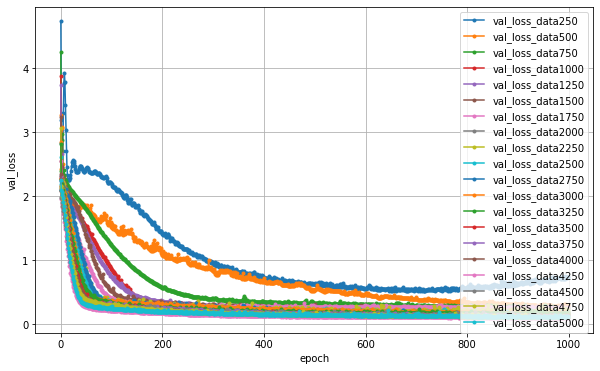

In [59]:
# 学習経過の可視化(大きさ)

val_loss_array = []
for i in range(len(history_size_array)):
    val_loss_array.append(history_size_array[i].history['val_loss'])
plt.figure(figsize=(10,6))
nb_epoch = len(val_loss_array[i])
for i in range(len(val_loss_array)):
    plt.plot(range(nb_epoch), val_loss_array[i], marker='.', label='val_loss_data%d'%(250*(i+1)))
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('val_loss')
plt.show()


In [60]:
for i in range(len(val_loss_array)):
    print(val_loss_array[i][-1])

0.738798201084137
0.30341431498527527
0.24784545600414276
0.15388768911361694
0.1880519688129425
0.19496634602546692
0.2554992735385895
0.15650351345539093
0.21846351027488708
0.19906574487686157
0.14126800000667572
0.17345675826072693
0.16975589096546173
0.12132114917039871
0.12040582299232483
0.10926271229982376
0.10487962514162064
0.11098859459161758
0.11197379976511002
0.11857616901397705


In [48]:
# いち推定のモデル
model_position_array = []

for i in range(20):
    position_model = Sequential()
    ### 畳み込み層
    position_model.add(Conv1D(32, 3, padding='same', activation='tanh', input_shape=(50, 1)))
    ### プーリング層
    position_model.add(MaxPooling1D(2, padding='same'))
    ### Flatten層
    position_model.add(Flatten())
    ### 全結合層
    position_model.add(Dense(2, activation='linear'))
    ### optimizer
    adam = keras.optimizers.Adam()
    ### コンパイル
    position_model.compile(loss='mse', optimizer=adam, metrics=['accuracy'])
    ### 配列にいれる
    model_position_array.append(position_model)

In [49]:
# 学習ループ
history_position_array = []
for i in range(len(model_position_array)):
    epochs = 3000
    batch_size = 128
    history_position_array.append(model_position_array[i].fit(x_position_train_array[i], y_position_train_array[i], batch_size=batch_size, epochs=epochs, verbose=1, validation_data=(x_position_test_array[i], y_position_test_array[i])))

Epoch 1/3000
2/2 [==============================] - 0s 51ms/step - loss: 0.8517 - accuracy: 0.5500 - val_loss: 0.3119 - val_accuracy: 0.6000
Epoch 2/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.2810 - accuracy: 0.5500 - val_loss: 0.1268 - val_accuracy: 0.4600
Epoch 3/3000
2/2 [==============================] - 0s 23ms/step - loss: 0.1241 - accuracy: 0.4600 - val_loss: 0.1238 - val_accuracy: 0.4400
Epoch 4/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.1284 - accuracy: 0.4600 - val_loss: 0.2023 - val_accuracy: 0.4400
Epoch 5/3000
2/2 [==============================] - 0s 24ms/step - loss: 0.1958 - accuracy: 0.4600 - val_loss: 0.2444 - val_accuracy: 0.4400
Epoch 6/3000
2/2 [==============================] - 0s 20ms/step - loss: 0.2192 - accuracy: 0.4600 - val_loss: 0.1978 - val_accuracy: 0.4400
Epoch 7/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.1652 - accuracy: 0.4600 - val_loss: 0.1190 - val_accuracy: 0.4400
Epoch 8/3000


Epoch 59/3000
2/2 [==============================] - 0s 20ms/step - loss: 0.0585 - accuracy: 0.6950 - val_loss: 0.0718 - val_accuracy: 0.7600
Epoch 60/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0584 - accuracy: 0.6950 - val_loss: 0.0716 - val_accuracy: 0.7600
Epoch 61/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0582 - accuracy: 0.6950 - val_loss: 0.0717 - val_accuracy: 0.7600
Epoch 62/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.0582 - accuracy: 0.6850 - val_loss: 0.0719 - val_accuracy: 0.7600
Epoch 63/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0581 - accuracy: 0.6900 - val_loss: 0.0710 - val_accuracy: 0.7600
Epoch 64/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0578 - accuracy: 0.6900 - val_loss: 0.0700 - val_accuracy: 0.7600
Epoch 65/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0582 - accuracy: 0.7000 - val_loss: 0.0692 - val_accuracy: 0.7000
Epoch 

2/2 [==============================] - 0s 18ms/step - loss: 0.0490 - accuracy: 0.7950 - val_loss: 0.0573 - val_accuracy: 0.8000
Epoch 174/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0489 - accuracy: 0.7700 - val_loss: 0.0576 - val_accuracy: 0.8200
Epoch 175/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0488 - accuracy: 0.7600 - val_loss: 0.0566 - val_accuracy: 0.8200
Epoch 176/3000
2/2 [==============================] - 0s 23ms/step - loss: 0.0488 - accuracy: 0.7750 - val_loss: 0.0563 - val_accuracy: 0.8200
Epoch 177/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0488 - accuracy: 0.7850 - val_loss: 0.0566 - val_accuracy: 0.8200
Epoch 178/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0486 - accuracy: 0.7550 - val_loss: 0.0568 - val_accuracy: 0.8200
Epoch 179/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0485 - accuracy: 0.7650 - val_loss: 0.0559 - val_accuracy: 0.8000
Epoch 180/3000

2/2 [==============================] - 0s 17ms/step - loss: 0.0441 - accuracy: 0.7850 - val_loss: 0.0509 - val_accuracy: 0.8000
Epoch 288/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.0440 - accuracy: 0.7850 - val_loss: 0.0511 - val_accuracy: 0.8200
Epoch 289/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0441 - accuracy: 0.8000 - val_loss: 0.0513 - val_accuracy: 0.8000
Epoch 290/3000
2/2 [==============================] - 0s 24ms/step - loss: 0.0442 - accuracy: 0.7800 - val_loss: 0.0510 - val_accuracy: 0.8000
Epoch 291/3000
2/2 [==============================] - 0s 23ms/step - loss: 0.0443 - accuracy: 0.7950 - val_loss: 0.0506 - val_accuracy: 0.8000
Epoch 292/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.0440 - accuracy: 0.7950 - val_loss: 0.0514 - val_accuracy: 0.8000
Epoch 293/3000
2/2 [==============================] - 0s 23ms/step - loss: 0.0440 - accuracy: 0.7950 - val_loss: 0.0513 - val_accuracy: 0.8000
Epoch 294/3000

2/2 [==============================] - 0s 14ms/step - loss: 0.0443 - accuracy: 0.7750 - val_loss: 0.0521 - val_accuracy: 0.8000
Epoch 402/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0426 - accuracy: 0.8000 - val_loss: 0.0520 - val_accuracy: 0.8000
Epoch 403/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0447 - accuracy: 0.7500 - val_loss: 0.0509 - val_accuracy: 0.7800
Epoch 404/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0442 - accuracy: 0.7750 - val_loss: 0.0534 - val_accuracy: 0.7800
Epoch 405/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0436 - accuracy: 0.7800 - val_loss: 0.0522 - val_accuracy: 0.8200
Epoch 406/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0442 - accuracy: 0.7750 - val_loss: 0.0521 - val_accuracy: 0.8200
Epoch 407/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0431 - accuracy: 0.8000 - val_loss: 0.0526 - val_accuracy: 0.7600
Epoch 408/3000

2/2 [==============================] - 0s 15ms/step - loss: 0.0422 - accuracy: 0.8150 - val_loss: 0.0520 - val_accuracy: 0.8800
Epoch 516/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0424 - accuracy: 0.8550 - val_loss: 0.0523 - val_accuracy: 0.8000
Epoch 517/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0425 - accuracy: 0.7850 - val_loss: 0.0518 - val_accuracy: 0.7600
Epoch 518/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.0422 - accuracy: 0.7650 - val_loss: 0.0516 - val_accuracy: 0.7600
Epoch 519/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0422 - accuracy: 0.7800 - val_loss: 0.0514 - val_accuracy: 0.8400
Epoch 520/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0424 - accuracy: 0.8600 - val_loss: 0.0520 - val_accuracy: 0.8800
Epoch 521/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0426 - accuracy: 0.8200 - val_loss: 0.0511 - val_accuracy: 0.8000
Epoch 522/3000

2/2 [==============================] - 0s 15ms/step - loss: 0.0424 - accuracy: 0.7550 - val_loss: 0.0520 - val_accuracy: 0.7800
Epoch 630/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0420 - accuracy: 0.8100 - val_loss: 0.0524 - val_accuracy: 0.8200
Epoch 631/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0418 - accuracy: 0.8050 - val_loss: 0.0532 - val_accuracy: 0.8000
Epoch 632/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0419 - accuracy: 0.7900 - val_loss: 0.0523 - val_accuracy: 0.8000
Epoch 633/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0421 - accuracy: 0.7800 - val_loss: 0.0523 - val_accuracy: 0.8000
Epoch 634/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0421 - accuracy: 0.8050 - val_loss: 0.0526 - val_accuracy: 0.8200
Epoch 635/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0419 - accuracy: 0.8250 - val_loss: 0.0533 - val_accuracy: 0.8000
Epoch 636/3000

2/2 [==============================] - 0s 13ms/step - loss: 0.0419 - accuracy: 0.8500 - val_loss: 0.0531 - val_accuracy: 0.8000
Epoch 744/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0417 - accuracy: 0.7900 - val_loss: 0.0532 - val_accuracy: 0.8000
Epoch 745/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0415 - accuracy: 0.8000 - val_loss: 0.0533 - val_accuracy: 0.8200
Epoch 746/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0422 - accuracy: 0.8200 - val_loss: 0.0534 - val_accuracy: 0.8000
Epoch 747/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0417 - accuracy: 0.7800 - val_loss: 0.0541 - val_accuracy: 0.7600
Epoch 748/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0418 - accuracy: 0.7650 - val_loss: 0.0529 - val_accuracy: 0.8200
Epoch 749/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0420 - accuracy: 0.8100 - val_loss: 0.0527 - val_accuracy: 0.7800
Epoch 750/3000

2/2 [==============================] - 0s 13ms/step - loss: 0.0418 - accuracy: 0.7750 - val_loss: 0.0529 - val_accuracy: 0.8000
Epoch 858/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0419 - accuracy: 0.7900 - val_loss: 0.0537 - val_accuracy: 0.8000
Epoch 859/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0416 - accuracy: 0.7900 - val_loss: 0.0532 - val_accuracy: 0.8200
Epoch 860/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0415 - accuracy: 0.8100 - val_loss: 0.0534 - val_accuracy: 0.8000
Epoch 861/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0417 - accuracy: 0.8000 - val_loss: 0.0534 - val_accuracy: 0.8000
Epoch 862/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0416 - accuracy: 0.7850 - val_loss: 0.0535 - val_accuracy: 0.8000
Epoch 863/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0415 - accuracy: 0.8100 - val_loss: 0.0530 - val_accuracy: 0.8600
Epoch 864/3000

2/2 [==============================] - 0s 14ms/step - loss: 0.0417 - accuracy: 0.7800 - val_loss: 0.0555 - val_accuracy: 0.7600
Epoch 972/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0429 - accuracy: 0.7850 - val_loss: 0.0541 - val_accuracy: 0.8400
Epoch 973/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0413 - accuracy: 0.8500 - val_loss: 0.0541 - val_accuracy: 0.8800
Epoch 974/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0435 - accuracy: 0.8350 - val_loss: 0.0535 - val_accuracy: 0.7600
Epoch 975/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0430 - accuracy: 0.7550 - val_loss: 0.0545 - val_accuracy: 0.8800
Epoch 976/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0434 - accuracy: 0.7900 - val_loss: 0.0539 - val_accuracy: 0.8200
Epoch 977/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0426 - accuracy: 0.7750 - val_loss: 0.0551 - val_accuracy: 0.7400
Epoch 978/3000

2/2 [==============================] - 0s 13ms/step - loss: 0.0420 - accuracy: 0.7850 - val_loss: 0.0527 - val_accuracy: 0.7600
Epoch 1086/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0417 - accuracy: 0.7800 - val_loss: 0.0531 - val_accuracy: 0.8000
Epoch 1087/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0413 - accuracy: 0.8250 - val_loss: 0.0543 - val_accuracy: 0.8800
Epoch 1088/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0424 - accuracy: 0.8450 - val_loss: 0.0528 - val_accuracy: 0.8000
Epoch 1089/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0410 - accuracy: 0.7950 - val_loss: 0.0528 - val_accuracy: 0.8000
Epoch 1090/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0410 - accuracy: 0.7900 - val_loss: 0.0527 - val_accuracy: 0.8000
Epoch 1091/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0413 - accuracy: 0.8000 - val_loss: 0.0530 - val_accuracy: 0.8200
Epoch 10

Epoch 1142/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0428 - accuracy: 0.7600 - val_loss: 0.0524 - val_accuracy: 0.7600
Epoch 1143/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0415 - accuracy: 0.7550 - val_loss: 0.0541 - val_accuracy: 0.9000
Epoch 1144/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0426 - accuracy: 0.8600 - val_loss: 0.0522 - val_accuracy: 0.8200
Epoch 1145/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0407 - accuracy: 0.8200 - val_loss: 0.0539 - val_accuracy: 0.7800
Epoch 1146/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0433 - accuracy: 0.7450 - val_loss: 0.0524 - val_accuracy: 0.8200
Epoch 1147/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0432 - accuracy: 0.7750 - val_loss: 0.0545 - val_accuracy: 0.7800
Epoch 1148/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0418 - accuracy: 0.7600 - val_loss: 0.0543 - val_accuracy:

2/2 [==============================] - 0s 15ms/step - loss: 0.0411 - accuracy: 0.8300 - val_loss: 0.0528 - val_accuracy: 0.8200
Epoch 1256/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0412 - accuracy: 0.8000 - val_loss: 0.0518 - val_accuracy: 0.8200
Epoch 1257/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - accuracy: 0.8100 - val_loss: 0.0518 - val_accuracy: 0.8200
Epoch 1258/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0409 - accuracy: 0.8200 - val_loss: 0.0521 - val_accuracy: 0.7800
Epoch 1259/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - accuracy: 0.7950 - val_loss: 0.0529 - val_accuracy: 0.7600
Epoch 1260/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0412 - accuracy: 0.8150 - val_loss: 0.0522 - val_accuracy: 0.8400
Epoch 1261/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0412 - accuracy: 0.8550 - val_loss: 0.0526 - val_accuracy: 0.7800
Epoch 12

2/2 [==============================] - 0s 14ms/step - loss: 0.0406 - accuracy: 0.8200 - val_loss: 0.0522 - val_accuracy: 0.8200
Epoch 1313/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - accuracy: 0.8000 - val_loss: 0.0525 - val_accuracy: 0.8200
Epoch 1314/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0406 - accuracy: 0.8100 - val_loss: 0.0524 - val_accuracy: 0.8200
Epoch 1315/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0408 - accuracy: 0.8300 - val_loss: 0.0522 - val_accuracy: 0.8000
Epoch 1316/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0410 - accuracy: 0.7950 - val_loss: 0.0528 - val_accuracy: 0.8000
Epoch 1317/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0409 - accuracy: 0.8050 - val_loss: 0.0528 - val_accuracy: 0.8800
Epoch 1318/3000
2/2 [==============================] - 0s 20ms/step - loss: 0.0410 - accuracy: 0.8700 - val_loss: 0.0521 - val_accuracy: 0.7800
Epoch 13

2/2 [==============================] - 0s 15ms/step - loss: 0.0409 - accuracy: 0.7750 - val_loss: 0.0521 - val_accuracy: 0.7600
Epoch 1370/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0408 - accuracy: 0.7900 - val_loss: 0.0519 - val_accuracy: 0.8600
Epoch 1371/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0406 - accuracy: 0.8650 - val_loss: 0.0531 - val_accuracy: 0.8200
Epoch 1372/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0418 - accuracy: 0.8200 - val_loss: 0.0521 - val_accuracy: 0.7800
Epoch 1373/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0424 - accuracy: 0.8100 - val_loss: 0.0524 - val_accuracy: 0.8200
Epoch 1374/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0417 - accuracy: 0.8200 - val_loss: 0.0553 - val_accuracy: 0.8000
Epoch 1375/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0424 - accuracy: 0.7950 - val_loss: 0.0522 - val_accuracy: 0.8200
Epoch 13

2/2 [==============================] - 0s 15ms/step - loss: 0.0416 - accuracy: 0.8500 - val_loss: 0.0530 - val_accuracy: 0.7600
Epoch 1427/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0444 - accuracy: 0.7600 - val_loss: 0.0520 - val_accuracy: 0.7800
Epoch 1428/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0427 - accuracy: 0.8050 - val_loss: 0.0563 - val_accuracy: 0.8800
Epoch 1429/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0431 - accuracy: 0.8750 - val_loss: 0.0520 - val_accuracy: 0.8200
Epoch 1430/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0416 - accuracy: 0.8050 - val_loss: 0.0519 - val_accuracy: 0.7600
Epoch 1431/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0408 - accuracy: 0.7850 - val_loss: 0.0535 - val_accuracy: 0.8200
Epoch 1432/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0414 - accuracy: 0.8500 - val_loss: 0.0519 - val_accuracy: 0.9000
Epoch 14

2/2 [==============================] - 0s 16ms/step - loss: 0.0417 - accuracy: 0.8300 - val_loss: 0.0516 - val_accuracy: 0.8200
Epoch 1484/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0403 - accuracy: 0.8100 - val_loss: 0.0520 - val_accuracy: 0.7600
Epoch 1485/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0408 - accuracy: 0.7800 - val_loss: 0.0515 - val_accuracy: 0.8000
Epoch 1486/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0404 - accuracy: 0.8100 - val_loss: 0.0519 - val_accuracy: 0.8200
Epoch 1487/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0410 - accuracy: 0.8400 - val_loss: 0.0517 - val_accuracy: 0.8200
Epoch 1488/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0403 - accuracy: 0.8350 - val_loss: 0.0525 - val_accuracy: 0.7600
Epoch 1489/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0418 - accuracy: 0.7800 - val_loss: 0.0518 - val_accuracy: 0.8000
Epoch 14

2/2 [==============================] - 0s 14ms/step - loss: 0.0409 - accuracy: 0.8100 - val_loss: 0.0524 - val_accuracy: 0.8000
Epoch 1541/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0414 - accuracy: 0.8100 - val_loss: 0.0518 - val_accuracy: 0.8200
Epoch 1542/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0403 - accuracy: 0.8150 - val_loss: 0.0537 - val_accuracy: 0.8000
Epoch 1543/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0414 - accuracy: 0.8200 - val_loss: 0.0516 - val_accuracy: 0.8200
Epoch 1544/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0403 - accuracy: 0.8200 - val_loss: 0.0517 - val_accuracy: 0.7800
Epoch 1545/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0409 - accuracy: 0.7900 - val_loss: 0.0518 - val_accuracy: 0.7800
Epoch 1546/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0401 - accuracy: 0.7950 - val_loss: 0.0523 - val_accuracy: 0.8600
Epoch 15

2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - accuracy: 0.8500 - val_loss: 0.0524 - val_accuracy: 0.8200
Epoch 1598/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0405 - accuracy: 0.8150 - val_loss: 0.0530 - val_accuracy: 0.7600
Epoch 1599/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0406 - accuracy: 0.7850 - val_loss: 0.0519 - val_accuracy: 0.8200
Epoch 1600/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0404 - accuracy: 0.8550 - val_loss: 0.0516 - val_accuracy: 0.8600
Epoch 1601/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0404 - accuracy: 0.8500 - val_loss: 0.0522 - val_accuracy: 0.7600
Epoch 1602/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - accuracy: 0.7600 - val_loss: 0.0524 - val_accuracy: 0.7800
Epoch 1603/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0418 - accuracy: 0.7800 - val_loss: 0.0516 - val_accuracy: 0.8600
Epoch 16

Epoch 1654/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0401 - accuracy: 0.8050 - val_loss: 0.0520 - val_accuracy: 0.8600
Epoch 1655/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0402 - accuracy: 0.8450 - val_loss: 0.0523 - val_accuracy: 0.8000
Epoch 1656/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0401 - accuracy: 0.8150 - val_loss: 0.0523 - val_accuracy: 0.7800
Epoch 1657/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0402 - accuracy: 0.7950 - val_loss: 0.0520 - val_accuracy: 0.8400
Epoch 1658/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0408 - accuracy: 0.8650 - val_loss: 0.0519 - val_accuracy: 0.8200
Epoch 1659/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0403 - accuracy: 0.8000 - val_loss: 0.0532 - val_accuracy: 0.7600
Epoch 1660/3000
2/2 [==============================] - 0s 22ms/step - loss: 0.0405 - accuracy: 0.8050 - val_loss: 0.0517 - val_accuracy:

Epoch 1711/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0404 - accuracy: 0.8200 - val_loss: 0.0521 - val_accuracy: 0.8200
Epoch 1712/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0403 - accuracy: 0.7950 - val_loss: 0.0520 - val_accuracy: 0.8200
Epoch 1713/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0404 - accuracy: 0.8100 - val_loss: 0.0522 - val_accuracy: 0.8200
Epoch 1714/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0406 - accuracy: 0.7650 - val_loss: 0.0535 - val_accuracy: 0.8000
Epoch 1715/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0403 - accuracy: 0.8200 - val_loss: 0.0535 - val_accuracy: 0.8200
Epoch 1716/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0410 - accuracy: 0.7950 - val_loss: 0.0521 - val_accuracy: 0.8000
Epoch 1717/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0403 - accuracy: 0.8150 - val_loss: 0.0532 - val_accuracy:

Epoch 1768/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0401 - accuracy: 0.8050 - val_loss: 0.0538 - val_accuracy: 0.7800
Epoch 1769/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0427 - accuracy: 0.7600 - val_loss: 0.0523 - val_accuracy: 0.7400
Epoch 1770/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0409 - accuracy: 0.8100 - val_loss: 0.0553 - val_accuracy: 0.7600
Epoch 1771/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0423 - accuracy: 0.7350 - val_loss: 0.0522 - val_accuracy: 0.8400
Epoch 1772/3000
2/2 [==============================] - 0s 29ms/step - loss: 0.0413 - accuracy: 0.8000 - val_loss: 0.0533 - val_accuracy: 0.7800
Epoch 1773/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0409 - accuracy: 0.7600 - val_loss: 0.0536 - val_accuracy: 0.8400
Epoch 1774/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0414 - accuracy: 0.8200 - val_loss: 0.0532 - val_accuracy:

Epoch 1825/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0404 - accuracy: 0.8300 - val_loss: 0.0521 - val_accuracy: 0.7600
Epoch 1826/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0410 - accuracy: 0.7800 - val_loss: 0.0521 - val_accuracy: 0.7600
Epoch 1827/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.0401 - accuracy: 0.8250 - val_loss: 0.0521 - val_accuracy: 0.8200
Epoch 1828/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0408 - accuracy: 0.8100 - val_loss: 0.0518 - val_accuracy: 0.7600
Epoch 1829/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0403 - accuracy: 0.7800 - val_loss: 0.0520 - val_accuracy: 0.7800
Epoch 1830/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.0403 - accuracy: 0.8450 - val_loss: 0.0518 - val_accuracy: 0.8800
Epoch 1831/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0406 - accuracy: 0.8600 - val_loss: 0.0518 - val_accuracy:

Epoch 1882/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - accuracy: 0.7800 - val_loss: 0.0539 - val_accuracy: 0.7400
Epoch 1883/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0400 - accuracy: 0.8000 - val_loss: 0.0533 - val_accuracy: 0.8400
Epoch 1884/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0410 - accuracy: 0.8350 - val_loss: 0.0525 - val_accuracy: 0.7600
Epoch 1885/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0397 - accuracy: 0.8050 - val_loss: 0.0545 - val_accuracy: 0.7400
Epoch 1886/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0411 - accuracy: 0.7800 - val_loss: 0.0522 - val_accuracy: 0.8400
Epoch 1887/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0404 - accuracy: 0.8550 - val_loss: 0.0520 - val_accuracy: 0.8000
Epoch 1888/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0407 - accuracy: 0.8150 - val_loss: 0.0530 - val_accuracy:

Epoch 1939/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0400 - accuracy: 0.8100 - val_loss: 0.0520 - val_accuracy: 0.7800
Epoch 1940/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0400 - accuracy: 0.8150 - val_loss: 0.0522 - val_accuracy: 0.8000
Epoch 1941/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0397 - accuracy: 0.8300 - val_loss: 0.0523 - val_accuracy: 0.7600
Epoch 1942/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0397 - accuracy: 0.8000 - val_loss: 0.0526 - val_accuracy: 0.7800
Epoch 1943/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0398 - accuracy: 0.8250 - val_loss: 0.0526 - val_accuracy: 0.8000
Epoch 1944/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0400 - accuracy: 0.8100 - val_loss: 0.0525 - val_accuracy: 0.7800
Epoch 1945/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0400 - accuracy: 0.8050 - val_loss: 0.0525 - val_accuracy:

Epoch 1996/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0405 - accuracy: 0.7800 - val_loss: 0.0542 - val_accuracy: 0.7600
Epoch 1997/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0415 - accuracy: 0.8200 - val_loss: 0.0530 - val_accuracy: 0.8600
Epoch 1998/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0415 - accuracy: 0.8550 - val_loss: 0.0532 - val_accuracy: 0.7600
Epoch 1999/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0397 - accuracy: 0.7950 - val_loss: 0.0563 - val_accuracy: 0.7600
Epoch 2000/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0415 - accuracy: 0.8000 - val_loss: 0.0530 - val_accuracy: 0.8400
Epoch 2001/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0398 - accuracy: 0.8400 - val_loss: 0.0536 - val_accuracy: 0.8200
Epoch 2002/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0411 - accuracy: 0.8550 - val_loss: 0.0534 - val_accuracy:

Epoch 2053/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0401 - accuracy: 0.8350 - val_loss: 0.0537 - val_accuracy: 0.8000
Epoch 2054/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0395 - accuracy: 0.8100 - val_loss: 0.0536 - val_accuracy: 0.7400
Epoch 2055/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0400 - accuracy: 0.7900 - val_loss: 0.0530 - val_accuracy: 0.8000
Epoch 2056/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0397 - accuracy: 0.8500 - val_loss: 0.0539 - val_accuracy: 0.8000
Epoch 2057/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0402 - accuracy: 0.8100 - val_loss: 0.0534 - val_accuracy: 0.7600
Epoch 2058/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0396 - accuracy: 0.7950 - val_loss: 0.0529 - val_accuracy: 0.8400
Epoch 2059/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0402 - accuracy: 0.8150 - val_loss: 0.0529 - val_accuracy:

Epoch 2110/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0416 - accuracy: 0.8250 - val_loss: 0.0536 - val_accuracy: 0.8000
Epoch 2111/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0401 - accuracy: 0.8000 - val_loss: 0.0554 - val_accuracy: 0.7600
Epoch 2112/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0408 - accuracy: 0.8100 - val_loss: 0.0537 - val_accuracy: 0.8400
Epoch 2113/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0400 - accuracy: 0.8650 - val_loss: 0.0537 - val_accuracy: 0.7800
Epoch 2114/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0394 - accuracy: 0.8150 - val_loss: 0.0542 - val_accuracy: 0.7600
Epoch 2115/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0410 - accuracy: 0.8050 - val_loss: 0.0537 - val_accuracy: 0.7600
Epoch 2116/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0396 - accuracy: 0.8050 - val_loss: 0.0549 - val_accuracy:

Epoch 2167/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0395 - accuracy: 0.7900 - val_loss: 0.0534 - val_accuracy: 0.8200
Epoch 2168/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0393 - accuracy: 0.8650 - val_loss: 0.0538 - val_accuracy: 0.8600
Epoch 2169/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0399 - accuracy: 0.8550 - val_loss: 0.0539 - val_accuracy: 0.7400
Epoch 2170/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0399 - accuracy: 0.7800 - val_loss: 0.0544 - val_accuracy: 0.7400
Epoch 2171/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0401 - accuracy: 0.7800 - val_loss: 0.0544 - val_accuracy: 0.8400
Epoch 2172/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0407 - accuracy: 0.8250 - val_loss: 0.0541 - val_accuracy: 0.8000
Epoch 2173/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0401 - accuracy: 0.7900 - val_loss: 0.0545 - val_accuracy:

2/2 [==============================] - 0s 14ms/step - loss: 0.0400 - accuracy: 0.7950 - val_loss: 0.0551 - val_accuracy: 0.7600
Epoch 2281/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0391 - accuracy: 0.8100 - val_loss: 0.0553 - val_accuracy: 0.7600
Epoch 2282/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0399 - accuracy: 0.7950 - val_loss: 0.0544 - val_accuracy: 0.7800
Epoch 2283/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0388 - accuracy: 0.8150 - val_loss: 0.0553 - val_accuracy: 0.8000
Epoch 2284/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0393 - accuracy: 0.8400 - val_loss: 0.0543 - val_accuracy: 0.8000
Epoch 2285/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0394 - accuracy: 0.8050 - val_loss: 0.0543 - val_accuracy: 0.8000
Epoch 2286/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0390 - accuracy: 0.8300 - val_loss: 0.0553 - val_accuracy: 0.8400
Epoch 22

2/2 [==============================] - 0s 13ms/step - loss: 0.0400 - accuracy: 0.8400 - val_loss: 0.0544 - val_accuracy: 0.8200
Epoch 2338/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0392 - accuracy: 0.8100 - val_loss: 0.0566 - val_accuracy: 0.7400
Epoch 2339/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0398 - accuracy: 0.7850 - val_loss: 0.0544 - val_accuracy: 0.8400
Epoch 2340/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0390 - accuracy: 0.8500 - val_loss: 0.0543 - val_accuracy: 0.8200
Epoch 2341/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0391 - accuracy: 0.8300 - val_loss: 0.0548 - val_accuracy: 0.7600
Epoch 2342/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0390 - accuracy: 0.8000 - val_loss: 0.0541 - val_accuracy: 0.8000
Epoch 2343/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0389 - accuracy: 0.8300 - val_loss: 0.0539 - val_accuracy: 0.8000
Epoch 23

Epoch 2451/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0413 - accuracy: 0.7600 - val_loss: 0.0556 - val_accuracy: 0.7600
Epoch 2452/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0411 - accuracy: 0.7400 - val_loss: 0.0567 - val_accuracy: 0.7400
Epoch 2453/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0405 - accuracy: 0.7350 - val_loss: 0.0573 - val_accuracy: 0.7400
Epoch 2454/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0398 - accuracy: 0.7750 - val_loss: 0.0555 - val_accuracy: 0.7600
Epoch 2455/3000
2/2 [==============================] - 0s 12ms/step - loss: 0.0399 - accuracy: 0.8100 - val_loss: 0.0549 - val_accuracy: 0.8200
Epoch 2456/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0395 - accuracy: 0.8550 - val_loss: 0.0564 - val_accuracy: 0.8000
Epoch 2457/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0396 - accuracy: 0.8300 - val_loss: 0.0558 - val_accuracy:

Epoch 2508/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0397 - accuracy: 0.8050 - val_loss: 0.0544 - val_accuracy: 0.8000
Epoch 2509/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0387 - accuracy: 0.8200 - val_loss: 0.0546 - val_accuracy: 0.7600
Epoch 2510/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0382 - accuracy: 0.8450 - val_loss: 0.0551 - val_accuracy: 0.8400
Epoch 2511/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0388 - accuracy: 0.8550 - val_loss: 0.0548 - val_accuracy: 0.7800
Epoch 2512/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0386 - accuracy: 0.8150 - val_loss: 0.0553 - val_accuracy: 0.7600
Epoch 2513/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0386 - accuracy: 0.8100 - val_loss: 0.0559 - val_accuracy: 0.8400
Epoch 2514/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0389 - accuracy: 0.8600 - val_loss: 0.0559 - val_accuracy:

Epoch 2565/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0383 - accuracy: 0.8350 - val_loss: 0.0564 - val_accuracy: 0.8200
Epoch 2566/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0388 - accuracy: 0.8300 - val_loss: 0.0576 - val_accuracy: 0.7600
Epoch 2567/3000
2/2 [==============================] - ETA: 0s - loss: 0.0393 - accuracy: 0.81 - 0s 14ms/step - loss: 0.0396 - accuracy: 0.8100 - val_loss: 0.0568 - val_accuracy: 0.7600
Epoch 2568/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0394 - accuracy: 0.8200 - val_loss: 0.0567 - val_accuracy: 0.8400
Epoch 2569/3000
2/2 [==============================] - 0s 20ms/step - loss: 0.0391 - accuracy: 0.8700 - val_loss: 0.0587 - val_accuracy: 0.7800
Epoch 2570/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0397 - accuracy: 0.8350 - val_loss: 0.0560 - val_accuracy: 0.7600
Epoch 2571/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0392 - accuracy:

2/2 [==============================] - 0s 15ms/step - loss: 0.0380 - accuracy: 0.8300 - val_loss: 0.0569 - val_accuracy: 0.7600
Epoch 2622/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0382 - accuracy: 0.8050 - val_loss: 0.0571 - val_accuracy: 0.7600
Epoch 2623/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0382 - accuracy: 0.8150 - val_loss: 0.0565 - val_accuracy: 0.8000
Epoch 2624/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0380 - accuracy: 0.8400 - val_loss: 0.0566 - val_accuracy: 0.7600
Epoch 2625/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0382 - accuracy: 0.8050 - val_loss: 0.0568 - val_accuracy: 0.7800
Epoch 2626/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0379 - accuracy: 0.8300 - val_loss: 0.0570 - val_accuracy: 0.8200
Epoch 2627/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0386 - accuracy: 0.8500 - val_loss: 0.0564 - val_accuracy: 0.7800
Epoch 26

Epoch 2678/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0381 - accuracy: 0.8300 - val_loss: 0.0590 - val_accuracy: 0.7600
Epoch 2679/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0391 - accuracy: 0.8000 - val_loss: 0.0570 - val_accuracy: 0.8200
Epoch 2680/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0384 - accuracy: 0.8250 - val_loss: 0.0571 - val_accuracy: 0.8400
Epoch 2681/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0392 - accuracy: 0.8300 - val_loss: 0.0581 - val_accuracy: 0.7800
Epoch 2682/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0385 - accuracy: 0.8100 - val_loss: 0.0569 - val_accuracy: 0.7800
Epoch 2683/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0382 - accuracy: 0.8300 - val_loss: 0.0563 - val_accuracy: 0.7800
Epoch 2684/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0380 - accuracy: 0.8300 - val_loss: 0.0562 - val_accuracy:

Epoch 2735/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0421 - accuracy: 0.7800 - val_loss: 0.0591 - val_accuracy: 0.8400
Epoch 2736/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0409 - accuracy: 0.8150 - val_loss: 0.0625 - val_accuracy: 0.7600
Epoch 2737/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0413 - accuracy: 0.7550 - val_loss: 0.0611 - val_accuracy: 0.8000
Epoch 2738/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0412 - accuracy: 0.7900 - val_loss: 0.0595 - val_accuracy: 0.7600
Epoch 2739/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0426 - accuracy: 0.7400 - val_loss: 0.0602 - val_accuracy: 0.7600
Epoch 2740/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0401 - accuracy: 0.7850 - val_loss: 0.0585 - val_accuracy: 0.8000
Epoch 2741/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0392 - accuracy: 0.8100 - val_loss: 0.0566 - val_accuracy:

Epoch 2792/3000
2/2 [==============================] - 0s 13ms/step - loss: 0.0377 - accuracy: 0.8000 - val_loss: 0.0565 - val_accuracy: 0.8400
Epoch 2793/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0386 - accuracy: 0.8300 - val_loss: 0.0562 - val_accuracy: 0.7800
Epoch 2794/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0382 - accuracy: 0.8250 - val_loss: 0.0562 - val_accuracy: 0.7800
Epoch 2795/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0383 - accuracy: 0.8050 - val_loss: 0.0562 - val_accuracy: 0.7600
Epoch 2796/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0383 - accuracy: 0.8450 - val_loss: 0.0563 - val_accuracy: 0.8200
Epoch 2797/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0377 - accuracy: 0.8450 - val_loss: 0.0570 - val_accuracy: 0.7800
Epoch 2798/3000
2/2 [==============================] - 0s 15ms/step - loss: 0.0380 - accuracy: 0.8000 - val_loss: 0.0566 - val_accuracy:

2/2 [==============================] - 0s 15ms/step - loss: 0.0386 - accuracy: 0.8250 - val_loss: 0.0589 - val_accuracy: 0.8200
Epoch 2906/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0393 - accuracy: 0.8150 - val_loss: 0.0591 - val_accuracy: 0.7600
Epoch 2907/3000
2/2 [==============================] - 0s 19ms/step - loss: 0.0389 - accuracy: 0.7900 - val_loss: 0.0604 - val_accuracy: 0.7600
Epoch 2908/3000
2/2 [==============================] - 0s 16ms/step - loss: 0.0378 - accuracy: 0.8250 - val_loss: 0.0592 - val_accuracy: 0.7800
Epoch 2909/3000
2/2 [==============================] - 0s 17ms/step - loss: 0.0400 - accuracy: 0.7700 - val_loss: 0.0577 - val_accuracy: 0.7800
Epoch 2910/3000
2/2 [==============================] - 0s 32ms/step - loss: 0.0375 - accuracy: 0.8100 - val_loss: 0.0607 - val_accuracy: 0.7800
Epoch 2911/3000
2/2 [==============================] - 0s 21ms/step - loss: 0.0387 - accuracy: 0.8000 - val_loss: 0.0573 - val_accuracy: 0.8200
Epoch 29

2/2 [==============================] - 0s 15ms/step - loss: 0.0384 - accuracy: 0.8050 - val_loss: 0.0564 - val_accuracy: 0.7800
Epoch 2963/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0372 - accuracy: 0.8250 - val_loss: 0.0579 - val_accuracy: 0.7600
Epoch 2964/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0383 - accuracy: 0.8200 - val_loss: 0.0571 - val_accuracy: 0.7400
Epoch 2965/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0376 - accuracy: 0.8150 - val_loss: 0.0584 - val_accuracy: 0.7800
Epoch 2966/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0380 - accuracy: 0.8000 - val_loss: 0.0587 - val_accuracy: 0.7600
Epoch 2967/3000
2/2 [==============================] - 0s 14ms/step - loss: 0.0378 - accuracy: 0.8100 - val_loss: 0.0584 - val_accuracy: 0.7800
Epoch 2968/3000
2/2 [==============================] - 0s 18ms/step - loss: 0.0379 - accuracy: 0.8350 - val_loss: 0.0589 - val_accuracy: 0.7800
Epoch 29

4/4 [==============================] - 0s 9ms/step - loss: 0.0531 - accuracy: 0.6625 - val_loss: 0.0492 - val_accuracy: 0.6600
Epoch 78/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0531 - accuracy: 0.6675 - val_loss: 0.0483 - val_accuracy: 0.6800
Epoch 79/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0534 - accuracy: 0.6325 - val_loss: 0.0485 - val_accuracy: 0.6700
Epoch 80/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0525 - accuracy: 0.6925 - val_loss: 0.0483 - val_accuracy: 0.7000
Epoch 81/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0536 - accuracy: 0.6875 - val_loss: 0.0518 - val_accuracy: 0.6600
Epoch 82/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0576 - accuracy: 0.6400 - val_loss: 0.0485 - val_accuracy: 0.6600
Epoch 83/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0558 - accuracy: 0.6925 - val_loss: 0.0484 - val_accuracy: 0.7100
Epoch 84/3000
4/4 [=======

Epoch 135/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0519 - accuracy: 0.6550 - val_loss: 0.0463 - val_accuracy: 0.7600
Epoch 136/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0515 - accuracy: 0.6275 - val_loss: 0.0456 - val_accuracy: 0.8600
Epoch 137/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0498 - accuracy: 0.7350 - val_loss: 0.0489 - val_accuracy: 0.6000
Epoch 138/3000
4/4 [==============================] - 0s 11ms/step - loss: 0.0508 - accuracy: 0.6575 - val_loss: 0.0480 - val_accuracy: 0.6300
Epoch 139/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0550 - accuracy: 0.5450 - val_loss: 0.0481 - val_accuracy: 0.6300
Epoch 140/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0519 - accuracy: 0.6225 - val_loss: 0.0454 - val_accuracy: 0.8100
Epoch 141/3000
4/4 [==============================] - 0s 11ms/step - loss: 0.0505 - accuracy: 0.6450 - val_loss: 0.0453 - val_accuracy: 0.8400
Epo

Epoch 250/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0516 - accuracy: 0.6275 - val_loss: 0.0453 - val_accuracy: 0.7400
Epoch 251/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0525 - accuracy: 0.6325 - val_loss: 0.0461 - val_accuracy: 0.6900
Epoch 252/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0502 - accuracy: 0.7900 - val_loss: 0.0448 - val_accuracy: 0.6600
Epoch 253/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0500 - accuracy: 0.6025 - val_loss: 0.0451 - val_accuracy: 0.6400
Epoch 254/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0491 - accuracy: 0.6600 - val_loss: 0.0440 - val_accuracy: 0.7400
Epoch 255/3000
4/4 [==============================] - 0s 11ms/step - loss: 0.0491 - accuracy: 0.6225 - val_loss: 0.0441 - val_accuracy: 0.8600
Epoch 256/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0472 - accuracy: 0.7500 - val_loss: 0.0457 - val_accuracy: 0.6500
Epoch

Epoch 365/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0538 - accuracy: 0.6775 - val_loss: 0.0482 - val_accuracy: 0.6100
Epoch 366/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0517 - accuracy: 0.6700 - val_loss: 0.0431 - val_accuracy: 0.7800
Epoch 367/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0499 - accuracy: 0.7500 - val_loss: 0.0446 - val_accuracy: 0.6400
Epoch 368/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0484 - accuracy: 0.7300 - val_loss: 0.0427 - val_accuracy: 0.7700
Epoch 369/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0475 - accuracy: 0.7875 - val_loss: 0.0444 - val_accuracy: 0.6400
Epoch 370/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0475 - accuracy: 0.6825 - val_loss: 0.0438 - val_accuracy: 0.7600
Epoch 371/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0478 - accuracy: 0.6775 - val_loss: 0.0441 - val_accuracy: 0.6900
Epoch

Epoch 480/3000
4/4 [==============================] - 0s 12ms/step - loss: 0.0489 - accuracy: 0.6300 - val_loss: 0.0430 - val_accuracy: 0.8600
Epoch 481/3000
4/4 [==============================] - 0s 11ms/step - loss: 0.0477 - accuracy: 0.6975 - val_loss: 0.0446 - val_accuracy: 0.6400
Epoch 482/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0498 - accuracy: 0.6325 - val_loss: 0.0430 - val_accuracy: 0.9200
Epoch 483/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0519 - accuracy: 0.6775 - val_loss: 0.0435 - val_accuracy: 0.8800
Epoch 484/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0515 - accuracy: 0.7025 - val_loss: 0.0450 - val_accuracy: 0.6700
Epoch 485/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0507 - accuracy: 0.6850 - val_loss: 0.0427 - val_accuracy: 0.8000
Epoch 486/3000
4/4 [==============================] - 0s 12ms/step - loss: 0.0505 - accuracy: 0.6825 - val_loss: 0.0423 - val_accuracy: 0.8500
Epo

Epoch 595/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0530 - accuracy: 0.7725 - val_loss: 0.0437 - val_accuracy: 0.6700
Epoch 596/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0509 - accuracy: 0.6675 - val_loss: 0.0420 - val_accuracy: 0.8500
Epoch 597/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0500 - accuracy: 0.8425 - val_loss: 0.0425 - val_accuracy: 0.9000
Epoch 598/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0483 - accuracy: 0.7150 - val_loss: 0.0425 - val_accuracy: 0.8000
Epoch 599/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0497 - accuracy: 0.6425 - val_loss: 0.0420 - val_accuracy: 0.9000
Epoch 600/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0481 - accuracy: 0.6950 - val_loss: 0.0423 - val_accuracy: 0.8000
Epoch 601/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0505 - accuracy: 0.6675 - val_loss: 0.0424 - val_accuracy: 0.7500
Epoc

Epoch 710/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0458 - accuracy: 0.7650 - val_loss: 0.0422 - val_accuracy: 0.8900
Epoch 711/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0474 - accuracy: 0.6600 - val_loss: 0.0441 - val_accuracy: 0.7300
Epoch 712/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0525 - accuracy: 0.6325 - val_loss: 0.0426 - val_accuracy: 0.7300
Epoch 713/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0482 - accuracy: 0.6775 - val_loss: 0.0416 - val_accuracy: 0.8800
Epoch 714/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0478 - accuracy: 0.6950 - val_loss: 0.0440 - val_accuracy: 0.6300
Epoch 715/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0469 - accuracy: 0.7075 - val_loss: 0.0433 - val_accuracy: 0.6700
Epoch 716/3000
4/4 [==============================] - 0s 7ms/step - loss: 0.0466 - accuracy: 0.6750 - val_loss: 0.0493 - val_accuracy: 0.5900
Epoch

Epoch 825/3000
4/4 [==============================] - 0s 11ms/step - loss: 0.0457 - accuracy: 0.7600 - val_loss: 0.0417 - val_accuracy: 0.8800
Epoch 826/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0454 - accuracy: 0.8375 - val_loss: 0.0426 - val_accuracy: 0.7100
Epoch 827/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0457 - accuracy: 0.6900 - val_loss: 0.0435 - val_accuracy: 0.7400
Epoch 828/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0487 - accuracy: 0.6100 - val_loss: 0.0420 - val_accuracy: 0.7700
Epoch 829/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0466 - accuracy: 0.6775 - val_loss: 0.0415 - val_accuracy: 0.8600
Epoch 830/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0473 - accuracy: 0.6450 - val_loss: 0.0414 - val_accuracy: 0.8500
Epoch 831/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0456 - accuracy: 0.6900 - val_loss: 0.0441 - val_accuracy: 0.6200
Epoch

4/4 [==============================] - 0s 11ms/step - loss: 0.0462 - accuracy: 0.6700 - val_loss: 0.0434 - val_accuracy: 0.6800
Epoch 883/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0458 - accuracy: 0.6625 - val_loss: 0.0424 - val_accuracy: 0.8000
Epoch 884/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0452 - accuracy: 0.7700 - val_loss: 0.0415 - val_accuracy: 0.8500
Epoch 885/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0456 - accuracy: 0.6650 - val_loss: 0.0429 - val_accuracy: 0.7400
Epoch 886/3000
4/4 [==============================] - 0s 11ms/step - loss: 0.0460 - accuracy: 0.7475 - val_loss: 0.0417 - val_accuracy: 0.8900
Epoch 887/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0462 - accuracy: 0.7225 - val_loss: 0.0418 - val_accuracy: 0.7600
Epoch 888/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0449 - accuracy: 0.7625 - val_loss: 0.0412 - val_accuracy: 0.8800
Epoch 889/3000
4/4 

Epoch 997/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0458 - accuracy: 0.7950 - val_loss: 0.0408 - val_accuracy: 0.8500
Epoch 998/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.7300 - val_loss: 0.0425 - val_accuracy: 0.6900
Epoch 999/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0452 - accuracy: 0.6825 - val_loss: 0.0413 - val_accuracy: 0.8700
Epoch 1000/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0450 - accuracy: 0.7625 - val_loss: 0.0410 - val_accuracy: 0.8900
Epoch 1001/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0456 - accuracy: 0.7250 - val_loss: 0.0412 - val_accuracy: 0.8500
Epoch 1002/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0456 - accuracy: 0.7025 - val_loss: 0.0414 - val_accuracy: 0.7600
Epoch 1003/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0447 - accuracy: 0.8075 - val_loss: 0.0408 - val_accuracy: 0.9000
Ep

4/4 [==============================] - 0s 8ms/step - loss: 0.0467 - accuracy: 0.6425 - val_loss: 0.0415 - val_accuracy: 0.7500
Epoch 1112/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0455 - accuracy: 0.6700 - val_loss: 0.0418 - val_accuracy: 0.7300
Epoch 1113/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0444 - accuracy: 0.7350 - val_loss: 0.0421 - val_accuracy: 0.6700
Epoch 1114/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0468 - accuracy: 0.6200 - val_loss: 0.0426 - val_accuracy: 0.6600
Epoch 1115/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0465 - accuracy: 0.6575 - val_loss: 0.0406 - val_accuracy: 0.9100
Epoch 1116/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0469 - accuracy: 0.6950 - val_loss: 0.0407 - val_accuracy: 0.7700
Epoch 1117/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0454 - accuracy: 0.6925 - val_loss: 0.0481 - val_accuracy: 0.6000
Epoch 1118/3000

4/4 [==============================] - 0s 7ms/step - loss: 0.0455 - accuracy: 0.7425 - val_loss: 0.0416 - val_accuracy: 0.6900
Epoch 1226/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0462 - accuracy: 0.7425 - val_loss: 0.0410 - val_accuracy: 0.7200
Epoch 1227/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0466 - accuracy: 0.6600 - val_loss: 0.0436 - val_accuracy: 0.6300
Epoch 1228/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0470 - accuracy: 0.6525 - val_loss: 0.0408 - val_accuracy: 0.9100
Epoch 1229/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0449 - accuracy: 0.7375 - val_loss: 0.0406 - val_accuracy: 0.8400
Epoch 1230/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0450 - accuracy: 0.7275 - val_loss: 0.0427 - val_accuracy: 0.6700
Epoch 1231/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0447 - accuracy: 0.7675 - val_loss: 0.0403 - val_accuracy: 0.7700
Epoch 1232/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0474 - accuracy: 0.7775 - val_loss: 0.0399 - val_accuracy: 0.7700
Epoch 1340/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0471 - accuracy: 0.7525 - val_loss: 0.0416 - val_accuracy: 0.6900
Epoch 1341/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0500 - accuracy: 0.6775 - val_loss: 0.0404 - val_accuracy: 0.7900
Epoch 1342/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0481 - accuracy: 0.7825 - val_loss: 0.0412 - val_accuracy: 0.7400
Epoch 1343/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0471 - accuracy: 0.6575 - val_loss: 0.0408 - val_accuracy: 0.7800
Epoch 1344/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0470 - accuracy: 0.6925 - val_loss: 0.0402 - val_accuracy: 0.9000
Epoch 1345/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0442 - accuracy: 0.7450 - val_loss: 0.0440 - val_accuracy: 0.8500
Epoch 1346/3000

4/4 [==============================] - 0s 9ms/step - loss: 0.0454 - accuracy: 0.7100 - val_loss: 0.0431 - val_accuracy: 0.6300
Epoch 1454/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0453 - accuracy: 0.6750 - val_loss: 0.0399 - val_accuracy: 0.7600
Epoch 1455/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0453 - accuracy: 0.6600 - val_loss: 0.0400 - val_accuracy: 0.8800
Epoch 1456/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0440 - accuracy: 0.7500 - val_loss: 0.0402 - val_accuracy: 0.8400
Epoch 1457/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0439 - accuracy: 0.7775 - val_loss: 0.0401 - val_accuracy: 0.9000
Epoch 1458/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0447 - accuracy: 0.7475 - val_loss: 0.0402 - val_accuracy: 0.8400
Epoch 1459/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0439 - accuracy: 0.7900 - val_loss: 0.0397 - val_accuracy: 0.7900
Epoch 1460/3000

4/4 [==============================] - 0s 10ms/step - loss: 0.0446 - accuracy: 0.7100 - val_loss: 0.0401 - val_accuracy: 0.8900
Epoch 1568/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0453 - accuracy: 0.7775 - val_loss: 0.0396 - val_accuracy: 0.8600
Epoch 1569/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0448 - accuracy: 0.7175 - val_loss: 0.0397 - val_accuracy: 0.8700
Epoch 1570/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.7650 - val_loss: 0.0404 - val_accuracy: 0.7800
Epoch 1571/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.7300 - val_loss: 0.0400 - val_accuracy: 0.9300
Epoch 1572/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.7700 - val_loss: 0.0399 - val_accuracy: 0.8700
Epoch 1573/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0439 - accuracy: 0.8175 - val_loss: 0.0419 - val_accuracy: 0.6800
Epoch 1574/300

4/4 [==============================] - 0s 8ms/step - loss: 0.0457 - accuracy: 0.6725 - val_loss: 0.0422 - val_accuracy: 0.7900
Epoch 1682/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0453 - accuracy: 0.7075 - val_loss: 0.0401 - val_accuracy: 0.8900
Epoch 1683/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0441 - accuracy: 0.8100 - val_loss: 0.0392 - val_accuracy: 0.7700
Epoch 1684/3000
4/4 [==============================] - 0s 7ms/step - loss: 0.0441 - accuracy: 0.7725 - val_loss: 0.0403 - val_accuracy: 0.7800
Epoch 1685/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0444 - accuracy: 0.7150 - val_loss: 0.0397 - val_accuracy: 0.8500
Epoch 1686/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.7575 - val_loss: 0.0391 - val_accuracy: 0.8700
Epoch 1687/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0434 - accuracy: 0.7625 - val_loss: 0.0397 - val_accuracy: 0.8500
Epoch 1688/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0442 - accuracy: 0.8100 - val_loss: 0.0393 - val_accuracy: 0.8700
Epoch 1796/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0435 - accuracy: 0.7575 - val_loss: 0.0397 - val_accuracy: 0.7900
Epoch 1797/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0432 - accuracy: 0.7450 - val_loss: 0.0407 - val_accuracy: 0.6800
Epoch 1798/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0493 - accuracy: 0.5875 - val_loss: 0.0420 - val_accuracy: 0.6600
Epoch 1799/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0525 - accuracy: 0.6375 - val_loss: 0.0412 - val_accuracy: 0.7000
Epoch 1800/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0449 - accuracy: 0.7300 - val_loss: 0.0418 - val_accuracy: 0.6600
Epoch 1801/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0451 - accuracy: 0.6725 - val_loss: 0.0426 - val_accuracy: 0.6300
Epoch 1802/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.7600 - val_loss: 0.0386 - val_accuracy: 0.9000
Epoch 1910/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0455 - accuracy: 0.8350 - val_loss: 0.0387 - val_accuracy: 0.8800
Epoch 1911/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0452 - accuracy: 0.7500 - val_loss: 0.0396 - val_accuracy: 0.8500
Epoch 1912/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.7600 - val_loss: 0.0388 - val_accuracy: 0.9000
Epoch 1913/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.7725 - val_loss: 0.0413 - val_accuracy: 0.7900
Epoch 1914/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0442 - accuracy: 0.7225 - val_loss: 0.0391 - val_accuracy: 0.9300
Epoch 1915/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0435 - accuracy: 0.7775 - val_loss: 0.0398 - val_accuracy: 0.8500
Epoch 1916/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0430 - accuracy: 0.7975 - val_loss: 0.0387 - val_accuracy: 0.8600
Epoch 2024/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0428 - accuracy: 0.7625 - val_loss: 0.0392 - val_accuracy: 0.8400
Epoch 2025/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0435 - accuracy: 0.7050 - val_loss: 0.0383 - val_accuracy: 0.8600
Epoch 2026/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0446 - accuracy: 0.6850 - val_loss: 0.0386 - val_accuracy: 0.7700
Epoch 2027/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0433 - accuracy: 0.7400 - val_loss: 0.0397 - val_accuracy: 0.7600
Epoch 2028/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0434 - accuracy: 0.7050 - val_loss: 0.0384 - val_accuracy: 0.9200
Epoch 2029/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0440 - accuracy: 0.7325 - val_loss: 0.0393 - val_accuracy: 0.8000
Epoch 2030/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0430 - accuracy: 0.7825 - val_loss: 0.0381 - val_accuracy: 0.8800
Epoch 2138/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0430 - accuracy: 0.7700 - val_loss: 0.0383 - val_accuracy: 0.8500
Epoch 2139/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0451 - accuracy: 0.7400 - val_loss: 0.0393 - val_accuracy: 0.7900
Epoch 2140/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0440 - accuracy: 0.7350 - val_loss: 0.0387 - val_accuracy: 0.8800
Epoch 2141/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0433 - accuracy: 0.8275 - val_loss: 0.0387 - val_accuracy: 0.8900
Epoch 2142/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0434 - accuracy: 0.7500 - val_loss: 0.0409 - val_accuracy: 0.8400
Epoch 2143/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0454 - accuracy: 0.7100 - val_loss: 0.0392 - val_accuracy: 0.8500
Epoch 2144/3000

4/4 [==============================] - 0s 9ms/step - loss: 0.0441 - accuracy: 0.7525 - val_loss: 0.0406 - val_accuracy: 0.7100
Epoch 2252/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0440 - accuracy: 0.7350 - val_loss: 0.0374 - val_accuracy: 0.7900
Epoch 2253/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0428 - accuracy: 0.8000 - val_loss: 0.0378 - val_accuracy: 0.8600
Epoch 2254/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0433 - accuracy: 0.7275 - val_loss: 0.0383 - val_accuracy: 0.8200
Epoch 2255/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0426 - accuracy: 0.7325 - val_loss: 0.0375 - val_accuracy: 0.8700
Epoch 2256/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0427 - accuracy: 0.7500 - val_loss: 0.0383 - val_accuracy: 0.8800
Epoch 2257/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0428 - accuracy: 0.7925 - val_loss: 0.0393 - val_accuracy: 0.8700
Epoch 2258/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0447 - accuracy: 0.7000 - val_loss: 0.0393 - val_accuracy: 0.7700
Epoch 2366/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0457 - accuracy: 0.6650 - val_loss: 0.0382 - val_accuracy: 0.8700
Epoch 2367/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0449 - accuracy: 0.7425 - val_loss: 0.0372 - val_accuracy: 0.8600
Epoch 2368/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0430 - accuracy: 0.7875 - val_loss: 0.0371 - val_accuracy: 0.8600
Epoch 2369/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0424 - accuracy: 0.7850 - val_loss: 0.0378 - val_accuracy: 0.8700
Epoch 2370/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0429 - accuracy: 0.7775 - val_loss: 0.0373 - val_accuracy: 0.8900
Epoch 2371/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0420 - accuracy: 0.7775 - val_loss: 0.0393 - val_accuracy: 0.8600
Epoch 2372/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.7925 - val_loss: 0.0375 - val_accuracy: 0.8900
Epoch 2480/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0454 - accuracy: 0.7875 - val_loss: 0.0366 - val_accuracy: 0.8900
Epoch 2481/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0430 - accuracy: 0.7850 - val_loss: 0.0380 - val_accuracy: 0.8900
Epoch 2482/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0419 - accuracy: 0.7800 - val_loss: 0.0385 - val_accuracy: 0.8700
Epoch 2483/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0424 - accuracy: 0.7750 - val_loss: 0.0391 - val_accuracy: 0.8900
Epoch 2484/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0431 - accuracy: 0.7825 - val_loss: 0.0378 - val_accuracy: 0.8600
Epoch 2485/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0428 - accuracy: 0.7150 - val_loss: 0.0370 - val_accuracy: 0.8700
Epoch 2486/3000

4/4 [==============================] - 0s 9ms/step - loss: 0.0421 - accuracy: 0.7775 - val_loss: 0.0362 - val_accuracy: 0.8900
Epoch 2594/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0417 - accuracy: 0.7725 - val_loss: 0.0388 - val_accuracy: 0.7800
Epoch 2595/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0448 - accuracy: 0.6875 - val_loss: 0.0367 - val_accuracy: 0.8600
Epoch 2596/3000
4/4 [==============================] - 0s 10ms/step - loss: 0.0414 - accuracy: 0.7725 - val_loss: 0.0365 - val_accuracy: 0.8600
Epoch 2597/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0415 - accuracy: 0.7750 - val_loss: 0.0376 - val_accuracy: 0.8800
Epoch 2598/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0422 - accuracy: 0.7425 - val_loss: 0.0378 - val_accuracy: 0.8300
Epoch 2599/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0421 - accuracy: 0.7550 - val_loss: 0.0367 - val_accuracy: 0.8500
Epoch 2600/30

4/4 [==============================] - 0s 9ms/step - loss: 0.0425 - accuracy: 0.7275 - val_loss: 0.0364 - val_accuracy: 0.8700
Epoch 2708/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0424 - accuracy: 0.7650 - val_loss: 0.0364 - val_accuracy: 0.8700
Epoch 2709/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0427 - accuracy: 0.7250 - val_loss: 0.0370 - val_accuracy: 0.8600
Epoch 2710/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0435 - accuracy: 0.7725 - val_loss: 0.0362 - val_accuracy: 0.8800
Epoch 2711/3000
4/4 [==============================] - 0s 9ms/step - loss: 0.0431 - accuracy: 0.7575 - val_loss: 0.0382 - val_accuracy: 0.8100
Epoch 2712/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0429 - accuracy: 0.7275 - val_loss: 0.0361 - val_accuracy: 0.8600
Epoch 2713/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0429 - accuracy: 0.7725 - val_loss: 0.0375 - val_accuracy: 0.8600
Epoch 2714/3000

4/4 [==============================] - 0s 8ms/step - loss: 0.0427 - accuracy: 0.6975 - val_loss: 0.0366 - val_accuracy: 0.8700
Epoch 2822/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0440 - accuracy: 0.7275 - val_loss: 0.0363 - val_accuracy: 0.8400
Epoch 2823/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0421 - accuracy: 0.7600 - val_loss: 0.0407 - val_accuracy: 0.7200
Epoch 2824/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0431 - accuracy: 0.7125 - val_loss: 0.0366 - val_accuracy: 0.8200
Epoch 2825/3000
4/4 [==============================] - 0s 7ms/step - loss: 0.0432 - accuracy: 0.7050 - val_loss: 0.0363 - val_accuracy: 0.8700
Epoch 2826/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0415 - accuracy: 0.7425 - val_loss: 0.0377 - val_accuracy: 0.8500
Epoch 2827/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0417 - accuracy: 0.7650 - val_loss: 0.0363 - val_accuracy: 0.8700
Epoch 2828/3000

4/4 [==============================] - 0s 9ms/step - loss: 0.0422 - accuracy: 0.7575 - val_loss: 0.0358 - val_accuracy: 0.8700
Epoch 2936/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0415 - accuracy: 0.7775 - val_loss: 0.0369 - val_accuracy: 0.8700
Epoch 2937/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0413 - accuracy: 0.7325 - val_loss: 0.0367 - val_accuracy: 0.8600
Epoch 2938/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.7250 - val_loss: 0.0355 - val_accuracy: 0.8600
Epoch 2939/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0410 - accuracy: 0.7625 - val_loss: 0.0378 - val_accuracy: 0.8000
Epoch 2940/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0418 - accuracy: 0.7425 - val_loss: 0.0362 - val_accuracy: 0.7700
Epoch 2941/3000
4/4 [==============================] - 0s 8ms/step - loss: 0.0437 - accuracy: 0.6600 - val_loss: 0.0369 - val_accuracy: 0.8700
Epoch 2942/3000

5/5 [==============================] - 0s 9ms/step - loss: 0.0524 - accuracy: 0.7350 - val_loss: 0.0555 - val_accuracy: 0.7333
Epoch 51/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0519 - accuracy: 0.7267 - val_loss: 0.0568 - val_accuracy: 0.6867
Epoch 52/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0518 - accuracy: 0.7533 - val_loss: 0.0557 - val_accuracy: 0.6600
Epoch 53/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0515 - accuracy: 0.7517 - val_loss: 0.0552 - val_accuracy: 0.7067
Epoch 54/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0512 - accuracy: 0.7467 - val_loss: 0.0561 - val_accuracy: 0.7400
Epoch 55/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0531 - accuracy: 0.7617 - val_loss: 0.0590 - val_accuracy: 0.6333
Epoch 56/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0530 - accuracy: 0.6983 - val_loss: 0.0568 - val_accuracy: 0.6467
Epoch 57/3000
5/5 [========

Epoch 166/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0473 - accuracy: 0.7200 - val_loss: 0.0501 - val_accuracy: 0.7333
Epoch 167/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0459 - accuracy: 0.7467 - val_loss: 0.0529 - val_accuracy: 0.6600
Epoch 168/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0449 - accuracy: 0.8000 - val_loss: 0.0501 - val_accuracy: 0.9133
Epoch 169/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0456 - accuracy: 0.7683 - val_loss: 0.0503 - val_accuracy: 0.7200
Epoch 170/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0453 - accuracy: 0.7917 - val_loss: 0.0500 - val_accuracy: 0.7667
Epoch 171/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0461 - accuracy: 0.7633 - val_loss: 0.0564 - val_accuracy: 0.6600
Epoch 172/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0473 - accuracy: 0.7050 - val_loss: 0.0534 - val_accuracy: 0.6467
Epoch 

Epoch 224/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0450 - accuracy: 0.7750 - val_loss: 0.0505 - val_accuracy: 0.7533
Epoch 225/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0456 - accuracy: 0.7350 - val_loss: 0.0517 - val_accuracy: 0.7067
Epoch 226/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0463 - accuracy: 0.7733 - val_loss: 0.0528 - val_accuracy: 0.6600
Epoch 227/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0462 - accuracy: 0.7600 - val_loss: 0.0500 - val_accuracy: 0.7800
Epoch 228/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0454 - accuracy: 0.8167 - val_loss: 0.0550 - val_accuracy: 0.6733
Epoch 229/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0456 - accuracy: 0.7267 - val_loss: 0.0504 - val_accuracy: 0.7400
Epoch 230/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0447 - accuracy: 0.7633 - val_loss: 0.0522 - val_accuracy: 0.6933
Epoch 

Epoch 282/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0447 - accuracy: 0.7783 - val_loss: 0.0497 - val_accuracy: 0.8333
Epoch 283/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0446 - accuracy: 0.8050 - val_loss: 0.0505 - val_accuracy: 0.7133
Epoch 284/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0444 - accuracy: 0.7850 - val_loss: 0.0513 - val_accuracy: 0.8333
Epoch 285/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0451 - accuracy: 0.8217 - val_loss: 0.0510 - val_accuracy: 0.6600
Epoch 286/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.7733 - val_loss: 0.0499 - val_accuracy: 0.8800
Epoch 287/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0444 - accuracy: 0.8217 - val_loss: 0.0535 - val_accuracy: 0.6600
Epoch 288/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0448 - accuracy: 0.7867 - val_loss: 0.0498 - val_accuracy: 0.7533
Epoch 

Epoch 340/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0455 - accuracy: 0.7633 - val_loss: 0.0525 - val_accuracy: 0.6667
Epoch 341/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0459 - accuracy: 0.7733 - val_loss: 0.0544 - val_accuracy: 0.6600
Epoch 342/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0447 - accuracy: 0.7433 - val_loss: 0.0493 - val_accuracy: 0.8200
Epoch 343/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0442 - accuracy: 0.7867 - val_loss: 0.0512 - val_accuracy: 0.6600
Epoch 344/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0443 - accuracy: 0.7783 - val_loss: 0.0503 - val_accuracy: 0.7600
Epoch 345/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0443 - accuracy: 0.7700 - val_loss: 0.0524 - val_accuracy: 0.8800
Epoch 346/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0445 - accuracy: 0.8267 - val_loss: 0.0517 - val_accuracy: 0.6600
Epoch 

Epoch 398/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0438 - accuracy: 0.8200 - val_loss: 0.0499 - val_accuracy: 0.7200
Epoch 399/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0446 - accuracy: 0.8017 - val_loss: 0.0506 - val_accuracy: 0.7133
Epoch 400/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0446 - accuracy: 0.7850 - val_loss: 0.0519 - val_accuracy: 0.8600
Epoch 401/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0460 - accuracy: 0.7783 - val_loss: 0.0535 - val_accuracy: 0.7800
Epoch 402/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0467 - accuracy: 0.7800 - val_loss: 0.0493 - val_accuracy: 0.9067
Epoch 403/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0445 - accuracy: 0.7950 - val_loss: 0.0498 - val_accuracy: 0.7400
Epoch 404/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0449 - accuracy: 0.8400 - val_loss: 0.0554 - val_accuracy: 0.6733
Epoch 

Epoch 456/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0435 - accuracy: 0.7833 - val_loss: 0.0491 - val_accuracy: 0.9067
Epoch 457/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0434 - accuracy: 0.8250 - val_loss: 0.0531 - val_accuracy: 0.6800
Epoch 458/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0442 - accuracy: 0.7967 - val_loss: 0.0495 - val_accuracy: 0.8600
Epoch 459/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0431 - accuracy: 0.7950 - val_loss: 0.0495 - val_accuracy: 0.7400
Epoch 460/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0436 - accuracy: 0.7733 - val_loss: 0.0522 - val_accuracy: 0.6600
Epoch 461/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0436 - accuracy: 0.7733 - val_loss: 0.0503 - val_accuracy: 0.8733
Epoch 462/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0441 - accuracy: 0.7717 - val_loss: 0.0498 - val_accuracy: 0.7400
Epoch 

Epoch 571/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0436 - accuracy: 0.7850 - val_loss: 0.0529 - val_accuracy: 0.8733
Epoch 572/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0441 - accuracy: 0.8183 - val_loss: 0.0503 - val_accuracy: 0.7200
Epoch 573/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0431 - accuracy: 0.8367 - val_loss: 0.0496 - val_accuracy: 0.7867
Epoch 574/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0440 - accuracy: 0.7950 - val_loss: 0.0522 - val_accuracy: 0.7467
Epoch 575/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0432 - accuracy: 0.8000 - val_loss: 0.0493 - val_accuracy: 0.9000
Epoch 576/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0432 - accuracy: 0.8083 - val_loss: 0.0491 - val_accuracy: 0.7733
Epoch 577/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0432 - accuracy: 0.7600 - val_loss: 0.0560 - val_accuracy: 0.6400
Epoch 

Epoch 629/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0428 - accuracy: 0.7767 - val_loss: 0.0506 - val_accuracy: 0.7933
Epoch 630/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0429 - accuracy: 0.8133 - val_loss: 0.0496 - val_accuracy: 0.7933
Epoch 631/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0424 - accuracy: 0.7900 - val_loss: 0.0491 - val_accuracy: 0.7933
Epoch 632/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0424 - accuracy: 0.7983 - val_loss: 0.0494 - val_accuracy: 0.7733
Epoch 633/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0431 - accuracy: 0.8200 - val_loss: 0.0540 - val_accuracy: 0.7200
Epoch 634/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0442 - accuracy: 0.8117 - val_loss: 0.0491 - val_accuracy: 0.8067
Epoch 635/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0434 - accuracy: 0.7967 - val_loss: 0.0500 - val_accuracy: 0.7267
Epoch 

Epoch 687/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0423 - accuracy: 0.8183 - val_loss: 0.0522 - val_accuracy: 0.7133
Epoch 688/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0430 - accuracy: 0.7667 - val_loss: 0.0489 - val_accuracy: 0.9267
Epoch 689/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0426 - accuracy: 0.8167 - val_loss: 0.0499 - val_accuracy: 0.7333
Epoch 690/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0423 - accuracy: 0.7983 - val_loss: 0.0500 - val_accuracy: 0.7333
Epoch 691/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0422 - accuracy: 0.7867 - val_loss: 0.0502 - val_accuracy: 0.7867
Epoch 692/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0428 - accuracy: 0.7683 - val_loss: 0.0491 - val_accuracy: 0.8000
Epoch 693/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0427 - accuracy: 0.7717 - val_loss: 0.0513 - val_accuracy: 0.6667
Epoch 

Epoch 745/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0433 - accuracy: 0.7933 - val_loss: 0.0497 - val_accuracy: 0.9200
Epoch 746/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0435 - accuracy: 0.7600 - val_loss: 0.0521 - val_accuracy: 0.8600
Epoch 747/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0433 - accuracy: 0.7817 - val_loss: 0.0524 - val_accuracy: 0.6667
Epoch 748/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0435 - accuracy: 0.7267 - val_loss: 0.0497 - val_accuracy: 0.7133
Epoch 749/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0435 - accuracy: 0.7817 - val_loss: 0.0550 - val_accuracy: 0.6533
Epoch 750/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0441 - accuracy: 0.7250 - val_loss: 0.0498 - val_accuracy: 0.8133
Epoch 751/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0431 - accuracy: 0.7183 - val_loss: 0.0490 - val_accuracy: 0.8933
Epoch 

Epoch 803/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0423 - accuracy: 0.7983 - val_loss: 0.0504 - val_accuracy: 0.7200
Epoch 804/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0422 - accuracy: 0.7783 - val_loss: 0.0510 - val_accuracy: 0.8933
Epoch 805/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0426 - accuracy: 0.8200 - val_loss: 0.0499 - val_accuracy: 0.7400
Epoch 806/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0421 - accuracy: 0.8283 - val_loss: 0.0504 - val_accuracy: 0.7200
Epoch 807/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0418 - accuracy: 0.7750 - val_loss: 0.0493 - val_accuracy: 0.7933
Epoch 808/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0417 - accuracy: 0.8100 - val_loss: 0.0507 - val_accuracy: 0.7333
Epoch 809/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0417 - accuracy: 0.8017 - val_loss: 0.0495 - val_accuracy: 0.7667
Epoch 

Epoch 861/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0420 - accuracy: 0.7867 - val_loss: 0.0494 - val_accuracy: 0.7800
Epoch 862/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0416 - accuracy: 0.7933 - val_loss: 0.0506 - val_accuracy: 0.7333
Epoch 863/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0415 - accuracy: 0.8017 - val_loss: 0.0495 - val_accuracy: 0.7600
Epoch 864/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0419 - accuracy: 0.8000 - val_loss: 0.0506 - val_accuracy: 0.7333
Epoch 865/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0418 - accuracy: 0.7967 - val_loss: 0.0500 - val_accuracy: 0.9000
Epoch 866/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0423 - accuracy: 0.7950 - val_loss: 0.0502 - val_accuracy: 0.7067
Epoch 867/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0421 - accuracy: 0.8000 - val_loss: 0.0502 - val_accuracy: 0.7267
Epoch 

Epoch 919/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0416 - accuracy: 0.8017 - val_loss: 0.0499 - val_accuracy: 0.7600
Epoch 920/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0415 - accuracy: 0.7800 - val_loss: 0.0502 - val_accuracy: 0.8733
Epoch 921/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0417 - accuracy: 0.8133 - val_loss: 0.0503 - val_accuracy: 0.7600
Epoch 922/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0411 - accuracy: 0.8067 - val_loss: 0.0494 - val_accuracy: 0.8067
Epoch 923/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0412 - accuracy: 0.8133 - val_loss: 0.0510 - val_accuracy: 0.7133
Epoch 924/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0415 - accuracy: 0.8000 - val_loss: 0.0516 - val_accuracy: 0.6667
Epoch 925/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0416 - accuracy: 0.7617 - val_loss: 0.0503 - val_accuracy: 0.8200
Epoch 

Epoch 977/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0411 - accuracy: 0.8167 - val_loss: 0.0497 - val_accuracy: 0.7533
Epoch 978/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0423 - accuracy: 0.7817 - val_loss: 0.0496 - val_accuracy: 0.8067
Epoch 979/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0415 - accuracy: 0.7950 - val_loss: 0.0504 - val_accuracy: 0.7533
Epoch 980/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0408 - accuracy: 0.7917 - val_loss: 0.0495 - val_accuracy: 0.7533
Epoch 981/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0412 - accuracy: 0.7667 - val_loss: 0.0502 - val_accuracy: 0.7133
Epoch 982/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0423 - accuracy: 0.7417 - val_loss: 0.0547 - val_accuracy: 0.6533
Epoch 983/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0423 - accuracy: 0.7450 - val_loss: 0.0499 - val_accuracy: 0.8533
Epoch 

5/5 [==============================] - 0s 7ms/step - loss: 0.0414 - accuracy: 0.7867 - val_loss: 0.0512 - val_accuracy: 0.7467
Epoch 1092/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0405 - accuracy: 0.7717 - val_loss: 0.0502 - val_accuracy: 0.8267
Epoch 1093/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0424 - accuracy: 0.7650 - val_loss: 0.0544 - val_accuracy: 0.6467
Epoch 1094/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0412 - accuracy: 0.7933 - val_loss: 0.0511 - val_accuracy: 0.8067
Epoch 1095/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0416 - accuracy: 0.7817 - val_loss: 0.0498 - val_accuracy: 0.7400
Epoch 1096/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0413 - accuracy: 0.7833 - val_loss: 0.0530 - val_accuracy: 0.6600
Epoch 1097/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0414 - accuracy: 0.7783 - val_loss: 0.0511 - val_accuracy: 0.7400
Epoch 1098/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0400 - accuracy: 0.8067 - val_loss: 0.0509 - val_accuracy: 0.7200
Epoch 1206/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0402 - accuracy: 0.7983 - val_loss: 0.0513 - val_accuracy: 0.7467
Epoch 1207/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0406 - accuracy: 0.7967 - val_loss: 0.0519 - val_accuracy: 0.7333
Epoch 1208/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0406 - accuracy: 0.8050 - val_loss: 0.0510 - val_accuracy: 0.8000
Epoch 1209/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0423 - accuracy: 0.8200 - val_loss: 0.0549 - val_accuracy: 0.6667
Epoch 1210/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0412 - accuracy: 0.7633 - val_loss: 0.0508 - val_accuracy: 0.7533
Epoch 1211/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0411 - accuracy: 0.7467 - val_loss: 0.0505 - val_accuracy: 0.7333
Epoch 1212/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0400 - accuracy: 0.7833 - val_loss: 0.0504 - val_accuracy: 0.8000
Epoch 1320/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0397 - accuracy: 0.7833 - val_loss: 0.0508 - val_accuracy: 0.7267
Epoch 1321/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0398 - accuracy: 0.8083 - val_loss: 0.0509 - val_accuracy: 0.7267
Epoch 1322/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0397 - accuracy: 0.8050 - val_loss: 0.0523 - val_accuracy: 0.7200
Epoch 1323/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0402 - accuracy: 0.7750 - val_loss: 0.0502 - val_accuracy: 0.8467
Epoch 1324/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0399 - accuracy: 0.8017 - val_loss: 0.0554 - val_accuracy: 0.6733
Epoch 1325/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0401 - accuracy: 0.7667 - val_loss: 0.0501 - val_accuracy: 0.8000
Epoch 1326/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0400 - accuracy: 0.7767 - val_loss: 0.0518 - val_accuracy: 0.7267
Epoch 1434/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0407 - accuracy: 0.7733 - val_loss: 0.0545 - val_accuracy: 0.6867
Epoch 1435/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0398 - accuracy: 0.7667 - val_loss: 0.0504 - val_accuracy: 0.8333
Epoch 1436/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0398 - accuracy: 0.8000 - val_loss: 0.0530 - val_accuracy: 0.7267
Epoch 1437/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0396 - accuracy: 0.7950 - val_loss: 0.0511 - val_accuracy: 0.7267
Epoch 1438/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0398 - accuracy: 0.7800 - val_loss: 0.0504 - val_accuracy: 0.8333
Epoch 1439/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0406 - accuracy: 0.7633 - val_loss: 0.0530 - val_accuracy: 0.7333
Epoch 1440/3000

5/5 [==============================] - 0s 7ms/step - loss: 0.0404 - accuracy: 0.7850 - val_loss: 0.0507 - val_accuracy: 0.8200
Epoch 1548/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0395 - accuracy: 0.7867 - val_loss: 0.0533 - val_accuracy: 0.7200
Epoch 1549/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0396 - accuracy: 0.7983 - val_loss: 0.0509 - val_accuracy: 0.7467
Epoch 1550/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0396 - accuracy: 0.8000 - val_loss: 0.0503 - val_accuracy: 0.8267
Epoch 1551/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0399 - accuracy: 0.7867 - val_loss: 0.0554 - val_accuracy: 0.7267
Epoch 1552/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0402 - accuracy: 0.7950 - val_loss: 0.0505 - val_accuracy: 0.7467
Epoch 1553/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0397 - accuracy: 0.7950 - val_loss: 0.0513 - val_accuracy: 0.7400
Epoch 1554/3000

5/5 [==============================] - 0s 7ms/step - loss: 0.0399 - accuracy: 0.8017 - val_loss: 0.0522 - val_accuracy: 0.8067
Epoch 1662/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0391 - accuracy: 0.7967 - val_loss: 0.0507 - val_accuracy: 0.7533
Epoch 1663/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0393 - accuracy: 0.7967 - val_loss: 0.0538 - val_accuracy: 0.7067
Epoch 1664/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0396 - accuracy: 0.7633 - val_loss: 0.0510 - val_accuracy: 0.7400
Epoch 1665/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0399 - accuracy: 0.7817 - val_loss: 0.0537 - val_accuracy: 0.7200
Epoch 1666/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0401 - accuracy: 0.7850 - val_loss: 0.0521 - val_accuracy: 0.7467
Epoch 1667/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0403 - accuracy: 0.7967 - val_loss: 0.0539 - val_accuracy: 0.7333
Epoch 1668/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0399 - accuracy: 0.7850 - val_loss: 0.0510 - val_accuracy: 0.8400
Epoch 1776/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0398 - accuracy: 0.7867 - val_loss: 0.0542 - val_accuracy: 0.7067
Epoch 1777/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0396 - accuracy: 0.7850 - val_loss: 0.0515 - val_accuracy: 0.7400
Epoch 1778/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0410 - accuracy: 0.7783 - val_loss: 0.0515 - val_accuracy: 0.7333
Epoch 1779/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0417 - accuracy: 0.7467 - val_loss: 0.0543 - val_accuracy: 0.7533
Epoch 1780/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0401 - accuracy: 0.8117 - val_loss: 0.0526 - val_accuracy: 0.7200
Epoch 1781/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0404 - accuracy: 0.7783 - val_loss: 0.0507 - val_accuracy: 0.8000
Epoch 1782/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0394 - accuracy: 0.7917 - val_loss: 0.0519 - val_accuracy: 0.7400
Epoch 1890/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0390 - accuracy: 0.7967 - val_loss: 0.0517 - val_accuracy: 0.7600
Epoch 1891/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0385 - accuracy: 0.7917 - val_loss: 0.0513 - val_accuracy: 0.7400
Epoch 1892/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0386 - accuracy: 0.7917 - val_loss: 0.0515 - val_accuracy: 0.7400
Epoch 1893/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0391 - accuracy: 0.7950 - val_loss: 0.0549 - val_accuracy: 0.7533
Epoch 1894/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0392 - accuracy: 0.8117 - val_loss: 0.0511 - val_accuracy: 0.7533
Epoch 1895/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0386 - accuracy: 0.7983 - val_loss: 0.0520 - val_accuracy: 0.7467
Epoch 1896/3000

5/5 [==============================] - 0s 11ms/step - loss: 0.0388 - accuracy: 0.8017 - val_loss: 0.0523 - val_accuracy: 0.7400
Epoch 1947/3000
5/5 [==============================] - 0s 10ms/step - loss: 0.0409 - accuracy: 0.8067 - val_loss: 0.0511 - val_accuracy: 0.7533
Epoch 1948/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0396 - accuracy: 0.8017 - val_loss: 0.0542 - val_accuracy: 0.7600
Epoch 1949/3000
5/5 [==============================] - 0s 10ms/step - loss: 0.0405 - accuracy: 0.8017 - val_loss: 0.0505 - val_accuracy: 0.8067
Epoch 1950/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0395 - accuracy: 0.8117 - val_loss: 0.0532 - val_accuracy: 0.7200
Epoch 1951/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0394 - accuracy: 0.8100 - val_loss: 0.0515 - val_accuracy: 0.7600
Epoch 1952/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0385 - accuracy: 0.7933 - val_loss: 0.0522 - val_accuracy: 0.7400
Epoch 1953/3

5/5 [==============================] - 0s 7ms/step - loss: 0.0383 - accuracy: 0.7933 - val_loss: 0.0512 - val_accuracy: 0.7667
Epoch 2061/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0386 - accuracy: 0.8000 - val_loss: 0.0534 - val_accuracy: 0.7200
Epoch 2062/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0390 - accuracy: 0.7917 - val_loss: 0.0515 - val_accuracy: 0.7467
Epoch 2063/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0390 - accuracy: 0.8067 - val_loss: 0.0543 - val_accuracy: 0.7600
Epoch 2064/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0389 - accuracy: 0.8017 - val_loss: 0.0509 - val_accuracy: 0.7600
Epoch 2065/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0389 - accuracy: 0.8017 - val_loss: 0.0520 - val_accuracy: 0.7400
Epoch 2066/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0394 - accuracy: 0.7933 - val_loss: 0.0538 - val_accuracy: 0.7600
Epoch 2067/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0388 - accuracy: 0.7867 - val_loss: 0.0502 - val_accuracy: 0.8333
Epoch 2175/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0391 - accuracy: 0.7967 - val_loss: 0.0544 - val_accuracy: 0.6933
Epoch 2176/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0391 - accuracy: 0.7767 - val_loss: 0.0520 - val_accuracy: 0.8333
Epoch 2177/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0393 - accuracy: 0.7783 - val_loss: 0.0522 - val_accuracy: 0.7467
Epoch 2178/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0391 - accuracy: 0.8100 - val_loss: 0.0530 - val_accuracy: 0.7200
Epoch 2179/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0385 - accuracy: 0.7900 - val_loss: 0.0510 - val_accuracy: 0.8400
Epoch 2180/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0388 - accuracy: 0.8100 - val_loss: 0.0528 - val_accuracy: 0.7467
Epoch 2181/3000

5/5 [==============================] - 0s 7ms/step - loss: 0.0394 - accuracy: 0.8033 - val_loss: 0.0529 - val_accuracy: 0.8400
Epoch 2289/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0391 - accuracy: 0.7850 - val_loss: 0.0507 - val_accuracy: 0.7733
Epoch 2290/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0385 - accuracy: 0.8117 - val_loss: 0.0565 - val_accuracy: 0.6600
Epoch 2291/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0397 - accuracy: 0.7850 - val_loss: 0.0508 - val_accuracy: 0.7600
Epoch 2292/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0408 - accuracy: 0.7500 - val_loss: 0.0539 - val_accuracy: 0.7467
Epoch 2293/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0390 - accuracy: 0.8117 - val_loss: 0.0541 - val_accuracy: 0.7200
Epoch 2294/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0405 - accuracy: 0.8000 - val_loss: 0.0521 - val_accuracy: 0.8133
Epoch 2295/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0388 - accuracy: 0.7850 - val_loss: 0.0505 - val_accuracy: 0.8400
Epoch 2403/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0381 - accuracy: 0.8100 - val_loss: 0.0557 - val_accuracy: 0.6667
Epoch 2404/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0397 - accuracy: 0.7650 - val_loss: 0.0507 - val_accuracy: 0.8200
Epoch 2405/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0392 - accuracy: 0.7967 - val_loss: 0.0546 - val_accuracy: 0.7333
Epoch 2406/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0384 - accuracy: 0.8083 - val_loss: 0.0513 - val_accuracy: 0.7667
Epoch 2407/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0391 - accuracy: 0.7983 - val_loss: 0.0520 - val_accuracy: 0.7467
Epoch 2408/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0391 - accuracy: 0.8050 - val_loss: 0.0541 - val_accuracy: 0.7667
Epoch 2409/3000

5/5 [==============================] - 0s 8ms/step - loss: 0.0382 - accuracy: 0.7967 - val_loss: 0.0520 - val_accuracy: 0.7467
Epoch 2517/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0383 - accuracy: 0.8033 - val_loss: 0.0518 - val_accuracy: 0.7800
Epoch 2518/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0389 - accuracy: 0.8000 - val_loss: 0.0507 - val_accuracy: 0.7733
Epoch 2519/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0382 - accuracy: 0.7900 - val_loss: 0.0527 - val_accuracy: 0.7467
Epoch 2520/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0380 - accuracy: 0.8083 - val_loss: 0.0503 - val_accuracy: 0.8067
Epoch 2521/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0382 - accuracy: 0.8017 - val_loss: 0.0537 - val_accuracy: 0.7467
Epoch 2522/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0382 - accuracy: 0.8033 - val_loss: 0.0505 - val_accuracy: 0.7733
Epoch 2523/3000

5/5 [==============================] - 0s 12ms/step - loss: 0.0380 - accuracy: 0.7900 - val_loss: 0.0518 - val_accuracy: 0.7933
Epoch 2631/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0381 - accuracy: 0.7900 - val_loss: 0.0516 - val_accuracy: 0.7467
Epoch 2632/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0386 - accuracy: 0.7933 - val_loss: 0.0537 - val_accuracy: 0.7400
Epoch 2633/3000
5/5 [==============================] - 0s 10ms/step - loss: 0.0380 - accuracy: 0.8083 - val_loss: 0.0502 - val_accuracy: 0.8133
Epoch 2634/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0381 - accuracy: 0.7967 - val_loss: 0.0536 - val_accuracy: 0.7333
Epoch 2635/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0379 - accuracy: 0.8133 - val_loss: 0.0503 - val_accuracy: 0.8400
Epoch 2636/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0385 - accuracy: 0.7933 - val_loss: 0.0527 - val_accuracy: 0.7467
Epoch 2637/30

5/5 [==============================] - 0s 7ms/step - loss: 0.0386 - accuracy: 0.7883 - val_loss: 0.0509 - val_accuracy: 0.8000
Epoch 2745/3000
5/5 [==============================] - 0s 14ms/step - loss: 0.0380 - accuracy: 0.8050 - val_loss: 0.0530 - val_accuracy: 0.7400
Epoch 2746/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0384 - accuracy: 0.8100 - val_loss: 0.0504 - val_accuracy: 0.8400
Epoch 2747/3000
5/5 [==============================] - 0s 10ms/step - loss: 0.0391 - accuracy: 0.8167 - val_loss: 0.0589 - val_accuracy: 0.7400
Epoch 2748/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0405 - accuracy: 0.7983 - val_loss: 0.0506 - val_accuracy: 0.7733
Epoch 2749/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0389 - accuracy: 0.8083 - val_loss: 0.0512 - val_accuracy: 0.7467
Epoch 2750/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0388 - accuracy: 0.7950 - val_loss: 0.0542 - val_accuracy: 0.7400
Epoch 2751/30

5/5 [==============================] - 0s 7ms/step - loss: 0.0381 - accuracy: 0.7950 - val_loss: 0.0511 - val_accuracy: 0.7467
Epoch 2859/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0381 - accuracy: 0.8017 - val_loss: 0.0518 - val_accuracy: 0.7667
Epoch 2860/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0381 - accuracy: 0.8067 - val_loss: 0.0513 - val_accuracy: 0.7467
Epoch 2861/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0380 - accuracy: 0.8033 - val_loss: 0.0513 - val_accuracy: 0.7667
Epoch 2862/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0382 - accuracy: 0.7967 - val_loss: 0.0504 - val_accuracy: 0.8467
Epoch 2863/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0385 - accuracy: 0.7800 - val_loss: 0.0533 - val_accuracy: 0.7467
Epoch 2864/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0380 - accuracy: 0.8133 - val_loss: 0.0501 - val_accuracy: 0.8000
Epoch 2865/3000

5/5 [==============================] - 0s 7ms/step - loss: 0.0383 - accuracy: 0.8100 - val_loss: 0.0512 - val_accuracy: 0.7467
Epoch 2973/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0381 - accuracy: 0.8067 - val_loss: 0.0521 - val_accuracy: 0.7467
Epoch 2974/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0384 - accuracy: 0.8000 - val_loss: 0.0503 - val_accuracy: 0.7800
Epoch 2975/3000
5/5 [==============================] - 0s 9ms/step - loss: 0.0380 - accuracy: 0.8017 - val_loss: 0.0536 - val_accuracy: 0.7267
Epoch 2976/3000
5/5 [==============================] - 0s 7ms/step - loss: 0.0379 - accuracy: 0.7917 - val_loss: 0.0500 - val_accuracy: 0.8333
Epoch 2977/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0389 - accuracy: 0.7850 - val_loss: 0.0547 - val_accuracy: 0.7400
Epoch 2978/3000
5/5 [==============================] - 0s 8ms/step - loss: 0.0385 - accuracy: 0.8067 - val_loss: 0.0510 - val_accuracy: 0.7667
Epoch 2979/3000

Epoch 30/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0607 - accuracy: 0.5925 - val_loss: 0.0549 - val_accuracy: 0.7500
Epoch 31/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0604 - accuracy: 0.6800 - val_loss: 0.0554 - val_accuracy: 0.6100
Epoch 32/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0603 - accuracy: 0.6212 - val_loss: 0.0550 - val_accuracy: 0.7000
Epoch 33/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0604 - accuracy: 0.6250 - val_loss: 0.0546 - val_accuracy: 0.6600
Epoch 34/3000
7/7 [==============================] - 0s 8ms/step - loss: 0.0598 - accuracy: 0.6525 - val_loss: 0.0542 - val_accuracy: 0.6150
Epoch 35/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0595 - accuracy: 0.5962 - val_loss: 0.0539 - val_accuracy: 0.7350
Epoch 36/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0591 - accuracy: 0.6375 - val_loss: 0.0532 - val_accuracy: 0.7300
Epoch 37/3000

Epoch 146/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0503 - accuracy: 0.7475 - val_loss: 0.0423 - val_accuracy: 0.8000
Epoch 147/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0479 - accuracy: 0.7675 - val_loss: 0.0462 - val_accuracy: 0.9200
Epoch 148/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0502 - accuracy: 0.7850 - val_loss: 0.0436 - val_accuracy: 0.7600
Epoch 149/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0509 - accuracy: 0.7775 - val_loss: 0.0433 - val_accuracy: 0.7400
Epoch 150/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.7563 - val_loss: 0.0421 - val_accuracy: 0.8650
Epoch 151/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0462 - accuracy: 0.7725 - val_loss: 0.0418 - val_accuracy: 0.8550
Epoch 152/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0465 - accuracy: 0.7663 - val_loss: 0.0455 - val_accuracy: 0.6550
Epoch 

Epoch 204/3000
7/7 [==============================] - 0s 5ms/step - loss: 0.0460 - accuracy: 0.7550 - val_loss: 0.0423 - val_accuracy: 0.7300
Epoch 205/3000
7/7 [==============================] - 0s 8ms/step - loss: 0.0486 - accuracy: 0.7487 - val_loss: 0.0461 - val_accuracy: 0.6750
Epoch 206/3000
7/7 [==============================] - 0s 10ms/step - loss: 0.0475 - accuracy: 0.7088 - val_loss: 0.0447 - val_accuracy: 0.9100
Epoch 207/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.7337 - val_loss: 0.0435 - val_accuracy: 0.7250
Epoch 208/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0474 - accuracy: 0.6988 - val_loss: 0.0470 - val_accuracy: 0.6600
Epoch 209/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0476 - accuracy: 0.7075 - val_loss: 0.0422 - val_accuracy: 0.7450
Epoch 210/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0461 - accuracy: 0.7350 - val_loss: 0.0423 - val_accuracy: 0.8950
Epoch

Epoch 262/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0468 - accuracy: 0.6963 - val_loss: 0.0443 - val_accuracy: 0.7600
Epoch 263/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0471 - accuracy: 0.7125 - val_loss: 0.0444 - val_accuracy: 0.7250
Epoch 264/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0477 - accuracy: 0.7088 - val_loss: 0.0426 - val_accuracy: 0.7850
Epoch 265/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0476 - accuracy: 0.7425 - val_loss: 0.0410 - val_accuracy: 0.8450
Epoch 266/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0456 - accuracy: 0.7462 - val_loss: 0.0424 - val_accuracy: 0.8450
Epoch 267/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0457 - accuracy: 0.7950 - val_loss: 0.0411 - val_accuracy: 0.7950
Epoch 268/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0451 - accuracy: 0.7763 - val_loss: 0.0429 - val_accuracy: 0.6850
Epoch 

Epoch 320/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0468 - accuracy: 0.6837 - val_loss: 0.0431 - val_accuracy: 0.7900
Epoch 321/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0470 - accuracy: 0.6862 - val_loss: 0.0414 - val_accuracy: 0.7300
Epoch 322/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0464 - accuracy: 0.7050 - val_loss: 0.0418 - val_accuracy: 0.7200
Epoch 323/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0452 - accuracy: 0.7650 - val_loss: 0.0421 - val_accuracy: 0.7000
Epoch 324/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0463 - accuracy: 0.6812 - val_loss: 0.0408 - val_accuracy: 0.7850
Epoch 325/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0446 - accuracy: 0.7375 - val_loss: 0.0439 - val_accuracy: 0.7150
Epoch 326/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0460 - accuracy: 0.7212 - val_loss: 0.0424 - val_accuracy: 0.7800
Epoch 

Epoch 378/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.6550 - val_loss: 0.0443 - val_accuracy: 0.6750
Epoch 379/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0469 - accuracy: 0.7225 - val_loss: 0.0446 - val_accuracy: 0.6500
Epoch 380/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0463 - accuracy: 0.6938 - val_loss: 0.0422 - val_accuracy: 0.7200
Epoch 381/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0451 - accuracy: 0.7250 - val_loss: 0.0406 - val_accuracy: 0.8400
Epoch 382/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0445 - accuracy: 0.8487 - val_loss: 0.0409 - val_accuracy: 0.7300
Epoch 383/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0453 - accuracy: 0.7638 - val_loss: 0.0406 - val_accuracy: 0.8500
Epoch 384/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0447 - accuracy: 0.7300 - val_loss: 0.0434 - val_accuracy: 0.7100
Epoch 

Epoch 436/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0450 - accuracy: 0.7038 - val_loss: 0.0411 - val_accuracy: 0.7800
Epoch 437/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0459 - accuracy: 0.7038 - val_loss: 0.0409 - val_accuracy: 0.8100
Epoch 438/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0449 - accuracy: 0.7237 - val_loss: 0.0420 - val_accuracy: 0.7300
Epoch 439/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0448 - accuracy: 0.7613 - val_loss: 0.0418 - val_accuracy: 0.7000
Epoch 440/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0448 - accuracy: 0.7738 - val_loss: 0.0404 - val_accuracy: 0.8800
Epoch 441/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0443 - accuracy: 0.8487 - val_loss: 0.0419 - val_accuracy: 0.8950
Epoch 442/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0457 - accuracy: 0.7887 - val_loss: 0.0419 - val_accuracy: 0.7050
Epoch 

Epoch 494/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0448 - accuracy: 0.7425 - val_loss: 0.0448 - val_accuracy: 0.6550
Epoch 495/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0466 - accuracy: 0.6662 - val_loss: 0.0447 - val_accuracy: 0.6550
Epoch 496/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0475 - accuracy: 0.6712 - val_loss: 0.0403 - val_accuracy: 0.9250
Epoch 497/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0442 - accuracy: 0.7825 - val_loss: 0.0419 - val_accuracy: 0.7300
Epoch 498/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0463 - accuracy: 0.7638 - val_loss: 0.0407 - val_accuracy: 0.8150
Epoch 499/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0477 - accuracy: 0.6913 - val_loss: 0.0403 - val_accuracy: 0.8050
Epoch 500/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0462 - accuracy: 0.7163 - val_loss: 0.0410 - val_accuracy: 0.8000
Epoch 

Epoch 552/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0445 - accuracy: 0.7788 - val_loss: 0.0438 - val_accuracy: 0.7050
Epoch 553/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0465 - accuracy: 0.6900 - val_loss: 0.0404 - val_accuracy: 0.8250
Epoch 554/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0441 - accuracy: 0.7588 - val_loss: 0.0404 - val_accuracy: 0.8650
Epoch 555/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0441 - accuracy: 0.7713 - val_loss: 0.0410 - val_accuracy: 0.7450
Epoch 556/3000
7/7 [==============================] - 0s 8ms/step - loss: 0.0442 - accuracy: 0.7925 - val_loss: 0.0401 - val_accuracy: 0.9050
Epoch 557/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 0.7850 - val_loss: 0.0408 - val_accuracy: 0.7300
Epoch 558/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 0.7563 - val_loss: 0.0415 - val_accuracy: 0.7200
Epoch 

7/7 [==============================] - 0s 7ms/step - loss: 0.0434 - accuracy: 0.7800 - val_loss: 0.0410 - val_accuracy: 0.8650
Epoch 667/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0450 - accuracy: 0.7900 - val_loss: 0.0404 - val_accuracy: 0.8000
Epoch 668/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 0.7862 - val_loss: 0.0402 - val_accuracy: 0.8350
Epoch 669/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0433 - accuracy: 0.7950 - val_loss: 0.0406 - val_accuracy: 0.7350
Epoch 670/3000
7/7 [==============================] - 0s 8ms/step - loss: 0.0432 - accuracy: 0.7775 - val_loss: 0.0404 - val_accuracy: 0.7950
Epoch 671/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0435 - accuracy: 0.7713 - val_loss: 0.0400 - val_accuracy: 0.8900
Epoch 672/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0443 - accuracy: 0.7788 - val_loss: 0.0403 - val_accuracy: 0.7950
Epoch 673/3000
7/7 [=

Epoch 724/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0433 - accuracy: 0.7362 - val_loss: 0.0442 - val_accuracy: 0.6850
Epoch 725/3000
7/7 [==============================] - 0s 8ms/step - loss: 0.0446 - accuracy: 0.7337 - val_loss: 0.0401 - val_accuracy: 0.8300
Epoch 726/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0430 - accuracy: 0.7613 - val_loss: 0.0412 - val_accuracy: 0.7550
Epoch 727/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0440 - accuracy: 0.7425 - val_loss: 0.0401 - val_accuracy: 0.8100
Epoch 728/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0431 - accuracy: 0.7887 - val_loss: 0.0416 - val_accuracy: 0.6900
Epoch 729/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0435 - accuracy: 0.7487 - val_loss: 0.0424 - val_accuracy: 0.7450
Epoch 730/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0453 - accuracy: 0.7287 - val_loss: 0.0404 - val_accuracy: 0.8300
Epoch 

Epoch 782/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0427 - accuracy: 0.7750 - val_loss: 0.0415 - val_accuracy: 0.8050
Epoch 783/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0430 - accuracy: 0.7362 - val_loss: 0.0400 - val_accuracy: 0.8750
Epoch 784/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0430 - accuracy: 0.8125 - val_loss: 0.0417 - val_accuracy: 0.7050
Epoch 785/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 0.7287 - val_loss: 0.0408 - val_accuracy: 0.8800
Epoch 786/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0440 - accuracy: 0.8363 - val_loss: 0.0402 - val_accuracy: 0.8400
Epoch 787/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0446 - accuracy: 0.7950 - val_loss: 0.0487 - val_accuracy: 0.7000
Epoch 788/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0467 - accuracy: 0.6988 - val_loss: 0.0438 - val_accuracy: 0.8200
Epoch 

Epoch 840/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0423 - accuracy: 0.7688 - val_loss: 0.0401 - val_accuracy: 0.8200
Epoch 841/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0426 - accuracy: 0.7912 - val_loss: 0.0407 - val_accuracy: 0.8050
Epoch 842/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0431 - accuracy: 0.7675 - val_loss: 0.0419 - val_accuracy: 0.7400
Epoch 843/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.7600 - val_loss: 0.0412 - val_accuracy: 0.7200
Epoch 844/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0427 - accuracy: 0.7713 - val_loss: 0.0421 - val_accuracy: 0.7800
Epoch 845/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0443 - accuracy: 0.7312 - val_loss: 0.0411 - val_accuracy: 0.8050
Epoch 846/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0442 - accuracy: 0.7225 - val_loss: 0.0437 - val_accuracy: 0.7200
Epoch 

Epoch 898/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0433 - accuracy: 0.7437 - val_loss: 0.0415 - val_accuracy: 0.7350
Epoch 899/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0432 - accuracy: 0.7387 - val_loss: 0.0445 - val_accuracy: 0.6900
Epoch 900/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 0.7150 - val_loss: 0.0404 - val_accuracy: 0.8150
Epoch 901/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0430 - accuracy: 0.7287 - val_loss: 0.0413 - val_accuracy: 0.7900
Epoch 902/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.6950 - val_loss: 0.0410 - val_accuracy: 0.8000
Epoch 903/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.7500 - val_loss: 0.0436 - val_accuracy: 0.6850
Epoch 904/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0436 - accuracy: 0.6762 - val_loss: 0.0404 - val_accuracy: 0.7900
Epoch 

Epoch 956/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0420 - accuracy: 0.7462 - val_loss: 0.0401 - val_accuracy: 0.8100
Epoch 957/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0421 - accuracy: 0.7600 - val_loss: 0.0411 - val_accuracy: 0.8050
Epoch 958/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0426 - accuracy: 0.7450 - val_loss: 0.0444 - val_accuracy: 0.8600
Epoch 959/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0432 - accuracy: 0.8087 - val_loss: 0.0420 - val_accuracy: 0.8150
Epoch 960/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0425 - accuracy: 0.8062 - val_loss: 0.0412 - val_accuracy: 0.8200
Epoch 961/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7937 - val_loss: 0.0409 - val_accuracy: 0.7950
Epoch 962/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0432 - accuracy: 0.7613 - val_loss: 0.0405 - val_accuracy: 0.8350
Epoch 

7/7 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.7600 - val_loss: 0.0406 - val_accuracy: 0.7900
Epoch 1071/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0425 - accuracy: 0.7450 - val_loss: 0.0430 - val_accuracy: 0.7250
Epoch 1072/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0426 - accuracy: 0.7425 - val_loss: 0.0424 - val_accuracy: 0.7000
Epoch 1073/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0434 - accuracy: 0.7275 - val_loss: 0.0416 - val_accuracy: 0.8400
Epoch 1074/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0432 - accuracy: 0.7312 - val_loss: 0.0456 - val_accuracy: 0.7950
Epoch 1075/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.7300 - val_loss: 0.0442 - val_accuracy: 0.7550
Epoch 1076/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0442 - accuracy: 0.6825 - val_loss: 0.0400 - val_accuracy: 0.8300
Epoch 1077/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7638 - val_loss: 0.0415 - val_accuracy: 0.7400
Epoch 1185/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0417 - accuracy: 0.7812 - val_loss: 0.0408 - val_accuracy: 0.7600
Epoch 1186/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.7350 - val_loss: 0.0405 - val_accuracy: 0.8250
Epoch 1187/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.7500 - val_loss: 0.0402 - val_accuracy: 0.8250
Epoch 1188/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 0.7738 - val_loss: 0.0403 - val_accuracy: 0.8300
Epoch 1189/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7825 - val_loss: 0.0427 - val_accuracy: 0.8150
Epoch 1190/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0421 - accuracy: 0.7775 - val_loss: 0.0411 - val_accuracy: 0.7900
Epoch 1191/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 0.7025 - val_loss: 0.0445 - val_accuracy: 0.7900
Epoch 1299/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0442 - accuracy: 0.7300 - val_loss: 0.0423 - val_accuracy: 0.7050
Epoch 1300/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0413 - accuracy: 0.7312 - val_loss: 0.0443 - val_accuracy: 0.6900
Epoch 1301/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0428 - accuracy: 0.7163 - val_loss: 0.0417 - val_accuracy: 0.8000
Epoch 1302/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7188 - val_loss: 0.0424 - val_accuracy: 0.7900
Epoch 1303/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7300 - val_loss: 0.0414 - val_accuracy: 0.8050
Epoch 1304/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0424 - accuracy: 0.7362 - val_loss: 0.0410 - val_accuracy: 0.7900
Epoch 1305/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0424 - accuracy: 0.7825 - val_loss: 0.0405 - val_accuracy: 0.8050
Epoch 1413/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.7800 - val_loss: 0.0404 - val_accuracy: 0.8250
Epoch 1414/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.7700 - val_loss: 0.0417 - val_accuracy: 0.7450
Epoch 1415/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0412 - accuracy: 0.7362 - val_loss: 0.0418 - val_accuracy: 0.7900
Epoch 1416/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0413 - accuracy: 0.7500 - val_loss: 0.0422 - val_accuracy: 0.8100
Epoch 1417/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7800 - val_loss: 0.0422 - val_accuracy: 0.8150
Epoch 1418/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0407 - accuracy: 0.7688 - val_loss: 0.0413 - val_accuracy: 0.8300
Epoch 1419/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0409 - accuracy: 0.7700 - val_loss: 0.0429 - val_accuracy: 0.7050
Epoch 1527/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.7237 - val_loss: 0.0442 - val_accuracy: 0.6950
Epoch 1528/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0422 - accuracy: 0.7275 - val_loss: 0.0429 - val_accuracy: 0.8200
Epoch 1529/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7613 - val_loss: 0.0416 - val_accuracy: 0.8300
Epoch 1530/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0416 - accuracy: 0.7713 - val_loss: 0.0414 - val_accuracy: 0.8250
Epoch 1531/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0421 - accuracy: 0.7862 - val_loss: 0.0413 - val_accuracy: 0.8050
Epoch 1532/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0422 - accuracy: 0.7725 - val_loss: 0.0410 - val_accuracy: 0.8300
Epoch 1533/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0409 - accuracy: 0.7237 - val_loss: 0.0428 - val_accuracy: 0.8250
Epoch 1584/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0409 - accuracy: 0.7475 - val_loss: 0.0414 - val_accuracy: 0.8150
Epoch 1585/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.7663 - val_loss: 0.0421 - val_accuracy: 0.7450
Epoch 1586/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0399 - accuracy: 0.7650 - val_loss: 0.0410 - val_accuracy: 0.8350
Epoch 1587/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7713 - val_loss: 0.0413 - val_accuracy: 0.8200
Epoch 1588/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7713 - val_loss: 0.0415 - val_accuracy: 0.8050
Epoch 1589/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0405 - accuracy: 0.7500 - val_loss: 0.0435 - val_accuracy: 0.8300
Epoch 1590/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7688 - val_loss: 0.0411 - val_accuracy: 0.8350
Epoch 1698/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0401 - accuracy: 0.7337 - val_loss: 0.0413 - val_accuracy: 0.8100
Epoch 1699/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0401 - accuracy: 0.7575 - val_loss: 0.0424 - val_accuracy: 0.8050
Epoch 1700/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0406 - accuracy: 0.7688 - val_loss: 0.0411 - val_accuracy: 0.8250
Epoch 1701/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7850 - val_loss: 0.0423 - val_accuracy: 0.8100
Epoch 1702/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.7725 - val_loss: 0.0412 - val_accuracy: 0.8150
Epoch 1703/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7700 - val_loss: 0.0412 - val_accuracy: 0.8150
Epoch 1704/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.7688 - val_loss: 0.0416 - val_accuracy: 0.8300
Epoch 1755/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0396 - accuracy: 0.7725 - val_loss: 0.0416 - val_accuracy: 0.8200
Epoch 1756/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.7825 - val_loss: 0.0417 - val_accuracy: 0.8000
Epoch 1757/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.7563 - val_loss: 0.0417 - val_accuracy: 0.8350
Epoch 1758/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7788 - val_loss: 0.0431 - val_accuracy: 0.8100
Epoch 1759/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7800 - val_loss: 0.0410 - val_accuracy: 0.8350
Epoch 1760/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7788 - val_loss: 0.0410 - val_accuracy: 0.8050
Epoch 1761/3000

7/7 [==============================] - 0s 7ms/step - loss: 0.0398 - accuracy: 0.7700 - val_loss: 0.0419 - val_accuracy: 0.7950
Epoch 1869/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0406 - accuracy: 0.7487 - val_loss: 0.0416 - val_accuracy: 0.8100
Epoch 1870/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.7775 - val_loss: 0.0414 - val_accuracy: 0.8200
Epoch 1871/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0396 - accuracy: 0.7625 - val_loss: 0.0442 - val_accuracy: 0.8000
Epoch 1872/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.7750 - val_loss: 0.0413 - val_accuracy: 0.8100
Epoch 1873/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.7825 - val_loss: 0.0416 - val_accuracy: 0.7950
Epoch 1874/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.7675 - val_loss: 0.0414 - val_accuracy: 0.8050
Epoch 1875/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.7688 - val_loss: 0.0417 - val_accuracy: 0.8400
Epoch 1983/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7625 - val_loss: 0.0441 - val_accuracy: 0.7300
Epoch 1984/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0403 - accuracy: 0.7738 - val_loss: 0.0411 - val_accuracy: 0.8050
Epoch 1985/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7788 - val_loss: 0.0415 - val_accuracy: 0.8250
Epoch 1986/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.7887 - val_loss: 0.0411 - val_accuracy: 0.8300
Epoch 1987/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 0.7763 - val_loss: 0.0416 - val_accuracy: 0.8200
Epoch 1988/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7738 - val_loss: 0.0414 - val_accuracy: 0.8300
Epoch 1989/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7563 - val_loss: 0.0413 - val_accuracy: 0.8200
Epoch 2097/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.7725 - val_loss: 0.0420 - val_accuracy: 0.7900
Epoch 2098/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0391 - accuracy: 0.7750 - val_loss: 0.0413 - val_accuracy: 0.8200
Epoch 2099/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 0.7763 - val_loss: 0.0414 - val_accuracy: 0.8350
Epoch 2100/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7775 - val_loss: 0.0413 - val_accuracy: 0.8100
Epoch 2101/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0391 - accuracy: 0.7613 - val_loss: 0.0427 - val_accuracy: 0.8300
Epoch 2102/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7887 - val_loss: 0.0425 - val_accuracy: 0.7950
Epoch 2103/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.7675 - val_loss: 0.0427 - val_accuracy: 0.8150
Epoch 2211/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.7738 - val_loss: 0.0416 - val_accuracy: 0.8250
Epoch 2212/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0388 - accuracy: 0.7700 - val_loss: 0.0415 - val_accuracy: 0.8150
Epoch 2213/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0403 - accuracy: 0.7400 - val_loss: 0.0412 - val_accuracy: 0.8350
Epoch 2214/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.7412 - val_loss: 0.0439 - val_accuracy: 0.7100
Epoch 2215/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0401 - accuracy: 0.7513 - val_loss: 0.0437 - val_accuracy: 0.8350
Epoch 2216/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0408 - accuracy: 0.7563 - val_loss: 0.0423 - val_accuracy: 0.7950
Epoch 2217/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.7675 - val_loss: 0.0412 - val_accuracy: 0.8100
Epoch 2325/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0388 - accuracy: 0.7738 - val_loss: 0.0414 - val_accuracy: 0.8050
Epoch 2326/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.7763 - val_loss: 0.0419 - val_accuracy: 0.8150
Epoch 2327/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7775 - val_loss: 0.0416 - val_accuracy: 0.8100
Epoch 2328/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0395 - accuracy: 0.7462 - val_loss: 0.0445 - val_accuracy: 0.7350
Epoch 2329/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0406 - accuracy: 0.7437 - val_loss: 0.0439 - val_accuracy: 0.7100
Epoch 2330/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7487 - val_loss: 0.0414 - val_accuracy: 0.8350
Epoch 2331/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0388 - accuracy: 0.7675 - val_loss: 0.0424 - val_accuracy: 0.8100
Epoch 2439/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 0.7750 - val_loss: 0.0446 - val_accuracy: 0.8350
Epoch 2440/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0396 - accuracy: 0.7850 - val_loss: 0.0428 - val_accuracy: 0.8300
Epoch 2441/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7513 - val_loss: 0.0446 - val_accuracy: 0.7900
Epoch 2442/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7300 - val_loss: 0.0415 - val_accuracy: 0.8300
Epoch 2443/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.7763 - val_loss: 0.0416 - val_accuracy: 0.8350
Epoch 2444/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0388 - accuracy: 0.7700 - val_loss: 0.0421 - val_accuracy: 0.8200
Epoch 2445/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.7563 - val_loss: 0.0446 - val_accuracy: 0.7050
Epoch 2553/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0403 - accuracy: 0.7450 - val_loss: 0.0426 - val_accuracy: 0.7200
Epoch 2554/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0403 - accuracy: 0.7275 - val_loss: 0.0414 - val_accuracy: 0.8100
Epoch 2555/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.7525 - val_loss: 0.0423 - val_accuracy: 0.8100
Epoch 2556/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.7750 - val_loss: 0.0427 - val_accuracy: 0.8250
Epoch 2557/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.7738 - val_loss: 0.0422 - val_accuracy: 0.7600
Epoch 2558/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0391 - accuracy: 0.7738 - val_loss: 0.0409 - val_accuracy: 0.8150
Epoch 2559/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0383 - accuracy: 0.7837 - val_loss: 0.0414 - val_accuracy: 0.8350
Epoch 2667/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0383 - accuracy: 0.7738 - val_loss: 0.0443 - val_accuracy: 0.8250
Epoch 2668/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 0.7763 - val_loss: 0.0413 - val_accuracy: 0.8300
Epoch 2669/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.7725 - val_loss: 0.0414 - val_accuracy: 0.8350
Epoch 2670/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.7850 - val_loss: 0.0425 - val_accuracy: 0.8050
Epoch 2671/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.7700 - val_loss: 0.0421 - val_accuracy: 0.8200
Epoch 2672/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.7950 - val_loss: 0.0415 - val_accuracy: 0.8250
Epoch 2673/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.7625 - val_loss: 0.0417 - val_accuracy: 0.8200
Epoch 2781/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0382 - accuracy: 0.7775 - val_loss: 0.0416 - val_accuracy: 0.8150
Epoch 2782/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0384 - accuracy: 0.7663 - val_loss: 0.0416 - val_accuracy: 0.8250
Epoch 2783/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.7763 - val_loss: 0.0413 - val_accuracy: 0.8000
Epoch 2784/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0380 - accuracy: 0.7713 - val_loss: 0.0412 - val_accuracy: 0.8050
Epoch 2785/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0386 - accuracy: 0.7538 - val_loss: 0.0414 - val_accuracy: 0.8300
Epoch 2786/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.7775 - val_loss: 0.0417 - val_accuracy: 0.8200
Epoch 2787/3000

7/7 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.7688 - val_loss: 0.0427 - val_accuracy: 0.8100
Epoch 2895/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7638 - val_loss: 0.0410 - val_accuracy: 0.8250
Epoch 2896/3000
7/7 [==============================] - 0s 7ms/step - loss: 0.0379 - accuracy: 0.8025 - val_loss: 0.0450 - val_accuracy: 0.7950
Epoch 2897/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.7425 - val_loss: 0.0416 - val_accuracy: 0.8100
Epoch 2898/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0381 - accuracy: 0.7675 - val_loss: 0.0413 - val_accuracy: 0.8000
Epoch 2899/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0388 - accuracy: 0.7713 - val_loss: 0.0410 - val_accuracy: 0.8350
Epoch 2900/3000
7/7 [==============================] - 0s 6ms/step - loss: 0.0380 - accuracy: 0.7900 - val_loss: 0.0410 - val_accuracy: 0.8200
Epoch 2901/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0640 - accuracy: 0.6270 - val_loss: 0.0646 - val_accuracy: 0.6120
Epoch 9/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0625 - accuracy: 0.6310 - val_loss: 0.0632 - val_accuracy: 0.6040
Epoch 10/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0619 - accuracy: 0.6530 - val_loss: 0.0633 - val_accuracy: 0.6800
Epoch 11/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0618 - accuracy: 0.6720 - val_loss: 0.0623 - val_accuracy: 0.6520
Epoch 12/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.6390 - val_loss: 0.0609 - val_accuracy: 0.6520
Epoch 13/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0598 - accuracy: 0.6510 - val_loss: 0.0611 - val_accuracy: 0.5760
Epoch 14/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0593 - accuracy: 0.6300 - val_loss: 0.0597 - val_accuracy: 0.6320
Epoch 15/3000
8/8 [=========

Epoch 124/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0475 - accuracy: 0.7210 - val_loss: 0.0468 - val_accuracy: 0.7080
Epoch 125/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0463 - accuracy: 0.7240 - val_loss: 0.0455 - val_accuracy: 0.7840
Epoch 126/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0457 - accuracy: 0.7830 - val_loss: 0.0463 - val_accuracy: 0.9080
Epoch 127/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0465 - accuracy: 0.7950 - val_loss: 0.0490 - val_accuracy: 0.7440
Epoch 128/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0480 - accuracy: 0.7080 - val_loss: 0.0468 - val_accuracy: 0.7600
Epoch 129/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.7510 - val_loss: 0.0453 - val_accuracy: 0.7920
Epoch 130/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0455 - accuracy: 0.7870 - val_loss: 0.0472 - val_accuracy: 0.9120
Epoch 

Epoch 182/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0473 - accuracy: 0.7030 - val_loss: 0.0495 - val_accuracy: 0.6600
Epoch 183/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0464 - accuracy: 0.7340 - val_loss: 0.0532 - val_accuracy: 0.6160
Epoch 184/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0474 - accuracy: 0.6590 - val_loss: 0.0510 - val_accuracy: 0.6280
Epoch 185/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0471 - accuracy: 0.6960 - val_loss: 0.0460 - val_accuracy: 0.8160
Epoch 186/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0457 - accuracy: 0.7410 - val_loss: 0.0447 - val_accuracy: 0.8120
Epoch 187/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0461 - accuracy: 0.7190 - val_loss: 0.0463 - val_accuracy: 0.7240
Epoch 188/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0459 - accuracy: 0.7370 - val_loss: 0.0470 - val_accuracy: 0.7640
Epoch 

Epoch 297/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0446 - accuracy: 0.7750 - val_loss: 0.0445 - val_accuracy: 0.7960
Epoch 298/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.7960 - val_loss: 0.0455 - val_accuracy: 0.7760
Epoch 299/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0455 - accuracy: 0.7620 - val_loss: 0.0477 - val_accuracy: 0.7440
Epoch 300/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0456 - accuracy: 0.7330 - val_loss: 0.0456 - val_accuracy: 0.7720
Epoch 301/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0451 - accuracy: 0.7230 - val_loss: 0.0445 - val_accuracy: 0.8040
Epoch 302/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0451 - accuracy: 0.7460 - val_loss: 0.0465 - val_accuracy: 0.7320
Epoch 303/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0459 - accuracy: 0.7230 - val_loss: 0.0454 - val_accuracy: 0.8160
Epoch 

Epoch 355/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0450 - accuracy: 0.7290 - val_loss: 0.0446 - val_accuracy: 0.8360
Epoch 356/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 0.7720 - val_loss: 0.0454 - val_accuracy: 0.8640
Epoch 357/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0447 - accuracy: 0.8030 - val_loss: 0.0455 - val_accuracy: 0.7880
Epoch 358/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0452 - accuracy: 0.7530 - val_loss: 0.0450 - val_accuracy: 0.8120
Epoch 359/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0450 - accuracy: 0.7450 - val_loss: 0.0449 - val_accuracy: 0.8040
Epoch 360/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0447 - accuracy: 0.7760 - val_loss: 0.0476 - val_accuracy: 0.7600
Epoch 361/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0464 - accuracy: 0.7390 - val_loss: 0.0485 - val_accuracy: 0.7120
Epoch 

Epoch 413/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 0.7410 - val_loss: 0.0445 - val_accuracy: 0.8200
Epoch 414/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0434 - accuracy: 0.7990 - val_loss: 0.0441 - val_accuracy: 0.8560
Epoch 415/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0435 - accuracy: 0.7670 - val_loss: 0.0439 - val_accuracy: 0.8480
Epoch 416/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0438 - accuracy: 0.7780 - val_loss: 0.0450 - val_accuracy: 0.7760
Epoch 417/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0441 - accuracy: 0.7490 - val_loss: 0.0458 - val_accuracy: 0.7560
Epoch 418/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 0.7380 - val_loss: 0.0446 - val_accuracy: 0.8320
Epoch 419/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0436 - accuracy: 0.7900 - val_loss: 0.0454 - val_accuracy: 0.8200
Epoch 

Epoch 471/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0435 - accuracy: 0.7660 - val_loss: 0.0441 - val_accuracy: 0.8560
Epoch 472/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.8130 - val_loss: 0.0444 - val_accuracy: 0.9000
Epoch 473/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0438 - accuracy: 0.8430 - val_loss: 0.0462 - val_accuracy: 0.8240
Epoch 474/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.7210 - val_loss: 0.0439 - val_accuracy: 0.9200
Epoch 475/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.8050 - val_loss: 0.0442 - val_accuracy: 0.8560
Epoch 476/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.7730 - val_loss: 0.0445 - val_accuracy: 0.7840
Epoch 477/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0435 - accuracy: 0.7540 - val_loss: 0.0440 - val_accuracy: 0.8520
Epoch 

Epoch 529/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0430 - accuracy: 0.7970 - val_loss: 0.0441 - val_accuracy: 0.8960
Epoch 530/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0430 - accuracy: 0.7870 - val_loss: 0.0446 - val_accuracy: 0.8400
Epoch 531/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.7630 - val_loss: 0.0443 - val_accuracy: 0.7840
Epoch 532/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.7290 - val_loss: 0.0449 - val_accuracy: 0.7840
Epoch 533/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 0.7420 - val_loss: 0.0436 - val_accuracy: 0.8360
Epoch 534/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.8010 - val_loss: 0.0437 - val_accuracy: 0.8400
Epoch 535/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.8080 - val_loss: 0.0452 - val_accuracy: 0.8360
Epoch 

8/8 [==============================] - 0s 7ms/step - loss: 0.0425 - accuracy: 0.8120 - val_loss: 0.0437 - val_accuracy: 0.8080
Epoch 644/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.7780 - val_loss: 0.0457 - val_accuracy: 0.8640
Epoch 645/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.7590 - val_loss: 0.0478 - val_accuracy: 0.7000
Epoch 646/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0435 - accuracy: 0.7370 - val_loss: 0.0469 - val_accuracy: 0.6920
Epoch 647/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0450 - accuracy: 0.7020 - val_loss: 0.0506 - val_accuracy: 0.6520
Epoch 648/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0443 - accuracy: 0.7140 - val_loss: 0.0466 - val_accuracy: 0.6880
Epoch 649/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0436 - accuracy: 0.7340 - val_loss: 0.0466 - val_accuracy: 0.6960
Epoch 650/3000
8/8 [=

Epoch 701/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0431 - accuracy: 0.7390 - val_loss: 0.0439 - val_accuracy: 0.8400
Epoch 702/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0427 - accuracy: 0.7840 - val_loss: 0.0444 - val_accuracy: 0.8200
Epoch 703/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0427 - accuracy: 0.7800 - val_loss: 0.0433 - val_accuracy: 0.8520
Epoch 704/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.8090 - val_loss: 0.0451 - val_accuracy: 0.9000
Epoch 705/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 0.8010 - val_loss: 0.0448 - val_accuracy: 0.7480
Epoch 706/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0422 - accuracy: 0.7680 - val_loss: 0.0464 - val_accuracy: 0.8520
Epoch 707/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.7820 - val_loss: 0.0446 - val_accuracy: 0.8400
Epoch 

Epoch 759/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0422 - accuracy: 0.7640 - val_loss: 0.0433 - val_accuracy: 0.8680
Epoch 760/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7600 - val_loss: 0.0439 - val_accuracy: 0.9080
Epoch 761/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0428 - accuracy: 0.7530 - val_loss: 0.0442 - val_accuracy: 0.8640
Epoch 762/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7990 - val_loss: 0.0434 - val_accuracy: 0.8400
Epoch 763/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 0.8130 - val_loss: 0.0430 - val_accuracy: 0.8560
Epoch 764/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0420 - accuracy: 0.7600 - val_loss: 0.0432 - val_accuracy: 0.9080
Epoch 765/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.8060 - val_loss: 0.0428 - val_accuracy: 0.8760
Epoch 

Epoch 817/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7610 - val_loss: 0.0456 - val_accuracy: 0.7680
Epoch 818/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0431 - accuracy: 0.7400 - val_loss: 0.0425 - val_accuracy: 0.9080
Epoch 819/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0412 - accuracy: 0.7910 - val_loss: 0.0426 - val_accuracy: 0.8360
Epoch 820/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.8100 - val_loss: 0.0432 - val_accuracy: 0.8400
Epoch 821/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7950 - val_loss: 0.0445 - val_accuracy: 0.8200
Epoch 822/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7690 - val_loss: 0.0453 - val_accuracy: 0.7080
Epoch 823/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7630 - val_loss: 0.0432 - val_accuracy: 0.8200
Epoch 

Epoch 875/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0416 - accuracy: 0.7830 - val_loss: 0.0422 - val_accuracy: 0.8600
Epoch 876/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7910 - val_loss: 0.0433 - val_accuracy: 0.8320
Epoch 877/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7220 - val_loss: 0.0424 - val_accuracy: 0.8320
Epoch 878/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.7300 - val_loss: 0.0433 - val_accuracy: 0.8320
Epoch 879/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.7460 - val_loss: 0.0424 - val_accuracy: 0.8600
Epoch 880/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.8000 - val_loss: 0.0427 - val_accuracy: 0.8160
Epoch 881/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0420 - accuracy: 0.7650 - val_loss: 0.0433 - val_accuracy: 0.8320
Epoch 

Epoch 933/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0410 - accuracy: 0.7910 - val_loss: 0.0421 - val_accuracy: 0.8920
Epoch 934/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7830 - val_loss: 0.0425 - val_accuracy: 0.8760
Epoch 935/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.7970 - val_loss: 0.0428 - val_accuracy: 0.8280
Epoch 936/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0405 - accuracy: 0.8010 - val_loss: 0.0422 - val_accuracy: 0.8840
Epoch 937/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7890 - val_loss: 0.0423 - val_accuracy: 0.8320
Epoch 938/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0413 - accuracy: 0.8060 - val_loss: 0.0429 - val_accuracy: 0.8360
Epoch 939/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0417 - accuracy: 0.7880 - val_loss: 0.0431 - val_accuracy: 0.8880
Epoch 

Epoch 991/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0425 - accuracy: 0.7640 - val_loss: 0.0437 - val_accuracy: 0.8840
Epoch 992/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7990 - val_loss: 0.0419 - val_accuracy: 0.8800
Epoch 993/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7800 - val_loss: 0.0428 - val_accuracy: 0.8680
Epoch 994/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7880 - val_loss: 0.0419 - val_accuracy: 0.8560
Epoch 995/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0407 - accuracy: 0.7880 - val_loss: 0.0430 - val_accuracy: 0.8520
Epoch 996/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0410 - accuracy: 0.7830 - val_loss: 0.0430 - val_accuracy: 0.8600
Epoch 997/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7880 - val_loss: 0.0420 - val_accuracy: 0.8600
Epoch 

8/8 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7820 - val_loss: 0.0414 - val_accuracy: 0.8520
Epoch 1106/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7690 - val_loss: 0.0426 - val_accuracy: 0.8240
Epoch 1107/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7860 - val_loss: 0.0417 - val_accuracy: 0.8720
Epoch 1108/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7760 - val_loss: 0.0432 - val_accuracy: 0.8160
Epoch 1109/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0408 - accuracy: 0.7710 - val_loss: 0.0445 - val_accuracy: 0.7200
Epoch 1110/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7580 - val_loss: 0.0423 - val_accuracy: 0.8600
Epoch 1111/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.7760 - val_loss: 0.0422 - val_accuracy: 0.8680
Epoch 1112/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.7370 - val_loss: 0.0440 - val_accuracy: 0.8280
Epoch 1220/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7730 - val_loss: 0.0425 - val_accuracy: 0.8720
Epoch 1221/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0410 - accuracy: 0.7660 - val_loss: 0.0445 - val_accuracy: 0.7000
Epoch 1222/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7490 - val_loss: 0.0435 - val_accuracy: 0.7520
Epoch 1223/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0407 - accuracy: 0.7680 - val_loss: 0.0422 - val_accuracy: 0.8280
Epoch 1224/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7490 - val_loss: 0.0415 - val_accuracy: 0.8640
Epoch 1225/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.7560 - val_loss: 0.0412 - val_accuracy: 0.8440
Epoch 1226/3000

8/8 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.7350 - val_loss: 0.0425 - val_accuracy: 0.8600
Epoch 1334/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7480 - val_loss: 0.0413 - val_accuracy: 0.8640
Epoch 1335/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7730 - val_loss: 0.0408 - val_accuracy: 0.8560
Epoch 1336/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7670 - val_loss: 0.0419 - val_accuracy: 0.8240
Epoch 1337/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0410 - accuracy: 0.7600 - val_loss: 0.0430 - val_accuracy: 0.8320
Epoch 1338/3000
8/8 [==============================] - ETA: 0s - loss: 0.0439 - accuracy: 0.75 - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7760 - val_loss: 0.0411 - val_accuracy: 0.8440
Epoch 1339/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7490 - val_loss: 0.0

8/8 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7760 - val_loss: 0.0425 - val_accuracy: 0.8480
Epoch 1391/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.7740 - val_loss: 0.0436 - val_accuracy: 0.8600
Epoch 1392/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7780 - val_loss: 0.0415 - val_accuracy: 0.8520
Epoch 1393/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7790 - val_loss: 0.0416 - val_accuracy: 0.8280
Epoch 1394/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.7700 - val_loss: 0.0427 - val_accuracy: 0.8480
Epoch 1395/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7810 - val_loss: 0.0409 - val_accuracy: 0.8560
Epoch 1396/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7740 - val_loss: 0.0445 - val_accuracy: 0.7120
Epoch 1397/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0388 - accuracy: 0.7730 - val_loss: 0.0404 - val_accuracy: 0.8480
Epoch 1505/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0385 - accuracy: 0.7940 - val_loss: 0.0409 - val_accuracy: 0.8280
Epoch 1506/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7720 - val_loss: 0.0407 - val_accuracy: 0.8560
Epoch 1507/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7720 - val_loss: 0.0404 - val_accuracy: 0.8480
Epoch 1508/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0389 - accuracy: 0.7830 - val_loss: 0.0404 - val_accuracy: 0.8440
Epoch 1509/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.7750 - val_loss: 0.0408 - val_accuracy: 0.8520
Epoch 1510/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7820 - val_loss: 0.0405 - val_accuracy: 0.8520
Epoch 1511/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7430 - val_loss: 0.0434 - val_accuracy: 0.8560
Epoch 1619/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.7740 - val_loss: 0.0429 - val_accuracy: 0.8520
Epoch 1620/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0391 - accuracy: 0.7700 - val_loss: 0.0425 - val_accuracy: 0.7360
Epoch 1621/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7170 - val_loss: 0.0501 - val_accuracy: 0.6400
Epoch 1622/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0422 - accuracy: 0.7090 - val_loss: 0.0477 - val_accuracy: 0.6560
Epoch 1623/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 0.7140 - val_loss: 0.0411 - val_accuracy: 0.8440
Epoch 1624/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0405 - accuracy: 0.7880 - val_loss: 0.0405 - val_accuracy: 0.8600
Epoch 1625/3000

8/8 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7810 - val_loss: 0.0397 - val_accuracy: 0.8520
Epoch 1732/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.7930 - val_loss: 0.0425 - val_accuracy: 0.8480
Epoch 1733/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7800 - val_loss: 0.0437 - val_accuracy: 0.8440
Epoch 1734/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7690 - val_loss: 0.0397 - val_accuracy: 0.8520
Epoch 1735/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0388 - accuracy: 0.7800 - val_loss: 0.0401 - val_accuracy: 0.8560
Epoch 1736/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0380 - accuracy: 0.7790 - val_loss: 0.0399 - val_accuracy: 0.8440
Epoch 1737/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0382 - accuracy: 0.7760 - val_loss: 0.0400 - val_accuracy: 0.8560
Epoch 1738/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0378 - accuracy: 0.7830 - val_loss: 0.0415 - val_accuracy: 0.7760
Epoch 1846/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0380 - accuracy: 0.7820 - val_loss: 0.0416 - val_accuracy: 0.7520
Epoch 1847/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7380 - val_loss: 0.0410 - val_accuracy: 0.8400
Epoch 1848/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7660 - val_loss: 0.0398 - val_accuracy: 0.8520
Epoch 1849/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0388 - accuracy: 0.7670 - val_loss: 0.0437 - val_accuracy: 0.8320
Epoch 1850/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0397 - accuracy: 0.7720 - val_loss: 0.0409 - val_accuracy: 0.8440
Epoch 1851/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0385 - accuracy: 0.7820 - val_loss: 0.0416 - val_accuracy: 0.7760
Epoch 1852/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0376 - accuracy: 0.7800 - val_loss: 0.0417 - val_accuracy: 0.8080
Epoch 1960/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0383 - accuracy: 0.7640 - val_loss: 0.0427 - val_accuracy: 0.8400
Epoch 1961/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.7610 - val_loss: 0.0433 - val_accuracy: 0.7440
Epoch 1962/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0378 - accuracy: 0.7670 - val_loss: 0.0407 - val_accuracy: 0.8720
Epoch 1963/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0378 - accuracy: 0.7730 - val_loss: 0.0419 - val_accuracy: 0.8520
Epoch 1964/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7720 - val_loss: 0.0406 - val_accuracy: 0.8600
Epoch 1965/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0376 - accuracy: 0.7720 - val_loss: 0.0421 - val_accuracy: 0.7520
Epoch 1966/3000

8/8 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7550 - val_loss: 0.0424 - val_accuracy: 0.8560
Epoch 2074/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 0.7710 - val_loss: 0.0440 - val_accuracy: 0.8560
Epoch 2075/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7860 - val_loss: 0.0427 - val_accuracy: 0.8520
Epoch 2076/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7870 - val_loss: 0.0401 - val_accuracy: 0.8720
Epoch 2077/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0382 - accuracy: 0.7770 - val_loss: 0.0409 - val_accuracy: 0.8360
Epoch 2078/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 0.7750 - val_loss: 0.0398 - val_accuracy: 0.8480
Epoch 2079/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 0.7760 - val_loss: 0.0408 - val_accuracy: 0.8520
Epoch 2080/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 0.7730 - val_loss: 0.0414 - val_accuracy: 0.8520
Epoch 2188/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7850 - val_loss: 0.0402 - val_accuracy: 0.8720
Epoch 2189/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7820 - val_loss: 0.0397 - val_accuracy: 0.8560
Epoch 2190/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7830 - val_loss: 0.0404 - val_accuracy: 0.8360
Epoch 2191/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 0.7670 - val_loss: 0.0404 - val_accuracy: 0.8680
Epoch 2192/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7920 - val_loss: 0.0448 - val_accuracy: 0.8080
Epoch 2193/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7760 - val_loss: 0.0430 - val_accuracy: 0.8440
Epoch 2194/3000

8/8 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7730 - val_loss: 0.0427 - val_accuracy: 0.8480
Epoch 2302/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0394 - accuracy: 0.7770 - val_loss: 0.0411 - val_accuracy: 0.8400
Epoch 2303/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 0.7830 - val_loss: 0.0402 - val_accuracy: 0.8520
Epoch 2304/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0368 - accuracy: 0.7920 - val_loss: 0.0400 - val_accuracy: 0.8520
Epoch 2305/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0369 - accuracy: 0.7820 - val_loss: 0.0394 - val_accuracy: 0.8520
Epoch 2306/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0378 - accuracy: 0.7850 - val_loss: 0.0405 - val_accuracy: 0.8280
Epoch 2307/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7620 - val_loss: 0.0429 - val_accuracy: 0.8480
Epoch 2308/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0394 - accuracy: 0.7800 - val_loss: 0.0484 - val_accuracy: 0.8360
Epoch 2416/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7810 - val_loss: 0.0443 - val_accuracy: 0.8400
Epoch 2417/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7780 - val_loss: 0.0417 - val_accuracy: 0.7320
Epoch 2418/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0378 - accuracy: 0.7680 - val_loss: 0.0425 - val_accuracy: 0.7160
Epoch 2419/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0383 - accuracy: 0.7700 - val_loss: 0.0423 - val_accuracy: 0.7440
Epoch 2420/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0377 - accuracy: 0.7630 - val_loss: 0.0394 - val_accuracy: 0.8480
Epoch 2421/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7570 - val_loss: 0.0416 - val_accuracy: 0.8080
Epoch 2422/3000

8/8 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7600 - val_loss: 0.0406 - val_accuracy: 0.8200
Epoch 2530/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0382 - accuracy: 0.7640 - val_loss: 0.0400 - val_accuracy: 0.8320
Epoch 2531/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.7640 - val_loss: 0.0407 - val_accuracy: 0.8480
Epoch 2532/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.7660 - val_loss: 0.0403 - val_accuracy: 0.8480
Epoch 2533/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0368 - accuracy: 0.7910 - val_loss: 0.0392 - val_accuracy: 0.8520
Epoch 2534/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7940 - val_loss: 0.0393 - val_accuracy: 0.8520
Epoch 2535/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0363 - accuracy: 0.7830 - val_loss: 0.0394 - val_accuracy: 0.8480
Epoch 2536/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0369 - accuracy: 0.7850 - val_loss: 0.0395 - val_accuracy: 0.8640
Epoch 2644/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0368 - accuracy: 0.7870 - val_loss: 0.0398 - val_accuracy: 0.8680
Epoch 2645/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0364 - accuracy: 0.7930 - val_loss: 0.0395 - val_accuracy: 0.8600
Epoch 2646/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0365 - accuracy: 0.7950 - val_loss: 0.0391 - val_accuracy: 0.8520
Epoch 2647/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7970 - val_loss: 0.0398 - val_accuracy: 0.8480
Epoch 2648/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7980 - val_loss: 0.0412 - val_accuracy: 0.8480
Epoch 2649/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0371 - accuracy: 0.7760 - val_loss: 0.0394 - val_accuracy: 0.8480
Epoch 2650/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0377 - accuracy: 0.7930 - val_loss: 0.0396 - val_accuracy: 0.8600
Epoch 2758/3000
8/8 [==============================] - 0s 8ms/step - loss: 0.0378 - accuracy: 0.7930 - val_loss: 0.0437 - val_accuracy: 0.8520
Epoch 2759/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0384 - accuracy: 0.7620 - val_loss: 0.0440 - val_accuracy: 0.7800
Epoch 2760/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 0.7950 - val_loss: 0.0400 - val_accuracy: 0.8600
Epoch 2761/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0369 - accuracy: 0.7820 - val_loss: 0.0414 - val_accuracy: 0.7480
Epoch 2762/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7430 - val_loss: 0.0412 - val_accuracy: 0.8040
Epoch 2763/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.7930 - val_loss: 0.0392 - val_accuracy: 0.8600
Epoch 2764/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.7470 - val_loss: 0.0395 - val_accuracy: 0.8680
Epoch 2872/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0366 - accuracy: 0.7980 - val_loss: 0.0402 - val_accuracy: 0.8440
Epoch 2873/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0365 - accuracy: 0.7930 - val_loss: 0.0415 - val_accuracy: 0.8520
Epoch 2874/3000
8/8 [==============================] - 0s 8ms/step - loss: 0.0372 - accuracy: 0.8010 - val_loss: 0.0448 - val_accuracy: 0.8680
Epoch 2875/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0371 - accuracy: 0.7940 - val_loss: 0.0437 - val_accuracy: 0.8520
Epoch 2876/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7930 - val_loss: 0.0431 - val_accuracy: 0.8560
Epoch 2877/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0372 - accuracy: 0.7830 - val_loss: 0.0419 - val_accuracy: 0.8760
Epoch 2878/3000

8/8 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.7890 - val_loss: 0.0392 - val_accuracy: 0.8400
Epoch 2986/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0357 - accuracy: 0.7900 - val_loss: 0.0392 - val_accuracy: 0.8480
Epoch 2987/3000
8/8 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7950 - val_loss: 0.0396 - val_accuracy: 0.8480
Epoch 2988/3000
8/8 [==============================] - 0s 7ms/step - loss: 0.0363 - accuracy: 0.7670 - val_loss: 0.0404 - val_accuracy: 0.8280
Epoch 2989/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0366 - accuracy: 0.7790 - val_loss: 0.0400 - val_accuracy: 0.8280
Epoch 2990/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0363 - accuracy: 0.7760 - val_loss: 0.0392 - val_accuracy: 0.8480
Epoch 2991/3000
8/8 [==============================] - 0s 6ms/step - loss: 0.0358 - accuracy: 0.7920 - val_loss: 0.0393 - val_accuracy: 0.8520
Epoch 2992/3000

10/10 [==============================] - 0s 5ms/step - loss: 0.0441 - accuracy: 0.7792 - val_loss: 0.0461 - val_accuracy: 0.6700
Epoch 100/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0442 - accuracy: 0.7217 - val_loss: 0.0435 - val_accuracy: 0.6967
Epoch 101/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0457 - accuracy: 0.6950 - val_loss: 0.0429 - val_accuracy: 0.7533
Epoch 102/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 0.7267 - val_loss: 0.0494 - val_accuracy: 0.6700
Epoch 103/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0459 - accuracy: 0.7275 - val_loss: 0.0488 - val_accuracy: 0.8067
Epoch 104/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0501 - accuracy: 0.7050 - val_loss: 0.0451 - val_accuracy: 0.6967
Epoch 105/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0462 - accuracy: 0.7167 - val_loss: 0.0511 - val_accuracy: 0.6067
Epoch 1

Epoch 156/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0428 - accuracy: 0.7817 - val_loss: 0.0417 - val_accuracy: 0.7867
Epoch 157/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.7942 - val_loss: 0.0424 - val_accuracy: 0.8267
Epoch 158/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7783 - val_loss: 0.0423 - val_accuracy: 0.7833
Epoch 159/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0431 - accuracy: 0.7550 - val_loss: 0.0449 - val_accuracy: 0.6333
Epoch 160/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 0.7533 - val_loss: 0.0435 - val_accuracy: 0.7467
Epoch 161/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.7600 - val_loss: 0.0416 - val_accuracy: 0.8167
Epoch 162/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.7733 - val_loss: 0.0418 - val_accuracy:

Epoch 213/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.6967 - val_loss: 0.0422 - val_accuracy: 0.7867
Epoch 214/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0448 - accuracy: 0.7242 - val_loss: 0.0439 - val_accuracy: 0.7667
Epoch 215/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.7633 - val_loss: 0.0421 - val_accuracy: 0.7900
Epoch 216/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.7517 - val_loss: 0.0415 - val_accuracy: 0.7867
Epoch 217/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.7783 - val_loss: 0.0424 - val_accuracy: 0.7833
Epoch 218/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0421 - accuracy: 0.8267 - val_loss: 0.0423 - val_accuracy: 0.7867
Epoch 219/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 0.7842 - val_loss: 0.0417 - val_accuracy:

Epoch 270/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.7658 - val_loss: 0.0411 - val_accuracy: 0.8067
Epoch 271/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0421 - accuracy: 0.8042 - val_loss: 0.0412 - val_accuracy: 0.7800
Epoch 272/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7708 - val_loss: 0.0428 - val_accuracy: 0.7300
Epoch 273/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0424 - accuracy: 0.7517 - val_loss: 0.0419 - val_accuracy: 0.8467
Epoch 274/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.8108 - val_loss: 0.0433 - val_accuracy: 0.7733
Epoch 275/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7608 - val_loss: 0.0414 - val_accuracy: 0.8767
Epoch 276/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0435 - accuracy: 0.7358 - val_loss: 0.0424 - val_accuracy:

Epoch 327/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7767 - val_loss: 0.0427 - val_accuracy: 0.8233
Epoch 328/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.8225 - val_loss: 0.0413 - val_accuracy: 0.8067
Epoch 329/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0421 - accuracy: 0.7817 - val_loss: 0.0417 - val_accuracy: 0.7100
Epoch 330/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.7425 - val_loss: 0.0433 - val_accuracy: 0.8500
Epoch 331/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 0.7425 - val_loss: 0.0428 - val_accuracy: 0.7367
Epoch 332/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.7750 - val_loss: 0.0408 - val_accuracy: 0.7900
Epoch 333/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.7525 - val_loss: 0.0417 - val_accuracy:

Epoch 384/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.7592 - val_loss: 0.0439 - val_accuracy: 0.7167
Epoch 385/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0421 - accuracy: 0.7258 - val_loss: 0.0410 - val_accuracy: 0.8267
Epoch 386/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0413 - accuracy: 0.8000 - val_loss: 0.0420 - val_accuracy: 0.7600
Epoch 387/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 0.7733 - val_loss: 0.0414 - val_accuracy: 0.7600
Epoch 388/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7825 - val_loss: 0.0423 - val_accuracy: 0.7600
Epoch 389/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7867 - val_loss: 0.0417 - val_accuracy: 0.7200
Epoch 390/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7533 - val_loss: 0.0425 - val_accuracy:

Epoch 441/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7892 - val_loss: 0.0403 - val_accuracy: 0.8367
Epoch 442/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7642 - val_loss: 0.0410 - val_accuracy: 0.7433
Epoch 443/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7592 - val_loss: 0.0403 - val_accuracy: 0.7933
Epoch 444/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7750 - val_loss: 0.0404 - val_accuracy: 0.8067
Epoch 445/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.8075 - val_loss: 0.0425 - val_accuracy: 0.8767
Epoch 446/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0421 - accuracy: 0.7658 - val_loss: 0.0418 - val_accuracy: 0.7033
Epoch 447/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0412 - accuracy: 0.8050 - val_loss: 0.0409 - val_accuracy:

Epoch 498/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.7642 - val_loss: 0.0416 - val_accuracy: 0.8100
Epoch 499/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7758 - val_loss: 0.0403 - val_accuracy: 0.8367
Epoch 500/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7608 - val_loss: 0.0402 - val_accuracy: 0.8400
Epoch 501/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0424 - accuracy: 0.7325 - val_loss: 0.0445 - val_accuracy: 0.7067
Epoch 502/3000
10/10 [==============================] - 0s 35ms/step - loss: 0.0415 - accuracy: 0.7650 - val_loss: 0.0438 - val_accuracy: 0.7033
Epoch 503/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0423 - accuracy: 0.7700 - val_loss: 0.0404 - val_accuracy: 0.7667
Epoch 504/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.8183 - val_loss: 0.0410 - val_accuracy

Epoch 555/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0433 - accuracy: 0.7625 - val_loss: 0.0427 - val_accuracy: 0.8400
Epoch 556/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.7683 - val_loss: 0.0426 - val_accuracy: 0.7933
Epoch 557/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.7533 - val_loss: 0.0412 - val_accuracy: 0.7900
Epoch 558/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.8108 - val_loss: 0.0401 - val_accuracy: 0.8600
Epoch 559/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.8325 - val_loss: 0.0399 - val_accuracy: 0.8033
Epoch 560/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7600 - val_loss: 0.0433 - val_accuracy: 0.7333
Epoch 561/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.7667 - val_loss: 0.0405 - val_accuracy:

Epoch 612/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7142 - val_loss: 0.0399 - val_accuracy: 0.8033
Epoch 613/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.7892 - val_loss: 0.0399 - val_accuracy: 0.8233
Epoch 614/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7833 - val_loss: 0.0408 - val_accuracy: 0.7767
Epoch 615/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7483 - val_loss: 0.0398 - val_accuracy: 0.7967
Epoch 616/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.7492 - val_loss: 0.0409 - val_accuracy: 0.7467
Epoch 617/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7817 - val_loss: 0.0400 - val_accuracy: 0.8133
Epoch 618/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0403 - accuracy: 0.8025 - val_loss: 0.0399 - val_accuracy:

Epoch 669/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0405 - accuracy: 0.7733 - val_loss: 0.0448 - val_accuracy: 0.7667
Epoch 670/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.7975 - val_loss: 0.0434 - val_accuracy: 0.6867
Epoch 671/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.7842 - val_loss: 0.0456 - val_accuracy: 0.7933
Epoch 672/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.7842 - val_loss: 0.0415 - val_accuracy: 0.6967
Epoch 673/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.7558 - val_loss: 0.0403 - val_accuracy: 0.7733
Epoch 674/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7467 - val_loss: 0.0434 - val_accuracy: 0.7567
Epoch 675/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7467 - val_loss: 0.0402 - val_accuracy:

Epoch 726/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0403 - accuracy: 0.7867 - val_loss: 0.0396 - val_accuracy: 0.8067
Epoch 727/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.8017 - val_loss: 0.0402 - val_accuracy: 0.7700
Epoch 728/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.7550 - val_loss: 0.0398 - val_accuracy: 0.8000
Epoch 729/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7708 - val_loss: 0.0409 - val_accuracy: 0.8133
Epoch 730/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.8025 - val_loss: 0.0397 - val_accuracy: 0.8267
Epoch 731/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7725 - val_loss: 0.0418 - val_accuracy: 0.7000
Epoch 732/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.7333 - val_loss: 0.0409 - val_accuracy:

Epoch 783/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.8167 - val_loss: 0.0401 - val_accuracy: 0.7800
Epoch 784/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7467 - val_loss: 0.0400 - val_accuracy: 0.8033
Epoch 785/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7783 - val_loss: 0.0416 - val_accuracy: 0.6933
Epoch 786/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7900 - val_loss: 0.0433 - val_accuracy: 0.7833
Epoch 787/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.7700 - val_loss: 0.0403 - val_accuracy: 0.8033
Epoch 788/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7917 - val_loss: 0.0409 - val_accuracy: 0.7700
Epoch 789/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7783 - val_loss: 0.0396 - val_accuracy:

Epoch 840/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7817 - val_loss: 0.0403 - val_accuracy: 0.7667
Epoch 841/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 0.7942 - val_loss: 0.0400 - val_accuracy: 0.7900
Epoch 842/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7692 - val_loss: 0.0446 - val_accuracy: 0.7767
Epoch 843/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7467 - val_loss: 0.0408 - val_accuracy: 0.7233
Epoch 844/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7275 - val_loss: 0.0402 - val_accuracy: 0.7667
Epoch 845/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7692 - val_loss: 0.0403 - val_accuracy: 0.7767
Epoch 846/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7942 - val_loss: 0.0396 - val_accuracy:

Epoch 897/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7658 - val_loss: 0.0423 - val_accuracy: 0.7967
Epoch 898/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7850 - val_loss: 0.0418 - val_accuracy: 0.7800
Epoch 899/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7833 - val_loss: 0.0399 - val_accuracy: 0.7967
Epoch 900/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7992 - val_loss: 0.0396 - val_accuracy: 0.7800
Epoch 901/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7800 - val_loss: 0.0406 - val_accuracy: 0.7967
Epoch 902/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7917 - val_loss: 0.0395 - val_accuracy: 0.8000
Epoch 903/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7775 - val_loss: 0.0408 - val_accuracy:

Epoch 954/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.7683 - val_loss: 0.0409 - val_accuracy: 0.8067
Epoch 955/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7958 - val_loss: 0.0409 - val_accuracy: 0.7667
Epoch 956/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7750 - val_loss: 0.0397 - val_accuracy: 0.7900
Epoch 957/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7850 - val_loss: 0.0414 - val_accuracy: 0.7900
Epoch 958/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.7867 - val_loss: 0.0394 - val_accuracy: 0.7733
Epoch 959/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7908 - val_loss: 0.0407 - val_accuracy: 0.7833
Epoch 960/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.7883 - val_loss: 0.0408 - val_accuracy:

Epoch 1011/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7458 - val_loss: 0.0404 - val_accuracy: 0.7867
Epoch 1012/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0390 - accuracy: 0.7758 - val_loss: 0.0409 - val_accuracy: 0.7400
Epoch 1013/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7850 - val_loss: 0.0398 - val_accuracy: 0.8000
Epoch 1014/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7700 - val_loss: 0.0394 - val_accuracy: 0.7867
Epoch 1015/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7533 - val_loss: 0.0404 - val_accuracy: 0.7633
Epoch 1016/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0406 - accuracy: 0.7358 - val_loss: 0.0419 - val_accuracy: 0.7133
Epoch 1017/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0406 - accuracy: 0.7358 - val_loss: 0.0409 - val_ac

10/10 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7775 - val_loss: 0.0393 - val_accuracy: 0.7800
Epoch 1124/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7592 - val_loss: 0.0442 - val_accuracy: 0.7900
Epoch 1125/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0410 - accuracy: 0.7850 - val_loss: 0.0401 - val_accuracy: 0.7767
Epoch 1126/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0391 - accuracy: 0.7792 - val_loss: 0.0408 - val_accuracy: 0.7767
Epoch 1127/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7683 - val_loss: 0.0404 - val_accuracy: 0.7633
Epoch 1128/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7458 - val_loss: 0.0416 - val_accuracy: 0.7033
Epoch 1129/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7442 - val_loss: 0.0416 - val_accuracy: 0.7633
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0395 - accuracy: 0.7542 - val_loss: 0.0392 - val_accuracy: 0.7733
Epoch 1236/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7800 - val_loss: 0.0417 - val_accuracy: 0.7700
Epoch 1237/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7742 - val_loss: 0.0432 - val_accuracy: 0.7933
Epoch 1238/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7792 - val_loss: 0.0403 - val_accuracy: 0.7867
Epoch 1239/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7883 - val_loss: 0.0396 - val_accuracy: 0.7667
Epoch 1240/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7833 - val_loss: 0.0401 - val_accuracy: 0.7833
Epoch 1241/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7533 - val_loss: 0.0401 - val_accuracy: 0.7833
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.7633 - val_loss: 0.0408 - val_accuracy: 0.7933
Epoch 1348/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.7917 - val_loss: 0.0397 - val_accuracy: 0.7767
Epoch 1349/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7825 - val_loss: 0.0400 - val_accuracy: 0.7767
Epoch 1350/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7850 - val_loss: 0.0395 - val_accuracy: 0.7867
Epoch 1351/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7775 - val_loss: 0.0402 - val_accuracy: 0.7967
Epoch 1352/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.7750 - val_loss: 0.0405 - val_accuracy: 0.7533
Epoch 1353/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7800 - val_loss: 0.0392 - val_accuracy: 0.7667
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.8033 - val_loss: 0.0394 - val_accuracy: 0.7700
Epoch 1460/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7767 - val_loss: 0.0397 - val_accuracy: 0.7667
Epoch 1461/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0376 - accuracy: 0.7808 - val_loss: 0.0394 - val_accuracy: 0.7667
Epoch 1462/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7800 - val_loss: 0.0404 - val_accuracy: 0.7667
Epoch 1463/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7708 - val_loss: 0.0404 - val_accuracy: 0.7600
Epoch 1464/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7908 - val_loss: 0.0406 - val_accuracy: 0.7867
Epoch 1465/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 0.7575 - val_loss: 0.0414 - val_accuracy: 0.7100
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7892 - val_loss: 0.0392 - val_accuracy: 0.7633
Epoch 1572/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7842 - val_loss: 0.0394 - val_accuracy: 0.7633
Epoch 1573/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7817 - val_loss: 0.0396 - val_accuracy: 0.7800
Epoch 1574/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0376 - accuracy: 0.7817 - val_loss: 0.0399 - val_accuracy: 0.7833
Epoch 1575/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7425 - val_loss: 0.0395 - val_accuracy: 0.7900
Epoch 1576/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7917 - val_loss: 0.0400 - val_accuracy: 0.7667
Epoch 1577/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7750 - val_loss: 0.0397 - val_accuracy: 0.7800
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7867 - val_loss: 0.0395 - val_accuracy: 0.7900
Epoch 1684/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7600 - val_loss: 0.0423 - val_accuracy: 0.7833
Epoch 1685/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7842 - val_loss: 0.0396 - val_accuracy: 0.7800
Epoch 1686/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0368 - accuracy: 0.7942 - val_loss: 0.0417 - val_accuracy: 0.7033
Epoch 1687/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7692 - val_loss: 0.0394 - val_accuracy: 0.7800
Epoch 1688/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7808 - val_loss: 0.0411 - val_accuracy: 0.7833
Epoch 1689/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7900 - val_loss: 0.0392 - val_accuracy: 0.7633
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7750 - val_loss: 0.0407 - val_accuracy: 0.7767
Epoch 1796/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7650 - val_loss: 0.0404 - val_accuracy: 0.7867
Epoch 1797/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7825 - val_loss: 0.0414 - val_accuracy: 0.7167
Epoch 1798/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7542 - val_loss: 0.0407 - val_accuracy: 0.7700
Epoch 1799/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7408 - val_loss: 0.0441 - val_accuracy: 0.7500
Epoch 1800/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.7283 - val_loss: 0.0411 - val_accuracy: 0.7767
Epoch 1801/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7908 - val_loss: 0.0405 - val_accuracy: 0.7767
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7933 - val_loss: 0.0410 - val_accuracy: 0.7633
Epoch 1908/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7775 - val_loss: 0.0400 - val_accuracy: 0.7833
Epoch 1909/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7850 - val_loss: 0.0401 - val_accuracy: 0.7867
Epoch 1910/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7925 - val_loss: 0.0406 - val_accuracy: 0.7833
Epoch 1911/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7925 - val_loss: 0.0398 - val_accuracy: 0.7800
Epoch 1912/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0366 - accuracy: 0.7833 - val_loss: 0.0398 - val_accuracy: 0.7833
Epoch 1913/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7900 - val_loss: 0.0401 - val_accuracy: 0.7767
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.7642 - val_loss: 0.0409 - val_accuracy: 0.7800
Epoch 2020/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7808 - val_loss: 0.0400 - val_accuracy: 0.7800
Epoch 2021/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7867 - val_loss: 0.0424 - val_accuracy: 0.7800
Epoch 2022/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7817 - val_loss: 0.0396 - val_accuracy: 0.7667
Epoch 2023/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7933 - val_loss: 0.0402 - val_accuracy: 0.7800
Epoch 2024/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7967 - val_loss: 0.0435 - val_accuracy: 0.7533
Epoch 2025/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.7225 - val_loss: 0.0408 - val_accuracy: 0.7633
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7942 - val_loss: 0.0417 - val_accuracy: 0.7100
Epoch 2132/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7525 - val_loss: 0.0428 - val_accuracy: 0.7867
Epoch 2133/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7750 - val_loss: 0.0396 - val_accuracy: 0.7833
Epoch 2134/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7883 - val_loss: 0.0399 - val_accuracy: 0.7867
Epoch 2135/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7783 - val_loss: 0.0398 - val_accuracy: 0.7667
Epoch 2136/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7942 - val_loss: 0.0410 - val_accuracy: 0.7733
Epoch 2137/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7750 - val_loss: 0.0406 - val_accuracy: 0.7833
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7717 - val_loss: 0.0400 - val_accuracy: 0.7800
Epoch 2244/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7850 - val_loss: 0.0405 - val_accuracy: 0.7733
Epoch 2245/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7942 - val_loss: 0.0404 - val_accuracy: 0.7800
Epoch 2246/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7683 - val_loss: 0.0405 - val_accuracy: 0.7667
Epoch 2247/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7833 - val_loss: 0.0396 - val_accuracy: 0.7633
Epoch 2248/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7925 - val_loss: 0.0413 - val_accuracy: 0.7733
Epoch 2249/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7500 - val_loss: 0.0417 - val_accuracy: 0.7733
E

10/10 [==============================] - 0s 6ms/step - loss: 0.0356 - accuracy: 0.7767 - val_loss: 0.0405 - val_accuracy: 0.7833
Epoch 2356/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7792 - val_loss: 0.0408 - val_accuracy: 0.7867
Epoch 2357/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7933 - val_loss: 0.0400 - val_accuracy: 0.7867
Epoch 2358/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7775 - val_loss: 0.0424 - val_accuracy: 0.7800
Epoch 2359/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7875 - val_loss: 0.0401 - val_accuracy: 0.7767
Epoch 2360/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7842 - val_loss: 0.0418 - val_accuracy: 0.7400
Epoch 2361/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7842 - val_loss: 0.0400 - val_accuracy: 0.7633
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7775 - val_loss: 0.0421 - val_accuracy: 0.7900
Epoch 2468/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7867 - val_loss: 0.0420 - val_accuracy: 0.7233
Epoch 2469/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0361 - accuracy: 0.7833 - val_loss: 0.0407 - val_accuracy: 0.7633
Epoch 2470/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0351 - accuracy: 0.7758 - val_loss: 0.0428 - val_accuracy: 0.7133
Epoch 2471/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0354 - accuracy: 0.7825 - val_loss: 0.0401 - val_accuracy: 0.7933
Epoch 2472/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 0.7975 - val_loss: 0.0413 - val_accuracy: 0.7800
Epoch 2473/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7908 - val_loss: 0.0413 - val_accuracy: 0.7800
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7958 - val_loss: 0.0410 - val_accuracy: 0.7400
Epoch 2580/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7600 - val_loss: 0.0407 - val_accuracy: 0.7733
Epoch 2581/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7942 - val_loss: 0.0415 - val_accuracy: 0.7767
Epoch 2582/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0360 - accuracy: 0.7725 - val_loss: 0.0414 - val_accuracy: 0.7933
Epoch 2583/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7900 - val_loss: 0.0403 - val_accuracy: 0.7933
Epoch 2584/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7950 - val_loss: 0.0412 - val_accuracy: 0.7933
Epoch 2585/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7900 - val_loss: 0.0401 - val_accuracy: 0.7733
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7650 - val_loss: 0.0424 - val_accuracy: 0.7833
Epoch 2692/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7467 - val_loss: 0.0439 - val_accuracy: 0.6800
Epoch 2693/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7400 - val_loss: 0.0439 - val_accuracy: 0.7700
Epoch 2694/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0362 - accuracy: 0.7642 - val_loss: 0.0402 - val_accuracy: 0.7800
Epoch 2695/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7933 - val_loss: 0.0403 - val_accuracy: 0.7867
Epoch 2696/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7850 - val_loss: 0.0493 - val_accuracy: 0.6867
Epoch 2697/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7408 - val_loss: 0.0414 - val_accuracy: 0.7933
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0344 - accuracy: 0.7917 - val_loss: 0.0404 - val_accuracy: 0.7900
Epoch 2804/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7792 - val_loss: 0.0406 - val_accuracy: 0.7500
Epoch 2805/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.8008 - val_loss: 0.0401 - val_accuracy: 0.7833
Epoch 2806/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0343 - accuracy: 0.7883 - val_loss: 0.0399 - val_accuracy: 0.7967
Epoch 2807/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0342 - accuracy: 0.8075 - val_loss: 0.0411 - val_accuracy: 0.7833
Epoch 2808/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7858 - val_loss: 0.0401 - val_accuracy: 0.7833
Epoch 2809/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 0.8008 - val_loss: 0.0418 - val_accuracy: 0.7133
E

10/10 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7800 - val_loss: 0.0408 - val_accuracy: 0.7967
Epoch 2916/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7775 - val_loss: 0.0412 - val_accuracy: 0.7933
Epoch 2917/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7775 - val_loss: 0.0409 - val_accuracy: 0.7867
Epoch 2918/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.7758 - val_loss: 0.0402 - val_accuracy: 0.7867
Epoch 2919/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7633 - val_loss: 0.0419 - val_accuracy: 0.7700
Epoch 2920/3000
10/10 [==============================] - 0s 6ms/step - loss: 0.0355 - accuracy: 0.7500 - val_loss: 0.0406 - val_accuracy: 0.7867
Epoch 2921/3000
10/10 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7658 - val_loss: 0.0465 - val_accuracy: 0.7133
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0523 - accuracy: 0.7464 - val_loss: 0.0511 - val_accuracy: 0.7343
Epoch 29/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0519 - accuracy: 0.7407 - val_loss: 0.0532 - val_accuracy: 0.6771
Epoch 30/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0524 - accuracy: 0.6850 - val_loss: 0.0511 - val_accuracy: 0.7514
Epoch 31/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0539 - accuracy: 0.6543 - val_loss: 0.0512 - val_accuracy: 0.7457
Epoch 32/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0521 - accuracy: 0.7236 - val_loss: 0.0508 - val_accuracy: 0.7200
Epoch 33/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0503 - accuracy: 0.7543 - val_loss: 0.0502 - val_accuracy: 0.7686
Epoch 34/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0503 - accuracy: 0.7750 - val_loss: 0.0501 - val_accuracy: 0.7800
Epoch 35/3000

11/11 [==============================] - 0s 5ms/step - loss: 0.0451 - accuracy: 0.7993 - val_loss: 0.0485 - val_accuracy: 0.6514
Epoch 143/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0463 - accuracy: 0.7229 - val_loss: 0.0474 - val_accuracy: 0.6771
Epoch 144/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.7679 - val_loss: 0.0480 - val_accuracy: 0.6686
Epoch 145/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.7836 - val_loss: 0.0458 - val_accuracy: 0.7629
Epoch 146/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0450 - accuracy: 0.8143 - val_loss: 0.0465 - val_accuracy: 0.7457
Epoch 147/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0451 - accuracy: 0.7821 - val_loss: 0.0480 - val_accuracy: 0.6829
Epoch 148/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0456 - accuracy: 0.7971 - val_loss: 0.0458 - val_accuracy: 0.7429
Epoch 1

Epoch 199/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0455 - accuracy: 0.7807 - val_loss: 0.0475 - val_accuracy: 0.7457
Epoch 200/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0460 - accuracy: 0.7707 - val_loss: 0.0465 - val_accuracy: 0.7029
Epoch 201/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0447 - accuracy: 0.8114 - val_loss: 0.0456 - val_accuracy: 0.7314
Epoch 202/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0443 - accuracy: 0.8093 - val_loss: 0.0475 - val_accuracy: 0.7286
Epoch 203/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0450 - accuracy: 0.7921 - val_loss: 0.0450 - val_accuracy: 0.8600
Epoch 204/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0469 - accuracy: 0.7236 - val_loss: 0.0463 - val_accuracy: 0.7086
Epoch 205/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0485 - accuracy: 0.6993 - val_loss: 0.0448 - val_accuracy:

Epoch 256/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.8157 - val_loss: 0.0446 - val_accuracy: 0.8429
Epoch 257/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.8150 - val_loss: 0.0466 - val_accuracy: 0.8114
Epoch 258/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0443 - accuracy: 0.7893 - val_loss: 0.0446 - val_accuracy: 0.8686
Epoch 259/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.7950 - val_loss: 0.0449 - val_accuracy: 0.7600
Epoch 260/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0442 - accuracy: 0.8107 - val_loss: 0.0464 - val_accuracy: 0.8171
Epoch 261/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 0.7800 - val_loss: 0.0445 - val_accuracy: 0.7543
Epoch 262/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.7957 - val_loss: 0.0452 - val_accuracy:

Epoch 313/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0434 - accuracy: 0.8036 - val_loss: 0.0447 - val_accuracy: 0.7571
Epoch 314/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.8150 - val_loss: 0.0442 - val_accuracy: 0.8457
Epoch 315/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0431 - accuracy: 0.8279 - val_loss: 0.0448 - val_accuracy: 0.7457
Epoch 316/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.8057 - val_loss: 0.0440 - val_accuracy: 0.7714
Epoch 317/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0435 - accuracy: 0.8086 - val_loss: 0.0444 - val_accuracy: 0.7714
Epoch 318/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 0.7714 - val_loss: 0.0443 - val_accuracy: 0.8171
Epoch 319/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0459 - accuracy: 0.7493 - val_loss: 0.0484 - val_accuracy:

Epoch 370/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 0.7771 - val_loss: 0.0451 - val_accuracy: 0.8543
Epoch 371/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.8129 - val_loss: 0.0445 - val_accuracy: 0.7343
Epoch 372/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.8100 - val_loss: 0.0444 - val_accuracy: 0.7343
Epoch 373/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.8336 - val_loss: 0.0449 - val_accuracy: 0.7343
Epoch 374/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 0.7614 - val_loss: 0.0448 - val_accuracy: 0.8429
Epoch 375/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0455 - accuracy: 0.8071 - val_loss: 0.0438 - val_accuracy: 0.7686
Epoch 376/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.7979 - val_loss: 0.0453 - val_accuracy:

Epoch 427/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.8107 - val_loss: 0.0450 - val_accuracy: 0.7000
Epoch 428/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.7786 - val_loss: 0.0438 - val_accuracy: 0.7429
Epoch 429/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7843 - val_loss: 0.0459 - val_accuracy: 0.7429
Epoch 430/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.8079 - val_loss: 0.0452 - val_accuracy: 0.7914
Epoch 431/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0425 - accuracy: 0.8021 - val_loss: 0.0437 - val_accuracy: 0.7600
Epoch 432/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.8150 - val_loss: 0.0453 - val_accuracy: 0.7143
Epoch 433/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.8043 - val_loss: 0.0438 - val_accuracy:

Epoch 484/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.7950 - val_loss: 0.0458 - val_accuracy: 0.7086
Epoch 485/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0434 - accuracy: 0.7471 - val_loss: 0.0444 - val_accuracy: 0.7371
Epoch 486/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0421 - accuracy: 0.8000 - val_loss: 0.0444 - val_accuracy: 0.7600
Epoch 487/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.8036 - val_loss: 0.0435 - val_accuracy: 0.7571
Epoch 488/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.8086 - val_loss: 0.0433 - val_accuracy: 0.7543
Epoch 489/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.8014 - val_loss: 0.0432 - val_accuracy: 0.7800
Epoch 490/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.8064 - val_loss: 0.0438 - val_accuracy:

Epoch 541/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0421 - accuracy: 0.7836 - val_loss: 0.0433 - val_accuracy: 0.7343
Epoch 542/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0420 - accuracy: 0.7800 - val_loss: 0.0440 - val_accuracy: 0.7657
Epoch 543/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.7729 - val_loss: 0.0437 - val_accuracy: 0.7257
Epoch 544/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0415 - accuracy: 0.7971 - val_loss: 0.0488 - val_accuracy: 0.6486
Epoch 545/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0429 - accuracy: 0.7729 - val_loss: 0.0431 - val_accuracy: 0.7457
Epoch 546/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0420 - accuracy: 0.7793 - val_loss: 0.0456 - val_accuracy: 0.7171
Epoch 547/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0437 - accuracy: 0.7479 - val_loss: 0.0458 - val_accuracy:

Epoch 598/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 0.7764 - val_loss: 0.0435 - val_accuracy: 0.7371
Epoch 599/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.7857 - val_loss: 0.0432 - val_accuracy: 0.7600
Epoch 600/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0428 - accuracy: 0.7529 - val_loss: 0.0432 - val_accuracy: 0.7629
Epoch 601/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.7757 - val_loss: 0.0439 - val_accuracy: 0.7429
Epoch 602/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.7864 - val_loss: 0.0436 - val_accuracy: 0.7657
Epoch 603/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.7979 - val_loss: 0.0434 - val_accuracy: 0.7371
Epoch 604/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.8021 - val_loss: 0.0434 - val_accuracy:

Epoch 655/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7907 - val_loss: 0.0438 - val_accuracy: 0.7657
Epoch 656/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.7964 - val_loss: 0.0430 - val_accuracy: 0.7371
Epoch 657/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.8021 - val_loss: 0.0444 - val_accuracy: 0.7514
Epoch 658/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0409 - accuracy: 0.7979 - val_loss: 0.0428 - val_accuracy: 0.7600
Epoch 659/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7986 - val_loss: 0.0428 - val_accuracy: 0.7600
Epoch 660/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7929 - val_loss: 0.0432 - val_accuracy: 0.7629
Epoch 661/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.8014 - val_loss: 0.0430 - val_accuracy:

Epoch 712/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0423 - accuracy: 0.7629 - val_loss: 0.0440 - val_accuracy: 0.7171
Epoch 713/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.7893 - val_loss: 0.0454 - val_accuracy: 0.7371
Epoch 714/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0421 - accuracy: 0.7793 - val_loss: 0.0463 - val_accuracy: 0.7000
Epoch 715/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0428 - accuracy: 0.7586 - val_loss: 0.0451 - val_accuracy: 0.7057
Epoch 716/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.7800 - val_loss: 0.0432 - val_accuracy: 0.7343
Epoch 717/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7986 - val_loss: 0.0432 - val_accuracy: 0.7457
Epoch 718/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.7850 - val_loss: 0.0435 - val_accuracy:

Epoch 769/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.7807 - val_loss: 0.0431 - val_accuracy: 0.7371
Epoch 770/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.7871 - val_loss: 0.0493 - val_accuracy: 0.7371
Epoch 771/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 0.7907 - val_loss: 0.0479 - val_accuracy: 0.7514
Epoch 772/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.7929 - val_loss: 0.0487 - val_accuracy: 0.7514
Epoch 773/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.8036 - val_loss: 0.0448 - val_accuracy: 0.7171
Epoch 774/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7886 - val_loss: 0.0432 - val_accuracy: 0.7571
Epoch 775/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7893 - val_loss: 0.0432 - val_accuracy:

Epoch 826/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7857 - val_loss: 0.0446 - val_accuracy: 0.7457
Epoch 827/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0408 - accuracy: 0.7821 - val_loss: 0.0436 - val_accuracy: 0.7514
Epoch 828/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.8036 - val_loss: 0.0433 - val_accuracy: 0.7571
Epoch 829/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.7900 - val_loss: 0.0426 - val_accuracy: 0.7571
Epoch 830/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.7950 - val_loss: 0.0428 - val_accuracy: 0.7543
Epoch 831/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.8021 - val_loss: 0.0457 - val_accuracy: 0.7486
Epoch 832/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7907 - val_loss: 0.0452 - val_accuracy:

Epoch 883/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0411 - accuracy: 0.7900 - val_loss: 0.0455 - val_accuracy: 0.7514
Epoch 884/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.7986 - val_loss: 0.0441 - val_accuracy: 0.7400
Epoch 885/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7957 - val_loss: 0.0428 - val_accuracy: 0.7486
Epoch 886/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7986 - val_loss: 0.0432 - val_accuracy: 0.7486
Epoch 887/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7900 - val_loss: 0.0428 - val_accuracy: 0.7486
Epoch 888/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7936 - val_loss: 0.0428 - val_accuracy: 0.7543
Epoch 889/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.8050 - val_loss: 0.0437 - val_accuracy:

Epoch 940/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0396 - accuracy: 0.7971 - val_loss: 0.0428 - val_accuracy: 0.7514
Epoch 941/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7929 - val_loss: 0.0431 - val_accuracy: 0.7400
Epoch 942/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7879 - val_loss: 0.0430 - val_accuracy: 0.7629
Epoch 943/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7943 - val_loss: 0.0428 - val_accuracy: 0.7400
Epoch 944/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7979 - val_loss: 0.0432 - val_accuracy: 0.7371
Epoch 945/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7900 - val_loss: 0.0429 - val_accuracy: 0.7343
Epoch 946/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7793 - val_loss: 0.0432 - val_accuracy:

Epoch 997/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7964 - val_loss: 0.0431 - val_accuracy: 0.7400
Epoch 998/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0405 - accuracy: 0.7821 - val_loss: 0.0470 - val_accuracy: 0.7000
Epoch 999/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7579 - val_loss: 0.0452 - val_accuracy: 0.6829
Epoch 1000/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7714 - val_loss: 0.0436 - val_accuracy: 0.7600
Epoch 1001/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7900 - val_loss: 0.0434 - val_accuracy: 0.7629
Epoch 1002/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7879 - val_loss: 0.0464 - val_accuracy: 0.7343
Epoch 1003/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7857 - val_loss: 0.0443 - val_accur

11/11 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7950 - val_loss: 0.0426 - val_accuracy: 0.7571
Epoch 1110/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.8007 - val_loss: 0.0441 - val_accuracy: 0.7200
Epoch 1111/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7879 - val_loss: 0.0428 - val_accuracy: 0.7543
Epoch 1112/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7893 - val_loss: 0.0436 - val_accuracy: 0.7571
Epoch 1113/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7936 - val_loss: 0.0431 - val_accuracy: 0.7371
Epoch 1114/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.7950 - val_loss: 0.0438 - val_accuracy: 0.7200
Epoch 1115/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.8007 - val_loss: 0.0431 - val_accuracy: 0.7343
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7929 - val_loss: 0.0421 - val_accuracy: 0.7571
Epoch 1222/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0400 - accuracy: 0.7964 - val_loss: 0.0420 - val_accuracy: 0.7543
Epoch 1223/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7957 - val_loss: 0.0429 - val_accuracy: 0.7314
Epoch 1224/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7893 - val_loss: 0.0428 - val_accuracy: 0.7314
Epoch 1225/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7943 - val_loss: 0.0424 - val_accuracy: 0.7486
Epoch 1226/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7921 - val_loss: 0.0420 - val_accuracy: 0.7571
Epoch 1227/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7993 - val_loss: 0.0426 - val_accuracy: 0.7429
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7950 - val_loss: 0.0451 - val_accuracy: 0.6829
Epoch 1334/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7936 - val_loss: 0.0424 - val_accuracy: 0.7400
Epoch 1335/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.8021 - val_loss: 0.0419 - val_accuracy: 0.7571
Epoch 1336/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0384 - accuracy: 0.7950 - val_loss: 0.0425 - val_accuracy: 0.7371
Epoch 1337/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7907 - val_loss: 0.0460 - val_accuracy: 0.7229
Epoch 1338/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7921 - val_loss: 0.0428 - val_accuracy: 0.7343
Epoch 1339/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7964 - val_loss: 0.0419 - val_accuracy: 0.7543
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7986 - val_loss: 0.0426 - val_accuracy: 0.7400
Epoch 1446/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7600 - val_loss: 0.0433 - val_accuracy: 0.7457
Epoch 1447/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.7936 - val_loss: 0.0423 - val_accuracy: 0.7257
Epoch 1448/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7957 - val_loss: 0.0426 - val_accuracy: 0.7400
Epoch 1449/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.7914 - val_loss: 0.0423 - val_accuracy: 0.7286
Epoch 1450/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7936 - val_loss: 0.0432 - val_accuracy: 0.7543
Epoch 1451/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7871 - val_loss: 0.0417 - val_accuracy: 0.7571
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7957 - val_loss: 0.0415 - val_accuracy: 0.7600
Epoch 1558/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7993 - val_loss: 0.0425 - val_accuracy: 0.7429
Epoch 1559/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7943 - val_loss: 0.0427 - val_accuracy: 0.7314
Epoch 1560/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.7936 - val_loss: 0.0416 - val_accuracy: 0.7514
Epoch 1561/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7936 - val_loss: 0.0424 - val_accuracy: 0.7514
Epoch 1562/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7929 - val_loss: 0.0423 - val_accuracy: 0.7514
Epoch 1563/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 0.7929 - val_loss: 0.0439 - val_accuracy: 0.7543
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7950 - val_loss: 0.0420 - val_accuracy: 0.7543
Epoch 1670/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7843 - val_loss: 0.0415 - val_accuracy: 0.7457
Epoch 1671/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7993 - val_loss: 0.0421 - val_accuracy: 0.7514
Epoch 1672/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7957 - val_loss: 0.0416 - val_accuracy: 0.7457
Epoch 1673/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7921 - val_loss: 0.0417 - val_accuracy: 0.7286
Epoch 1674/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7893 - val_loss: 0.0413 - val_accuracy: 0.7543
Epoch 1675/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0383 - accuracy: 0.7893 - val_loss: 0.0417 - val_accuracy: 0.7257
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7850 - val_loss: 0.0414 - val_accuracy: 0.7514
Epoch 1782/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7871 - val_loss: 0.0422 - val_accuracy: 0.7571
Epoch 1783/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7879 - val_loss: 0.0429 - val_accuracy: 0.7486
Epoch 1784/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7814 - val_loss: 0.0417 - val_accuracy: 0.7429
Epoch 1785/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7914 - val_loss: 0.0450 - val_accuracy: 0.7229
Epoch 1786/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7914 - val_loss: 0.0433 - val_accuracy: 0.7229
Epoch 1787/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7936 - val_loss: 0.0416 - val_accuracy: 0.7486
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7793 - val_loss: 0.0423 - val_accuracy: 0.7486
Epoch 1894/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7886 - val_loss: 0.0425 - val_accuracy: 0.7286
Epoch 1895/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7879 - val_loss: 0.0446 - val_accuracy: 0.7314
Epoch 1896/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7821 - val_loss: 0.0417 - val_accuracy: 0.7257
Epoch 1897/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7914 - val_loss: 0.0411 - val_accuracy: 0.7514
Epoch 1898/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7857 - val_loss: 0.0410 - val_accuracy: 0.7543
Epoch 1899/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7857 - val_loss: 0.0417 - val_accuracy: 0.7486
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7764 - val_loss: 0.0440 - val_accuracy: 0.7514
Epoch 2006/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7793 - val_loss: 0.0421 - val_accuracy: 0.7543
Epoch 2007/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7864 - val_loss: 0.0409 - val_accuracy: 0.7543
Epoch 2008/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7850 - val_loss: 0.0410 - val_accuracy: 0.7486
Epoch 2009/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7950 - val_loss: 0.0424 - val_accuracy: 0.7457
Epoch 2010/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7921 - val_loss: 0.0425 - val_accuracy: 0.7486
Epoch 2011/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7921 - val_loss: 0.0417 - val_accuracy: 0.7457
E

11/11 [==============================] - 0s 6ms/step - loss: 0.0367 - accuracy: 0.7943 - val_loss: 0.0420 - val_accuracy: 0.7371
Epoch 2118/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.7843 - val_loss: 0.0449 - val_accuracy: 0.7457
Epoch 2119/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.7879 - val_loss: 0.0412 - val_accuracy: 0.7486
Epoch 2120/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7957 - val_loss: 0.0406 - val_accuracy: 0.7457
Epoch 2121/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0363 - accuracy: 0.7907 - val_loss: 0.0412 - val_accuracy: 0.7543
Epoch 2122/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.7943 - val_loss: 0.0408 - val_accuracy: 0.7486
Epoch 2123/3000
11/11 [==============================] - 0s 7ms/step - loss: 0.0367 - accuracy: 0.7936 - val_loss: 0.0412 - val_accuracy: 0.7229
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7864 - val_loss: 0.0441 - val_accuracy: 0.7486
Epoch 2230/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.7921 - val_loss: 0.0412 - val_accuracy: 0.7543
Epoch 2231/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7964 - val_loss: 0.0409 - val_accuracy: 0.7457
Epoch 2232/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7821 - val_loss: 0.0421 - val_accuracy: 0.7286
Epoch 2233/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7693 - val_loss: 0.0427 - val_accuracy: 0.7400
Epoch 2234/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7743 - val_loss: 0.0406 - val_accuracy: 0.7457
Epoch 2235/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7929 - val_loss: 0.0405 - val_accuracy: 0.7486
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.8014 - val_loss: 0.0418 - val_accuracy: 0.7400
Epoch 2342/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.7943 - val_loss: 0.0408 - val_accuracy: 0.7286
Epoch 2343/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7886 - val_loss: 0.0404 - val_accuracy: 0.7400
Epoch 2344/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7886 - val_loss: 0.0418 - val_accuracy: 0.7229
Epoch 2345/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7864 - val_loss: 0.0412 - val_accuracy: 0.7429
Epoch 2346/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7957 - val_loss: 0.0407 - val_accuracy: 0.7257
Epoch 2347/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7893 - val_loss: 0.0413 - val_accuracy: 0.7457
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7821 - val_loss: 0.0401 - val_accuracy: 0.7486
Epoch 2454/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7879 - val_loss: 0.0403 - val_accuracy: 0.7486
Epoch 2455/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7871 - val_loss: 0.0406 - val_accuracy: 0.7486
Epoch 2456/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0364 - accuracy: 0.7893 - val_loss: 0.0400 - val_accuracy: 0.7514
Epoch 2457/3000
11/11 [==============================] - 0s 7ms/step - loss: 0.0361 - accuracy: 0.7936 - val_loss: 0.0405 - val_accuracy: 0.7400
Epoch 2458/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7857 - val_loss: 0.0416 - val_accuracy: 0.7229
Epoch 2459/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7871 - val_loss: 0.0408 - val_accuracy: 0.7457
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7821 - val_loss: 0.0403 - val_accuracy: 0.7314
Epoch 2566/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7814 - val_loss: 0.0409 - val_accuracy: 0.7400
Epoch 2567/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7936 - val_loss: 0.0411 - val_accuracy: 0.7486
Epoch 2568/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7950 - val_loss: 0.0411 - val_accuracy: 0.7286
Epoch 2569/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7900 - val_loss: 0.0407 - val_accuracy: 0.7486
Epoch 2570/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7814 - val_loss: 0.0405 - val_accuracy: 0.7514
Epoch 2571/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7907 - val_loss: 0.0405 - val_accuracy: 0.7257
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7921 - val_loss: 0.0399 - val_accuracy: 0.7457
Epoch 2678/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7921 - val_loss: 0.0424 - val_accuracy: 0.7229
Epoch 2679/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7943 - val_loss: 0.0410 - val_accuracy: 0.7400
Epoch 2680/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7886 - val_loss: 0.0425 - val_accuracy: 0.7257
Epoch 2681/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7829 - val_loss: 0.0398 - val_accuracy: 0.7486
Epoch 2682/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7886 - val_loss: 0.0416 - val_accuracy: 0.7514
Epoch 2683/3000
11/11 [==============================] - 0s 6ms/step - loss: 0.0365 - accuracy: 0.7921 - val_loss: 0.0420 - val_accuracy: 0.7286
E

11/11 [==============================] - 0s 6ms/step - loss: 0.0353 - accuracy: 0.7843 - val_loss: 0.0413 - val_accuracy: 0.7400
Epoch 2790/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7879 - val_loss: 0.0406 - val_accuracy: 0.7229
Epoch 2791/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7950 - val_loss: 0.0397 - val_accuracy: 0.7486
Epoch 2792/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7893 - val_loss: 0.0400 - val_accuracy: 0.7543
Epoch 2793/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7900 - val_loss: 0.0400 - val_accuracy: 0.7286
Epoch 2794/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7957 - val_loss: 0.0397 - val_accuracy: 0.7514
Epoch 2795/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7957 - val_loss: 0.0406 - val_accuracy: 0.7486
E

11/11 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7879 - val_loss: 0.0408 - val_accuracy: 0.7486
Epoch 2902/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7850 - val_loss: 0.0396 - val_accuracy: 0.7457
Epoch 2903/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7900 - val_loss: 0.0399 - val_accuracy: 0.7543
Epoch 2904/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7821 - val_loss: 0.0400 - val_accuracy: 0.7543
Epoch 2905/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7971 - val_loss: 0.0400 - val_accuracy: 0.7457
Epoch 2906/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7871 - val_loss: 0.0403 - val_accuracy: 0.7257
Epoch 2907/3000
11/11 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7886 - val_loss: 0.0395 - val_accuracy: 0.7457
E

Epoch 14/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0549 - accuracy: 0.6844 - val_loss: 0.0616 - val_accuracy: 0.6400
Epoch 15/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0553 - accuracy: 0.6950 - val_loss: 0.0588 - val_accuracy: 0.6850
Epoch 16/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0543 - accuracy: 0.6925 - val_loss: 0.0577 - val_accuracy: 0.6850
Epoch 17/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0540 - accuracy: 0.7006 - val_loss: 0.0583 - val_accuracy: 0.6575
Epoch 18/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0544 - accuracy: 0.6475 - val_loss: 0.0618 - val_accuracy: 0.6225
Epoch 19/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0552 - accuracy: 0.6425 - val_loss: 0.0573 - val_accuracy: 0.6800
Epoch 20/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0527 - accuracy: 0.7163 - val_loss: 0.0566 - val_accuracy: 0.7300

Epoch 128/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 0.7450 - val_loss: 0.0521 - val_accuracy: 0.6975
Epoch 129/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.7619 - val_loss: 0.0520 - val_accuracy: 0.7300
Epoch 130/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0458 - accuracy: 0.7831 - val_loss: 0.0507 - val_accuracy: 0.9075
Epoch 131/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0446 - accuracy: 0.7756 - val_loss: 0.0529 - val_accuracy: 0.6925
Epoch 132/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.7344 - val_loss: 0.0508 - val_accuracy: 0.7950
Epoch 133/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0454 - accuracy: 0.7994 - val_loss: 0.0504 - val_accuracy: 0.7100
Epoch 134/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 0.7731 - val_loss: 0.0502 - val_accuracy:

Epoch 185/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.7362 - val_loss: 0.0499 - val_accuracy: 0.8225
Epoch 186/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0459 - accuracy: 0.7631 - val_loss: 0.0487 - val_accuracy: 0.7775
Epoch 187/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 0.8119 - val_loss: 0.0491 - val_accuracy: 0.7150
Epoch 188/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0446 - accuracy: 0.8163 - val_loss: 0.0524 - val_accuracy: 0.6750
Epoch 189/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0464 - accuracy: 0.7375 - val_loss: 0.0500 - val_accuracy: 0.7700
Epoch 190/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0449 - accuracy: 0.7775 - val_loss: 0.0511 - val_accuracy: 0.6975
Epoch 191/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.7825 - val_loss: 0.0495 - val_accuracy:

Epoch 242/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.7569 - val_loss: 0.0501 - val_accuracy: 0.7125
Epoch 243/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0447 - accuracy: 0.7419 - val_loss: 0.0504 - val_accuracy: 0.7125
Epoch 244/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0438 - accuracy: 0.7594 - val_loss: 0.0491 - val_accuracy: 0.7375
Epoch 245/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0450 - accuracy: 0.7925 - val_loss: 0.0483 - val_accuracy: 0.7700
Epoch 246/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0466 - accuracy: 0.7394 - val_loss: 0.0501 - val_accuracy: 0.6975
Epoch 247/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.7494 - val_loss: 0.0480 - val_accuracy: 0.8000
Epoch 248/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.8075 - val_loss: 0.0481 - val_accuracy:

Epoch 299/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.7844 - val_loss: 0.0483 - val_accuracy: 0.7425
Epoch 300/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0436 - accuracy: 0.7812 - val_loss: 0.0491 - val_accuracy: 0.7350
Epoch 301/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.7694 - val_loss: 0.0476 - val_accuracy: 0.7950
Epoch 302/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.7663 - val_loss: 0.0487 - val_accuracy: 0.7050
Epoch 303/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0446 - accuracy: 0.7200 - val_loss: 0.0518 - val_accuracy: 0.6850
Epoch 304/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0442 - accuracy: 0.7231 - val_loss: 0.0500 - val_accuracy: 0.6825
Epoch 305/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0434 - accuracy: 0.7669 - val_loss: 0.0487 - val_accuracy:

Epoch 356/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0435 - accuracy: 0.7819 - val_loss: 0.0483 - val_accuracy: 0.8100
Epoch 357/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.7925 - val_loss: 0.0483 - val_accuracy: 0.8125
Epoch 358/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 0.8250 - val_loss: 0.0473 - val_accuracy: 0.7300
Epoch 359/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7806 - val_loss: 0.0480 - val_accuracy: 0.7625
Epoch 360/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7300 - val_loss: 0.0470 - val_accuracy: 0.7375
Epoch 361/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 0.7481 - val_loss: 0.0472 - val_accuracy: 0.7300
Epoch 362/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7794 - val_loss: 0.0474 - val_accuracy:

Epoch 413/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.7556 - val_loss: 0.0464 - val_accuracy: 0.7550
Epoch 414/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 0.8119 - val_loss: 0.0464 - val_accuracy: 0.7750
Epoch 415/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.8156 - val_loss: 0.0490 - val_accuracy: 0.7375
Epoch 416/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.7969 - val_loss: 0.0477 - val_accuracy: 0.7775
Epoch 417/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7956 - val_loss: 0.0470 - val_accuracy: 0.8325
Epoch 418/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0421 - accuracy: 0.8050 - val_loss: 0.0464 - val_accuracy: 0.7625
Epoch 419/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.8012 - val_loss: 0.0465 - val_accuracy:

Epoch 470/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7719 - val_loss: 0.0458 - val_accuracy: 0.7950
Epoch 471/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7919 - val_loss: 0.0470 - val_accuracy: 0.7950
Epoch 472/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 0.8075 - val_loss: 0.0479 - val_accuracy: 0.8025
Epoch 473/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7987 - val_loss: 0.0458 - val_accuracy: 0.7750
Epoch 474/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.8144 - val_loss: 0.0468 - val_accuracy: 0.7175
Epoch 475/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7906 - val_loss: 0.0461 - val_accuracy: 0.8325
Epoch 476/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0426 - accuracy: 0.7700 - val_loss: 0.0462 - val_accuracy:

Epoch 527/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7925 - val_loss: 0.0452 - val_accuracy: 0.7800
Epoch 528/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7825 - val_loss: 0.0452 - val_accuracy: 0.7950
Epoch 529/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.7769 - val_loss: 0.0466 - val_accuracy: 0.7825
Epoch 530/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0417 - accuracy: 0.7994 - val_loss: 0.0470 - val_accuracy: 0.7900
Epoch 531/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.7944 - val_loss: 0.0453 - val_accuracy: 0.7775
Epoch 532/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7925 - val_loss: 0.0487 - val_accuracy: 0.7050
Epoch 533/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.7625 - val_loss: 0.0451 - val_accuracy:

Epoch 584/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.8031 - val_loss: 0.0452 - val_accuracy: 0.7650
Epoch 585/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7944 - val_loss: 0.0452 - val_accuracy: 0.7400
Epoch 586/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.7881 - val_loss: 0.0457 - val_accuracy: 0.7600
Epoch 587/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0403 - accuracy: 0.8012 - val_loss: 0.0447 - val_accuracy: 0.7800
Epoch 588/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.7987 - val_loss: 0.0499 - val_accuracy: 0.7800
Epoch 589/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7862 - val_loss: 0.0447 - val_accuracy: 0.7775
Epoch 590/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7975 - val_loss: 0.0451 - val_accuracy:

Epoch 641/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7937 - val_loss: 0.0458 - val_accuracy: 0.7475
Epoch 642/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7819 - val_loss: 0.0449 - val_accuracy: 0.7675
Epoch 643/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.8012 - val_loss: 0.0480 - val_accuracy: 0.7350
Epoch 644/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7875 - val_loss: 0.0471 - val_accuracy: 0.7750
Epoch 645/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7694 - val_loss: 0.0447 - val_accuracy: 0.7550
Epoch 646/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7962 - val_loss: 0.0451 - val_accuracy: 0.7325
Epoch 647/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7937 - val_loss: 0.0448 - val_accuracy:

Epoch 698/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7881 - val_loss: 0.0465 - val_accuracy: 0.7550
Epoch 699/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7812 - val_loss: 0.0462 - val_accuracy: 0.7750
Epoch 700/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7962 - val_loss: 0.0447 - val_accuracy: 0.7550
Epoch 701/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7825 - val_loss: 0.0457 - val_accuracy: 0.7175
Epoch 702/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7906 - val_loss: 0.0451 - val_accuracy: 0.7400
Epoch 703/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7881 - val_loss: 0.0449 - val_accuracy: 0.7475
Epoch 704/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7956 - val_loss: 0.0447 - val_accuracy:

Epoch 755/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7812 - val_loss: 0.0451 - val_accuracy: 0.7525
Epoch 756/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7825 - val_loss: 0.0455 - val_accuracy: 0.7700
Epoch 757/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7881 - val_loss: 0.0445 - val_accuracy: 0.7500
Epoch 758/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7713 - val_loss: 0.0459 - val_accuracy: 0.7150
Epoch 759/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7719 - val_loss: 0.0454 - val_accuracy: 0.7825
Epoch 760/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7862 - val_loss: 0.0449 - val_accuracy: 0.7400
Epoch 761/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7956 - val_loss: 0.0445 - val_accuracy:

Epoch 812/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7875 - val_loss: 0.0463 - val_accuracy: 0.7675
Epoch 813/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7981 - val_loss: 0.0444 - val_accuracy: 0.7500
Epoch 814/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7806 - val_loss: 0.0497 - val_accuracy: 0.7675
Epoch 815/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7881 - val_loss: 0.0484 - val_accuracy: 0.7350
Epoch 816/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7931 - val_loss: 0.0446 - val_accuracy: 0.7500
Epoch 817/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7756 - val_loss: 0.0452 - val_accuracy: 0.7500
Epoch 818/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7956 - val_loss: 0.0447 - val_accuracy:

Epoch 869/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7775 - val_loss: 0.0446 - val_accuracy: 0.7725
Epoch 870/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7544 - val_loss: 0.0452 - val_accuracy: 0.7300
Epoch 871/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7775 - val_loss: 0.0448 - val_accuracy: 0.7525
Epoch 872/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7950 - val_loss: 0.0447 - val_accuracy: 0.7525
Epoch 873/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.7769 - val_loss: 0.0443 - val_accuracy: 0.7700
Epoch 874/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7919 - val_loss: 0.0459 - val_accuracy: 0.7250
Epoch 875/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7800 - val_loss: 0.0445 - val_accuracy:

Epoch 926/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.8044 - val_loss: 0.0444 - val_accuracy: 0.7575
Epoch 927/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7744 - val_loss: 0.0468 - val_accuracy: 0.7400
Epoch 928/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7775 - val_loss: 0.0465 - val_accuracy: 0.7650
Epoch 929/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7750 - val_loss: 0.0454 - val_accuracy: 0.7475
Epoch 930/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7594 - val_loss: 0.0480 - val_accuracy: 0.7825
Epoch 931/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7675 - val_loss: 0.0458 - val_accuracy: 0.7200
Epoch 932/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7844 - val_loss: 0.0466 - val_accuracy:

Epoch 983/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7625 - val_loss: 0.0476 - val_accuracy: 0.7075
Epoch 984/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7631 - val_loss: 0.0466 - val_accuracy: 0.7775
Epoch 985/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7981 - val_loss: 0.0443 - val_accuracy: 0.7700
Epoch 986/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7819 - val_loss: 0.0461 - val_accuracy: 0.7150
Epoch 987/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7700 - val_loss: 0.0444 - val_accuracy: 0.7525
Epoch 988/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7837 - val_loss: 0.0442 - val_accuracy: 0.7700
Epoch 989/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7875 - val_loss: 0.0456 - val_accuracy:

13/13 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7894 - val_loss: 0.0447 - val_accuracy: 0.7600
Epoch 1096/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7837 - val_loss: 0.0443 - val_accuracy: 0.7700
Epoch 1097/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7856 - val_loss: 0.0446 - val_accuracy: 0.7675
Epoch 1098/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7812 - val_loss: 0.0450 - val_accuracy: 0.7700
Epoch 1099/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7819 - val_loss: 0.0442 - val_accuracy: 0.7675
Epoch 1100/3000
13/13 [==============================] - 0s 7ms/step - loss: 0.0390 - accuracy: 0.7875 - val_loss: 0.0446 - val_accuracy: 0.7575
Epoch 1101/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7794 - val_loss: 0.0446 - val_accuracy: 0.7500
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7944 - val_loss: 0.0450 - val_accuracy: 0.7500
Epoch 1208/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7719 - val_loss: 0.0445 - val_accuracy: 0.7550
Epoch 1209/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7869 - val_loss: 0.0446 - val_accuracy: 0.7625
Epoch 1210/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.7956 - val_loss: 0.0453 - val_accuracy: 0.7300
Epoch 1211/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7862 - val_loss: 0.0447 - val_accuracy: 0.7550
Epoch 1212/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7912 - val_loss: 0.0445 - val_accuracy: 0.7650
Epoch 1213/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7925 - val_loss: 0.0462 - val_accuracy: 0.7250
E

13/13 [==============================] - 0s 7ms/step - loss: 0.0386 - accuracy: 0.7937 - val_loss: 0.0444 - val_accuracy: 0.7525
Epoch 1320/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0385 - accuracy: 0.7812 - val_loss: 0.0451 - val_accuracy: 0.7750
Epoch 1321/3000
13/13 [==============================] - 0s 7ms/step - loss: 0.0393 - accuracy: 0.8019 - val_loss: 0.0453 - val_accuracy: 0.7675
Epoch 1322/3000
13/13 [==============================] - 0s 7ms/step - loss: 0.0386 - accuracy: 0.7931 - val_loss: 0.0456 - val_accuracy: 0.7350
Epoch 1323/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7694 - val_loss: 0.0477 - val_accuracy: 0.7725
Epoch 1324/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7881 - val_loss: 0.0442 - val_accuracy: 0.7725
Epoch 1325/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7962 - val_loss: 0.0445 - val_accuracy: 0.7525
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7881 - val_loss: 0.0483 - val_accuracy: 0.7150
Epoch 1432/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7844 - val_loss: 0.0453 - val_accuracy: 0.7825
Epoch 1433/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7969 - val_loss: 0.0467 - val_accuracy: 0.7375
Epoch 1434/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7881 - val_loss: 0.0453 - val_accuracy: 0.7700
Epoch 1435/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7969 - val_loss: 0.0445 - val_accuracy: 0.7725
Epoch 1436/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.8000 - val_loss: 0.0445 - val_accuracy: 0.7475
Epoch 1437/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7906 - val_loss: 0.0448 - val_accuracy: 0.7525
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7956 - val_loss: 0.0456 - val_accuracy: 0.7675
Epoch 1544/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7987 - val_loss: 0.0446 - val_accuracy: 0.7625
Epoch 1545/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7800 - val_loss: 0.0451 - val_accuracy: 0.7575
Epoch 1546/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.8006 - val_loss: 0.0451 - val_accuracy: 0.7725
Epoch 1547/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7962 - val_loss: 0.0446 - val_accuracy: 0.7475
Epoch 1548/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7925 - val_loss: 0.0444 - val_accuracy: 0.7725
Epoch 1549/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7912 - val_loss: 0.0445 - val_accuracy: 0.7650
E

13/13 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.7856 - val_loss: 0.0491 - val_accuracy: 0.7750
Epoch 1656/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7862 - val_loss: 0.0479 - val_accuracy: 0.7600
Epoch 1657/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7894 - val_loss: 0.0455 - val_accuracy: 0.7650
Epoch 1658/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.7738 - val_loss: 0.0455 - val_accuracy: 0.7725
Epoch 1659/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7844 - val_loss: 0.0446 - val_accuracy: 0.7675
Epoch 1660/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7912 - val_loss: 0.0467 - val_accuracy: 0.7150
Epoch 1661/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7781 - val_loss: 0.0447 - val_accuracy: 0.7550
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7994 - val_loss: 0.0448 - val_accuracy: 0.7725
Epoch 1768/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7950 - val_loss: 0.0449 - val_accuracy: 0.7675
Epoch 1769/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7869 - val_loss: 0.0456 - val_accuracy: 0.7575
Epoch 1770/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7931 - val_loss: 0.0447 - val_accuracy: 0.7550
Epoch 1771/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7894 - val_loss: 0.0465 - val_accuracy: 0.7625
Epoch 1772/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7862 - val_loss: 0.0462 - val_accuracy: 0.7425
Epoch 1773/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7856 - val_loss: 0.0451 - val_accuracy: 0.7450
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7912 - val_loss: 0.0464 - val_accuracy: 0.7575
Epoch 1880/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7956 - val_loss: 0.0459 - val_accuracy: 0.7200
Epoch 1881/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7825 - val_loss: 0.0475 - val_accuracy: 0.6975
Epoch 1882/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7781 - val_loss: 0.0446 - val_accuracy: 0.7725
Epoch 1883/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7962 - val_loss: 0.0446 - val_accuracy: 0.7625
Epoch 1884/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7981 - val_loss: 0.0451 - val_accuracy: 0.7725
Epoch 1885/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7937 - val_loss: 0.0452 - val_accuracy: 0.7550
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7794 - val_loss: 0.0449 - val_accuracy: 0.7525
Epoch 1992/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7981 - val_loss: 0.0448 - val_accuracy: 0.7550
Epoch 1993/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7912 - val_loss: 0.0450 - val_accuracy: 0.7525
Epoch 1994/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7950 - val_loss: 0.0447 - val_accuracy: 0.7725
Epoch 1995/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7912 - val_loss: 0.0447 - val_accuracy: 0.7725
Epoch 1996/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7912 - val_loss: 0.0456 - val_accuracy: 0.7500
Epoch 1997/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7900 - val_loss: 0.0467 - val_accuracy: 0.7400
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7981 - val_loss: 0.0454 - val_accuracy: 0.7625
Epoch 2104/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7969 - val_loss: 0.0453 - val_accuracy: 0.7675
Epoch 2105/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7900 - val_loss: 0.0448 - val_accuracy: 0.7700
Epoch 2106/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.8000 - val_loss: 0.0448 - val_accuracy: 0.7725
Epoch 2107/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7894 - val_loss: 0.0452 - val_accuracy: 0.7625
Epoch 2108/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7844 - val_loss: 0.0463 - val_accuracy: 0.7200
Epoch 2109/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7800 - val_loss: 0.0485 - val_accuracy: 0.7750
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7887 - val_loss: 0.0460 - val_accuracy: 0.7225
Epoch 2216/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.8006 - val_loss: 0.0454 - val_accuracy: 0.7500
Epoch 2217/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7812 - val_loss: 0.0465 - val_accuracy: 0.7625
Epoch 2218/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7825 - val_loss: 0.0453 - val_accuracy: 0.7500
Epoch 2219/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7944 - val_loss: 0.0448 - val_accuracy: 0.7750
Epoch 2220/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7981 - val_loss: 0.0454 - val_accuracy: 0.7650
Epoch 2221/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7906 - val_loss: 0.0464 - val_accuracy: 0.7550
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7837 - val_loss: 0.0457 - val_accuracy: 0.7300
Epoch 2328/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7806 - val_loss: 0.0454 - val_accuracy: 0.7700
Epoch 2329/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.8050 - val_loss: 0.0451 - val_accuracy: 0.7475
Epoch 2330/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.8037 - val_loss: 0.0451 - val_accuracy: 0.7550
Epoch 2331/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7844 - val_loss: 0.0448 - val_accuracy: 0.7700
Epoch 2332/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7912 - val_loss: 0.0450 - val_accuracy: 0.7500
Epoch 2333/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7931 - val_loss: 0.0460 - val_accuracy: 0.7775
E

13/13 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7419 - val_loss: 0.0467 - val_accuracy: 0.7750
Epoch 2440/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7994 - val_loss: 0.0457 - val_accuracy: 0.7725
Epoch 2441/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7919 - val_loss: 0.0449 - val_accuracy: 0.7600
Epoch 2442/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7887 - val_loss: 0.0458 - val_accuracy: 0.7300
Epoch 2443/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7994 - val_loss: 0.0452 - val_accuracy: 0.7500
Epoch 2444/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7925 - val_loss: 0.0474 - val_accuracy: 0.7425
Epoch 2445/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7869 - val_loss: 0.0465 - val_accuracy: 0.7475
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7875 - val_loss: 0.0467 - val_accuracy: 0.7750
Epoch 2552/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7750 - val_loss: 0.0450 - val_accuracy: 0.7650
Epoch 2553/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7937 - val_loss: 0.0454 - val_accuracy: 0.7675
Epoch 2554/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7944 - val_loss: 0.0469 - val_accuracy: 0.7175
Epoch 2555/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7894 - val_loss: 0.0482 - val_accuracy: 0.6925
Epoch 2556/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7850 - val_loss: 0.0459 - val_accuracy: 0.7625
Epoch 2557/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7912 - val_loss: 0.0463 - val_accuracy: 0.7225
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7887 - val_loss: 0.0450 - val_accuracy: 0.7625
Epoch 2664/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7994 - val_loss: 0.0473 - val_accuracy: 0.7150
Epoch 2665/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7937 - val_loss: 0.0468 - val_accuracy: 0.7600
Epoch 2666/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7825 - val_loss: 0.0456 - val_accuracy: 0.7625
Epoch 2667/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7925 - val_loss: 0.0463 - val_accuracy: 0.7225
Epoch 2668/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7862 - val_loss: 0.0458 - val_accuracy: 0.7725
Epoch 2669/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7981 - val_loss: 0.0471 - val_accuracy: 0.7700
E

13/13 [==============================] - 0s 8ms/step - loss: 0.0357 - accuracy: 0.7994 - val_loss: 0.0456 - val_accuracy: 0.7700
Epoch 2776/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7887 - val_loss: 0.0532 - val_accuracy: 0.6900
Epoch 2777/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7869 - val_loss: 0.0453 - val_accuracy: 0.7575
Epoch 2778/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7944 - val_loss: 0.0448 - val_accuracy: 0.7700
Epoch 2779/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7944 - val_loss: 0.0451 - val_accuracy: 0.7500
Epoch 2780/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.8044 - val_loss: 0.0456 - val_accuracy: 0.7400
Epoch 2781/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7881 - val_loss: 0.0465 - val_accuracy: 0.7700
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7831 - val_loss: 0.0456 - val_accuracy: 0.7650
Epoch 2888/3000
13/13 [==============================] - 0s 6ms/step - loss: 0.0354 - accuracy: 0.7950 - val_loss: 0.0449 - val_accuracy: 0.7600
Epoch 2889/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7825 - val_loss: 0.0457 - val_accuracy: 0.7400
Epoch 2890/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7906 - val_loss: 0.0453 - val_accuracy: 0.7675
Epoch 2891/3000
13/13 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7894 - val_loss: 0.0447 - val_accuracy: 0.7675
Epoch 2892/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7944 - val_loss: 0.0449 - val_accuracy: 0.7475
Epoch 2893/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7931 - val_loss: 0.0464 - val_accuracy: 0.7325
E

13/13 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7962 - val_loss: 0.0449 - val_accuracy: 0.7675
Epoch 3000/3000
13/13 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.7931 - val_loss: 0.0467 - val_accuracy: 0.7650
Epoch 1/3000
15/15 [==============================] - 0s 8ms/step - loss: 0.1315 - accuracy: 0.5906 - val_loss: 0.0712 - val_accuracy: 0.5822
Epoch 2/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0702 - accuracy: 0.5867 - val_loss: 0.0670 - val_accuracy: 0.5111
Epoch 3/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0657 - accuracy: 0.5783 - val_loss: 0.0628 - val_accuracy: 0.5356
Epoch 4/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0642 - accuracy: 0.5950 - val_loss: 0.0626 - val_accuracy: 0.5489
Epoch 5/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0633 - accuracy: 0.6100 - val_loss: 0.0604 - val_accuracy: 0.6511
Epoch 6/3000
15/

15/15 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7939 - val_loss: 0.0443 - val_accuracy: 0.8622
Epoch 114/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.7933 - val_loss: 0.0455 - val_accuracy: 0.6911
Epoch 115/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7633 - val_loss: 0.0462 - val_accuracy: 0.7311
Epoch 116/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0445 - accuracy: 0.7856 - val_loss: 0.0456 - val_accuracy: 0.6733
Epoch 117/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.7522 - val_loss: 0.0484 - val_accuracy: 0.6511
Epoch 118/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0457 - accuracy: 0.7394 - val_loss: 0.0443 - val_accuracy: 0.7022
Epoch 119/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.7361 - val_loss: 0.0445 - val_accuracy: 0.6956
Epoch 1

Epoch 170/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0442 - accuracy: 0.7156 - val_loss: 0.0472 - val_accuracy: 0.6311
Epoch 171/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7378 - val_loss: 0.0544 - val_accuracy: 0.5644
Epoch 172/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0486 - accuracy: 0.6783 - val_loss: 0.0453 - val_accuracy: 0.6867
Epoch 173/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.7744 - val_loss: 0.0438 - val_accuracy: 0.7644
Epoch 174/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0436 - accuracy: 0.7361 - val_loss: 0.0436 - val_accuracy: 0.7733
Epoch 175/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.7606 - val_loss: 0.0441 - val_accuracy: 0.7600
Epoch 176/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7272 - val_loss: 0.0451 - val_accuracy:

Epoch 227/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.7589 - val_loss: 0.0436 - val_accuracy: 0.7156
Epoch 228/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7967 - val_loss: 0.0445 - val_accuracy: 0.7578
Epoch 229/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0443 - accuracy: 0.7683 - val_loss: 0.0460 - val_accuracy: 0.6356
Epoch 230/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7083 - val_loss: 0.0449 - val_accuracy: 0.6933
Epoch 231/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7133 - val_loss: 0.0432 - val_accuracy: 0.7667
Epoch 232/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7611 - val_loss: 0.0439 - val_accuracy: 0.7756
Epoch 233/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.8022 - val_loss: 0.0454 - val_accuracy:

Epoch 284/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7911 - val_loss: 0.0429 - val_accuracy: 0.7600
Epoch 285/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7911 - val_loss: 0.0435 - val_accuracy: 0.7089
Epoch 286/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7222 - val_loss: 0.0432 - val_accuracy: 0.7600
Epoch 287/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7861 - val_loss: 0.0435 - val_accuracy: 0.8311
Epoch 288/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.7939 - val_loss: 0.0447 - val_accuracy: 0.8400
Epoch 289/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0455 - accuracy: 0.7233 - val_loss: 0.0439 - val_accuracy: 0.7244
Epoch 290/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7917 - val_loss: 0.0434 - val_accuracy:

Epoch 341/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7417 - val_loss: 0.0440 - val_accuracy: 0.7711
Epoch 342/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0418 - accuracy: 0.7850 - val_loss: 0.0447 - val_accuracy: 0.7511
Epoch 343/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.7828 - val_loss: 0.0420 - val_accuracy: 0.7533
Epoch 344/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7333 - val_loss: 0.0468 - val_accuracy: 0.6600
Epoch 345/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7389 - val_loss: 0.0476 - val_accuracy: 0.7222
Epoch 346/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0456 - accuracy: 0.7800 - val_loss: 0.0467 - val_accuracy: 0.8044
Epoch 347/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7550 - val_loss: 0.0421 - val_accuracy:

Epoch 398/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7906 - val_loss: 0.0437 - val_accuracy: 0.7667
Epoch 399/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7706 - val_loss: 0.0467 - val_accuracy: 0.6889
Epoch 400/3000
15/15 [==============================] - 0s 6ms/step - loss: 0.0455 - accuracy: 0.6933 - val_loss: 0.0426 - val_accuracy: 0.8111
Epoch 401/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7761 - val_loss: 0.0419 - val_accuracy: 0.7778
Epoch 402/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7494 - val_loss: 0.0422 - val_accuracy: 0.7511
Epoch 403/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7294 - val_loss: 0.0424 - val_accuracy: 0.8000
Epoch 404/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7483 - val_loss: 0.0428 - val_accuracy:

Epoch 455/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7811 - val_loss: 0.0416 - val_accuracy: 0.7667
Epoch 456/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 0.7806 - val_loss: 0.0417 - val_accuracy: 0.7356
Epoch 457/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0406 - accuracy: 0.7767 - val_loss: 0.0417 - val_accuracy: 0.7556
Epoch 458/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7772 - val_loss: 0.0462 - val_accuracy: 0.7533
Epoch 459/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7644 - val_loss: 0.0431 - val_accuracy: 0.7800
Epoch 460/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7767 - val_loss: 0.0457 - val_accuracy: 0.7711
Epoch 461/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7811 - val_loss: 0.0430 - val_accuracy:

Epoch 512/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7594 - val_loss: 0.0418 - val_accuracy: 0.7556
Epoch 513/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7689 - val_loss: 0.0417 - val_accuracy: 0.7689
Epoch 514/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7544 - val_loss: 0.0421 - val_accuracy: 0.7356
Epoch 515/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7661 - val_loss: 0.0414 - val_accuracy: 0.7600
Epoch 516/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7717 - val_loss: 0.0410 - val_accuracy: 0.7622
Epoch 517/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7583 - val_loss: 0.0454 - val_accuracy: 0.6400
Epoch 518/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7517 - val_loss: 0.0416 - val_accuracy:

Epoch 569/3000
15/15 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7700 - val_loss: 0.0419 - val_accuracy: 0.7600
Epoch 570/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7650 - val_loss: 0.0432 - val_accuracy: 0.7000
Epoch 571/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.7550 - val_loss: 0.0412 - val_accuracy: 0.7578
Epoch 572/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7750 - val_loss: 0.0445 - val_accuracy: 0.7000
Epoch 573/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7339 - val_loss: 0.0432 - val_accuracy: 0.7422
Epoch 574/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7750 - val_loss: 0.0408 - val_accuracy: 0.7600
Epoch 575/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7778 - val_loss: 0.0413 - val_accuracy:

Epoch 626/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7739 - val_loss: 0.0412 - val_accuracy: 0.7644
Epoch 627/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7667 - val_loss: 0.0444 - val_accuracy: 0.6511
Epoch 628/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0416 - accuracy: 0.7233 - val_loss: 0.0409 - val_accuracy: 0.7667
Epoch 629/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7617 - val_loss: 0.0429 - val_accuracy: 0.7644
Epoch 630/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7433 - val_loss: 0.0449 - val_accuracy: 0.7356
Epoch 631/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7728 - val_loss: 0.0447 - val_accuracy: 0.7356
Epoch 632/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7522 - val_loss: 0.0422 - val_accuracy:

Epoch 683/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7694 - val_loss: 0.0405 - val_accuracy: 0.7622
Epoch 684/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7700 - val_loss: 0.0409 - val_accuracy: 0.7600
Epoch 685/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7661 - val_loss: 0.0407 - val_accuracy: 0.7622
Epoch 686/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7689 - val_loss: 0.0432 - val_accuracy: 0.7244
Epoch 687/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7211 - val_loss: 0.0419 - val_accuracy: 0.7889
Epoch 688/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7728 - val_loss: 0.0411 - val_accuracy: 0.7556
Epoch 689/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7678 - val_loss: 0.0413 - val_accuracy:

Epoch 740/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7539 - val_loss: 0.0417 - val_accuracy: 0.7600
Epoch 741/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7700 - val_loss: 0.0411 - val_accuracy: 0.7489
Epoch 742/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7717 - val_loss: 0.0478 - val_accuracy: 0.6689
Epoch 743/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7589 - val_loss: 0.0428 - val_accuracy: 0.7244
Epoch 744/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7633 - val_loss: 0.0404 - val_accuracy: 0.7600
Epoch 745/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7711 - val_loss: 0.0427 - val_accuracy: 0.7400
Epoch 746/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.7650 - val_loss: 0.0411 - val_accuracy:

Epoch 797/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7572 - val_loss: 0.0419 - val_accuracy: 0.7800
Epoch 798/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7756 - val_loss: 0.0427 - val_accuracy: 0.7333
Epoch 799/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7578 - val_loss: 0.0437 - val_accuracy: 0.6711
Epoch 800/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7433 - val_loss: 0.0445 - val_accuracy: 0.7267
Epoch 801/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7467 - val_loss: 0.0411 - val_accuracy: 0.7644
Epoch 802/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7411 - val_loss: 0.0414 - val_accuracy: 0.7578
Epoch 803/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7656 - val_loss: 0.0407 - val_accuracy:

Epoch 854/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7739 - val_loss: 0.0430 - val_accuracy: 0.7267
Epoch 855/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7567 - val_loss: 0.0420 - val_accuracy: 0.7578
Epoch 856/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7678 - val_loss: 0.0441 - val_accuracy: 0.7111
Epoch 857/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7733 - val_loss: 0.0419 - val_accuracy: 0.7400
Epoch 858/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7578 - val_loss: 0.0414 - val_accuracy: 0.7556
Epoch 859/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7628 - val_loss: 0.0477 - val_accuracy: 0.7800
Epoch 860/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7772 - val_loss: 0.0432 - val_accuracy:

Epoch 911/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7772 - val_loss: 0.0402 - val_accuracy: 0.7644
Epoch 912/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7544 - val_loss: 0.0406 - val_accuracy: 0.7622
Epoch 913/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0410 - accuracy: 0.7300 - val_loss: 0.0422 - val_accuracy: 0.7289
Epoch 914/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7450 - val_loss: 0.0404 - val_accuracy: 0.7489
Epoch 915/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7672 - val_loss: 0.0416 - val_accuracy: 0.7289
Epoch 916/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7661 - val_loss: 0.0405 - val_accuracy: 0.7600
Epoch 917/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7672 - val_loss: 0.0451 - val_accuracy:

Epoch 968/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7806 - val_loss: 0.0436 - val_accuracy: 0.7511
Epoch 969/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7611 - val_loss: 0.0403 - val_accuracy: 0.7644
Epoch 970/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7633 - val_loss: 0.0412 - val_accuracy: 0.7778
Epoch 971/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7722 - val_loss: 0.0430 - val_accuracy: 0.7244
Epoch 972/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7428 - val_loss: 0.0429 - val_accuracy: 0.6889
Epoch 973/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7567 - val_loss: 0.0413 - val_accuracy: 0.7644
Epoch 974/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7706 - val_loss: 0.0420 - val_accuracy:

Epoch 1025/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7633 - val_loss: 0.0404 - val_accuracy: 0.7556
Epoch 1026/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7611 - val_loss: 0.0419 - val_accuracy: 0.7689
Epoch 1027/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7722 - val_loss: 0.0410 - val_accuracy: 0.7800
Epoch 1028/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7517 - val_loss: 0.0399 - val_accuracy: 0.7622
Epoch 1029/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7717 - val_loss: 0.0428 - val_accuracy: 0.7578
Epoch 1030/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7767 - val_loss: 0.0422 - val_accuracy: 0.7289
Epoch 1031/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7611 - val_loss: 0.0432 - val_ac

15/15 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7511 - val_loss: 0.0407 - val_accuracy: 0.7600
Epoch 1138/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7678 - val_loss: 0.0397 - val_accuracy: 0.7667
Epoch 1139/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7778 - val_loss: 0.0420 - val_accuracy: 0.7622
Epoch 1140/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7694 - val_loss: 0.0418 - val_accuracy: 0.7333
Epoch 1141/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7778 - val_loss: 0.0397 - val_accuracy: 0.7689
Epoch 1142/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7717 - val_loss: 0.0410 - val_accuracy: 0.7644
Epoch 1143/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7628 - val_loss: 0.0416 - val_accuracy: 0.7622
E

15/15 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7733 - val_loss: 0.0408 - val_accuracy: 0.7578
Epoch 1250/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.7650 - val_loss: 0.0411 - val_accuracy: 0.7600
Epoch 1251/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7628 - val_loss: 0.0409 - val_accuracy: 0.7556
Epoch 1252/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7567 - val_loss: 0.0408 - val_accuracy: 0.7600
Epoch 1253/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7744 - val_loss: 0.0417 - val_accuracy: 0.7222
Epoch 1254/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7244 - val_loss: 0.0427 - val_accuracy: 0.6844
Epoch 1255/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7450 - val_loss: 0.0396 - val_accuracy: 0.7578
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7672 - val_loss: 0.0406 - val_accuracy: 0.7778
Epoch 1362/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7617 - val_loss: 0.0398 - val_accuracy: 0.7622
Epoch 1363/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7683 - val_loss: 0.0393 - val_accuracy: 0.7667
Epoch 1364/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7783 - val_loss: 0.0395 - val_accuracy: 0.7622
Epoch 1365/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7728 - val_loss: 0.0428 - val_accuracy: 0.6667
Epoch 1366/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7311 - val_loss: 0.0395 - val_accuracy: 0.7533
Epoch 1367/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7744 - val_loss: 0.0400 - val_accuracy: 0.7489
E

15/15 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7439 - val_loss: 0.0414 - val_accuracy: 0.7600
Epoch 1474/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7567 - val_loss: 0.0433 - val_accuracy: 0.7489
Epoch 1475/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7578 - val_loss: 0.0406 - val_accuracy: 0.7311
Epoch 1476/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7622 - val_loss: 0.0391 - val_accuracy: 0.7578
Epoch 1477/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0388 - accuracy: 0.7578 - val_loss: 0.0403 - val_accuracy: 0.7444
Epoch 1478/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.7667 - val_loss: 0.0414 - val_accuracy: 0.7600
Epoch 1479/3000
15/15 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.7717 - val_loss: 0.0392 - val_accuracy: 0.7689
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7650 - val_loss: 0.0388 - val_accuracy: 0.7667
Epoch 1586/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7672 - val_loss: 0.0396 - val_accuracy: 0.7578
Epoch 1587/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7728 - val_loss: 0.0392 - val_accuracy: 0.7622
Epoch 1588/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7722 - val_loss: 0.0388 - val_accuracy: 0.7644
Epoch 1589/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7756 - val_loss: 0.0393 - val_accuracy: 0.7600
Epoch 1590/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7611 - val_loss: 0.0388 - val_accuracy: 0.7689
Epoch 1591/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7772 - val_loss: 0.0410 - val_accuracy: 0.7467
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7678 - val_loss: 0.0391 - val_accuracy: 0.7556
Epoch 1698/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7756 - val_loss: 0.0388 - val_accuracy: 0.7489
Epoch 1699/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7706 - val_loss: 0.0406 - val_accuracy: 0.7600
Epoch 1700/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7672 - val_loss: 0.0396 - val_accuracy: 0.7667
Epoch 1701/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7772 - val_loss: 0.0400 - val_accuracy: 0.7244
Epoch 1702/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7589 - val_loss: 0.0407 - val_accuracy: 0.7622
Epoch 1703/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7744 - val_loss: 0.0412 - val_accuracy: 0.7356
E

15/15 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7667 - val_loss: 0.0475 - val_accuracy: 0.6400
Epoch 1810/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.7522 - val_loss: 0.0440 - val_accuracy: 0.7044
Epoch 1811/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7467 - val_loss: 0.0400 - val_accuracy: 0.7667
Epoch 1812/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7761 - val_loss: 0.0413 - val_accuracy: 0.7689
Epoch 1813/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7717 - val_loss: 0.0415 - val_accuracy: 0.7644
Epoch 1814/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7722 - val_loss: 0.0413 - val_accuracy: 0.7533
Epoch 1815/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.7533 - val_loss: 0.0390 - val_accuracy: 0.7511
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7628 - val_loss: 0.0392 - val_accuracy: 0.7667
Epoch 1922/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7672 - val_loss: 0.0395 - val_accuracy: 0.7622
Epoch 1923/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7628 - val_loss: 0.0396 - val_accuracy: 0.7578
Epoch 1924/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7728 - val_loss: 0.0420 - val_accuracy: 0.7667
Epoch 1925/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7633 - val_loss: 0.0394 - val_accuracy: 0.7644
Epoch 1926/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7717 - val_loss: 0.0390 - val_accuracy: 0.7600
Epoch 1927/3000
15/15 [==============================] - 0s 7ms/step - loss: 0.0367 - accuracy: 0.7689 - val_loss: 0.0388 - val_accuracy: 0.7689
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7539 - val_loss: 0.0415 - val_accuracy: 0.6867
Epoch 2034/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7667 - val_loss: 0.0384 - val_accuracy: 0.7644
Epoch 2035/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7617 - val_loss: 0.0386 - val_accuracy: 0.7556
Epoch 2036/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7650 - val_loss: 0.0386 - val_accuracy: 0.7622
Epoch 2037/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7722 - val_loss: 0.0398 - val_accuracy: 0.7378
Epoch 2038/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7617 - val_loss: 0.0383 - val_accuracy: 0.7622
Epoch 2039/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7694 - val_loss: 0.0384 - val_accuracy: 0.7644
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7728 - val_loss: 0.0472 - val_accuracy: 0.7578
Epoch 2146/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7683 - val_loss: 0.0384 - val_accuracy: 0.7556
Epoch 2147/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7683 - val_loss: 0.0409 - val_accuracy: 0.7356
Epoch 2148/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7639 - val_loss: 0.0387 - val_accuracy: 0.7511
Epoch 2149/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7650 - val_loss: 0.0387 - val_accuracy: 0.7489
Epoch 2150/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7744 - val_loss: 0.0380 - val_accuracy: 0.7556
Epoch 2151/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7622 - val_loss: 0.0381 - val_accuracy: 0.7467
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7550 - val_loss: 0.0387 - val_accuracy: 0.7489
Epoch 2258/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7606 - val_loss: 0.0377 - val_accuracy: 0.7578
Epoch 2259/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7700 - val_loss: 0.0400 - val_accuracy: 0.7444
Epoch 2260/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7644 - val_loss: 0.0381 - val_accuracy: 0.7489
Epoch 2261/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7667 - val_loss: 0.0385 - val_accuracy: 0.7489
Epoch 2262/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7567 - val_loss: 0.0432 - val_accuracy: 0.7533
Epoch 2263/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7683 - val_loss: 0.0399 - val_accuracy: 0.7556
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7689 - val_loss: 0.0384 - val_accuracy: 0.7467
Epoch 2370/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7644 - val_loss: 0.0384 - val_accuracy: 0.7489
Epoch 2371/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7661 - val_loss: 0.0392 - val_accuracy: 0.7356
Epoch 2372/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7683 - val_loss: 0.0397 - val_accuracy: 0.7511
Epoch 2373/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7644 - val_loss: 0.0383 - val_accuracy: 0.7533
Epoch 2374/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7600 - val_loss: 0.0386 - val_accuracy: 0.7622
Epoch 2375/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7711 - val_loss: 0.0387 - val_accuracy: 0.7467
E

15/15 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7289 - val_loss: 0.0458 - val_accuracy: 0.6378
Epoch 2482/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7611 - val_loss: 0.0407 - val_accuracy: 0.7222
Epoch 2483/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7633 - val_loss: 0.0380 - val_accuracy: 0.7400
Epoch 2484/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7606 - val_loss: 0.0379 - val_accuracy: 0.7578
Epoch 2485/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7711 - val_loss: 0.0393 - val_accuracy: 0.7600
Epoch 2486/3000
15/15 [==============================] - 0s 6ms/step - loss: 0.0358 - accuracy: 0.7678 - val_loss: 0.0382 - val_accuracy: 0.7533
Epoch 2487/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7628 - val_loss: 0.0382 - val_accuracy: 0.7400
E

15/15 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7672 - val_loss: 0.0388 - val_accuracy: 0.7600
Epoch 2594/3000
15/15 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.7694 - val_loss: 0.0393 - val_accuracy: 0.7578
Epoch 2595/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7700 - val_loss: 0.0378 - val_accuracy: 0.7511
Epoch 2596/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7689 - val_loss: 0.0399 - val_accuracy: 0.7556
Epoch 2597/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7672 - val_loss: 0.0390 - val_accuracy: 0.7578
Epoch 2598/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7694 - val_loss: 0.0391 - val_accuracy: 0.7533
Epoch 2599/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7644 - val_loss: 0.0382 - val_accuracy: 0.7578
E

15/15 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7667 - val_loss: 0.0379 - val_accuracy: 0.7489
Epoch 2706/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7700 - val_loss: 0.0420 - val_accuracy: 0.6511
Epoch 2707/3000
15/15 [==============================] - 0s 6ms/step - loss: 0.0385 - accuracy: 0.7389 - val_loss: 0.0375 - val_accuracy: 0.7489
Epoch 2708/3000
15/15 [==============================] - 0s 6ms/step - loss: 0.0355 - accuracy: 0.7622 - val_loss: 0.0403 - val_accuracy: 0.7111
Epoch 2709/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7511 - val_loss: 0.0383 - val_accuracy: 0.7511
Epoch 2710/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7678 - val_loss: 0.0379 - val_accuracy: 0.7533
Epoch 2711/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7672 - val_loss: 0.0380 - val_accuracy: 0.7622
E

15/15 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7583 - val_loss: 0.0392 - val_accuracy: 0.7400
Epoch 2818/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7678 - val_loss: 0.0376 - val_accuracy: 0.7600
Epoch 2819/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7650 - val_loss: 0.0387 - val_accuracy: 0.7622
Epoch 2820/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7572 - val_loss: 0.0379 - val_accuracy: 0.7444
Epoch 2821/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7656 - val_loss: 0.0377 - val_accuracy: 0.7556
Epoch 2822/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7728 - val_loss: 0.0375 - val_accuracy: 0.7600
Epoch 2823/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7639 - val_loss: 0.0381 - val_accuracy: 0.7444
E

15/15 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7694 - val_loss: 0.0381 - val_accuracy: 0.7578
Epoch 2930/3000
15/15 [==============================] - 0s 7ms/step - loss: 0.0360 - accuracy: 0.7694 - val_loss: 0.0378 - val_accuracy: 0.7556
Epoch 2931/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7661 - val_loss: 0.0374 - val_accuracy: 0.7489
Epoch 2932/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7661 - val_loss: 0.0373 - val_accuracy: 0.7556
Epoch 2933/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7706 - val_loss: 0.0373 - val_accuracy: 0.7556
Epoch 2934/3000
15/15 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7633 - val_loss: 0.0396 - val_accuracy: 0.7511
Epoch 2935/3000
15/15 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7672 - val_loss: 0.0380 - val_accuracy: 0.7556
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0475 - accuracy: 0.7215 - val_loss: 0.0476 - val_accuracy: 0.7120
Epoch 43/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 0.7420 - val_loss: 0.0469 - val_accuracy: 0.7520
Epoch 44/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0474 - accuracy: 0.7350 - val_loss: 0.0523 - val_accuracy: 0.6360
Epoch 45/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0476 - accuracy: 0.6935 - val_loss: 0.0464 - val_accuracy: 0.7640
Epoch 46/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0466 - accuracy: 0.7510 - val_loss: 0.0464 - val_accuracy: 0.7640
Epoch 47/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0467 - accuracy: 0.7445 - val_loss: 0.0473 - val_accuracy: 0.7720
Epoch 48/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0469 - accuracy: 0.7325 - val_loss: 0.0472 - val_accuracy: 0.7660
Epoch 49/3000

Epoch 156/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0453 - accuracy: 0.7480 - val_loss: 0.0488 - val_accuracy: 0.8680
Epoch 157/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0455 - accuracy: 0.7800 - val_loss: 0.0450 - val_accuracy: 0.7080
Epoch 158/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0453 - accuracy: 0.7160 - val_loss: 0.0439 - val_accuracy: 0.7840
Epoch 159/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0456 - accuracy: 0.7130 - val_loss: 0.0442 - val_accuracy: 0.8160
Epoch 160/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0450 - accuracy: 0.7225 - val_loss: 0.0452 - val_accuracy: 0.8060
Epoch 161/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7970 - val_loss: 0.0463 - val_accuracy: 0.7620
Epoch 162/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7730 - val_loss: 0.0438 - val_accuracy:

Epoch 213/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.8045 - val_loss: 0.0430 - val_accuracy: 0.8220
Epoch 214/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7800 - val_loss: 0.0432 - val_accuracy: 0.7800
Epoch 215/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.7840 - val_loss: 0.0437 - val_accuracy: 0.7620
Epoch 216/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0430 - accuracy: 0.7955 - val_loss: 0.0442 - val_accuracy: 0.7600
Epoch 217/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7955 - val_loss: 0.0435 - val_accuracy: 0.7620
Epoch 218/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7760 - val_loss: 0.0434 - val_accuracy: 0.7840
Epoch 219/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7580 - val_loss: 0.0458 - val_accuracy:

Epoch 270/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 0.7630 - val_loss: 0.0428 - val_accuracy: 0.8120
Epoch 271/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7820 - val_loss: 0.0451 - val_accuracy: 0.7520
Epoch 272/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7625 - val_loss: 0.0432 - val_accuracy: 0.7520
Epoch 273/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 0.7575 - val_loss: 0.0428 - val_accuracy: 0.7840
Epoch 274/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7895 - val_loss: 0.0429 - val_accuracy: 0.7520
Epoch 275/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7340 - val_loss: 0.0436 - val_accuracy: 0.6980
Epoch 276/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0445 - accuracy: 0.7305 - val_loss: 0.0460 - val_accuracy:

Epoch 327/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0427 - accuracy: 0.7295 - val_loss: 0.0430 - val_accuracy: 0.7400
Epoch 328/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7770 - val_loss: 0.0417 - val_accuracy: 0.7740
Epoch 329/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7735 - val_loss: 0.0422 - val_accuracy: 0.7900
Epoch 330/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7780 - val_loss: 0.0425 - val_accuracy: 0.7820
Epoch 331/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7725 - val_loss: 0.0432 - val_accuracy: 0.7380
Epoch 332/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0413 - accuracy: 0.7685 - val_loss: 0.0425 - val_accuracy: 0.7440
Epoch 333/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7755 - val_loss: 0.0415 - val_accuracy:

Epoch 384/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7720 - val_loss: 0.0411 - val_accuracy: 0.7720
Epoch 385/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7610 - val_loss: 0.0417 - val_accuracy: 0.7700
Epoch 386/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7575 - val_loss: 0.0457 - val_accuracy: 0.7680
Epoch 387/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.7760 - val_loss: 0.0454 - val_accuracy: 0.6980
Epoch 388/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7595 - val_loss: 0.0410 - val_accuracy: 0.7580
Epoch 389/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.7595 - val_loss: 0.0422 - val_accuracy: 0.7820
Epoch 390/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7755 - val_loss: 0.0410 - val_accuracy:

Epoch 441/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 0.7710 - val_loss: 0.0412 - val_accuracy: 0.7740
Epoch 442/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7590 - val_loss: 0.0416 - val_accuracy: 0.7720
Epoch 443/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7500 - val_loss: 0.0444 - val_accuracy: 0.7260
Epoch 444/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7465 - val_loss: 0.0414 - val_accuracy: 0.7620
Epoch 445/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7645 - val_loss: 0.0413 - val_accuracy: 0.7640
Epoch 446/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7680 - val_loss: 0.0406 - val_accuracy: 0.7560
Epoch 447/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7685 - val_loss: 0.0408 - val_accuracy:

Epoch 498/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7705 - val_loss: 0.0405 - val_accuracy: 0.7760
Epoch 499/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7690 - val_loss: 0.0405 - val_accuracy: 0.7760
Epoch 500/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7695 - val_loss: 0.0428 - val_accuracy: 0.7600
Epoch 501/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7655 - val_loss: 0.0414 - val_accuracy: 0.7620
Epoch 502/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7490 - val_loss: 0.0428 - val_accuracy: 0.7160
Epoch 503/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7545 - val_loss: 0.0428 - val_accuracy: 0.7840
Epoch 504/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7650 - val_loss: 0.0457 - val_accuracy:

Epoch 555/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7760 - val_loss: 0.0401 - val_accuracy: 0.7520
Epoch 556/3000
16/16 [==============================] - 0s 7ms/step - loss: 0.0390 - accuracy: 0.7695 - val_loss: 0.0414 - val_accuracy: 0.7760
Epoch 557/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7670 - val_loss: 0.0410 - val_accuracy: 0.7780
Epoch 558/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7765 - val_loss: 0.0402 - val_accuracy: 0.7580
Epoch 559/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7680 - val_loss: 0.0408 - val_accuracy: 0.7560
Epoch 560/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7705 - val_loss: 0.0399 - val_accuracy: 0.7800
Epoch 561/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7775 - val_loss: 0.0399 - val_accuracy:

Epoch 612/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7750 - val_loss: 0.0404 - val_accuracy: 0.7760
Epoch 613/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7725 - val_loss: 0.0399 - val_accuracy: 0.7640
Epoch 614/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7675 - val_loss: 0.0394 - val_accuracy: 0.7840
Epoch 615/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7750 - val_loss: 0.0406 - val_accuracy: 0.7760
Epoch 616/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7570 - val_loss: 0.0413 - val_accuracy: 0.7740
Epoch 617/3000
16/16 [==============================] - 0s 8ms/step - loss: 0.0399 - accuracy: 0.7600 - val_loss: 0.0415 - val_accuracy: 0.7660
Epoch 618/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7635 - val_loss: 0.0394 - val_accuracy:

Epoch 669/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7580 - val_loss: 0.0414 - val_accuracy: 0.7820
Epoch 670/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7715 - val_loss: 0.0402 - val_accuracy: 0.7760
Epoch 671/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7700 - val_loss: 0.0410 - val_accuracy: 0.7520
Epoch 672/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7695 - val_loss: 0.0404 - val_accuracy: 0.7680
Epoch 673/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7595 - val_loss: 0.0400 - val_accuracy: 0.7740
Epoch 674/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7760 - val_loss: 0.0394 - val_accuracy: 0.7560
Epoch 675/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7630 - val_loss: 0.0419 - val_accuracy:

Epoch 726/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7570 - val_loss: 0.0395 - val_accuracy: 0.7620
Epoch 727/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7725 - val_loss: 0.0411 - val_accuracy: 0.7820
Epoch 728/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7745 - val_loss: 0.0393 - val_accuracy: 0.7560
Epoch 729/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7695 - val_loss: 0.0395 - val_accuracy: 0.7720
Epoch 730/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7735 - val_loss: 0.0398 - val_accuracy: 0.7840
Epoch 731/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7670 - val_loss: 0.0402 - val_accuracy: 0.7840
Epoch 732/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7720 - val_loss: 0.0401 - val_accuracy:

Epoch 783/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7715 - val_loss: 0.0395 - val_accuracy: 0.7860
Epoch 784/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7740 - val_loss: 0.0444 - val_accuracy: 0.7720
Epoch 785/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7760 - val_loss: 0.0396 - val_accuracy: 0.7520
Epoch 786/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7665 - val_loss: 0.0404 - val_accuracy: 0.7720
Epoch 787/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7655 - val_loss: 0.0393 - val_accuracy: 0.7560
Epoch 788/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7745 - val_loss: 0.0386 - val_accuracy: 0.7620
Epoch 789/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7710 - val_loss: 0.0400 - val_accuracy:

Epoch 840/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7690 - val_loss: 0.0407 - val_accuracy: 0.7640
Epoch 841/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7655 - val_loss: 0.0389 - val_accuracy: 0.7500
Epoch 842/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7675 - val_loss: 0.0403 - val_accuracy: 0.7520
Epoch 843/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7725 - val_loss: 0.0406 - val_accuracy: 0.7600
Epoch 844/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7685 - val_loss: 0.0394 - val_accuracy: 0.7760
Epoch 845/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7665 - val_loss: 0.0399 - val_accuracy: 0.7620
Epoch 846/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7760 - val_loss: 0.0392 - val_accuracy:

Epoch 897/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7755 - val_loss: 0.0421 - val_accuracy: 0.7520
Epoch 898/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7780 - val_loss: 0.0404 - val_accuracy: 0.7840
Epoch 899/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7690 - val_loss: 0.0426 - val_accuracy: 0.7580
Epoch 900/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.7755 - val_loss: 0.0405 - val_accuracy: 0.7860
Epoch 901/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7695 - val_loss: 0.0402 - val_accuracy: 0.7820
Epoch 902/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7700 - val_loss: 0.0384 - val_accuracy: 0.7600
Epoch 903/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7725 - val_loss: 0.0382 - val_accuracy:

Epoch 954/3000
16/16 [==============================] - 0s 6ms/step - loss: 0.0385 - accuracy: 0.7595 - val_loss: 0.0386 - val_accuracy: 0.7740
Epoch 955/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7705 - val_loss: 0.0384 - val_accuracy: 0.7820
Epoch 956/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7745 - val_loss: 0.0387 - val_accuracy: 0.7720
Epoch 957/3000
16/16 [==============================] - 0s 6ms/step - loss: 0.0368 - accuracy: 0.7760 - val_loss: 0.0378 - val_accuracy: 0.7620
Epoch 958/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7685 - val_loss: 0.0400 - val_accuracy: 0.7740
Epoch 959/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7735 - val_loss: 0.0381 - val_accuracy: 0.7820
Epoch 960/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7790 - val_loss: 0.0388 - val_accuracy:

Epoch 1011/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7715 - val_loss: 0.0382 - val_accuracy: 0.7740
Epoch 1012/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7705 - val_loss: 0.0383 - val_accuracy: 0.7740
Epoch 1013/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7690 - val_loss: 0.0389 - val_accuracy: 0.7740
Epoch 1014/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7735 - val_loss: 0.0388 - val_accuracy: 0.7720
Epoch 1015/3000
16/16 [==============================] - 0s 7ms/step - loss: 0.0367 - accuracy: 0.7785 - val_loss: 0.0378 - val_accuracy: 0.7840
Epoch 1016/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7775 - val_loss: 0.0385 - val_accuracy: 0.7740
Epoch 1017/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7690 - val_loss: 0.0393 - val_ac

16/16 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7600 - val_loss: 0.0406 - val_accuracy: 0.7600
Epoch 1124/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7725 - val_loss: 0.0387 - val_accuracy: 0.7760
Epoch 1125/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7695 - val_loss: 0.0376 - val_accuracy: 0.7800
Epoch 1126/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7755 - val_loss: 0.0384 - val_accuracy: 0.7680
Epoch 1127/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7680 - val_loss: 0.0375 - val_accuracy: 0.7620
Epoch 1128/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7795 - val_loss: 0.0413 - val_accuracy: 0.7200
Epoch 1129/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7750 - val_loss: 0.0432 - val_accuracy: 0.7660
E

16/16 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.7750 - val_loss: 0.0385 - val_accuracy: 0.7760
Epoch 1236/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7725 - val_loss: 0.0380 - val_accuracy: 0.7660
Epoch 1237/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7750 - val_loss: 0.0373 - val_accuracy: 0.7560
Epoch 1238/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7735 - val_loss: 0.0380 - val_accuracy: 0.7840
Epoch 1239/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7710 - val_loss: 0.0378 - val_accuracy: 0.7760
Epoch 1240/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7750 - val_loss: 0.0373 - val_accuracy: 0.7880
Epoch 1241/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7810 - val_loss: 0.0391 - val_accuracy: 0.7700
E

16/16 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7615 - val_loss: 0.0383 - val_accuracy: 0.7800
Epoch 1348/3000
16/16 [==============================] - 0s 6ms/step - loss: 0.0365 - accuracy: 0.7705 - val_loss: 0.0394 - val_accuracy: 0.7780
Epoch 1349/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7730 - val_loss: 0.0402 - val_accuracy: 0.7880
Epoch 1350/3000
16/16 [==============================] - 0s 7ms/step - loss: 0.0369 - accuracy: 0.7815 - val_loss: 0.0381 - val_accuracy: 0.7800
Epoch 1351/3000
16/16 [==============================] - 0s 6ms/step - loss: 0.0357 - accuracy: 0.7760 - val_loss: 0.0372 - val_accuracy: 0.7840
Epoch 1352/3000
16/16 [==============================] - 0s 6ms/step - loss: 0.0357 - accuracy: 0.7775 - val_loss: 0.0375 - val_accuracy: 0.7580
Epoch 1353/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7700 - val_loss: 0.0394 - val_accuracy: 0.7840
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7785 - val_loss: 0.0368 - val_accuracy: 0.7860
Epoch 1460/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7720 - val_loss: 0.0390 - val_accuracy: 0.7600
Epoch 1461/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7795 - val_loss: 0.0415 - val_accuracy: 0.7480
Epoch 1462/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7630 - val_loss: 0.0369 - val_accuracy: 0.7800
Epoch 1463/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7780 - val_loss: 0.0385 - val_accuracy: 0.7860
Epoch 1464/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7730 - val_loss: 0.0388 - val_accuracy: 0.7800
Epoch 1465/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7755 - val_loss: 0.0385 - val_accuracy: 0.7780
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7800 - val_loss: 0.0378 - val_accuracy: 0.7800
Epoch 1572/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7670 - val_loss: 0.0369 - val_accuracy: 0.7620
Epoch 1573/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7800 - val_loss: 0.0374 - val_accuracy: 0.7580
Epoch 1574/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7755 - val_loss: 0.0380 - val_accuracy: 0.7880
Epoch 1575/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7830 - val_loss: 0.0384 - val_accuracy: 0.7600
Epoch 1576/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7790 - val_loss: 0.0376 - val_accuracy: 0.7800
Epoch 1577/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7765 - val_loss: 0.0372 - val_accuracy: 0.7620
E

16/16 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7720 - val_loss: 0.0402 - val_accuracy: 0.7620
Epoch 1684/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7755 - val_loss: 0.0372 - val_accuracy: 0.7600
Epoch 1685/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7750 - val_loss: 0.0384 - val_accuracy: 0.7860
Epoch 1686/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7800 - val_loss: 0.0384 - val_accuracy: 0.7840
Epoch 1687/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7815 - val_loss: 0.0375 - val_accuracy: 0.7620
Epoch 1688/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7835 - val_loss: 0.0373 - val_accuracy: 0.7600
Epoch 1689/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7750 - val_loss: 0.0392 - val_accuracy: 0.7840
E

16/16 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7710 - val_loss: 0.0376 - val_accuracy: 0.7680
Epoch 1796/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7760 - val_loss: 0.0382 - val_accuracy: 0.7620
Epoch 1797/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7840 - val_loss: 0.0383 - val_accuracy: 0.7840
Epoch 1798/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7785 - val_loss: 0.0375 - val_accuracy: 0.7900
Epoch 1799/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7815 - val_loss: 0.0368 - val_accuracy: 0.7840
Epoch 1800/3000
16/16 [==============================] - 0s 7ms/step - loss: 0.0351 - accuracy: 0.7815 - val_loss: 0.0369 - val_accuracy: 0.7640
Epoch 1801/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7820 - val_loss: 0.0366 - val_accuracy: 0.7620
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7780 - val_loss: 0.0388 - val_accuracy: 0.7800
Epoch 1908/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7735 - val_loss: 0.0372 - val_accuracy: 0.7620
Epoch 1909/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.7710 - val_loss: 0.0364 - val_accuracy: 0.7640
Epoch 1910/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7550 - val_loss: 0.0391 - val_accuracy: 0.7880
Epoch 1911/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7860 - val_loss: 0.0376 - val_accuracy: 0.7800
Epoch 1912/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7645 - val_loss: 0.0389 - val_accuracy: 0.7880
Epoch 1913/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7705 - val_loss: 0.0374 - val_accuracy: 0.7700
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7780 - val_loss: 0.0383 - val_accuracy: 0.7640
Epoch 2020/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7765 - val_loss: 0.0375 - val_accuracy: 0.7760
Epoch 2021/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7670 - val_loss: 0.0420 - val_accuracy: 0.7900
Epoch 2022/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7650 - val_loss: 0.0372 - val_accuracy: 0.7860
Epoch 2023/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7880 - val_loss: 0.0373 - val_accuracy: 0.7640
Epoch 2024/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7875 - val_loss: 0.0386 - val_accuracy: 0.7860
Epoch 2025/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7760 - val_loss: 0.0385 - val_accuracy: 0.7860
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7845 - val_loss: 0.0361 - val_accuracy: 0.7780
Epoch 2132/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7795 - val_loss: 0.0381 - val_accuracy: 0.7780
Epoch 2133/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.7805 - val_loss: 0.0365 - val_accuracy: 0.7780
Epoch 2134/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7780 - val_loss: 0.0386 - val_accuracy: 0.7780
Epoch 2135/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7810 - val_loss: 0.0362 - val_accuracy: 0.7700
Epoch 2136/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 0.7815 - val_loss: 0.0374 - val_accuracy: 0.7720
Epoch 2137/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7680 - val_loss: 0.0374 - val_accuracy: 0.7900
E

16/16 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7905 - val_loss: 0.0373 - val_accuracy: 0.7880
Epoch 2244/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7790 - val_loss: 0.0426 - val_accuracy: 0.7340
Epoch 2245/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7500 - val_loss: 0.0397 - val_accuracy: 0.7780
Epoch 2246/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7775 - val_loss: 0.0360 - val_accuracy: 0.7660
Epoch 2247/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7740 - val_loss: 0.0362 - val_accuracy: 0.7880
Epoch 2248/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7795 - val_loss: 0.0360 - val_accuracy: 0.7640
Epoch 2249/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7760 - val_loss: 0.0360 - val_accuracy: 0.7860
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7830 - val_loss: 0.0361 - val_accuracy: 0.7720
Epoch 2356/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0343 - accuracy: 0.7820 - val_loss: 0.0371 - val_accuracy: 0.7700
Epoch 2357/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7840 - val_loss: 0.0360 - val_accuracy: 0.7880
Epoch 2358/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 0.7830 - val_loss: 0.0375 - val_accuracy: 0.7920
Epoch 2359/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.7755 - val_loss: 0.0369 - val_accuracy: 0.7760
Epoch 2360/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7785 - val_loss: 0.0365 - val_accuracy: 0.7900
Epoch 2361/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 0.7875 - val_loss: 0.0364 - val_accuracy: 0.7820
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7835 - val_loss: 0.0367 - val_accuracy: 0.7800
Epoch 2468/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 0.7845 - val_loss: 0.0361 - val_accuracy: 0.7740
Epoch 2469/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7880 - val_loss: 0.0384 - val_accuracy: 0.7880
Epoch 2470/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7825 - val_loss: 0.0366 - val_accuracy: 0.7680
Epoch 2471/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7815 - val_loss: 0.0370 - val_accuracy: 0.7860
Epoch 2472/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7810 - val_loss: 0.0365 - val_accuracy: 0.7860
Epoch 2473/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7775 - val_loss: 0.0361 - val_accuracy: 0.7840
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7815 - val_loss: 0.0368 - val_accuracy: 0.7700
Epoch 2580/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7870 - val_loss: 0.0362 - val_accuracy: 0.7820
Epoch 2581/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 0.7895 - val_loss: 0.0358 - val_accuracy: 0.7860
Epoch 2582/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.7890 - val_loss: 0.0362 - val_accuracy: 0.7820
Epoch 2583/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7800 - val_loss: 0.0364 - val_accuracy: 0.7800
Epoch 2584/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 0.7860 - val_loss: 0.0364 - val_accuracy: 0.7820
Epoch 2585/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7880 - val_loss: 0.0379 - val_accuracy: 0.7880
E

16/16 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7910 - val_loss: 0.0376 - val_accuracy: 0.7760
Epoch 2692/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7865 - val_loss: 0.0367 - val_accuracy: 0.7720
Epoch 2693/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7895 - val_loss: 0.0360 - val_accuracy: 0.7840
Epoch 2694/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7935 - val_loss: 0.0362 - val_accuracy: 0.7780
Epoch 2695/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7905 - val_loss: 0.0372 - val_accuracy: 0.7860
Epoch 2696/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7925 - val_loss: 0.0357 - val_accuracy: 0.7760
Epoch 2697/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7935 - val_loss: 0.0363 - val_accuracy: 0.7840
E

16/16 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.7870 - val_loss: 0.0363 - val_accuracy: 0.7880
Epoch 2804/3000
16/16 [==============================] - 0s 5ms/step - loss: 0.0344 - accuracy: 0.7835 - val_loss: 0.0384 - val_accuracy: 0.7360
Epoch 2805/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7930 - val_loss: 0.0369 - val_accuracy: 0.7720
Epoch 2806/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7945 - val_loss: 0.0372 - val_accuracy: 0.7720
Epoch 2807/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7865 - val_loss: 0.0379 - val_accuracy: 0.7620
Epoch 2808/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7765 - val_loss: 0.0367 - val_accuracy: 0.7840
Epoch 2809/3000
16/16 [==============================] - ETA: 0s - loss: 0.0360 - accuracy: 0.80 - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7890 -

16/16 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.7905 - val_loss: 0.0360 - val_accuracy: 0.7860
Epoch 2916/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7895 - val_loss: 0.0373 - val_accuracy: 0.7740
Epoch 2917/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7810 - val_loss: 0.0371 - val_accuracy: 0.7760
Epoch 2918/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7890 - val_loss: 0.0384 - val_accuracy: 0.7680
Epoch 2919/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7815 - val_loss: 0.0355 - val_accuracy: 0.7860
Epoch 2920/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7855 - val_loss: 0.0356 - val_accuracy: 0.7880
Epoch 2921/3000
16/16 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7945 - val_loss: 0.0364 - val_accuracy: 0.7880
E

18/18 [==============================] - 0s 5ms/step - loss: 0.0506 - accuracy: 0.6691 - val_loss: 0.0505 - val_accuracy: 0.5964
Epoch 29/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0491 - accuracy: 0.6850 - val_loss: 0.0476 - val_accuracy: 0.6836
Epoch 30/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0481 - accuracy: 0.7318 - val_loss: 0.0491 - val_accuracy: 0.6945
Epoch 31/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0496 - accuracy: 0.6936 - val_loss: 0.0458 - val_accuracy: 0.7709
Epoch 32/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 0.7545 - val_loss: 0.0456 - val_accuracy: 0.7509
Epoch 33/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0484 - accuracy: 0.7036 - val_loss: 0.0521 - val_accuracy: 0.5800
Epoch 34/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0500 - accuracy: 0.6650 - val_loss: 0.0459 - val_accuracy: 0.7818
Epoch 35/3000

18/18 [==============================] - 0s 4ms/step - loss: 0.0436 - accuracy: 0.7877 - val_loss: 0.0427 - val_accuracy: 0.7673
Epoch 143/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.7773 - val_loss: 0.0468 - val_accuracy: 0.7091
Epoch 144/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7905 - val_loss: 0.0428 - val_accuracy: 0.8036
Epoch 145/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0441 - accuracy: 0.7777 - val_loss: 0.0433 - val_accuracy: 0.7491
Epoch 146/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0441 - accuracy: 0.7418 - val_loss: 0.0443 - val_accuracy: 0.8055
Epoch 147/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0454 - accuracy: 0.7418 - val_loss: 0.0446 - val_accuracy: 0.7636
Epoch 148/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 0.7773 - val_loss: 0.0434 - val_accuracy: 0.7800
Epoch 1

Epoch 199/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.7768 - val_loss: 0.0413 - val_accuracy: 0.7927
Epoch 200/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7823 - val_loss: 0.0434 - val_accuracy: 0.7982
Epoch 201/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7809 - val_loss: 0.0420 - val_accuracy: 0.7873
Epoch 202/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 0.7841 - val_loss: 0.0425 - val_accuracy: 0.7891
Epoch 203/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 0.7877 - val_loss: 0.0417 - val_accuracy: 0.7618
Epoch 204/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0466 - accuracy: 0.7032 - val_loss: 0.0509 - val_accuracy: 0.6036
Epoch 205/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7377 - val_loss: 0.0441 - val_accuracy:

Epoch 256/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7614 - val_loss: 0.0415 - val_accuracy: 0.7600
Epoch 257/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7832 - val_loss: 0.0413 - val_accuracy: 0.7818
Epoch 258/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7718 - val_loss: 0.0444 - val_accuracy: 0.7091
Epoch 259/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.7627 - val_loss: 0.0410 - val_accuracy: 0.7782
Epoch 260/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0412 - accuracy: 0.7745 - val_loss: 0.0460 - val_accuracy: 0.7818
Epoch 261/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7755 - val_loss: 0.0428 - val_accuracy: 0.7618
Epoch 262/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7495 - val_loss: 0.0429 - val_accuracy:

Epoch 313/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7809 - val_loss: 0.0438 - val_accuracy: 0.7236
Epoch 314/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7545 - val_loss: 0.0427 - val_accuracy: 0.7382
Epoch 315/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7614 - val_loss: 0.0440 - val_accuracy: 0.7745
Epoch 316/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7723 - val_loss: 0.0420 - val_accuracy: 0.7673
Epoch 317/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7823 - val_loss: 0.0410 - val_accuracy: 0.7800
Epoch 318/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.7823 - val_loss: 0.0407 - val_accuracy: 0.7745
Epoch 319/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7809 - val_loss: 0.0416 - val_accuracy:

Epoch 370/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7750 - val_loss: 0.0418 - val_accuracy: 0.7600
Epoch 371/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7686 - val_loss: 0.0415 - val_accuracy: 0.7727
Epoch 372/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7686 - val_loss: 0.0412 - val_accuracy: 0.7818
Epoch 373/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0409 - accuracy: 0.7732 - val_loss: 0.0415 - val_accuracy: 0.7673
Epoch 374/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 0.7768 - val_loss: 0.0455 - val_accuracy: 0.7691
Epoch 375/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7777 - val_loss: 0.0435 - val_accuracy: 0.7527
Epoch 376/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7768 - val_loss: 0.0427 - val_accuracy:

Epoch 427/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7705 - val_loss: 0.0416 - val_accuracy: 0.7800
Epoch 428/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7727 - val_loss: 0.0407 - val_accuracy: 0.7709
Epoch 429/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7609 - val_loss: 0.0413 - val_accuracy: 0.7691
Epoch 430/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7736 - val_loss: 0.0408 - val_accuracy: 0.7764
Epoch 431/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7786 - val_loss: 0.0407 - val_accuracy: 0.7709
Epoch 432/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7700 - val_loss: 0.0407 - val_accuracy: 0.7782
Epoch 433/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7614 - val_loss: 0.0407 - val_accuracy:

Epoch 484/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7718 - val_loss: 0.0406 - val_accuracy: 0.7618
Epoch 485/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7682 - val_loss: 0.0412 - val_accuracy: 0.7655
Epoch 486/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7723 - val_loss: 0.0412 - val_accuracy: 0.7673
Epoch 487/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7723 - val_loss: 0.0418 - val_accuracy: 0.7509
Epoch 488/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7755 - val_loss: 0.0421 - val_accuracy: 0.7618
Epoch 489/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7741 - val_loss: 0.0416 - val_accuracy: 0.7582
Epoch 490/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7677 - val_loss: 0.0426 - val_accuracy:

Epoch 541/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7673 - val_loss: 0.0408 - val_accuracy: 0.7582
Epoch 542/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7636 - val_loss: 0.0428 - val_accuracy: 0.7618
Epoch 543/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7745 - val_loss: 0.0414 - val_accuracy: 0.7709
Epoch 544/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7673 - val_loss: 0.0425 - val_accuracy: 0.7782
Epoch 545/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7750 - val_loss: 0.0413 - val_accuracy: 0.7636
Epoch 546/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0396 - accuracy: 0.7723 - val_loss: 0.0432 - val_accuracy: 0.7764
Epoch 547/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7627 - val_loss: 0.0445 - val_accuracy:

Epoch 598/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7759 - val_loss: 0.0404 - val_accuracy: 0.7618
Epoch 599/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7727 - val_loss: 0.0425 - val_accuracy: 0.7236
Epoch 600/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7668 - val_loss: 0.0410 - val_accuracy: 0.7618
Epoch 601/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7686 - val_loss: 0.0417 - val_accuracy: 0.7636
Epoch 602/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7741 - val_loss: 0.0403 - val_accuracy: 0.7800
Epoch 603/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7732 - val_loss: 0.0424 - val_accuracy: 0.7636
Epoch 604/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7741 - val_loss: 0.0406 - val_accuracy:

Epoch 655/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7173 - val_loss: 0.0400 - val_accuracy: 0.7727
Epoch 656/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7486 - val_loss: 0.0424 - val_accuracy: 0.7436
Epoch 657/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 0.7641 - val_loss: 0.0424 - val_accuracy: 0.7636
Epoch 658/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7559 - val_loss: 0.0414 - val_accuracy: 0.7582
Epoch 659/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7768 - val_loss: 0.0414 - val_accuracy: 0.7582
Epoch 660/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7686 - val_loss: 0.0418 - val_accuracy: 0.7600
Epoch 661/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7786 - val_loss: 0.0449 - val_accuracy:

Epoch 712/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7527 - val_loss: 0.0430 - val_accuracy: 0.7327
Epoch 713/3000
18/18 [==============================] - 0s 6ms/step - loss: 0.0386 - accuracy: 0.7705 - val_loss: 0.0413 - val_accuracy: 0.7745
Epoch 714/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7677 - val_loss: 0.0409 - val_accuracy: 0.7527
Epoch 715/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7695 - val_loss: 0.0399 - val_accuracy: 0.7727
Epoch 716/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7791 - val_loss: 0.0417 - val_accuracy: 0.7473
Epoch 717/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7605 - val_loss: 0.0420 - val_accuracy: 0.7727
Epoch 718/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7709 - val_loss: 0.0404 - val_accuracy:

Epoch 769/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7723 - val_loss: 0.0399 - val_accuracy: 0.7764
Epoch 770/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7705 - val_loss: 0.0409 - val_accuracy: 0.7745
Epoch 771/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7723 - val_loss: 0.0411 - val_accuracy: 0.7545
Epoch 772/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7755 - val_loss: 0.0406 - val_accuracy: 0.7636
Epoch 773/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7577 - val_loss: 0.0403 - val_accuracy: 0.7764
Epoch 774/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7664 - val_loss: 0.0399 - val_accuracy: 0.7727
Epoch 775/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7691 - val_loss: 0.0411 - val_accuracy:

Epoch 826/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7727 - val_loss: 0.0405 - val_accuracy: 0.7582
Epoch 827/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7850 - val_loss: 0.0401 - val_accuracy: 0.7564
Epoch 828/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7682 - val_loss: 0.0407 - val_accuracy: 0.7600
Epoch 829/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7759 - val_loss: 0.0397 - val_accuracy: 0.7655
Epoch 830/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7727 - val_loss: 0.0402 - val_accuracy: 0.7655
Epoch 831/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0399 - accuracy: 0.7423 - val_loss: 0.0412 - val_accuracy: 0.7673
Epoch 832/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7732 - val_loss: 0.0396 - val_accuracy:

Epoch 883/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7827 - val_loss: 0.0398 - val_accuracy: 0.7709
Epoch 884/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7777 - val_loss: 0.0424 - val_accuracy: 0.7182
Epoch 885/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7650 - val_loss: 0.0399 - val_accuracy: 0.7582
Epoch 886/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7814 - val_loss: 0.0401 - val_accuracy: 0.7691
Epoch 887/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7773 - val_loss: 0.0414 - val_accuracy: 0.7691
Epoch 888/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7718 - val_loss: 0.0449 - val_accuracy: 0.7345
Epoch 889/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7495 - val_loss: 0.0395 - val_accuracy:

Epoch 940/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7682 - val_loss: 0.0395 - val_accuracy: 0.7636
Epoch 941/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7759 - val_loss: 0.0422 - val_accuracy: 0.7055
Epoch 942/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7600 - val_loss: 0.0409 - val_accuracy: 0.7709
Epoch 943/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7695 - val_loss: 0.0416 - val_accuracy: 0.7600
Epoch 944/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7705 - val_loss: 0.0394 - val_accuracy: 0.7673
Epoch 945/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7673 - val_loss: 0.0483 - val_accuracy: 0.6255
Epoch 946/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7464 - val_loss: 0.0417 - val_accuracy:

Epoch 997/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7650 - val_loss: 0.0403 - val_accuracy: 0.7618
Epoch 998/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7705 - val_loss: 0.0392 - val_accuracy: 0.7618
Epoch 999/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7723 - val_loss: 0.0393 - val_accuracy: 0.7727
Epoch 1000/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7727 - val_loss: 0.0422 - val_accuracy: 0.7782
Epoch 1001/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7695 - val_loss: 0.0403 - val_accuracy: 0.7618
Epoch 1002/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7659 - val_loss: 0.0405 - val_accuracy: 0.7600
Epoch 1003/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7695 - val_loss: 0.0397 - val_accur

18/18 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7632 - val_loss: 0.0403 - val_accuracy: 0.7618
Epoch 1110/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7786 - val_loss: 0.0419 - val_accuracy: 0.7618
Epoch 1111/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7623 - val_loss: 0.0406 - val_accuracy: 0.7636
Epoch 1112/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7750 - val_loss: 0.0402 - val_accuracy: 0.7745
Epoch 1113/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0380 - accuracy: 0.7586 - val_loss: 0.0422 - val_accuracy: 0.7745
Epoch 1114/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7714 - val_loss: 0.0396 - val_accuracy: 0.7655
Epoch 1115/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7718 - val_loss: 0.0391 - val_accuracy: 0.7655
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7741 - val_loss: 0.0397 - val_accuracy: 0.7600
Epoch 1222/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7768 - val_loss: 0.0418 - val_accuracy: 0.7509
Epoch 1223/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7677 - val_loss: 0.0416 - val_accuracy: 0.7582
Epoch 1224/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7914 - val_loss: 0.0393 - val_accuracy: 0.7764
Epoch 1225/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7750 - val_loss: 0.0401 - val_accuracy: 0.7600
Epoch 1226/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7673 - val_loss: 0.0434 - val_accuracy: 0.7618
Epoch 1227/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7650 - val_loss: 0.0396 - val_accuracy: 0.7745
E

18/18 [==============================] - 0s 6ms/step - loss: 0.0365 - accuracy: 0.7859 - val_loss: 0.0392 - val_accuracy: 0.7655
Epoch 1334/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7732 - val_loss: 0.0388 - val_accuracy: 0.7727
Epoch 1335/3000
18/18 [==============================] - 0s 6ms/step - loss: 0.0360 - accuracy: 0.7764 - val_loss: 0.0391 - val_accuracy: 0.7745
Epoch 1336/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7727 - val_loss: 0.0387 - val_accuracy: 0.7782
Epoch 1337/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7727 - val_loss: 0.0386 - val_accuracy: 0.7709
Epoch 1338/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7782 - val_loss: 0.0385 - val_accuracy: 0.7691
Epoch 1339/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7768 - val_loss: 0.0385 - val_accuracy: 0.7691
E

18/18 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7814 - val_loss: 0.0380 - val_accuracy: 0.7727
Epoch 1446/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7786 - val_loss: 0.0382 - val_accuracy: 0.7709
Epoch 1447/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7814 - val_loss: 0.0386 - val_accuracy: 0.7855
Epoch 1448/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7827 - val_loss: 0.0386 - val_accuracy: 0.7873
Epoch 1449/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7845 - val_loss: 0.0381 - val_accuracy: 0.7691
Epoch 1450/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7695 - val_loss: 0.0381 - val_accuracy: 0.7764
Epoch 1451/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7795 - val_loss: 0.0392 - val_accuracy: 0.7745
E

18/18 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7827 - val_loss: 0.0407 - val_accuracy: 0.7800
Epoch 1558/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7868 - val_loss: 0.0381 - val_accuracy: 0.7709
Epoch 1559/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7832 - val_loss: 0.0383 - val_accuracy: 0.7891
Epoch 1560/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7823 - val_loss: 0.0384 - val_accuracy: 0.7909
Epoch 1561/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7818 - val_loss: 0.0378 - val_accuracy: 0.7727
Epoch 1562/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7882 - val_loss: 0.0392 - val_accuracy: 0.7818
Epoch 1563/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7773 - val_loss: 0.0379 - val_accuracy: 0.7800
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7868 - val_loss: 0.0382 - val_accuracy: 0.7727
Epoch 1670/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7800 - val_loss: 0.0379 - val_accuracy: 0.7818
Epoch 1671/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7882 - val_loss: 0.0379 - val_accuracy: 0.7891
Epoch 1672/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7845 - val_loss: 0.0397 - val_accuracy: 0.7418
Epoch 1673/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7836 - val_loss: 0.0404 - val_accuracy: 0.7255
Epoch 1674/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7864 - val_loss: 0.0433 - val_accuracy: 0.7491
Epoch 1675/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7905 - val_loss: 0.0385 - val_accuracy: 0.7745
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7723 - val_loss: 0.0373 - val_accuracy: 0.7745
Epoch 1782/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7836 - val_loss: 0.0373 - val_accuracy: 0.7727
Epoch 1783/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7873 - val_loss: 0.0416 - val_accuracy: 0.6836
Epoch 1784/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7636 - val_loss: 0.0377 - val_accuracy: 0.7982
Epoch 1785/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7832 - val_loss: 0.0388 - val_accuracy: 0.7982
Epoch 1786/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7909 - val_loss: 0.0387 - val_accuracy: 0.7691
Epoch 1787/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7759 - val_loss: 0.0391 - val_accuracy: 0.7818
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7695 - val_loss: 0.0378 - val_accuracy: 0.8018
Epoch 1894/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7882 - val_loss: 0.0374 - val_accuracy: 0.7982
Epoch 1895/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7836 - val_loss: 0.0411 - val_accuracy: 0.6945
Epoch 1896/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7782 - val_loss: 0.0386 - val_accuracy: 0.7945
Epoch 1897/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7850 - val_loss: 0.0404 - val_accuracy: 0.7764
Epoch 1898/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7795 - val_loss: 0.0383 - val_accuracy: 0.7745
Epoch 1899/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7855 - val_loss: 0.0391 - val_accuracy: 0.7945
E

18/18 [==============================] - 0s 5ms/step - loss: 0.0360 - accuracy: 0.7859 - val_loss: 0.0417 - val_accuracy: 0.7200
Epoch 2006/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7832 - val_loss: 0.0391 - val_accuracy: 0.7782
Epoch 2007/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7932 - val_loss: 0.0379 - val_accuracy: 0.7727
Epoch 2008/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 0.7877 - val_loss: 0.0377 - val_accuracy: 0.8055
Epoch 2009/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7850 - val_loss: 0.0369 - val_accuracy: 0.7818
Epoch 2010/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 0.7895 - val_loss: 0.0374 - val_accuracy: 0.7727
Epoch 2011/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7841 - val_loss: 0.0378 - val_accuracy: 0.7855
E

18/18 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 0.7923 - val_loss: 0.0377 - val_accuracy: 0.7855
Epoch 2118/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.7945 - val_loss: 0.0368 - val_accuracy: 0.7727
Epoch 2119/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7859 - val_loss: 0.0377 - val_accuracy: 0.7982
Epoch 2120/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7891 - val_loss: 0.0373 - val_accuracy: 0.7836
Epoch 2121/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7945 - val_loss: 0.0381 - val_accuracy: 0.7836
Epoch 2122/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7905 - val_loss: 0.0405 - val_accuracy: 0.7727
Epoch 2123/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7641 - val_loss: 0.0389 - val_accuracy: 0.7873
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7923 - val_loss: 0.0373 - val_accuracy: 0.7782
Epoch 2230/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7973 - val_loss: 0.0438 - val_accuracy: 0.6600
Epoch 2231/3000
18/18 [==============================] - 0s 6ms/step - loss: 0.0352 - accuracy: 0.7855 - val_loss: 0.0414 - val_accuracy: 0.7218
Epoch 2232/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7786 - val_loss: 0.0370 - val_accuracy: 0.7855
Epoch 2233/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 0.7886 - val_loss: 0.0408 - val_accuracy: 0.8091
Epoch 2234/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7791 - val_loss: 0.0391 - val_accuracy: 0.7927
Epoch 2235/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7809 - val_loss: 0.0378 - val_accuracy: 0.7764
E

18/18 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7941 - val_loss: 0.0390 - val_accuracy: 0.7709
Epoch 2342/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7786 - val_loss: 0.0380 - val_accuracy: 0.8000
Epoch 2343/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7932 - val_loss: 0.0374 - val_accuracy: 0.7727
Epoch 2344/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7895 - val_loss: 0.0375 - val_accuracy: 0.7836
Epoch 2345/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7918 - val_loss: 0.0375 - val_accuracy: 0.7836
Epoch 2346/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7809 - val_loss: 0.0378 - val_accuracy: 0.8073
Epoch 2347/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7964 - val_loss: 0.0366 - val_accuracy: 0.7727
E

18/18 [==============================] - 0s 6ms/step - loss: 0.0337 - accuracy: 0.7891 - val_loss: 0.0375 - val_accuracy: 0.8073
Epoch 2454/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0343 - accuracy: 0.7905 - val_loss: 0.0368 - val_accuracy: 0.7745
Epoch 2455/3000
18/18 [==============================] - 0s 6ms/step - loss: 0.0341 - accuracy: 0.7941 - val_loss: 0.0386 - val_accuracy: 0.8073
Epoch 2456/3000
18/18 [==============================] - 0s 6ms/step - loss: 0.0350 - accuracy: 0.7777 - val_loss: 0.0379 - val_accuracy: 0.8055
Epoch 2457/3000
18/18 [==============================] - 0s 6ms/step - loss: 0.0336 - accuracy: 0.7964 - val_loss: 0.0370 - val_accuracy: 0.7891
Epoch 2458/3000
18/18 [==============================] - 0s 6ms/step - loss: 0.0336 - accuracy: 0.7932 - val_loss: 0.0370 - val_accuracy: 0.7818
Epoch 2459/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0338 - accuracy: 0.7932 - val_loss: 0.0392 - val_accuracy: 0.7655
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7900 - val_loss: 0.0377 - val_accuracy: 0.7927
Epoch 2566/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7836 - val_loss: 0.0372 - val_accuracy: 0.8164
Epoch 2567/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7950 - val_loss: 0.0374 - val_accuracy: 0.7818
Epoch 2568/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.8027 - val_loss: 0.0380 - val_accuracy: 0.7818
Epoch 2569/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0335 - accuracy: 0.8027 - val_loss: 0.0367 - val_accuracy: 0.7800
Epoch 2570/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.7964 - val_loss: 0.0368 - val_accuracy: 0.7800
Epoch 2571/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7941 - val_loss: 0.0379 - val_accuracy: 0.7764
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7905 - val_loss: 0.0396 - val_accuracy: 0.7873
Epoch 2678/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.7900 - val_loss: 0.0379 - val_accuracy: 0.7782
Epoch 2679/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.7941 - val_loss: 0.0376 - val_accuracy: 0.7818
Epoch 2680/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7923 - val_loss: 0.0371 - val_accuracy: 0.8145
Epoch 2681/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0334 - accuracy: 0.7986 - val_loss: 0.0375 - val_accuracy: 0.7800
Epoch 2682/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.7941 - val_loss: 0.0364 - val_accuracy: 0.7782
Epoch 2683/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.7927 - val_loss: 0.0369 - val_accuracy: 0.7818
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7932 - val_loss: 0.0369 - val_accuracy: 0.7818
Epoch 2790/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7986 - val_loss: 0.0373 - val_accuracy: 0.8164
Epoch 2791/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.7973 - val_loss: 0.0369 - val_accuracy: 0.7927
Epoch 2792/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0334 - accuracy: 0.7882 - val_loss: 0.0368 - val_accuracy: 0.7964
Epoch 2793/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.8014 - val_loss: 0.0417 - val_accuracy: 0.6873
Epoch 2794/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7936 - val_loss: 0.0366 - val_accuracy: 0.7764
Epoch 2795/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7895 - val_loss: 0.0365 - val_accuracy: 0.7855
E

18/18 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.7936 - val_loss: 0.0366 - val_accuracy: 0.7836
Epoch 2902/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7918 - val_loss: 0.0401 - val_accuracy: 0.7782
Epoch 2903/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7864 - val_loss: 0.0373 - val_accuracy: 0.7764
Epoch 2904/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7936 - val_loss: 0.0373 - val_accuracy: 0.8182
Epoch 2905/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7973 - val_loss: 0.0377 - val_accuracy: 0.7782
Epoch 2906/3000
18/18 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.8023 - val_loss: 0.0366 - val_accuracy: 0.7764
Epoch 2907/3000
18/18 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.7945 - val_loss: 0.0372 - val_accuracy: 0.8073
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0563 - accuracy: 0.6683 - val_loss: 0.0583 - val_accuracy: 0.6717
Epoch 14/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0558 - accuracy: 0.6721 - val_loss: 0.0592 - val_accuracy: 0.7050
Epoch 15/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0554 - accuracy: 0.6825 - val_loss: 0.0582 - val_accuracy: 0.7083
Epoch 16/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0548 - accuracy: 0.6700 - val_loss: 0.0565 - val_accuracy: 0.7067
Epoch 17/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0534 - accuracy: 0.6862 - val_loss: 0.0568 - val_accuracy: 0.7100
Epoch 18/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0536 - accuracy: 0.6925 - val_loss: 0.0569 - val_accuracy: 0.6800
Epoch 19/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0539 - accuracy: 0.6379 - val_loss: 0.0553 - val_accuracy: 0.7083
Epoch 20/3000

19/19 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7487 - val_loss: 0.0492 - val_accuracy: 0.6667
Epoch 71/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7254 - val_loss: 0.0486 - val_accuracy: 0.7317
Epoch 72/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0446 - accuracy: 0.7533 - val_loss: 0.0492 - val_accuracy: 0.7533
Epoch 73/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0452 - accuracy: 0.7446 - val_loss: 0.0489 - val_accuracy: 0.6800
Epoch 74/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0456 - accuracy: 0.6963 - val_loss: 0.0495 - val_accuracy: 0.6850
Epoch 75/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0445 - accuracy: 0.7425 - val_loss: 0.0491 - val_accuracy: 0.6733
Epoch 76/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 0.7621 - val_loss: 0.0483 - val_accuracy: 0.7683
Epoch 77/3000

Epoch 184/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.8004 - val_loss: 0.0466 - val_accuracy: 0.7617
Epoch 185/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.7504 - val_loss: 0.0484 - val_accuracy: 0.7517
Epoch 186/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7746 - val_loss: 0.0505 - val_accuracy: 0.6850
Epoch 187/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 0.7542 - val_loss: 0.0490 - val_accuracy: 0.6483
Epoch 188/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.7350 - val_loss: 0.0476 - val_accuracy: 0.7350
Epoch 189/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.7833 - val_loss: 0.0482 - val_accuracy: 0.7633
Epoch 190/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7821 - val_loss: 0.0464 - val_accuracy:

Epoch 241/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7792 - val_loss: 0.0459 - val_accuracy: 0.8367
Epoch 242/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.7887 - val_loss: 0.0467 - val_accuracy: 0.8100
Epoch 243/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7987 - val_loss: 0.0456 - val_accuracy: 0.7867
Epoch 244/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7663 - val_loss: 0.0495 - val_accuracy: 0.6467
Epoch 245/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7625 - val_loss: 0.0457 - val_accuracy: 0.8300
Epoch 246/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.7592 - val_loss: 0.0480 - val_accuracy: 0.7417
Epoch 247/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7638 - val_loss: 0.0472 - val_accuracy:

Epoch 298/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7467 - val_loss: 0.0453 - val_accuracy: 0.7633
Epoch 299/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7796 - val_loss: 0.0463 - val_accuracy: 0.7633
Epoch 300/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7771 - val_loss: 0.0457 - val_accuracy: 0.7867
Epoch 301/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7817 - val_loss: 0.0455 - val_accuracy: 0.7850
Epoch 302/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7721 - val_loss: 0.0448 - val_accuracy: 0.7950
Epoch 303/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7688 - val_loss: 0.0468 - val_accuracy: 0.6583
Epoch 304/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0436 - accuracy: 0.7525 - val_loss: 0.0459 - val_accuracy:

Epoch 355/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7583 - val_loss: 0.0456 - val_accuracy: 0.7067
Epoch 356/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7517 - val_loss: 0.0445 - val_accuracy: 0.7783
Epoch 357/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7625 - val_loss: 0.0446 - val_accuracy: 0.7817
Epoch 358/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7638 - val_loss: 0.0464 - val_accuracy: 0.7700
Epoch 359/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0437 - accuracy: 0.7283 - val_loss: 0.0460 - val_accuracy: 0.7283
Epoch 360/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7354 - val_loss: 0.0446 - val_accuracy: 0.7833
Epoch 361/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7717 - val_loss: 0.0447 - val_accuracy:

Epoch 412/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.7683 - val_loss: 0.0442 - val_accuracy: 0.7633
Epoch 413/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7708 - val_loss: 0.0438 - val_accuracy: 0.7833
Epoch 414/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7750 - val_loss: 0.0446 - val_accuracy: 0.7950
Epoch 415/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7808 - val_loss: 0.0442 - val_accuracy: 0.7700
Epoch 416/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 0.7492 - val_loss: 0.0504 - val_accuracy: 0.7900
Epoch 417/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7454 - val_loss: 0.0460 - val_accuracy: 0.7733
Epoch 418/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7700 - val_loss: 0.0439 - val_accuracy:

Epoch 469/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.7542 - val_loss: 0.0508 - val_accuracy: 0.7867
Epoch 470/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7667 - val_loss: 0.0441 - val_accuracy: 0.7700
Epoch 471/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7671 - val_loss: 0.0447 - val_accuracy: 0.7617
Epoch 472/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7713 - val_loss: 0.0458 - val_accuracy: 0.7317
Epoch 473/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7654 - val_loss: 0.0438 - val_accuracy: 0.7683
Epoch 474/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7583 - val_loss: 0.0441 - val_accuracy: 0.7817
Epoch 475/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7775 - val_loss: 0.0435 - val_accuracy:

Epoch 526/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0415 - accuracy: 0.7425 - val_loss: 0.0430 - val_accuracy: 0.7900
Epoch 527/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7663 - val_loss: 0.0433 - val_accuracy: 0.7833
Epoch 528/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7729 - val_loss: 0.0441 - val_accuracy: 0.7583
Epoch 529/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7613 - val_loss: 0.0454 - val_accuracy: 0.7700
Epoch 530/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7663 - val_loss: 0.0437 - val_accuracy: 0.7917
Epoch 531/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7725 - val_loss: 0.0430 - val_accuracy: 0.7883
Epoch 532/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7721 - val_loss: 0.0440 - val_accuracy:

Epoch 583/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7571 - val_loss: 0.0452 - val_accuracy: 0.7750
Epoch 584/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7792 - val_loss: 0.0432 - val_accuracy: 0.7817
Epoch 585/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7596 - val_loss: 0.0443 - val_accuracy: 0.7667
Epoch 586/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7708 - val_loss: 0.0460 - val_accuracy: 0.7633
Epoch 587/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7671 - val_loss: 0.0441 - val_accuracy: 0.7650
Epoch 588/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7613 - val_loss: 0.0443 - val_accuracy: 0.7617
Epoch 589/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7658 - val_loss: 0.0431 - val_accuracy:

Epoch 640/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7671 - val_loss: 0.0464 - val_accuracy: 0.7667
Epoch 641/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7638 - val_loss: 0.0452 - val_accuracy: 0.7600
Epoch 642/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7700 - val_loss: 0.0423 - val_accuracy: 0.7867
Epoch 643/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7625 - val_loss: 0.0427 - val_accuracy: 0.7500
Epoch 644/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7717 - val_loss: 0.0424 - val_accuracy: 0.7767
Epoch 645/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7654 - val_loss: 0.0438 - val_accuracy: 0.7800
Epoch 646/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7688 - val_loss: 0.0440 - val_accuracy:

Epoch 697/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7596 - val_loss: 0.0426 - val_accuracy: 0.7800
Epoch 698/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7675 - val_loss: 0.0421 - val_accuracy: 0.7533
Epoch 699/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7696 - val_loss: 0.0447 - val_accuracy: 0.7500
Epoch 700/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7646 - val_loss: 0.0420 - val_accuracy: 0.7517
Epoch 701/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7638 - val_loss: 0.0427 - val_accuracy: 0.7867
Epoch 702/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7696 - val_loss: 0.0444 - val_accuracy: 0.7867
Epoch 703/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7725 - val_loss: 0.0436 - val_accuracy:

Epoch 754/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7696 - val_loss: 0.0430 - val_accuracy: 0.7833
Epoch 755/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7679 - val_loss: 0.0428 - val_accuracy: 0.7783
Epoch 756/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7683 - val_loss: 0.0425 - val_accuracy: 0.7517
Epoch 757/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.7579 - val_loss: 0.0428 - val_accuracy: 0.7850
Epoch 758/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7367 - val_loss: 0.0419 - val_accuracy: 0.7900
Epoch 759/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7679 - val_loss: 0.0416 - val_accuracy: 0.7750
Epoch 760/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7783 - val_loss: 0.0436 - val_accuracy:

Epoch 811/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7696 - val_loss: 0.0418 - val_accuracy: 0.7800
Epoch 812/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7658 - val_loss: 0.0428 - val_accuracy: 0.7600
Epoch 813/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7700 - val_loss: 0.0432 - val_accuracy: 0.7733
Epoch 814/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7650 - val_loss: 0.0414 - val_accuracy: 0.7750
Epoch 815/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7650 - val_loss: 0.0420 - val_accuracy: 0.7817
Epoch 816/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7688 - val_loss: 0.0421 - val_accuracy: 0.7900
Epoch 817/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7700 - val_loss: 0.0411 - val_accuracy:

Epoch 868/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7638 - val_loss: 0.0408 - val_accuracy: 0.7717
Epoch 869/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7725 - val_loss: 0.0413 - val_accuracy: 0.7433
Epoch 870/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7692 - val_loss: 0.0409 - val_accuracy: 0.7650
Epoch 871/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7704 - val_loss: 0.0413 - val_accuracy: 0.7533
Epoch 872/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7671 - val_loss: 0.0432 - val_accuracy: 0.7583
Epoch 873/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7679 - val_loss: 0.0424 - val_accuracy: 0.7817
Epoch 874/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7713 - val_loss: 0.0409 - val_accuracy:

Epoch 925/3000
19/19 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.7646 - val_loss: 0.0408 - val_accuracy: 0.7433
Epoch 926/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7642 - val_loss: 0.0420 - val_accuracy: 0.7817
Epoch 927/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7625 - val_loss: 0.0406 - val_accuracy: 0.7600
Epoch 928/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7633 - val_loss: 0.0415 - val_accuracy: 0.7517
Epoch 929/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7679 - val_loss: 0.0406 - val_accuracy: 0.7817
Epoch 930/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7646 - val_loss: 0.0418 - val_accuracy: 0.7850
Epoch 931/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7629 - val_loss: 0.0405 - val_accuracy:

Epoch 982/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7742 - val_loss: 0.0407 - val_accuracy: 0.7867
Epoch 983/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7675 - val_loss: 0.0423 - val_accuracy: 0.7767
Epoch 984/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7633 - val_loss: 0.0412 - val_accuracy: 0.7583
Epoch 985/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7671 - val_loss: 0.0428 - val_accuracy: 0.7783
Epoch 986/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7658 - val_loss: 0.0412 - val_accuracy: 0.7617
Epoch 987/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7671 - val_loss: 0.0404 - val_accuracy: 0.7533
Epoch 988/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7675 - val_loss: 0.0403 - val_accuracy:

19/19 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7621 - val_loss: 0.0417 - val_accuracy: 0.7533
Epoch 1095/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7663 - val_loss: 0.0403 - val_accuracy: 0.7883
Epoch 1096/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7629 - val_loss: 0.0414 - val_accuracy: 0.7500
Epoch 1097/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7588 - val_loss: 0.0461 - val_accuracy: 0.7300
Epoch 1098/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7592 - val_loss: 0.0403 - val_accuracy: 0.7433
Epoch 1099/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7679 - val_loss: 0.0408 - val_accuracy: 0.7883
Epoch 1100/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7717 - val_loss: 0.0417 - val_accuracy: 0.7867
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7696 - val_loss: 0.0407 - val_accuracy: 0.7867
Epoch 1207/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7638 - val_loss: 0.0412 - val_accuracy: 0.7533
Epoch 1208/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7692 - val_loss: 0.0396 - val_accuracy: 0.7617
Epoch 1209/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7713 - val_loss: 0.0425 - val_accuracy: 0.7683
Epoch 1210/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7688 - val_loss: 0.0401 - val_accuracy: 0.7667
Epoch 1211/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7738 - val_loss: 0.0403 - val_accuracy: 0.7683
Epoch 1212/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7708 - val_loss: 0.0398 - val_accuracy: 0.7833
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7650 - val_loss: 0.0398 - val_accuracy: 0.7500
Epoch 1319/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7754 - val_loss: 0.0405 - val_accuracy: 0.7467
Epoch 1320/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7692 - val_loss: 0.0400 - val_accuracy: 0.7650
Epoch 1321/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7763 - val_loss: 0.0396 - val_accuracy: 0.7617
Epoch 1322/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7738 - val_loss: 0.0414 - val_accuracy: 0.7733
Epoch 1323/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7746 - val_loss: 0.0397 - val_accuracy: 0.7750
Epoch 1324/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7667 - val_loss: 0.0418 - val_accuracy: 0.7400
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7721 - val_loss: 0.0398 - val_accuracy: 0.7767
Epoch 1431/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7692 - val_loss: 0.0403 - val_accuracy: 0.8000
Epoch 1432/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7800 - val_loss: 0.0397 - val_accuracy: 0.7967
Epoch 1433/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7763 - val_loss: 0.0393 - val_accuracy: 0.7600
Epoch 1434/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7646 - val_loss: 0.0394 - val_accuracy: 0.7433
Epoch 1435/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7650 - val_loss: 0.0392 - val_accuracy: 0.7750
Epoch 1436/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7729 - val_loss: 0.0394 - val_accuracy: 0.7850
E

19/19 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7783 - val_loss: 0.0392 - val_accuracy: 0.7600
Epoch 1543/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7783 - val_loss: 0.0401 - val_accuracy: 0.8000
Epoch 1544/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7750 - val_loss: 0.0401 - val_accuracy: 0.7683
Epoch 1545/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7713 - val_loss: 0.0400 - val_accuracy: 0.7467
Epoch 1546/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7750 - val_loss: 0.0405 - val_accuracy: 0.7833
Epoch 1547/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7783 - val_loss: 0.0414 - val_accuracy: 0.7450
Epoch 1548/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7775 - val_loss: 0.0390 - val_accuracy: 0.7550
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7771 - val_loss: 0.0399 - val_accuracy: 0.7567
Epoch 1655/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7688 - val_loss: 0.0398 - val_accuracy: 0.8017
Epoch 1656/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7742 - val_loss: 0.0394 - val_accuracy: 0.7833
Epoch 1657/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7775 - val_loss: 0.0393 - val_accuracy: 0.8017
Epoch 1658/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7721 - val_loss: 0.0433 - val_accuracy: 0.7600
Epoch 1659/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7758 - val_loss: 0.0394 - val_accuracy: 0.7850
Epoch 1660/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7750 - val_loss: 0.0464 - val_accuracy: 0.7800
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7558 - val_loss: 0.0395 - val_accuracy: 0.7600
Epoch 1767/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7800 - val_loss: 0.0402 - val_accuracy: 0.7617
Epoch 1768/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7742 - val_loss: 0.0389 - val_accuracy: 0.7833
Epoch 1769/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7783 - val_loss: 0.0405 - val_accuracy: 0.8050
Epoch 1770/3000
19/19 [==============================] - 0s 6ms/step - loss: 0.0353 - accuracy: 0.7846 - val_loss: 0.0393 - val_accuracy: 0.8033
Epoch 1771/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7650 - val_loss: 0.0429 - val_accuracy: 0.6733
Epoch 1772/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0362 - accuracy: 0.7454 - val_loss: 0.0390 - val_accuracy: 0.7933
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7858 - val_loss: 0.0387 - val_accuracy: 0.7833
Epoch 1879/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7821 - val_loss: 0.0387 - val_accuracy: 0.7667
Epoch 1880/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7629 - val_loss: 0.0397 - val_accuracy: 0.7650
Epoch 1881/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7642 - val_loss: 0.0425 - val_accuracy: 0.7567
Epoch 1882/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7700 - val_loss: 0.0397 - val_accuracy: 0.8017
Epoch 1883/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7879 - val_loss: 0.0392 - val_accuracy: 0.7667
Epoch 1884/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7854 - val_loss: 0.0399 - val_accuracy: 0.7683
E

19/19 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7763 - val_loss: 0.0390 - val_accuracy: 0.8050
Epoch 1991/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7800 - val_loss: 0.0388 - val_accuracy: 0.7600
Epoch 1992/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7746 - val_loss: 0.0397 - val_accuracy: 0.8033
Epoch 1993/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0346 - accuracy: 0.7825 - val_loss: 0.0406 - val_accuracy: 0.7833
Epoch 1994/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7613 - val_loss: 0.0389 - val_accuracy: 0.7633
Epoch 1995/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7775 - val_loss: 0.0392 - val_accuracy: 0.7583
Epoch 1996/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7858 - val_loss: 0.0404 - val_accuracy: 0.7633
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7829 - val_loss: 0.0396 - val_accuracy: 0.7783
Epoch 2103/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7850 - val_loss: 0.0396 - val_accuracy: 0.7617
Epoch 2104/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0343 - accuracy: 0.7854 - val_loss: 0.0389 - val_accuracy: 0.7933
Epoch 2105/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7837 - val_loss: 0.0393 - val_accuracy: 0.7633
Epoch 2106/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7633 - val_loss: 0.0425 - val_accuracy: 0.7600
Epoch 2107/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7833 - val_loss: 0.0388 - val_accuracy: 0.7800
Epoch 2108/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7800 - val_loss: 0.0395 - val_accuracy: 0.7617
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7817 - val_loss: 0.0385 - val_accuracy: 0.7733
Epoch 2215/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7775 - val_loss: 0.0407 - val_accuracy: 0.7833
Epoch 2216/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7750 - val_loss: 0.0397 - val_accuracy: 0.7617
Epoch 2217/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7871 - val_loss: 0.0393 - val_accuracy: 0.8100
Epoch 2218/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7804 - val_loss: 0.0391 - val_accuracy: 0.8017
Epoch 2219/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7779 - val_loss: 0.0396 - val_accuracy: 0.8017
Epoch 2220/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7825 - val_loss: 0.0392 - val_accuracy: 0.7783
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7912 - val_loss: 0.0398 - val_accuracy: 0.7783
Epoch 2327/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7842 - val_loss: 0.0387 - val_accuracy: 0.7617
Epoch 2328/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7725 - val_loss: 0.0396 - val_accuracy: 0.7850
Epoch 2329/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7871 - val_loss: 0.0392 - val_accuracy: 0.7800
Epoch 2330/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7837 - val_loss: 0.0384 - val_accuracy: 0.7800
Epoch 2331/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7879 - val_loss: 0.0399 - val_accuracy: 0.7617
Epoch 2332/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7842 - val_loss: 0.0393 - val_accuracy: 0.7667
E

19/19 [==============================] - 0s 5ms/step - loss: 0.0347 - accuracy: 0.7850 - val_loss: 0.0403 - val_accuracy: 0.8083
Epoch 2439/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.7808 - val_loss: 0.0387 - val_accuracy: 0.7683
Epoch 2440/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0338 - accuracy: 0.7817 - val_loss: 0.0395 - val_accuracy: 0.7733
Epoch 2441/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0338 - accuracy: 0.7825 - val_loss: 0.0395 - val_accuracy: 0.8083
Epoch 2442/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 0.7921 - val_loss: 0.0402 - val_accuracy: 0.7650
Epoch 2443/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7850 - val_loss: 0.0397 - val_accuracy: 0.7817
Epoch 2444/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.7854 - val_loss: 0.0391 - val_accuracy: 0.7733
E

19/19 [==============================] - 0s 6ms/step - loss: 0.0337 - accuracy: 0.7833 - val_loss: 0.0391 - val_accuracy: 0.7817
Epoch 2551/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0335 - accuracy: 0.7879 - val_loss: 0.0386 - val_accuracy: 0.7783
Epoch 2552/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.7858 - val_loss: 0.0385 - val_accuracy: 0.7717
Epoch 2553/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.7925 - val_loss: 0.0386 - val_accuracy: 0.7783
Epoch 2554/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0335 - accuracy: 0.7904 - val_loss: 0.0400 - val_accuracy: 0.8100
Epoch 2555/3000
19/19 [==============================] - 0s 6ms/step - loss: 0.0375 - accuracy: 0.7442 - val_loss: 0.0430 - val_accuracy: 0.7300
Epoch 2556/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7758 - val_loss: 0.0404 - val_accuracy: 0.7850
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7850 - val_loss: 0.0384 - val_accuracy: 0.7817
Epoch 2663/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7679 - val_loss: 0.0412 - val_accuracy: 0.7433
Epoch 2664/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.7700 - val_loss: 0.0386 - val_accuracy: 0.7917
Epoch 2665/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7862 - val_loss: 0.0418 - val_accuracy: 0.7833
Epoch 2666/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7896 - val_loss: 0.0385 - val_accuracy: 0.7850
Epoch 2667/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0337 - accuracy: 0.7800 - val_loss: 0.0398 - val_accuracy: 0.7783
Epoch 2668/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.7921 - val_loss: 0.0395 - val_accuracy: 0.8067
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7708 - val_loss: 0.0440 - val_accuracy: 0.7633
Epoch 2775/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7896 - val_loss: 0.0403 - val_accuracy: 0.7583
Epoch 2776/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.7829 - val_loss: 0.0399 - val_accuracy: 0.7933
Epoch 2777/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7842 - val_loss: 0.0388 - val_accuracy: 0.7683
Epoch 2778/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7871 - val_loss: 0.0386 - val_accuracy: 0.7717
Epoch 2779/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.7871 - val_loss: 0.0391 - val_accuracy: 0.7633
Epoch 2780/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.7837 - val_loss: 0.0387 - val_accuracy: 0.7733
E

19/19 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7842 - val_loss: 0.0402 - val_accuracy: 0.7567
Epoch 2887/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7904 - val_loss: 0.0395 - val_accuracy: 0.7833
Epoch 2888/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.7892 - val_loss: 0.0389 - val_accuracy: 0.8000
Epoch 2889/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7946 - val_loss: 0.0388 - val_accuracy: 0.7850
Epoch 2890/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0341 - accuracy: 0.7796 - val_loss: 0.0392 - val_accuracy: 0.8033
Epoch 2891/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7900 - val_loss: 0.0399 - val_accuracy: 0.7967
Epoch 2892/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.7858 - val_loss: 0.0398 - val_accuracy: 0.7667
E

19/19 [==============================] - 0s 5ms/step - loss: 0.0328 - accuracy: 0.7950 - val_loss: 0.0390 - val_accuracy: 0.7733
Epoch 2999/3000
19/19 [==============================] - 0s 5ms/step - loss: 0.0330 - accuracy: 0.7908 - val_loss: 0.0387 - val_accuracy: 0.7767
Epoch 3000/3000
19/19 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.7825 - val_loss: 0.0397 - val_accuracy: 0.7967
Epoch 1/3000
21/21 [==============================] - 0s 7ms/step - loss: 0.2060 - accuracy: 0.4231 - val_loss: 0.0842 - val_accuracy: 0.4723
Epoch 2/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0853 - accuracy: 0.4912 - val_loss: 0.0748 - val_accuracy: 0.5492
Epoch 3/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0744 - accuracy: 0.5569 - val_loss: 0.0708 - val_accuracy: 0.5215
Epoch 4/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0715 - accuracy: 0.5535 - val_loss: 0.0681 - val_accuracy: 0.6015
Epoch 5/3000


21/21 [==============================] - 0s 4ms/step - loss: 0.0478 - accuracy: 0.7262 - val_loss: 0.0499 - val_accuracy: 0.6585
Epoch 113/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0476 - accuracy: 0.7131 - val_loss: 0.0446 - val_accuracy: 0.7815
Epoch 114/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0453 - accuracy: 0.7804 - val_loss: 0.0502 - val_accuracy: 0.6354
Epoch 115/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0478 - accuracy: 0.7231 - val_loss: 0.0451 - val_accuracy: 0.9031
Epoch 116/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0465 - accuracy: 0.7496 - val_loss: 0.0448 - val_accuracy: 0.7569
Epoch 117/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 0.7435 - val_loss: 0.0479 - val_accuracy: 0.8400
Epoch 118/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 0.7119 - val_loss: 0.0447 - val_accuracy: 0.7692
Epoch 1

Epoch 169/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0456 - accuracy: 0.7365 - val_loss: 0.0462 - val_accuracy: 0.6692
Epoch 170/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0453 - accuracy: 0.7400 - val_loss: 0.0472 - val_accuracy: 0.7338
Epoch 171/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0470 - accuracy: 0.7762 - val_loss: 0.0460 - val_accuracy: 0.6769
Epoch 172/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0454 - accuracy: 0.7700 - val_loss: 0.0464 - val_accuracy: 0.6738
Epoch 173/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0460 - accuracy: 0.7508 - val_loss: 0.0450 - val_accuracy: 0.7000
Epoch 174/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7754 - val_loss: 0.0435 - val_accuracy: 0.8938
Epoch 175/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0468 - accuracy: 0.7273 - val_loss: 0.0445 - val_accuracy:

Epoch 226/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0468 - accuracy: 0.7635 - val_loss: 0.0451 - val_accuracy: 0.7708
Epoch 227/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0450 - accuracy: 0.7635 - val_loss: 0.0430 - val_accuracy: 0.7692
Epoch 228/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 0.7754 - val_loss: 0.0452 - val_accuracy: 0.7877
Epoch 229/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0461 - accuracy: 0.7827 - val_loss: 0.0446 - val_accuracy: 0.7508
Epoch 230/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7527 - val_loss: 0.0443 - val_accuracy: 0.8923
Epoch 231/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.7258 - val_loss: 0.0495 - val_accuracy: 0.6277
Epoch 232/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0456 - accuracy: 0.7512 - val_loss: 0.0433 - val_accuracy:

Epoch 283/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 0.7442 - val_loss: 0.0462 - val_accuracy: 0.6815
Epoch 284/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7481 - val_loss: 0.0428 - val_accuracy: 0.7938
Epoch 285/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7727 - val_loss: 0.0433 - val_accuracy: 0.7338
Epoch 286/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.7819 - val_loss: 0.0430 - val_accuracy: 0.8308
Epoch 287/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 0.8119 - val_loss: 0.0434 - val_accuracy: 0.8215
Epoch 288/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.7731 - val_loss: 0.0432 - val_accuracy: 0.8846
Epoch 289/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 0.7788 - val_loss: 0.0426 - val_accuracy:

Epoch 340/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.8085 - val_loss: 0.0446 - val_accuracy: 0.6846
Epoch 341/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0445 - accuracy: 0.7592 - val_loss: 0.0486 - val_accuracy: 0.7431
Epoch 342/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 0.7662 - val_loss: 0.0450 - val_accuracy: 0.6662
Epoch 343/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0436 - accuracy: 0.7723 - val_loss: 0.0426 - val_accuracy: 0.8262
Epoch 344/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.7742 - val_loss: 0.0454 - val_accuracy: 0.7200
Epoch 345/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.7673 - val_loss: 0.0429 - val_accuracy: 0.8215
Epoch 346/3000
21/21 [==============================] - 0s 6ms/step - loss: 0.0434 - accuracy: 0.7831 - val_loss: 0.0421 - val_accuracy:

Epoch 397/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.8050 - val_loss: 0.0441 - val_accuracy: 0.7415
Epoch 398/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.7635 - val_loss: 0.0419 - val_accuracy: 0.8431
Epoch 399/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7815 - val_loss: 0.0426 - val_accuracy: 0.7631
Epoch 400/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7654 - val_loss: 0.0444 - val_accuracy: 0.6800
Epoch 401/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7404 - val_loss: 0.0446 - val_accuracy: 0.7662
Epoch 402/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0444 - accuracy: 0.7696 - val_loss: 0.0418 - val_accuracy: 0.8031
Epoch 403/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7765 - val_loss: 0.0415 - val_accuracy:

Epoch 510/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7885 - val_loss: 0.0414 - val_accuracy: 0.7954
Epoch 511/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0424 - accuracy: 0.7696 - val_loss: 0.0411 - val_accuracy: 0.7831
Epoch 512/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.7573 - val_loss: 0.0415 - val_accuracy: 0.7785
Epoch 513/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0438 - accuracy: 0.7704 - val_loss: 0.0443 - val_accuracy: 0.7846
Epoch 514/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7712 - val_loss: 0.0432 - val_accuracy: 0.7431
Epoch 515/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7581 - val_loss: 0.0441 - val_accuracy: 0.7615
Epoch 516/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7600 - val_loss: 0.0409 - val_accuracy:

Epoch 567/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7581 - val_loss: 0.0424 - val_accuracy: 0.7800
Epoch 568/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.7604 - val_loss: 0.0442 - val_accuracy: 0.8046
Epoch 569/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.7773 - val_loss: 0.0431 - val_accuracy: 0.7815
Epoch 570/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7815 - val_loss: 0.0415 - val_accuracy: 0.7923
Epoch 571/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7723 - val_loss: 0.0418 - val_accuracy: 0.7708
Epoch 572/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7777 - val_loss: 0.0441 - val_accuracy: 0.6938
Epoch 573/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7488 - val_loss: 0.0407 - val_accuracy:

Epoch 624/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7723 - val_loss: 0.0408 - val_accuracy: 0.7908
Epoch 625/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7765 - val_loss: 0.0407 - val_accuracy: 0.7908
Epoch 626/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7681 - val_loss: 0.0454 - val_accuracy: 0.6585
Epoch 627/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7454 - val_loss: 0.0413 - val_accuracy: 0.7708
Epoch 628/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7754 - val_loss: 0.0433 - val_accuracy: 0.6862
Epoch 629/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7419 - val_loss: 0.0406 - val_accuracy: 0.7969
Epoch 630/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7881 - val_loss: 0.0415 - val_accuracy:

Epoch 681/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7558 - val_loss: 0.0440 - val_accuracy: 0.7892
Epoch 682/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7769 - val_loss: 0.0431 - val_accuracy: 0.7385
Epoch 683/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7692 - val_loss: 0.0404 - val_accuracy: 0.7908
Epoch 684/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7550 - val_loss: 0.0403 - val_accuracy: 0.7938
Epoch 685/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7858 - val_loss: 0.0408 - val_accuracy: 0.7908
Epoch 686/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7792 - val_loss: 0.0423 - val_accuracy: 0.8031
Epoch 687/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7854 - val_loss: 0.0405 - val_accuracy:

Epoch 738/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7750 - val_loss: 0.0407 - val_accuracy: 0.7892
Epoch 739/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7842 - val_loss: 0.0406 - val_accuracy: 0.7769
Epoch 740/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7850 - val_loss: 0.0423 - val_accuracy: 0.8015
Epoch 741/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7727 - val_loss: 0.0413 - val_accuracy: 0.7908
Epoch 742/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7804 - val_loss: 0.0407 - val_accuracy: 0.7892
Epoch 743/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7773 - val_loss: 0.0413 - val_accuracy: 0.7923
Epoch 744/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7773 - val_loss: 0.0420 - val_accuracy:

Epoch 795/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7831 - val_loss: 0.0400 - val_accuracy: 0.7892
Epoch 796/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7769 - val_loss: 0.0428 - val_accuracy: 0.6877
Epoch 797/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7427 - val_loss: 0.0401 - val_accuracy: 0.7923
Epoch 798/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7454 - val_loss: 0.0423 - val_accuracy: 0.7985
Epoch 799/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7808 - val_loss: 0.0424 - val_accuracy: 0.7908
Epoch 800/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7827 - val_loss: 0.0399 - val_accuracy: 0.7954
Epoch 801/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7731 - val_loss: 0.0431 - val_accuracy:

Epoch 852/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7785 - val_loss: 0.0433 - val_accuracy: 0.7031
Epoch 853/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7696 - val_loss: 0.0432 - val_accuracy: 0.7646
Epoch 854/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7769 - val_loss: 0.0401 - val_accuracy: 0.7954
Epoch 855/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7638 - val_loss: 0.0418 - val_accuracy: 0.7508
Epoch 856/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7612 - val_loss: 0.0403 - val_accuracy: 0.7862
Epoch 857/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7750 - val_loss: 0.0399 - val_accuracy: 0.7908
Epoch 858/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7615 - val_loss: 0.0421 - val_accuracy:

Epoch 909/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7819 - val_loss: 0.0398 - val_accuracy: 0.7908
Epoch 910/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7754 - val_loss: 0.0413 - val_accuracy: 0.8092
Epoch 911/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7512 - val_loss: 0.0407 - val_accuracy: 0.7892
Epoch 912/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7819 - val_loss: 0.0412 - val_accuracy: 0.8077
Epoch 913/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7869 - val_loss: 0.0400 - val_accuracy: 0.7938
Epoch 914/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7581 - val_loss: 0.0408 - val_accuracy: 0.7692
Epoch 915/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0419 - accuracy: 0.7481 - val_loss: 0.0421 - val_accuracy:

Epoch 966/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7804 - val_loss: 0.0405 - val_accuracy: 0.7785
Epoch 967/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7531 - val_loss: 0.0465 - val_accuracy: 0.6338
Epoch 968/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7623 - val_loss: 0.0407 - val_accuracy: 0.7892
Epoch 969/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7812 - val_loss: 0.0396 - val_accuracy: 0.7954
Epoch 970/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7758 - val_loss: 0.0403 - val_accuracy: 0.7815
Epoch 971/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7623 - val_loss: 0.0394 - val_accuracy: 0.7908
Epoch 972/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7754 - val_loss: 0.0411 - val_accuracy:

Epoch 1023/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7785 - val_loss: 0.0391 - val_accuracy: 0.7908
Epoch 1024/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7850 - val_loss: 0.0403 - val_accuracy: 0.7800
Epoch 1025/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7792 - val_loss: 0.0403 - val_accuracy: 0.7846
Epoch 1026/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0401 - accuracy: 0.7835 - val_loss: 0.0393 - val_accuracy: 0.7892
Epoch 1027/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7708 - val_loss: 0.0394 - val_accuracy: 0.7877
Epoch 1028/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0395 - accuracy: 0.7781 - val_loss: 0.0410 - val_accuracy: 0.8077
Epoch 1029/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7846 - val_loss: 0.0394 - val_ac

21/21 [==============================] - 0s 5ms/step - loss: 0.0404 - accuracy: 0.7773 - val_loss: 0.0406 - val_accuracy: 0.7908
Epoch 1136/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7415 - val_loss: 0.0392 - val_accuracy: 0.7862
Epoch 1137/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7719 - val_loss: 0.0439 - val_accuracy: 0.7446
Epoch 1138/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7681 - val_loss: 0.0390 - val_accuracy: 0.7923
Epoch 1139/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7754 - val_loss: 0.0389 - val_accuracy: 0.7938
Epoch 1140/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7792 - val_loss: 0.0400 - val_accuracy: 0.7877
Epoch 1141/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7792 - val_loss: 0.0391 - val_accuracy: 0.8000
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7869 - val_loss: 0.0386 - val_accuracy: 0.7938
Epoch 1248/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7904 - val_loss: 0.0383 - val_accuracy: 0.7862
Epoch 1249/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7773 - val_loss: 0.0393 - val_accuracy: 0.8108
Epoch 1250/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7873 - val_loss: 0.0406 - val_accuracy: 0.7185
Epoch 1251/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7696 - val_loss: 0.0394 - val_accuracy: 0.7800
Epoch 1252/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7796 - val_loss: 0.0384 - val_accuracy: 0.7892
Epoch 1253/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7885 - val_loss: 0.0388 - val_accuracy: 0.8015
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7773 - val_loss: 0.0382 - val_accuracy: 0.7800
Epoch 1360/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7862 - val_loss: 0.0399 - val_accuracy: 0.7862
Epoch 1361/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7781 - val_loss: 0.0388 - val_accuracy: 0.7923
Epoch 1362/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7854 - val_loss: 0.0383 - val_accuracy: 0.7862
Epoch 1363/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7888 - val_loss: 0.0382 - val_accuracy: 0.7862
Epoch 1364/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7904 - val_loss: 0.0402 - val_accuracy: 0.7892
Epoch 1365/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7827 - val_loss: 0.0386 - val_accuracy: 0.7815
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7731 - val_loss: 0.0382 - val_accuracy: 0.7969
Epoch 1472/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7804 - val_loss: 0.0395 - val_accuracy: 0.7723
Epoch 1473/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7723 - val_loss: 0.0395 - val_accuracy: 0.8000
Epoch 1474/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7842 - val_loss: 0.0394 - val_accuracy: 0.7846
Epoch 1475/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7858 - val_loss: 0.0395 - val_accuracy: 0.7815
Epoch 1476/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7892 - val_loss: 0.0393 - val_accuracy: 0.8000
Epoch 1477/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7908 - val_loss: 0.0378 - val_accuracy: 0.7892
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7896 - val_loss: 0.0395 - val_accuracy: 0.7815
Epoch 1584/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7969 - val_loss: 0.0376 - val_accuracy: 0.7831
Epoch 1585/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7588 - val_loss: 0.0376 - val_accuracy: 0.7815
Epoch 1586/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7858 - val_loss: 0.0416 - val_accuracy: 0.6600
Epoch 1587/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7550 - val_loss: 0.0382 - val_accuracy: 0.7908
Epoch 1588/3000
21/21 [==============================] - 0s 7ms/step - loss: 0.0381 - accuracy: 0.7712 - val_loss: 0.0407 - val_accuracy: 0.7538
Epoch 1589/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7785 - val_loss: 0.0408 - val_accuracy: 0.6846
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7831 - val_loss: 0.0404 - val_accuracy: 0.8046
Epoch 1696/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7892 - val_loss: 0.0397 - val_accuracy: 0.7969
Epoch 1697/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7581 - val_loss: 0.0376 - val_accuracy: 0.7877
Epoch 1698/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7800 - val_loss: 0.0374 - val_accuracy: 0.8000
Epoch 1699/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7708 - val_loss: 0.0389 - val_accuracy: 0.7985
Epoch 1700/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7765 - val_loss: 0.0386 - val_accuracy: 0.7846
Epoch 1701/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7815 - val_loss: 0.0405 - val_accuracy: 0.7815
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7796 - val_loss: 0.0379 - val_accuracy: 0.8031
Epoch 1808/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7862 - val_loss: 0.0372 - val_accuracy: 0.7877
Epoch 1809/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7862 - val_loss: 0.0378 - val_accuracy: 0.7985
Epoch 1810/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7888 - val_loss: 0.0379 - val_accuracy: 0.8046
Epoch 1811/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7881 - val_loss: 0.0387 - val_accuracy: 0.7815
Epoch 1812/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7873 - val_loss: 0.0437 - val_accuracy: 0.7815
Epoch 1813/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7738 - val_loss: 0.0404 - val_accuracy: 0.7846
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7885 - val_loss: 0.0371 - val_accuracy: 0.7877
Epoch 1920/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7919 - val_loss: 0.0378 - val_accuracy: 0.7969
Epoch 1921/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7858 - val_loss: 0.0370 - val_accuracy: 0.7862
Epoch 1922/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7881 - val_loss: 0.0373 - val_accuracy: 0.7800
Epoch 1923/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7915 - val_loss: 0.0397 - val_accuracy: 0.7969
Epoch 1924/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7865 - val_loss: 0.0382 - val_accuracy: 0.7862
Epoch 1925/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7858 - val_loss: 0.0375 - val_accuracy: 0.7831
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7950 - val_loss: 0.0372 - val_accuracy: 0.7862
Epoch 2032/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7785 - val_loss: 0.0374 - val_accuracy: 0.7985
Epoch 2033/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7873 - val_loss: 0.0384 - val_accuracy: 0.7815
Epoch 2034/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7842 - val_loss: 0.0376 - val_accuracy: 0.7938
Epoch 2035/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7796 - val_loss: 0.0370 - val_accuracy: 0.7954
Epoch 2036/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7835 - val_loss: 0.0387 - val_accuracy: 0.7862
Epoch 2037/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7800 - val_loss: 0.0429 - val_accuracy: 0.7954
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7862 - val_loss: 0.0375 - val_accuracy: 0.8062
Epoch 2144/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7877 - val_loss: 0.0369 - val_accuracy: 0.7923
Epoch 2145/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7915 - val_loss: 0.0369 - val_accuracy: 0.7923
Epoch 2146/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7881 - val_loss: 0.0382 - val_accuracy: 0.7862
Epoch 2147/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7862 - val_loss: 0.0383 - val_accuracy: 0.7969
Epoch 2148/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7823 - val_loss: 0.0382 - val_accuracy: 0.7815
Epoch 2149/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7858 - val_loss: 0.0368 - val_accuracy: 0.7923
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7865 - val_loss: 0.0371 - val_accuracy: 0.7923
Epoch 2256/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7888 - val_loss: 0.0389 - val_accuracy: 0.8000
Epoch 2257/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7900 - val_loss: 0.0370 - val_accuracy: 0.7923
Epoch 2258/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7742 - val_loss: 0.0384 - val_accuracy: 0.7923
Epoch 2259/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7946 - val_loss: 0.0370 - val_accuracy: 0.8015
Epoch 2260/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7900 - val_loss: 0.0412 - val_accuracy: 0.7877
Epoch 2261/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7769 - val_loss: 0.0366 - val_accuracy: 0.7831
E

21/21 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7885 - val_loss: 0.0367 - val_accuracy: 0.7969
Epoch 2368/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7842 - val_loss: 0.0373 - val_accuracy: 0.7954
Epoch 2369/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7950 - val_loss: 0.0365 - val_accuracy: 0.7846
Epoch 2370/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7738 - val_loss: 0.0367 - val_accuracy: 0.7877
Epoch 2371/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7873 - val_loss: 0.0364 - val_accuracy: 0.7908
Epoch 2372/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7931 - val_loss: 0.0367 - val_accuracy: 0.7908
Epoch 2373/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7835 - val_loss: 0.0388 - val_accuracy: 0.7908
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7927 - val_loss: 0.0363 - val_accuracy: 0.7908
Epoch 2480/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7938 - val_loss: 0.0386 - val_accuracy: 0.8031
Epoch 2481/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7962 - val_loss: 0.0372 - val_accuracy: 0.8062
Epoch 2482/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7923 - val_loss: 0.0367 - val_accuracy: 0.7892
Epoch 2483/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7977 - val_loss: 0.0382 - val_accuracy: 0.8092
Epoch 2484/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7904 - val_loss: 0.0374 - val_accuracy: 0.7923
Epoch 2485/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7850 - val_loss: 0.0365 - val_accuracy: 0.7923
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7842 - val_loss: 0.0378 - val_accuracy: 0.7723
Epoch 2592/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7865 - val_loss: 0.0362 - val_accuracy: 0.7908
Epoch 2593/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7919 - val_loss: 0.0361 - val_accuracy: 0.7923
Epoch 2594/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7892 - val_loss: 0.0362 - val_accuracy: 0.7923
Epoch 2595/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7815 - val_loss: 0.0362 - val_accuracy: 0.7862
Epoch 2596/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7742 - val_loss: 0.0389 - val_accuracy: 0.7985
Epoch 2597/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7773 - val_loss: 0.0369 - val_accuracy: 0.7923
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7908 - val_loss: 0.0373 - val_accuracy: 0.8000
Epoch 2704/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7931 - val_loss: 0.0360 - val_accuracy: 0.7877
Epoch 2705/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7904 - val_loss: 0.0365 - val_accuracy: 0.7954
Epoch 2706/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7985 - val_loss: 0.0363 - val_accuracy: 0.7908
Epoch 2707/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7962 - val_loss: 0.0374 - val_accuracy: 0.8092
Epoch 2708/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7992 - val_loss: 0.0373 - val_accuracy: 0.7938
Epoch 2709/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7938 - val_loss: 0.0374 - val_accuracy: 0.7923
E

21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7719 - val_loss: 0.0360 - val_accuracy: 0.7923
Epoch 2816/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7946 - val_loss: 0.0363 - val_accuracy: 0.7938
Epoch 2817/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7881 - val_loss: 0.0365 - val_accuracy: 0.7923
Epoch 2818/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7881 - val_loss: 0.0362 - val_accuracy: 0.8031
Epoch 2819/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.7977 - val_loss: 0.0377 - val_accuracy: 0.7831
Epoch 2820/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7927 - val_loss: 0.0361 - val_accuracy: 0.8015
Epoch 2821/3000
21/21 [==============================] - ETA: 0s - loss: 0.0351 - accuracy: 0.78 - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7877 -

21/21 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7946 - val_loss: 0.0364 - val_accuracy: 0.7938
Epoch 2928/3000
21/21 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.7923 - val_loss: 0.0364 - val_accuracy: 0.7923
Epoch 2929/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.8031 - val_loss: 0.0362 - val_accuracy: 0.8000
Epoch 2930/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7935 - val_loss: 0.0373 - val_accuracy: 0.7815
Epoch 2931/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7804 - val_loss: 0.0393 - val_accuracy: 0.7646
Epoch 2932/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7862 - val_loss: 0.0361 - val_accuracy: 0.7938
Epoch 2933/3000
21/21 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7908 - val_loss: 0.0357 - val_accuracy: 0.7969
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0459 - accuracy: 0.7764 - val_loss: 0.0481 - val_accuracy: 0.7600
Epoch 41/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 0.7336 - val_loss: 0.0484 - val_accuracy: 0.8329
Epoch 42/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.7489 - val_loss: 0.0503 - val_accuracy: 0.6957
Epoch 43/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0469 - accuracy: 0.7307 - val_loss: 0.0482 - val_accuracy: 0.7229
Epoch 44/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0462 - accuracy: 0.7561 - val_loss: 0.0496 - val_accuracy: 0.7557
Epoch 45/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0459 - accuracy: 0.7943 - val_loss: 0.0480 - val_accuracy: 0.7529
Epoch 46/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.7682 - val_loss: 0.0482 - val_accuracy: 0.7671
Epoch 47/3000

22/22 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7918 - val_loss: 0.0461 - val_accuracy: 0.8186
Epoch 155/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.7736 - val_loss: 0.0470 - val_accuracy: 0.7557
Epoch 156/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7811 - val_loss: 0.0487 - val_accuracy: 0.8643
Epoch 157/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.7550 - val_loss: 0.0458 - val_accuracy: 0.8300
Epoch 158/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0455 - accuracy: 0.7139 - val_loss: 0.0481 - val_accuracy: 0.6671
Epoch 159/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0452 - accuracy: 0.7586 - val_loss: 0.0465 - val_accuracy: 0.7300
Epoch 160/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0441 - accuracy: 0.7571 - val_loss: 0.0459 - val_accuracy: 0.7643
Epoch 1

Epoch 211/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.7825 - val_loss: 0.0457 - val_accuracy: 0.7614
Epoch 212/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.7389 - val_loss: 0.0468 - val_accuracy: 0.7157
Epoch 213/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7400 - val_loss: 0.0454 - val_accuracy: 0.7714
Epoch 214/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.8004 - val_loss: 0.0463 - val_accuracy: 0.7571
Epoch 215/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0438 - accuracy: 0.7786 - val_loss: 0.0506 - val_accuracy: 0.7657
Epoch 216/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7700 - val_loss: 0.0477 - val_accuracy: 0.7757
Epoch 217/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0438 - accuracy: 0.7764 - val_loss: 0.0471 - val_accuracy:

Epoch 268/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0431 - accuracy: 0.7714 - val_loss: 0.0456 - val_accuracy: 0.7486
Epoch 269/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7832 - val_loss: 0.0464 - val_accuracy: 0.8229
Epoch 270/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7850 - val_loss: 0.0452 - val_accuracy: 0.7700
Epoch 271/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0427 - accuracy: 0.7975 - val_loss: 0.0454 - val_accuracy: 0.7400
Epoch 272/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7654 - val_loss: 0.0469 - val_accuracy: 0.7386
Epoch 273/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.7957 - val_loss: 0.0449 - val_accuracy: 0.8514
Epoch 274/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.8018 - val_loss: 0.0452 - val_accuracy:

Epoch 325/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0433 - accuracy: 0.7364 - val_loss: 0.0448 - val_accuracy: 0.7557
Epoch 326/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.8093 - val_loss: 0.0449 - val_accuracy: 0.7686
Epoch 327/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7793 - val_loss: 0.0449 - val_accuracy: 0.7586
Epoch 328/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0432 - accuracy: 0.7689 - val_loss: 0.0460 - val_accuracy: 0.7543
Epoch 329/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0427 - accuracy: 0.7750 - val_loss: 0.0453 - val_accuracy: 0.7543
Epoch 330/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7446 - val_loss: 0.0459 - val_accuracy: 0.7257
Epoch 331/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7768 - val_loss: 0.0453 - val_accuracy:

Epoch 382/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0436 - accuracy: 0.7304 - val_loss: 0.0454 - val_accuracy: 0.7857
Epoch 383/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7925 - val_loss: 0.0445 - val_accuracy: 0.7614
Epoch 384/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7668 - val_loss: 0.0444 - val_accuracy: 0.7629
Epoch 385/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7557 - val_loss: 0.0446 - val_accuracy: 0.7643
Epoch 386/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 0.7800 - val_loss: 0.0442 - val_accuracy: 0.8729
Epoch 387/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 0.7839 - val_loss: 0.0444 - val_accuracy: 0.8100
Epoch 388/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.8100 - val_loss: 0.0442 - val_accuracy:

Epoch 439/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7525 - val_loss: 0.0436 - val_accuracy: 0.7814
Epoch 440/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.8061 - val_loss: 0.0435 - val_accuracy: 0.8086
Epoch 441/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.8057 - val_loss: 0.0440 - val_accuracy: 0.8471
Epoch 442/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7736 - val_loss: 0.0442 - val_accuracy: 0.7600
Epoch 443/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7682 - val_loss: 0.0434 - val_accuracy: 0.7757
Epoch 444/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7875 - val_loss: 0.0445 - val_accuracy: 0.8657
Epoch 445/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7825 - val_loss: 0.0481 - val_accuracy:

Epoch 496/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7854 - val_loss: 0.0432 - val_accuracy: 0.8300
Epoch 497/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7832 - val_loss: 0.0485 - val_accuracy: 0.8514
Epoch 498/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.8043 - val_loss: 0.0449 - val_accuracy: 0.7900
Epoch 499/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0420 - accuracy: 0.7771 - val_loss: 0.0444 - val_accuracy: 0.7086
Epoch 500/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7375 - val_loss: 0.0438 - val_accuracy: 0.8500
Epoch 501/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7479 - val_loss: 0.0441 - val_accuracy: 0.7529
Epoch 502/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7832 - val_loss: 0.0437 - val_accuracy:

Epoch 553/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7564 - val_loss: 0.0451 - val_accuracy: 0.6857
Epoch 554/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7729 - val_loss: 0.0444 - val_accuracy: 0.7571
Epoch 555/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7750 - val_loss: 0.0465 - val_accuracy: 0.7314
Epoch 556/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0425 - accuracy: 0.7357 - val_loss: 0.0443 - val_accuracy: 0.7429
Epoch 557/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7689 - val_loss: 0.0441 - val_accuracy: 0.7929
Epoch 558/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7832 - val_loss: 0.0430 - val_accuracy: 0.8000
Epoch 559/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7836 - val_loss: 0.0427 - val_accuracy:

Epoch 666/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7757 - val_loss: 0.0429 - val_accuracy: 0.7514
Epoch 667/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7593 - val_loss: 0.0456 - val_accuracy: 0.7300
Epoch 668/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7407 - val_loss: 0.0438 - val_accuracy: 0.7314
Epoch 669/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7657 - val_loss: 0.0440 - val_accuracy: 0.7800
Epoch 670/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7682 - val_loss: 0.0422 - val_accuracy: 0.7557
Epoch 671/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7689 - val_loss: 0.0417 - val_accuracy: 0.7671
Epoch 672/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7754 - val_loss: 0.0416 - val_accuracy:

Epoch 723/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0394 - accuracy: 0.7804 - val_loss: 0.0424 - val_accuracy: 0.7600
Epoch 724/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7864 - val_loss: 0.0428 - val_accuracy: 0.7157
Epoch 725/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7564 - val_loss: 0.0415 - val_accuracy: 0.7600
Epoch 726/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7729 - val_loss: 0.0418 - val_accuracy: 0.7871
Epoch 727/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7829 - val_loss: 0.0418 - val_accuracy: 0.7914
Epoch 728/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7857 - val_loss: 0.0446 - val_accuracy: 0.8071
Epoch 729/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7782 - val_loss: 0.0418 - val_accuracy:

Epoch 780/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7679 - val_loss: 0.0417 - val_accuracy: 0.8157
Epoch 781/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7911 - val_loss: 0.0415 - val_accuracy: 0.7886
Epoch 782/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7854 - val_loss: 0.0438 - val_accuracy: 0.7543
Epoch 783/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7789 - val_loss: 0.0414 - val_accuracy: 0.7843
Epoch 784/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7800 - val_loss: 0.0416 - val_accuracy: 0.7886
Epoch 785/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7804 - val_loss: 0.0411 - val_accuracy: 0.7886
Epoch 786/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7589 - val_loss: 0.0416 - val_accuracy:

Epoch 837/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7689 - val_loss: 0.0408 - val_accuracy: 0.7900
Epoch 838/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7318 - val_loss: 0.0418 - val_accuracy: 0.7757
Epoch 839/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 0.7825 - val_loss: 0.0409 - val_accuracy: 0.7829
Epoch 840/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7739 - val_loss: 0.0408 - val_accuracy: 0.7686
Epoch 841/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7814 - val_loss: 0.0432 - val_accuracy: 0.7629
Epoch 842/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7779 - val_loss: 0.0410 - val_accuracy: 0.7900
Epoch 843/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7700 - val_loss: 0.0415 - val_accuracy:

Epoch 894/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7829 - val_loss: 0.0412 - val_accuracy: 0.7557
Epoch 895/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7643 - val_loss: 0.0433 - val_accuracy: 0.7129
Epoch 896/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7789 - val_loss: 0.0410 - val_accuracy: 0.7586
Epoch 897/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7818 - val_loss: 0.0405 - val_accuracy: 0.7843
Epoch 898/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7743 - val_loss: 0.0420 - val_accuracy: 0.7857
Epoch 899/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.7814 - val_loss: 0.0413 - val_accuracy: 0.7543
Epoch 900/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7604 - val_loss: 0.0412 - val_accuracy:

Epoch 951/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7757 - val_loss: 0.0404 - val_accuracy: 0.7857
Epoch 952/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7836 - val_loss: 0.0404 - val_accuracy: 0.7829
Epoch 953/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7846 - val_loss: 0.0412 - val_accuracy: 0.8143
Epoch 954/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7711 - val_loss: 0.0416 - val_accuracy: 0.8100
Epoch 955/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7786 - val_loss: 0.0404 - val_accuracy: 0.7800
Epoch 956/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7825 - val_loss: 0.0404 - val_accuracy: 0.7814
Epoch 957/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7814 - val_loss: 0.0406 - val_accuracy:

Epoch 1008/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7779 - val_loss: 0.0407 - val_accuracy: 0.7886
Epoch 1009/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7868 - val_loss: 0.0417 - val_accuracy: 0.8129
Epoch 1010/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7864 - val_loss: 0.0417 - val_accuracy: 0.7843
Epoch 1011/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7443 - val_loss: 0.0439 - val_accuracy: 0.7329
Epoch 1012/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7721 - val_loss: 0.0410 - val_accuracy: 0.8029
Epoch 1013/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7796 - val_loss: 0.0429 - val_accuracy: 0.6900
Epoch 1014/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7636 - val_loss: 0.0402 - val_ac

22/22 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7661 - val_loss: 0.0399 - val_accuracy: 0.7871
Epoch 1121/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7857 - val_loss: 0.0407 - val_accuracy: 0.8057
Epoch 1122/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7625 - val_loss: 0.0408 - val_accuracy: 0.7943
Epoch 1123/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7761 - val_loss: 0.0412 - val_accuracy: 0.8100
Epoch 1124/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7846 - val_loss: 0.0414 - val_accuracy: 0.7371
Epoch 1125/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7786 - val_loss: 0.0435 - val_accuracy: 0.6700
Epoch 1126/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7643 - val_loss: 0.0404 - val_accuracy: 0.7629
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7796 - val_loss: 0.0413 - val_accuracy: 0.7929
Epoch 1233/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7850 - val_loss: 0.0397 - val_accuracy: 0.7800
Epoch 1234/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7793 - val_loss: 0.0398 - val_accuracy: 0.8143
Epoch 1235/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7782 - val_loss: 0.0400 - val_accuracy: 0.8129
Epoch 1236/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7918 - val_loss: 0.0401 - val_accuracy: 0.7786
Epoch 1237/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7661 - val_loss: 0.0401 - val_accuracy: 0.7543
Epoch 1238/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7739 - val_loss: 0.0401 - val_accuracy: 0.8143
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7764 - val_loss: 0.0393 - val_accuracy: 0.7829
Epoch 1345/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7786 - val_loss: 0.0420 - val_accuracy: 0.7029
Epoch 1346/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7579 - val_loss: 0.0398 - val_accuracy: 0.7729
Epoch 1347/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7886 - val_loss: 0.0393 - val_accuracy: 0.7914
Epoch 1348/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7896 - val_loss: 0.0393 - val_accuracy: 0.7843
Epoch 1349/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7686 - val_loss: 0.0397 - val_accuracy: 0.7886
Epoch 1350/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7800 - val_loss: 0.0397 - val_accuracy: 0.7929
E

22/22 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7861 - val_loss: 0.0393 - val_accuracy: 0.8029
Epoch 1457/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7739 - val_loss: 0.0403 - val_accuracy: 0.7914
Epoch 1458/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7893 - val_loss: 0.0392 - val_accuracy: 0.7771
Epoch 1459/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7854 - val_loss: 0.0402 - val_accuracy: 0.7529
Epoch 1460/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7475 - val_loss: 0.0394 - val_accuracy: 0.7900
Epoch 1461/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7836 - val_loss: 0.0404 - val_accuracy: 0.8129
Epoch 1462/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7836 - val_loss: 0.0395 - val_accuracy: 0.7786
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7796 - val_loss: 0.0400 - val_accuracy: 0.7643
Epoch 1569/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7896 - val_loss: 0.0399 - val_accuracy: 0.7557
Epoch 1570/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7639 - val_loss: 0.0389 - val_accuracy: 0.7814
Epoch 1571/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7854 - val_loss: 0.0402 - val_accuracy: 0.8171
Epoch 1572/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7979 - val_loss: 0.0391 - val_accuracy: 0.8043
Epoch 1573/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7864 - val_loss: 0.0394 - val_accuracy: 0.8200
Epoch 1574/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7857 - val_loss: 0.0405 - val_accuracy: 0.7657
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7404 - val_loss: 0.0394 - val_accuracy: 0.8186
Epoch 1681/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.7900 - val_loss: 0.0396 - val_accuracy: 0.8086
Epoch 1682/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7907 - val_loss: 0.0400 - val_accuracy: 0.7471
Epoch 1683/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7814 - val_loss: 0.0400 - val_accuracy: 0.8129
Epoch 1684/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7957 - val_loss: 0.0388 - val_accuracy: 0.7929
Epoch 1685/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7843 - val_loss: 0.0393 - val_accuracy: 0.8200
Epoch 1686/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7775 - val_loss: 0.0391 - val_accuracy: 0.8157
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7693 - val_loss: 0.0429 - val_accuracy: 0.6729
Epoch 1793/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7682 - val_loss: 0.0394 - val_accuracy: 0.7643
Epoch 1794/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7796 - val_loss: 0.0406 - val_accuracy: 0.7457
Epoch 1795/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7618 - val_loss: 0.0417 - val_accuracy: 0.7557
Epoch 1796/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7836 - val_loss: 0.0392 - val_accuracy: 0.8071
Epoch 1797/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7839 - val_loss: 0.0385 - val_accuracy: 0.7871
Epoch 1798/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7868 - val_loss: 0.0397 - val_accuracy: 0.7586
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7914 - val_loss: 0.0439 - val_accuracy: 0.8071
Epoch 1905/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7925 - val_loss: 0.0417 - val_accuracy: 0.7657
Epoch 1906/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7850 - val_loss: 0.0404 - val_accuracy: 0.7557
Epoch 1907/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7768 - val_loss: 0.0436 - val_accuracy: 0.7829
Epoch 1908/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7811 - val_loss: 0.0387 - val_accuracy: 0.8214
Epoch 1909/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7825 - val_loss: 0.0389 - val_accuracy: 0.8229
Epoch 1910/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7950 - val_loss: 0.0399 - val_accuracy: 0.8057
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7775 - val_loss: 0.0382 - val_accuracy: 0.8014
Epoch 2017/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7946 - val_loss: 0.0390 - val_accuracy: 0.7714
Epoch 2018/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7943 - val_loss: 0.0382 - val_accuracy: 0.7971
Epoch 2019/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7725 - val_loss: 0.0397 - val_accuracy: 0.7614
Epoch 2020/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7704 - val_loss: 0.0390 - val_accuracy: 0.7614
Epoch 2021/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7900 - val_loss: 0.0406 - val_accuracy: 0.7229
Epoch 2022/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7886 - val_loss: 0.0399 - val_accuracy: 0.7943
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7786 - val_loss: 0.0385 - val_accuracy: 0.7729
Epoch 2129/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7632 - val_loss: 0.0388 - val_accuracy: 0.8043
Epoch 2130/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7607 - val_loss: 0.0394 - val_accuracy: 0.7586
Epoch 2131/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7875 - val_loss: 0.0398 - val_accuracy: 0.7729
Epoch 2132/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7811 - val_loss: 0.0412 - val_accuracy: 0.6971
Epoch 2133/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7850 - val_loss: 0.0403 - val_accuracy: 0.7129
Epoch 2134/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7725 - val_loss: 0.0407 - val_accuracy: 0.8129
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.8046 - val_loss: 0.0380 - val_accuracy: 0.8000
Epoch 2241/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7907 - val_loss: 0.0395 - val_accuracy: 0.7871
Epoch 2242/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7818 - val_loss: 0.0397 - val_accuracy: 0.8100
Epoch 2243/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7768 - val_loss: 0.0396 - val_accuracy: 0.7357
Epoch 2244/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7629 - val_loss: 0.0406 - val_accuracy: 0.7471
Epoch 2245/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7864 - val_loss: 0.0387 - val_accuracy: 0.7829
Epoch 2246/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7936 - val_loss: 0.0388 - val_accuracy: 0.7686
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7964 - val_loss: 0.0383 - val_accuracy: 0.8229
Epoch 2353/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7875 - val_loss: 0.0401 - val_accuracy: 0.7571
Epoch 2354/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7604 - val_loss: 0.0394 - val_accuracy: 0.8000
Epoch 2355/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7971 - val_loss: 0.0384 - val_accuracy: 0.7643
Epoch 2356/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0356 - accuracy: 0.7943 - val_loss: 0.0384 - val_accuracy: 0.8014
Epoch 2357/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7993 - val_loss: 0.0384 - val_accuracy: 0.8286
Epoch 2358/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7979 - val_loss: 0.0384 - val_accuracy: 0.7814
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7814 - val_loss: 0.0380 - val_accuracy: 0.8329
Epoch 2465/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7993 - val_loss: 0.0394 - val_accuracy: 0.7957
Epoch 2466/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7836 - val_loss: 0.0389 - val_accuracy: 0.7643
Epoch 2467/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7943 - val_loss: 0.0391 - val_accuracy: 0.7371
Epoch 2468/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7789 - val_loss: 0.0394 - val_accuracy: 0.7829
Epoch 2469/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7857 - val_loss: 0.0388 - val_accuracy: 0.7786
Epoch 2470/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7918 - val_loss: 0.0386 - val_accuracy: 0.7843
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7821 - val_loss: 0.0377 - val_accuracy: 0.7871
Epoch 2577/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0358 - accuracy: 0.7861 - val_loss: 0.0376 - val_accuracy: 0.7929
Epoch 2578/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7932 - val_loss: 0.0438 - val_accuracy: 0.7357
Epoch 2579/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7729 - val_loss: 0.0406 - val_accuracy: 0.8186
Epoch 2580/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7396 - val_loss: 0.0406 - val_accuracy: 0.7886
Epoch 2581/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7993 - val_loss: 0.0380 - val_accuracy: 0.8071
Epoch 2582/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7850 - val_loss: 0.0379 - val_accuracy: 0.8086
E

22/22 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.7939 - val_loss: 0.0390 - val_accuracy: 0.7757
Epoch 2689/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7982 - val_loss: 0.0391 - val_accuracy: 0.7500
Epoch 2690/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.8007 - val_loss: 0.0388 - val_accuracy: 0.7643
Epoch 2691/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7879 - val_loss: 0.0376 - val_accuracy: 0.8343
Epoch 2692/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7993 - val_loss: 0.0375 - val_accuracy: 0.8029
Epoch 2693/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.8004 - val_loss: 0.0387 - val_accuracy: 0.7700
Epoch 2694/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7907 - val_loss: 0.0378 - val_accuracy: 0.7857
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.8004 - val_loss: 0.0402 - val_accuracy: 0.7657
Epoch 2801/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.7989 - val_loss: 0.0382 - val_accuracy: 0.8100
Epoch 2802/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7839 - val_loss: 0.0390 - val_accuracy: 0.8386
Epoch 2803/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.8018 - val_loss: 0.0377 - val_accuracy: 0.7900
Epoch 2804/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.7796 - val_loss: 0.0399 - val_accuracy: 0.7357
Epoch 2805/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7918 - val_loss: 0.0379 - val_accuracy: 0.7757
Epoch 2806/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7650 - val_loss: 0.0399 - val_accuracy: 0.7800
E

22/22 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7996 - val_loss: 0.0373 - val_accuracy: 0.8057
Epoch 2913/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7725 - val_loss: 0.0382 - val_accuracy: 0.7771
Epoch 2914/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.7939 - val_loss: 0.0375 - val_accuracy: 0.8386
Epoch 2915/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7818 - val_loss: 0.0379 - val_accuracy: 0.8271
Epoch 2916/3000
22/22 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.8014 - val_loss: 0.0380 - val_accuracy: 0.8300
Epoch 2917/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7825 - val_loss: 0.0371 - val_accuracy: 0.8071
Epoch 2918/3000
22/22 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7771 - val_loss: 0.0383 - val_accuracy: 0.7757
E

Epoch 25/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 0.7127 - val_loss: 0.0466 - val_accuracy: 0.6987
Epoch 26/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0479 - accuracy: 0.7063 - val_loss: 0.0481 - val_accuracy: 0.7360
Epoch 27/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0465 - accuracy: 0.7713 - val_loss: 0.0459 - val_accuracy: 0.7080
Epoch 28/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0471 - accuracy: 0.7527 - val_loss: 0.0507 - val_accuracy: 0.7480
Epoch 29/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0475 - accuracy: 0.7447 - val_loss: 0.0489 - val_accuracy: 0.6333
Epoch 30/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0462 - accuracy: 0.7293 - val_loss: 0.0459 - val_accuracy: 0.6947
Epoch 31/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0464 - accuracy: 0.7477 - val_loss: 0.0450 - val_accuracy: 0.7427

24/24 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7800 - val_loss: 0.0442 - val_accuracy: 0.7453
Epoch 140/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7507 - val_loss: 0.0410 - val_accuracy: 0.8000
Epoch 141/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7873 - val_loss: 0.0412 - val_accuracy: 0.7960
Epoch 142/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7600 - val_loss: 0.0412 - val_accuracy: 0.7853
Epoch 143/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7497 - val_loss: 0.0446 - val_accuracy: 0.6760
Epoch 144/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0427 - accuracy: 0.7873 - val_loss: 0.0431 - val_accuracy: 0.7040
Epoch 145/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 0.7720 - val_loss: 0.0426 - val_accuracy: 0.7400
Epoch 1

Epoch 196/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7557 - val_loss: 0.0403 - val_accuracy: 0.7827
Epoch 197/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7723 - val_loss: 0.0404 - val_accuracy: 0.7467
Epoch 198/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7130 - val_loss: 0.0410 - val_accuracy: 0.7373
Epoch 199/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7783 - val_loss: 0.0409 - val_accuracy: 0.7787
Epoch 200/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7383 - val_loss: 0.0442 - val_accuracy: 0.6920
Epoch 201/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7740 - val_loss: 0.0409 - val_accuracy: 0.7720
Epoch 202/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7793 - val_loss: 0.0419 - val_accuracy:

Epoch 253/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7520 - val_loss: 0.0401 - val_accuracy: 0.7547
Epoch 254/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7750 - val_loss: 0.0423 - val_accuracy: 0.7787
Epoch 255/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7843 - val_loss: 0.0431 - val_accuracy: 0.7093
Epoch 256/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7597 - val_loss: 0.0408 - val_accuracy: 0.7947
Epoch 257/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7703 - val_loss: 0.0404 - val_accuracy: 0.7787
Epoch 258/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7790 - val_loss: 0.0420 - val_accuracy: 0.7933
Epoch 259/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7713 - val_loss: 0.0399 - val_accuracy:

Epoch 310/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0408 - accuracy: 0.7820 - val_loss: 0.0396 - val_accuracy: 0.7880
Epoch 311/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7823 - val_loss: 0.0430 - val_accuracy: 0.7867
Epoch 312/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7743 - val_loss: 0.0407 - val_accuracy: 0.7947
Epoch 313/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7793 - val_loss: 0.0398 - val_accuracy: 0.7773
Epoch 314/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7710 - val_loss: 0.0392 - val_accuracy: 0.7760
Epoch 315/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7730 - val_loss: 0.0410 - val_accuracy: 0.7827
Epoch 316/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7667 - val_loss: 0.0417 - val_accuracy:

Epoch 367/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7770 - val_loss: 0.0407 - val_accuracy: 0.7853
Epoch 368/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7780 - val_loss: 0.0406 - val_accuracy: 0.7880
Epoch 369/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7670 - val_loss: 0.0412 - val_accuracy: 0.7880
Epoch 370/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7643 - val_loss: 0.0394 - val_accuracy: 0.7840
Epoch 371/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7810 - val_loss: 0.0387 - val_accuracy: 0.7880
Epoch 372/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7773 - val_loss: 0.0395 - val_accuracy: 0.7880
Epoch 373/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7800 - val_loss: 0.0400 - val_accuracy:

Epoch 424/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7697 - val_loss: 0.0427 - val_accuracy: 0.6813
Epoch 425/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7703 - val_loss: 0.0397 - val_accuracy: 0.7840
Epoch 426/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7677 - val_loss: 0.0385 - val_accuracy: 0.7800
Epoch 427/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7763 - val_loss: 0.0388 - val_accuracy: 0.7667
Epoch 428/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7733 - val_loss: 0.0385 - val_accuracy: 0.7773
Epoch 429/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7780 - val_loss: 0.0412 - val_accuracy: 0.7893
Epoch 430/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7703 - val_loss: 0.0405 - val_accuracy:

Epoch 537/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7663 - val_loss: 0.0404 - val_accuracy: 0.7720
Epoch 538/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7797 - val_loss: 0.0377 - val_accuracy: 0.7880
Epoch 539/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7773 - val_loss: 0.0380 - val_accuracy: 0.7813
Epoch 540/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7743 - val_loss: 0.0388 - val_accuracy: 0.7787
Epoch 541/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7757 - val_loss: 0.0390 - val_accuracy: 0.7893
Epoch 542/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7767 - val_loss: 0.0384 - val_accuracy: 0.7747
Epoch 543/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7803 - val_loss: 0.0389 - val_accuracy:

Epoch 594/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7750 - val_loss: 0.0378 - val_accuracy: 0.7840
Epoch 595/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7777 - val_loss: 0.0374 - val_accuracy: 0.7840
Epoch 596/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7840 - val_loss: 0.0378 - val_accuracy: 0.7827
Epoch 597/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7750 - val_loss: 0.0378 - val_accuracy: 0.7733
Epoch 598/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7740 - val_loss: 0.0374 - val_accuracy: 0.7933
Epoch 599/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7523 - val_loss: 0.0410 - val_accuracy: 0.7213
Epoch 600/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7637 - val_loss: 0.0375 - val_accuracy:

Epoch 651/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7787 - val_loss: 0.0430 - val_accuracy: 0.7627
Epoch 652/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7720 - val_loss: 0.0379 - val_accuracy: 0.7587
Epoch 653/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7633 - val_loss: 0.0374 - val_accuracy: 0.7760
Epoch 654/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7613 - val_loss: 0.0406 - val_accuracy: 0.7907
Epoch 655/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7753 - val_loss: 0.0374 - val_accuracy: 0.7933
Epoch 656/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7790 - val_loss: 0.0382 - val_accuracy: 0.7720
Epoch 657/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7747 - val_loss: 0.0382 - val_accuracy:

Epoch 708/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7747 - val_loss: 0.0369 - val_accuracy: 0.7813
Epoch 709/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7757 - val_loss: 0.0368 - val_accuracy: 0.7867
Epoch 710/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.7730 - val_loss: 0.0367 - val_accuracy: 0.7907
Epoch 711/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7767 - val_loss: 0.0391 - val_accuracy: 0.7813
Epoch 712/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7823 - val_loss: 0.0374 - val_accuracy: 0.7747
Epoch 713/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7813 - val_loss: 0.0375 - val_accuracy: 0.7800
Epoch 714/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7730 - val_loss: 0.0390 - val_accuracy:

Epoch 821/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7680 - val_loss: 0.0394 - val_accuracy: 0.7840
Epoch 822/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7747 - val_loss: 0.0367 - val_accuracy: 0.7853
Epoch 823/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7790 - val_loss: 0.0363 - val_accuracy: 0.7893
Epoch 824/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0377 - accuracy: 0.7710 - val_loss: 0.0365 - val_accuracy: 0.7707
Epoch 825/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7583 - val_loss: 0.0365 - val_accuracy: 0.7853
Epoch 826/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7810 - val_loss: 0.0396 - val_accuracy: 0.7893
Epoch 827/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7827 - val_loss: 0.0366 - val_accuracy:

Epoch 878/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7823 - val_loss: 0.0365 - val_accuracy: 0.7933
Epoch 879/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7840 - val_loss: 0.0367 - val_accuracy: 0.7907
Epoch 880/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7897 - val_loss: 0.0360 - val_accuracy: 0.7907
Epoch 881/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7807 - val_loss: 0.0371 - val_accuracy: 0.7960
Epoch 882/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7847 - val_loss: 0.0371 - val_accuracy: 0.7947
Epoch 883/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7923 - val_loss: 0.0373 - val_accuracy: 0.7947
Epoch 884/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7777 - val_loss: 0.0378 - val_accuracy:

Epoch 935/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7823 - val_loss: 0.0354 - val_accuracy: 0.7907
Epoch 936/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7857 - val_loss: 0.0365 - val_accuracy: 0.8027
Epoch 937/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7827 - val_loss: 0.0353 - val_accuracy: 0.7893
Epoch 938/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7873 - val_loss: 0.0360 - val_accuracy: 0.7920
Epoch 939/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7850 - val_loss: 0.0360 - val_accuracy: 0.7800
Epoch 940/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7900 - val_loss: 0.0385 - val_accuracy: 0.7973
Epoch 941/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0369 - accuracy: 0.7767 - val_loss: 0.0356 - val_accuracy:

Epoch 992/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7893 - val_loss: 0.0377 - val_accuracy: 0.7973
Epoch 993/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7683 - val_loss: 0.0370 - val_accuracy: 0.7920
Epoch 994/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7930 - val_loss: 0.0360 - val_accuracy: 0.7893
Epoch 995/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7833 - val_loss: 0.0368 - val_accuracy: 0.7880
Epoch 996/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7930 - val_loss: 0.0368 - val_accuracy: 0.7907
Epoch 997/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7897 - val_loss: 0.0351 - val_accuracy: 0.7920
Epoch 998/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7897 - val_loss: 0.0359 - val_accuracy:

24/24 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7787 - val_loss: 0.0356 - val_accuracy: 0.8027
Epoch 1105/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7867 - val_loss: 0.0353 - val_accuracy: 0.7920
Epoch 1106/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7847 - val_loss: 0.0360 - val_accuracy: 0.8040
Epoch 1107/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7930 - val_loss: 0.0365 - val_accuracy: 0.7907
Epoch 1108/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7943 - val_loss: 0.0362 - val_accuracy: 0.8013
Epoch 1109/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7950 - val_loss: 0.0404 - val_accuracy: 0.7107
Epoch 1110/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7927 - val_loss: 0.0377 - val_accuracy: 0.7587
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7923 - val_loss: 0.0345 - val_accuracy: 0.7920
Epoch 1217/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7893 - val_loss: 0.0349 - val_accuracy: 0.7960
Epoch 1218/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7810 - val_loss: 0.0361 - val_accuracy: 0.8000
Epoch 1219/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7837 - val_loss: 0.0383 - val_accuracy: 0.7533
Epoch 1220/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7930 - val_loss: 0.0372 - val_accuracy: 0.8027
Epoch 1221/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.8007 - val_loss: 0.0358 - val_accuracy: 0.7893
Epoch 1222/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7970 - val_loss: 0.0354 - val_accuracy: 0.8067
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7940 - val_loss: 0.0357 - val_accuracy: 0.8013
Epoch 1329/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7877 - val_loss: 0.0350 - val_accuracy: 0.8080
Epoch 1330/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7963 - val_loss: 0.0358 - val_accuracy: 0.8053
Epoch 1331/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7967 - val_loss: 0.0355 - val_accuracy: 0.8053
Epoch 1332/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.8003 - val_loss: 0.0350 - val_accuracy: 0.8027
Epoch 1333/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7823 - val_loss: 0.0373 - val_accuracy: 0.7933
Epoch 1334/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7930 - val_loss: 0.0341 - val_accuracy: 0.8000
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.8067 - val_loss: 0.0362 - val_accuracy: 0.7467
Epoch 1441/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7837 - val_loss: 0.0345 - val_accuracy: 0.7960
Epoch 1442/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7773 - val_loss: 0.0397 - val_accuracy: 0.6920
Epoch 1443/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7880 - val_loss: 0.0341 - val_accuracy: 0.7960
Epoch 1444/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7950 - val_loss: 0.0342 - val_accuracy: 0.7973
Epoch 1445/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8037 - val_loss: 0.0340 - val_accuracy: 0.7973
Epoch 1446/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7977 - val_loss: 0.0342 - val_accuracy: 0.7960
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7950 - val_loss: 0.0351 - val_accuracy: 0.8053
Epoch 1553/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7950 - val_loss: 0.0338 - val_accuracy: 0.8000
Epoch 1554/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7943 - val_loss: 0.0346 - val_accuracy: 0.8067
Epoch 1555/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.8040 - val_loss: 0.0343 - val_accuracy: 0.7947
Epoch 1556/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7997 - val_loss: 0.0370 - val_accuracy: 0.8000
Epoch 1557/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7997 - val_loss: 0.0398 - val_accuracy: 0.6827
Epoch 1558/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7670 - val_loss: 0.0340 - val_accuracy: 0.7893
E

24/24 [==============================] - 0s 5ms/step - loss: 0.0337 - accuracy: 0.8027 - val_loss: 0.0340 - val_accuracy: 0.7987
Epoch 1665/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7927 - val_loss: 0.0338 - val_accuracy: 0.7987
Epoch 1666/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7983 - val_loss: 0.0346 - val_accuracy: 0.8013
Epoch 1667/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.8017 - val_loss: 0.0346 - val_accuracy: 0.7813
Epoch 1668/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7947 - val_loss: 0.0340 - val_accuracy: 0.7920
Epoch 1669/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.8037 - val_loss: 0.0358 - val_accuracy: 0.8080
Epoch 1670/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7967 - val_loss: 0.0351 - val_accuracy: 0.7947
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7980 - val_loss: 0.0352 - val_accuracy: 0.7867
Epoch 1777/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7960 - val_loss: 0.0355 - val_accuracy: 0.7960
Epoch 1778/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7703 - val_loss: 0.0345 - val_accuracy: 0.8067
Epoch 1779/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7897 - val_loss: 0.0336 - val_accuracy: 0.7960
Epoch 1780/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7967 - val_loss: 0.0379 - val_accuracy: 0.8013
Epoch 1781/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7943 - val_loss: 0.0341 - val_accuracy: 0.8053
Epoch 1782/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.8030 - val_loss: 0.0351 - val_accuracy: 0.8013
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7993 - val_loss: 0.0347 - val_accuracy: 0.8000
Epoch 1889/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7877 - val_loss: 0.0350 - val_accuracy: 0.8093
Epoch 1890/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7937 - val_loss: 0.0342 - val_accuracy: 0.7853
Epoch 1891/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.8053 - val_loss: 0.0346 - val_accuracy: 0.8053
Epoch 1892/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7990 - val_loss: 0.0351 - val_accuracy: 0.8013
Epoch 1893/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7970 - val_loss: 0.0344 - val_accuracy: 0.7840
Epoch 1894/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8007 - val_loss: 0.0340 - val_accuracy: 0.7933
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.8020 - val_loss: 0.0343 - val_accuracy: 0.7960
Epoch 2001/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7943 - val_loss: 0.0350 - val_accuracy: 0.8040
Epoch 2002/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.8000 - val_loss: 0.0344 - val_accuracy: 0.8040
Epoch 2003/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.8100 - val_loss: 0.0337 - val_accuracy: 0.7920
Epoch 2004/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7913 - val_loss: 0.0384 - val_accuracy: 0.7053
Epoch 2005/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7963 - val_loss: 0.0335 - val_accuracy: 0.8053
Epoch 2006/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.7983 - val_loss: 0.0341 - val_accuracy: 0.8080
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7990 - val_loss: 0.0345 - val_accuracy: 0.8080
Epoch 2113/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.8037 - val_loss: 0.0343 - val_accuracy: 0.8080
Epoch 2114/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.8057 - val_loss: 0.0388 - val_accuracy: 0.7040
Epoch 2115/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7930 - val_loss: 0.0370 - val_accuracy: 0.7240
Epoch 2116/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7983 - val_loss: 0.0355 - val_accuracy: 0.7987
Epoch 2117/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.8003 - val_loss: 0.0345 - val_accuracy: 0.8027
Epoch 2118/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7963 - val_loss: 0.0339 - val_accuracy: 0.8093
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.8023 - val_loss: 0.0334 - val_accuracy: 0.7987
Epoch 2225/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0328 - accuracy: 0.8007 - val_loss: 0.0337 - val_accuracy: 0.7973
Epoch 2226/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.8077 - val_loss: 0.0337 - val_accuracy: 0.8053
Epoch 2227/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.8030 - val_loss: 0.0338 - val_accuracy: 0.8107
Epoch 2228/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.8047 - val_loss: 0.0332 - val_accuracy: 0.8000
Epoch 2229/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8023 - val_loss: 0.0340 - val_accuracy: 0.8107
Epoch 2230/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.8057 - val_loss: 0.0383 - val_accuracy: 0.7107
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.8087 - val_loss: 0.0342 - val_accuracy: 0.7960
Epoch 2337/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7980 - val_loss: 0.0330 - val_accuracy: 0.8067
Epoch 2338/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8030 - val_loss: 0.0364 - val_accuracy: 0.7360
Epoch 2339/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0327 - accuracy: 0.7987 - val_loss: 0.0348 - val_accuracy: 0.8133
Epoch 2340/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.8040 - val_loss: 0.0331 - val_accuracy: 0.8000
Epoch 2341/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.8050 - val_loss: 0.0334 - val_accuracy: 0.7907
Epoch 2342/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.8097 - val_loss: 0.0331 - val_accuracy: 0.7987
E

24/24 [==============================] - 0s 5ms/step - loss: 0.0333 - accuracy: 0.7973 - val_loss: 0.0376 - val_accuracy: 0.7827
Epoch 2449/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7873 - val_loss: 0.0334 - val_accuracy: 0.8040
Epoch 2450/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0322 - accuracy: 0.8043 - val_loss: 0.0345 - val_accuracy: 0.8080
Epoch 2451/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 0.8113 - val_loss: 0.0346 - val_accuracy: 0.8107
Epoch 2452/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.8037 - val_loss: 0.0331 - val_accuracy: 0.8080
Epoch 2453/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0322 - accuracy: 0.8033 - val_loss: 0.0343 - val_accuracy: 0.8013
Epoch 2454/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.8043 - val_loss: 0.0364 - val_accuracy: 0.7680
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.8100 - val_loss: 0.0335 - val_accuracy: 0.7973
Epoch 2561/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.8047 - val_loss: 0.0371 - val_accuracy: 0.8093
Epoch 2562/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.8073 - val_loss: 0.0330 - val_accuracy: 0.8093
Epoch 2563/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 0.8037 - val_loss: 0.0333 - val_accuracy: 0.8160
Epoch 2564/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0320 - accuracy: 0.8117 - val_loss: 0.0336 - val_accuracy: 0.8093
Epoch 2565/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0321 - accuracy: 0.8040 - val_loss: 0.0332 - val_accuracy: 0.8080
Epoch 2566/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7870 - val_loss: 0.0331 - val_accuracy: 0.8067
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8067 - val_loss: 0.0339 - val_accuracy: 0.7853
Epoch 2673/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.8067 - val_loss: 0.0357 - val_accuracy: 0.8040
Epoch 2674/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0319 - accuracy: 0.8030 - val_loss: 0.0340 - val_accuracy: 0.8120
Epoch 2675/3000
24/24 [==============================] - 0s 5ms/step - loss: 0.0322 - accuracy: 0.8043 - val_loss: 0.0357 - val_accuracy: 0.8053
Epoch 2676/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 0.8117 - val_loss: 0.0337 - val_accuracy: 0.8107
Epoch 2677/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0321 - accuracy: 0.8100 - val_loss: 0.0328 - val_accuracy: 0.8080
Epoch 2678/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 0.8020 - val_loss: 0.0328 - val_accuracy: 0.8080
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0320 - accuracy: 0.8117 - val_loss: 0.0332 - val_accuracy: 0.8107
Epoch 2785/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0321 - accuracy: 0.8133 - val_loss: 0.0328 - val_accuracy: 0.8107
Epoch 2786/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0320 - accuracy: 0.8130 - val_loss: 0.0383 - val_accuracy: 0.7027
Epoch 2787/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.8003 - val_loss: 0.0328 - val_accuracy: 0.8013
Epoch 2788/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0318 - accuracy: 0.8073 - val_loss: 0.0342 - val_accuracy: 0.8120
Epoch 2789/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0320 - accuracy: 0.8050 - val_loss: 0.0349 - val_accuracy: 0.8067
Epoch 2790/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0318 - accuracy: 0.8107 - val_loss: 0.0327 - val_accuracy: 0.8107
E

24/24 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7960 - val_loss: 0.0354 - val_accuracy: 0.7787
Epoch 2897/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.7980 - val_loss: 0.0327 - val_accuracy: 0.8147
Epoch 2898/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0317 - accuracy: 0.8113 - val_loss: 0.0340 - val_accuracy: 0.8080
Epoch 2899/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.8037 - val_loss: 0.0342 - val_accuracy: 0.8133
Epoch 2900/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.8030 - val_loss: 0.0350 - val_accuracy: 0.8120
Epoch 2901/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.8020 - val_loss: 0.0366 - val_accuracy: 0.7520
Epoch 2902/3000
24/24 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.7997 - val_loss: 0.0327 - val_accuracy: 0.8120
E

Epoch 9/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 0.6244 - val_loss: 0.0569 - val_accuracy: 0.6500
Epoch 10/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0588 - accuracy: 0.6216 - val_loss: 0.0564 - val_accuracy: 0.6250
Epoch 11/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0578 - accuracy: 0.6259 - val_loss: 0.0548 - val_accuracy: 0.6463
Epoch 12/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0567 - accuracy: 0.6400 - val_loss: 0.0547 - val_accuracy: 0.6425
Epoch 13/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0561 - accuracy: 0.6347 - val_loss: 0.0551 - val_accuracy: 0.5900
Epoch 14/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0565 - accuracy: 0.6278 - val_loss: 0.0561 - val_accuracy: 0.5788
Epoch 15/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0556 - accuracy: 0.6384 - val_loss: 0.0527 - val_accuracy: 0.6837


25/25 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 0.7725 - val_loss: 0.0420 - val_accuracy: 0.8913
Epoch 124/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0453 - accuracy: 0.7638 - val_loss: 0.0448 - val_accuracy: 0.6837
Epoch 125/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.7353 - val_loss: 0.0436 - val_accuracy: 0.7663
Epoch 126/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0454 - accuracy: 0.7691 - val_loss: 0.0418 - val_accuracy: 0.8487
Epoch 127/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.7491 - val_loss: 0.0458 - val_accuracy: 0.6837
Epoch 128/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0452 - accuracy: 0.7275 - val_loss: 0.0422 - val_accuracy: 0.7437
Epoch 129/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7397 - val_loss: 0.0439 - val_accuracy: 0.6750
Epoch 1

Epoch 180/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0459 - accuracy: 0.7331 - val_loss: 0.0448 - val_accuracy: 0.8150
Epoch 181/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7359 - val_loss: 0.0432 - val_accuracy: 0.8025
Epoch 182/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.7956 - val_loss: 0.0413 - val_accuracy: 0.7763
Epoch 183/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7506 - val_loss: 0.0426 - val_accuracy: 0.7412
Epoch 184/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0447 - accuracy: 0.7250 - val_loss: 0.0425 - val_accuracy: 0.6888
Epoch 185/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0466 - accuracy: 0.7272 - val_loss: 0.0417 - val_accuracy: 0.7312
Epoch 186/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 0.7403 - val_loss: 0.0428 - val_accuracy:

Epoch 237/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.7613 - val_loss: 0.0409 - val_accuracy: 0.7275
Epoch 238/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0452 - accuracy: 0.7312 - val_loss: 0.0437 - val_accuracy: 0.7625
Epoch 239/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0431 - accuracy: 0.7828 - val_loss: 0.0419 - val_accuracy: 0.8188
Epoch 240/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.7681 - val_loss: 0.0414 - val_accuracy: 0.7287
Epoch 241/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7584 - val_loss: 0.0436 - val_accuracy: 0.6950
Epoch 242/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7969 - val_loss: 0.0399 - val_accuracy: 0.8587
Epoch 243/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7937 - val_loss: 0.0419 - val_accuracy:

Epoch 294/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7519 - val_loss: 0.0407 - val_accuracy: 0.7138
Epoch 295/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7309 - val_loss: 0.0414 - val_accuracy: 0.6938
Epoch 296/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7550 - val_loss: 0.0387 - val_accuracy: 0.7887
Epoch 297/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7716 - val_loss: 0.0386 - val_accuracy: 0.8075
Epoch 298/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0423 - accuracy: 0.7822 - val_loss: 0.0396 - val_accuracy: 0.8325
Epoch 299/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7731 - val_loss: 0.0390 - val_accuracy: 0.7700
Epoch 300/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7487 - val_loss: 0.0396 - val_accuracy:

Epoch 351/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7466 - val_loss: 0.0386 - val_accuracy: 0.7575
Epoch 352/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7694 - val_loss: 0.0401 - val_accuracy: 0.7013
Epoch 353/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7594 - val_loss: 0.0387 - val_accuracy: 0.8188
Epoch 354/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7584 - val_loss: 0.0397 - val_accuracy: 0.7125
Epoch 355/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7675 - val_loss: 0.0377 - val_accuracy: 0.8000
Epoch 356/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7734 - val_loss: 0.0388 - val_accuracy: 0.7525
Epoch 357/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7622 - val_loss: 0.0384 - val_accuracy:

Epoch 408/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7494 - val_loss: 0.0388 - val_accuracy: 0.7300
Epoch 409/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7638 - val_loss: 0.0388 - val_accuracy: 0.8150
Epoch 410/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7734 - val_loss: 0.0380 - val_accuracy: 0.8012
Epoch 411/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7422 - val_loss: 0.0396 - val_accuracy: 0.7812
Epoch 412/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7419 - val_loss: 0.0371 - val_accuracy: 0.8025
Epoch 413/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7628 - val_loss: 0.0374 - val_accuracy: 0.8025
Epoch 414/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7262 - val_loss: 0.0375 - val_accuracy:

Epoch 465/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7678 - val_loss: 0.0375 - val_accuracy: 0.8150
Epoch 466/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7647 - val_loss: 0.0367 - val_accuracy: 0.8000
Epoch 467/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7613 - val_loss: 0.0377 - val_accuracy: 0.7725
Epoch 468/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7666 - val_loss: 0.0390 - val_accuracy: 0.7800
Epoch 469/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7394 - val_loss: 0.0375 - val_accuracy: 0.7675
Epoch 470/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7688 - val_loss: 0.0380 - val_accuracy: 0.7575
Epoch 471/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7353 - val_loss: 0.0380 - val_accuracy:

Epoch 522/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7684 - val_loss: 0.0362 - val_accuracy: 0.8012
Epoch 523/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7672 - val_loss: 0.0374 - val_accuracy: 0.7950
Epoch 524/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7572 - val_loss: 0.0369 - val_accuracy: 0.7800
Epoch 525/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0410 - accuracy: 0.7650 - val_loss: 0.0362 - val_accuracy: 0.7925
Epoch 526/3000
25/25 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7734 - val_loss: 0.0379 - val_accuracy: 0.7950
Epoch 527/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7675 - val_loss: 0.0362 - val_accuracy: 0.8012
Epoch 528/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7678 - val_loss: 0.0380 - val_accuracy:

Epoch 579/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7547 - val_loss: 0.0359 - val_accuracy: 0.7862
Epoch 580/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7672 - val_loss: 0.0362 - val_accuracy: 0.7862
Epoch 581/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7759 - val_loss: 0.0362 - val_accuracy: 0.7975
Epoch 582/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7753 - val_loss: 0.0364 - val_accuracy: 0.7875
Epoch 583/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7791 - val_loss: 0.0359 - val_accuracy: 0.7987
Epoch 584/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7672 - val_loss: 0.0368 - val_accuracy: 0.7950
Epoch 585/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.7462 - val_loss: 0.0385 - val_accuracy:

Epoch 636/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7628 - val_loss: 0.0364 - val_accuracy: 0.8012
Epoch 637/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7659 - val_loss: 0.0366 - val_accuracy: 0.8025
Epoch 638/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7728 - val_loss: 0.0368 - val_accuracy: 0.7975
Epoch 639/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7441 - val_loss: 0.0362 - val_accuracy: 0.7987
Epoch 640/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7722 - val_loss: 0.0385 - val_accuracy: 0.7950
Epoch 641/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7684 - val_loss: 0.0364 - val_accuracy: 0.7887
Epoch 642/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7697 - val_loss: 0.0361 - val_accuracy:

Epoch 693/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7719 - val_loss: 0.0369 - val_accuracy: 0.7638
Epoch 694/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7678 - val_loss: 0.0363 - val_accuracy: 0.7950
Epoch 695/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7713 - val_loss: 0.0368 - val_accuracy: 0.7950
Epoch 696/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7594 - val_loss: 0.0367 - val_accuracy: 0.7975
Epoch 697/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7694 - val_loss: 0.0365 - val_accuracy: 0.7962
Epoch 698/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7684 - val_loss: 0.0358 - val_accuracy: 0.8012
Epoch 699/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7584 - val_loss: 0.0360 - val_accuracy:

Epoch 750/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7669 - val_loss: 0.0364 - val_accuracy: 0.7975
Epoch 751/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7750 - val_loss: 0.0358 - val_accuracy: 0.7887
Epoch 752/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7784 - val_loss: 0.0359 - val_accuracy: 0.7850
Epoch 753/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7622 - val_loss: 0.0374 - val_accuracy: 0.7750
Epoch 754/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7781 - val_loss: 0.0387 - val_accuracy: 0.7875
Epoch 755/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7622 - val_loss: 0.0357 - val_accuracy: 0.8000
Epoch 756/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7544 - val_loss: 0.0357 - val_accuracy:

Epoch 807/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7763 - val_loss: 0.0357 - val_accuracy: 0.7962
Epoch 808/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7719 - val_loss: 0.0352 - val_accuracy: 0.7887
Epoch 809/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7728 - val_loss: 0.0357 - val_accuracy: 0.7975
Epoch 810/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7766 - val_loss: 0.0374 - val_accuracy: 0.7763
Epoch 811/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7791 - val_loss: 0.0355 - val_accuracy: 0.7950
Epoch 812/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7869 - val_loss: 0.0357 - val_accuracy: 0.7950
Epoch 813/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7541 - val_loss: 0.0369 - val_accuracy:

Epoch 864/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7659 - val_loss: 0.0355 - val_accuracy: 0.7937
Epoch 865/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7594 - val_loss: 0.0359 - val_accuracy: 0.8050
Epoch 866/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7716 - val_loss: 0.0367 - val_accuracy: 0.8000
Epoch 867/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7769 - val_loss: 0.0359 - val_accuracy: 0.7825
Epoch 868/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7788 - val_loss: 0.0353 - val_accuracy: 0.7950
Epoch 869/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7741 - val_loss: 0.0354 - val_accuracy: 0.8000
Epoch 870/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7741 - val_loss: 0.0356 - val_accuracy:

Epoch 921/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7681 - val_loss: 0.0378 - val_accuracy: 0.6963
Epoch 922/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7669 - val_loss: 0.0349 - val_accuracy: 0.7912
Epoch 923/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7750 - val_loss: 0.0352 - val_accuracy: 0.7950
Epoch 924/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7681 - val_loss: 0.0359 - val_accuracy: 0.7912
Epoch 925/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7716 - val_loss: 0.0370 - val_accuracy: 0.7613
Epoch 926/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7650 - val_loss: 0.0367 - val_accuracy: 0.7975
Epoch 927/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7725 - val_loss: 0.0357 - val_accuracy:

Epoch 978/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7728 - val_loss: 0.0354 - val_accuracy: 0.7875
Epoch 979/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7819 - val_loss: 0.0348 - val_accuracy: 0.7925
Epoch 980/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7781 - val_loss: 0.0352 - val_accuracy: 0.7912
Epoch 981/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7803 - val_loss: 0.0361 - val_accuracy: 0.7937
Epoch 982/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7622 - val_loss: 0.0359 - val_accuracy: 0.7800
Epoch 983/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7744 - val_loss: 0.0348 - val_accuracy: 0.7887
Epoch 984/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7806 - val_loss: 0.0370 - val_accuracy:

25/25 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7772 - val_loss: 0.0346 - val_accuracy: 0.7850
Epoch 1091/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7734 - val_loss: 0.0346 - val_accuracy: 0.7900
Epoch 1092/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7778 - val_loss: 0.0348 - val_accuracy: 0.7900
Epoch 1093/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7791 - val_loss: 0.0386 - val_accuracy: 0.8025
Epoch 1094/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7672 - val_loss: 0.0358 - val_accuracy: 0.7912
Epoch 1095/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7666 - val_loss: 0.0371 - val_accuracy: 0.7613
Epoch 1096/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7766 - val_loss: 0.0354 - val_accuracy: 0.7887
E

25/25 [==============================] - 0s 5ms/step - loss: 0.0363 - accuracy: 0.7784 - val_loss: 0.0348 - val_accuracy: 0.7962
Epoch 1203/3000
25/25 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7716 - val_loss: 0.0370 - val_accuracy: 0.8075
Epoch 1204/3000
25/25 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7744 - val_loss: 0.0344 - val_accuracy: 0.7962
Epoch 1205/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7831 - val_loss: 0.0363 - val_accuracy: 0.7725
Epoch 1206/3000
25/25 [==============================] - 0s 3ms/step - loss: 0.0366 - accuracy: 0.7722 - val_loss: 0.0352 - val_accuracy: 0.8062
Epoch 1207/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7850 - val_loss: 0.0353 - val_accuracy: 0.7862
Epoch 1208/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7822 - val_loss: 0.0345 - val_accuracy: 0.7962
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7812 - val_loss: 0.0350 - val_accuracy: 0.8000
Epoch 1315/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7663 - val_loss: 0.0352 - val_accuracy: 0.8100
Epoch 1316/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7900 - val_loss: 0.0360 - val_accuracy: 0.7975
Epoch 1317/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7781 - val_loss: 0.0343 - val_accuracy: 0.8062
Epoch 1318/3000
25/25 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7834 - val_loss: 0.0347 - val_accuracy: 0.8000
Epoch 1319/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7866 - val_loss: 0.0343 - val_accuracy: 0.7825
Epoch 1320/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7809 - val_loss: 0.0358 - val_accuracy: 0.7912
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7784 - val_loss: 0.0348 - val_accuracy: 0.8075
Epoch 1427/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7859 - val_loss: 0.0357 - val_accuracy: 0.7500
Epoch 1428/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7625 - val_loss: 0.0348 - val_accuracy: 0.7912
Epoch 1429/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7713 - val_loss: 0.0373 - val_accuracy: 0.7100
Epoch 1430/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7856 - val_loss: 0.0341 - val_accuracy: 0.8012
Epoch 1431/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7906 - val_loss: 0.0347 - val_accuracy: 0.7975
Epoch 1432/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7875 - val_loss: 0.0348 - val_accuracy: 0.8012
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7722 - val_loss: 0.0349 - val_accuracy: 0.7962
Epoch 1539/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7850 - val_loss: 0.0358 - val_accuracy: 0.8037
Epoch 1540/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7669 - val_loss: 0.0376 - val_accuracy: 0.7800
Epoch 1541/3000
25/25 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.7781 - val_loss: 0.0350 - val_accuracy: 0.8037
Epoch 1542/3000
25/25 [==============================] - 0s 18ms/step - loss: 0.0357 - accuracy: 0.7909 - val_loss: 0.0343 - val_accuracy: 0.8000
Epoch 1543/3000
25/25 [==============================] - 0s 8ms/step - loss: 0.0360 - accuracy: 0.7819 - val_loss: 0.0340 - val_accuracy: 0.7987
Epoch 1544/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7956 - val_loss: 0.0348 - val_accuracy: 0.8025


25/25 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7862 - val_loss: 0.0343 - val_accuracy: 0.8050
Epoch 1651/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7812 - val_loss: 0.0336 - val_accuracy: 0.8025
Epoch 1652/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7872 - val_loss: 0.0358 - val_accuracy: 0.8000
Epoch 1653/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7887 - val_loss: 0.0351 - val_accuracy: 0.8075
Epoch 1654/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7884 - val_loss: 0.0337 - val_accuracy: 0.8037
Epoch 1655/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7828 - val_loss: 0.0349 - val_accuracy: 0.8000
Epoch 1656/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7831 - val_loss: 0.0340 - val_accuracy: 0.7900
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7809 - val_loss: 0.0339 - val_accuracy: 0.8062
Epoch 1763/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7859 - val_loss: 0.0338 - val_accuracy: 0.8100
Epoch 1764/3000
25/25 [==============================] - ETA: 0s - loss: 0.0348 - accuracy: 0.78 - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7828 - val_loss: 0.0340 - val_accuracy: 0.8025
Epoch 1765/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7916 - val_loss: 0.0336 - val_accuracy: 0.7975
Epoch 1766/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7741 - val_loss: 0.0367 - val_accuracy: 0.7837
Epoch 1767/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7763 - val_loss: 0.0348 - val_accuracy: 0.7950
Epoch 1768/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7869 -

25/25 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7834 - val_loss: 0.0344 - val_accuracy: 0.8100
Epoch 1875/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.8047 - val_loss: 0.0346 - val_accuracy: 0.8050
Epoch 1876/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7844 - val_loss: 0.0337 - val_accuracy: 0.8050
Epoch 1877/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7925 - val_loss: 0.0345 - val_accuracy: 0.8125
Epoch 1878/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7834 - val_loss: 0.0336 - val_accuracy: 0.8075
Epoch 1879/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7916 - val_loss: 0.0355 - val_accuracy: 0.7412
Epoch 1880/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7909 - val_loss: 0.0346 - val_accuracy: 0.8138
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7844 - val_loss: 0.0339 - val_accuracy: 0.8125
Epoch 1987/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7887 - val_loss: 0.0336 - val_accuracy: 0.8062
Epoch 1988/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7822 - val_loss: 0.0345 - val_accuracy: 0.7837
Epoch 1989/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7966 - val_loss: 0.0334 - val_accuracy: 0.8025
Epoch 1990/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7956 - val_loss: 0.0351 - val_accuracy: 0.8012
Epoch 1991/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7872 - val_loss: 0.0340 - val_accuracy: 0.8112
Epoch 1992/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.8031 - val_loss: 0.0358 - val_accuracy: 0.7625
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7997 - val_loss: 0.0334 - val_accuracy: 0.8087
Epoch 2099/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7966 - val_loss: 0.0341 - val_accuracy: 0.8000
Epoch 2100/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7853 - val_loss: 0.0338 - val_accuracy: 0.8025
Epoch 2101/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7788 - val_loss: 0.0341 - val_accuracy: 0.8037
Epoch 2102/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7987 - val_loss: 0.0339 - val_accuracy: 0.8012
Epoch 2103/3000
25/25 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.7887 - val_loss: 0.0350 - val_accuracy: 0.8062
Epoch 2104/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7962 - val_loss: 0.0366 - val_accuracy: 0.7925
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7728 - val_loss: 0.0359 - val_accuracy: 0.7738
Epoch 2211/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7753 - val_loss: 0.0350 - val_accuracy: 0.8112
Epoch 2212/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7919 - val_loss: 0.0334 - val_accuracy: 0.8062
Epoch 2213/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7872 - val_loss: 0.0370 - val_accuracy: 0.8087
Epoch 2214/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7959 - val_loss: 0.0334 - val_accuracy: 0.8062
Epoch 2215/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7922 - val_loss: 0.0359 - val_accuracy: 0.8025
Epoch 2216/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.8006 - val_loss: 0.0333 - val_accuracy: 0.7987
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7844 - val_loss: 0.0340 - val_accuracy: 0.8150
Epoch 2323/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7953 - val_loss: 0.0343 - val_accuracy: 0.8175
Epoch 2324/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7884 - val_loss: 0.0334 - val_accuracy: 0.8175
Epoch 2325/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7803 - val_loss: 0.0336 - val_accuracy: 0.8225
Epoch 2326/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7953 - val_loss: 0.0342 - val_accuracy: 0.8163
Epoch 2327/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7919 - val_loss: 0.0364 - val_accuracy: 0.8000
Epoch 2328/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7991 - val_loss: 0.0356 - val_accuracy: 0.7775
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7887 - val_loss: 0.0352 - val_accuracy: 0.8138
Epoch 2435/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.8062 - val_loss: 0.0338 - val_accuracy: 0.8100
Epoch 2436/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7950 - val_loss: 0.0338 - val_accuracy: 0.8075
Epoch 2437/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7959 - val_loss: 0.0356 - val_accuracy: 0.7713
Epoch 2438/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7922 - val_loss: 0.0337 - val_accuracy: 0.8062
Epoch 2439/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.8031 - val_loss: 0.0336 - val_accuracy: 0.8012
Epoch 2440/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7975 - val_loss: 0.0333 - val_accuracy: 0.8138
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7731 - val_loss: 0.0344 - val_accuracy: 0.8062
Epoch 2547/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.8012 - val_loss: 0.0343 - val_accuracy: 0.8012
Epoch 2548/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7969 - val_loss: 0.0335 - val_accuracy: 0.8125
Epoch 2549/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7925 - val_loss: 0.0332 - val_accuracy: 0.8225
Epoch 2550/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7984 - val_loss: 0.0361 - val_accuracy: 0.7200
Epoch 2551/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7756 - val_loss: 0.0338 - val_accuracy: 0.8025
Epoch 2552/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7931 - val_loss: 0.0342 - val_accuracy: 0.8163
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7853 - val_loss: 0.0333 - val_accuracy: 0.8100
Epoch 2659/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7903 - val_loss: 0.0332 - val_accuracy: 0.8150
Epoch 2660/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7919 - val_loss: 0.0347 - val_accuracy: 0.8050
Epoch 2661/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7884 - val_loss: 0.0336 - val_accuracy: 0.8062
Epoch 2662/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7953 - val_loss: 0.0339 - val_accuracy: 0.8138
Epoch 2663/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7997 - val_loss: 0.0333 - val_accuracy: 0.8050
Epoch 2664/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.8012 - val_loss: 0.0335 - val_accuracy: 0.8087
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.7837 - val_loss: 0.0350 - val_accuracy: 0.7912
Epoch 2771/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7947 - val_loss: 0.0337 - val_accuracy: 0.8087
Epoch 2772/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.7894 - val_loss: 0.0334 - val_accuracy: 0.8025
Epoch 2773/3000
25/25 [==============================] - 0s 17ms/step - loss: 0.0330 - accuracy: 0.7906 - val_loss: 0.0329 - val_accuracy: 0.8062
Epoch 2774/3000
25/25 [==============================] - 0s 5ms/step - loss: 0.0332 - accuracy: 0.7987 - val_loss: 0.0341 - val_accuracy: 0.8000
Epoch 2775/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7919 - val_loss: 0.0347 - val_accuracy: 0.7812
Epoch 2776/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7825 - val_loss: 0.0335 - val_accuracy: 0.8138


25/25 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.7931 - val_loss: 0.0332 - val_accuracy: 0.8050
Epoch 2883/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.7903 - val_loss: 0.0338 - val_accuracy: 0.8075
Epoch 2884/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.7984 - val_loss: 0.0332 - val_accuracy: 0.8062
Epoch 2885/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7991 - val_loss: 0.0341 - val_accuracy: 0.8163
Epoch 2886/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.7903 - val_loss: 0.0329 - val_accuracy: 0.8112
Epoch 2887/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.7956 - val_loss: 0.0331 - val_accuracy: 0.8012
Epoch 2888/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.8050 - val_loss: 0.0342 - val_accuracy: 0.8000
E

25/25 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7941 - val_loss: 0.0361 - val_accuracy: 0.7800
Epoch 2995/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.7862 - val_loss: 0.0329 - val_accuracy: 0.8062
Epoch 2996/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.7916 - val_loss: 0.0337 - val_accuracy: 0.8012
Epoch 2997/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7881 - val_loss: 0.0331 - val_accuracy: 0.8163
Epoch 2998/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.7941 - val_loss: 0.0338 - val_accuracy: 0.8075
Epoch 2999/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.7969 - val_loss: 0.0335 - val_accuracy: 0.8012
Epoch 3000/3000
25/25 [==============================] - 0s 4ms/step - loss: 0.0326 - accuracy: 0.7966 - val_loss: 0.0329 - val_accuracy: 0.8012
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0446 - accuracy: 0.7491 - val_loss: 0.0426 - val_accuracy: 0.7929
Epoch 109/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.8003 - val_loss: 0.0422 - val_accuracy: 0.7612
Epoch 110/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7674 - val_loss: 0.0446 - val_accuracy: 0.6718
Epoch 111/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7703 - val_loss: 0.0423 - val_accuracy: 0.7541
Epoch 112/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0448 - accuracy: 0.7656 - val_loss: 0.0419 - val_accuracy: 0.7788
Epoch 113/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7953 - val_loss: 0.0433 - val_accuracy: 0.7518
Epoch 114/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7524 - val_loss: 0.0432 - val_accuracy: 0.8094
Epoch 1

Epoch 165/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7882 - val_loss: 0.0432 - val_accuracy: 0.8047
Epoch 166/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7738 - val_loss: 0.0441 - val_accuracy: 0.6729
Epoch 167/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0438 - accuracy: 0.7741 - val_loss: 0.0411 - val_accuracy: 0.8247
Epoch 168/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7797 - val_loss: 0.0431 - val_accuracy: 0.8282
Epoch 169/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7744 - val_loss: 0.0414 - val_accuracy: 0.7541
Epoch 170/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7847 - val_loss: 0.0414 - val_accuracy: 0.8129
Epoch 171/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7850 - val_loss: 0.0419 - val_accuracy:

Epoch 222/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0420 - accuracy: 0.7624 - val_loss: 0.0404 - val_accuracy: 0.7588
Epoch 223/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0440 - accuracy: 0.7306 - val_loss: 0.0420 - val_accuracy: 0.7129
Epoch 224/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7644 - val_loss: 0.0405 - val_accuracy: 0.7718
Epoch 225/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7750 - val_loss: 0.0431 - val_accuracy: 0.7776
Epoch 226/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7341 - val_loss: 0.0430 - val_accuracy: 0.7894
Epoch 227/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7529 - val_loss: 0.0421 - val_accuracy: 0.7847
Epoch 228/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7821 - val_loss: 0.0415 - val_accuracy:

Epoch 279/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7512 - val_loss: 0.0418 - val_accuracy: 0.7741
Epoch 280/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7794 - val_loss: 0.0403 - val_accuracy: 0.7624
Epoch 281/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7479 - val_loss: 0.0398 - val_accuracy: 0.7812
Epoch 282/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7665 - val_loss: 0.0426 - val_accuracy: 0.7435
Epoch 283/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7468 - val_loss: 0.0397 - val_accuracy: 0.7776
Epoch 284/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7794 - val_loss: 0.0405 - val_accuracy: 0.7694
Epoch 285/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7726 - val_loss: 0.0403 - val_accuracy:

Epoch 336/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7665 - val_loss: 0.0398 - val_accuracy: 0.7765
Epoch 337/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7679 - val_loss: 0.0401 - val_accuracy: 0.7576
Epoch 338/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7765 - val_loss: 0.0400 - val_accuracy: 0.7765
Epoch 339/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7676 - val_loss: 0.0407 - val_accuracy: 0.7788
Epoch 340/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7638 - val_loss: 0.0398 - val_accuracy: 0.7671
Epoch 341/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7303 - val_loss: 0.0412 - val_accuracy: 0.7341
Epoch 342/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7732 - val_loss: 0.0421 - val_accuracy:

Epoch 393/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7647 - val_loss: 0.0396 - val_accuracy: 0.7647
Epoch 394/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 0.7774 - val_loss: 0.0412 - val_accuracy: 0.7694
Epoch 395/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0405 - accuracy: 0.7574 - val_loss: 0.0389 - val_accuracy: 0.7682
Epoch 396/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0399 - accuracy: 0.7641 - val_loss: 0.0407 - val_accuracy: 0.7376
Epoch 397/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0398 - accuracy: 0.7665 - val_loss: 0.0392 - val_accuracy: 0.7824
Epoch 398/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7562 - val_loss: 0.0408 - val_accuracy: 0.7659
Epoch 399/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7606 - val_loss: 0.0412 - val_accuracy:

Epoch 450/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0407 - accuracy: 0.7621 - val_loss: 0.0391 - val_accuracy: 0.7776
Epoch 451/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0403 - accuracy: 0.7635 - val_loss: 0.0404 - val_accuracy: 0.7200
Epoch 452/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.7682 - val_loss: 0.0394 - val_accuracy: 0.7624
Epoch 453/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7732 - val_loss: 0.0395 - val_accuracy: 0.7776
Epoch 454/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0388 - accuracy: 0.7691 - val_loss: 0.0404 - val_accuracy: 0.7682
Epoch 455/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.7694 - val_loss: 0.0407 - val_accuracy: 0.7600
Epoch 456/3000
27/27 [==============================] - 0s 7ms/step - loss: 0.0391 - accuracy: 0.7715 - val_loss: 0.0393 - val_accuracy:

Epoch 507/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7685 - val_loss: 0.0413 - val_accuracy: 0.7682
Epoch 508/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.7688 - val_loss: 0.0387 - val_accuracy: 0.7553
Epoch 509/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0387 - accuracy: 0.7612 - val_loss: 0.0388 - val_accuracy: 0.7765
Epoch 510/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7638 - val_loss: 0.0386 - val_accuracy: 0.7776
Epoch 511/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7665 - val_loss: 0.0411 - val_accuracy: 0.7612
Epoch 512/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.7706 - val_loss: 0.0383 - val_accuracy: 0.7741
Epoch 513/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0389 - accuracy: 0.7671 - val_loss: 0.0404 - val_accuracy:

Epoch 564/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.7450 - val_loss: 0.0402 - val_accuracy: 0.7529
Epoch 565/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.7591 - val_loss: 0.0403 - val_accuracy: 0.7482
Epoch 566/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 0.7662 - val_loss: 0.0390 - val_accuracy: 0.7553
Epoch 567/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7659 - val_loss: 0.0392 - val_accuracy: 0.7624
Epoch 568/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7512 - val_loss: 0.0380 - val_accuracy: 0.7624
Epoch 569/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.7647 - val_loss: 0.0380 - val_accuracy: 0.7553
Epoch 570/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7653 - val_loss: 0.0388 - val_accuracy:

Epoch 621/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0379 - accuracy: 0.7741 - val_loss: 0.0376 - val_accuracy: 0.7671
Epoch 622/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.7679 - val_loss: 0.0395 - val_accuracy: 0.7588
Epoch 623/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.7629 - val_loss: 0.0378 - val_accuracy: 0.7529
Epoch 624/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0376 - accuracy: 0.7659 - val_loss: 0.0390 - val_accuracy: 0.7529
Epoch 625/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0383 - accuracy: 0.7576 - val_loss: 0.0378 - val_accuracy: 0.7800
Epoch 626/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0385 - accuracy: 0.7609 - val_loss: 0.0405 - val_accuracy: 0.7812
Epoch 627/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0384 - accuracy: 0.7703 - val_loss: 0.0380 - val_accuracy:

Epoch 678/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7638 - val_loss: 0.0374 - val_accuracy: 0.7565
Epoch 679/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7650 - val_loss: 0.0376 - val_accuracy: 0.7518
Epoch 680/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7629 - val_loss: 0.0377 - val_accuracy: 0.7541
Epoch 681/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7641 - val_loss: 0.0381 - val_accuracy: 0.7824
Epoch 682/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7665 - val_loss: 0.0388 - val_accuracy: 0.7800
Epoch 683/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7656 - val_loss: 0.0385 - val_accuracy: 0.7788
Epoch 684/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7629 - val_loss: 0.0389 - val_accuracy:

Epoch 735/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7653 - val_loss: 0.0388 - val_accuracy: 0.7600
Epoch 736/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7615 - val_loss: 0.0374 - val_accuracy: 0.7553
Epoch 737/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.7629 - val_loss: 0.0375 - val_accuracy: 0.7835
Epoch 738/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7603 - val_loss: 0.0389 - val_accuracy: 0.7800
Epoch 739/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7553 - val_loss: 0.0384 - val_accuracy: 0.7729
Epoch 740/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.7697 - val_loss: 0.0376 - val_accuracy: 0.7788
Epoch 741/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.7647 - val_loss: 0.0380 - val_accuracy:

Epoch 792/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7635 - val_loss: 0.0384 - val_accuracy: 0.7612
Epoch 793/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.7629 - val_loss: 0.0383 - val_accuracy: 0.7800
Epoch 794/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7644 - val_loss: 0.0369 - val_accuracy: 0.7718
Epoch 795/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7641 - val_loss: 0.0377 - val_accuracy: 0.7471
Epoch 796/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7653 - val_loss: 0.0369 - val_accuracy: 0.7553
Epoch 797/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0367 - accuracy: 0.7703 - val_loss: 0.0383 - val_accuracy: 0.7659
Epoch 798/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.7703 - val_loss: 0.0385 - val_accuracy:

Epoch 849/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7585 - val_loss: 0.0371 - val_accuracy: 0.7482
Epoch 850/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7656 - val_loss: 0.0391 - val_accuracy: 0.7565
Epoch 851/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7641 - val_loss: 0.0394 - val_accuracy: 0.7847
Epoch 852/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7700 - val_loss: 0.0370 - val_accuracy: 0.7588
Epoch 853/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7682 - val_loss: 0.0374 - val_accuracy: 0.7506
Epoch 854/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7412 - val_loss: 0.0367 - val_accuracy: 0.7635
Epoch 855/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7662 - val_loss: 0.0370 - val_accuracy:

Epoch 906/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7694 - val_loss: 0.0366 - val_accuracy: 0.7553
Epoch 907/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7662 - val_loss: 0.0372 - val_accuracy: 0.7553
Epoch 908/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7709 - val_loss: 0.0382 - val_accuracy: 0.7600
Epoch 909/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7600 - val_loss: 0.0375 - val_accuracy: 0.7871
Epoch 910/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.7685 - val_loss: 0.0380 - val_accuracy: 0.7835
Epoch 911/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0370 - accuracy: 0.7738 - val_loss: 0.0367 - val_accuracy: 0.7565
Epoch 912/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7650 - val_loss: 0.0365 - val_accuracy:

Epoch 963/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7712 - val_loss: 0.0374 - val_accuracy: 0.7529
Epoch 964/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7656 - val_loss: 0.0369 - val_accuracy: 0.7553
Epoch 965/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7656 - val_loss: 0.0406 - val_accuracy: 0.7035
Epoch 966/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7609 - val_loss: 0.0378 - val_accuracy: 0.7788
Epoch 967/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7662 - val_loss: 0.0366 - val_accuracy: 0.7635
Epoch 968/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7741 - val_loss: 0.0370 - val_accuracy: 0.7824
Epoch 969/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0365 - accuracy: 0.7709 - val_loss: 0.0375 - val_accuracy:

Epoch 1020/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7644 - val_loss: 0.0399 - val_accuracy: 0.7588
Epoch 1021/3000
27/27 [==============================] - 0s 7ms/step - loss: 0.0367 - accuracy: 0.7685 - val_loss: 0.0362 - val_accuracy: 0.7788
Epoch 1022/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7741 - val_loss: 0.0372 - val_accuracy: 0.7471
Epoch 1023/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7706 - val_loss: 0.0364 - val_accuracy: 0.7529
Epoch 1024/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7671 - val_loss: 0.0369 - val_accuracy: 0.7800
Epoch 1025/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7685 - val_loss: 0.0375 - val_accuracy: 0.7859
Epoch 1026/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0371 - accuracy: 0.7679 - val_loss: 0.0380 - val_ac

27/27 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7715 - val_loss: 0.0363 - val_accuracy: 0.7871
Epoch 1133/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7647 - val_loss: 0.0366 - val_accuracy: 0.7824
Epoch 1134/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0367 - accuracy: 0.7697 - val_loss: 0.0370 - val_accuracy: 0.7576
Epoch 1135/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7726 - val_loss: 0.0369 - val_accuracy: 0.7894
Epoch 1136/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7715 - val_loss: 0.0364 - val_accuracy: 0.7800
Epoch 1137/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7624 - val_loss: 0.0369 - val_accuracy: 0.7541
Epoch 1138/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7674 - val_loss: 0.0361 - val_accuracy: 0.7635
E

27/27 [==============================] - 0s 3ms/step - loss: 0.0356 - accuracy: 0.7715 - val_loss: 0.0362 - val_accuracy: 0.7824
Epoch 1245/3000
27/27 [==============================] - 0s 3ms/step - loss: 0.0361 - accuracy: 0.7685 - val_loss: 0.0364 - val_accuracy: 0.7929
Epoch 1246/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7726 - val_loss: 0.0375 - val_accuracy: 0.7565
Epoch 1247/3000
27/27 [==============================] - 0s 6ms/step - loss: 0.0369 - accuracy: 0.7726 - val_loss: 0.0362 - val_accuracy: 0.7741
Epoch 1248/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7750 - val_loss: 0.0361 - val_accuracy: 0.7529
Epoch 1249/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7709 - val_loss: 0.0366 - val_accuracy: 0.7894
Epoch 1250/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7724 - val_loss: 0.0361 - val_accuracy: 0.7718
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7803 - val_loss: 0.0369 - val_accuracy: 0.7906
Epoch 1357/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7659 - val_loss: 0.0370 - val_accuracy: 0.7753
Epoch 1358/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7709 - val_loss: 0.0358 - val_accuracy: 0.7576
Epoch 1359/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.7715 - val_loss: 0.0373 - val_accuracy: 0.7565
Epoch 1360/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7691 - val_loss: 0.0374 - val_accuracy: 0.7553
Epoch 1361/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7606 - val_loss: 0.0373 - val_accuracy: 0.7941
Epoch 1362/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7674 - val_loss: 0.0372 - val_accuracy: 0.7576
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7724 - val_loss: 0.0370 - val_accuracy: 0.7859
Epoch 1469/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7729 - val_loss: 0.0367 - val_accuracy: 0.7635
Epoch 1470/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7815 - val_loss: 0.0360 - val_accuracy: 0.7941
Epoch 1471/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7688 - val_loss: 0.0362 - val_accuracy: 0.7929
Epoch 1472/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7724 - val_loss: 0.0357 - val_accuracy: 0.7576
Epoch 1473/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7718 - val_loss: 0.0370 - val_accuracy: 0.7635
Epoch 1474/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7715 - val_loss: 0.0357 - val_accuracy: 0.7624
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7771 - val_loss: 0.0352 - val_accuracy: 0.7647
Epoch 1581/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7729 - val_loss: 0.0356 - val_accuracy: 0.7576
Epoch 1582/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7800 - val_loss: 0.0357 - val_accuracy: 0.7624
Epoch 1583/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7738 - val_loss: 0.0359 - val_accuracy: 0.7953
Epoch 1584/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7765 - val_loss: 0.0364 - val_accuracy: 0.7647
Epoch 1585/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7744 - val_loss: 0.0362 - val_accuracy: 0.7565
Epoch 1586/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7803 - val_loss: 0.0354 - val_accuracy: 0.7824
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7774 - val_loss: 0.0362 - val_accuracy: 0.7788
Epoch 1693/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7765 - val_loss: 0.0358 - val_accuracy: 0.7953
Epoch 1694/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7821 - val_loss: 0.0354 - val_accuracy: 0.7659
Epoch 1695/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7821 - val_loss: 0.0365 - val_accuracy: 0.7694
Epoch 1696/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7865 - val_loss: 0.0356 - val_accuracy: 0.7647
Epoch 1697/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7735 - val_loss: 0.0361 - val_accuracy: 0.7871
Epoch 1698/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7750 - val_loss: 0.0380 - val_accuracy: 0.7976
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7756 - val_loss: 0.0351 - val_accuracy: 0.7812
Epoch 1805/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7726 - val_loss: 0.0361 - val_accuracy: 0.7741
Epoch 1806/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7744 - val_loss: 0.0355 - val_accuracy: 0.7753
Epoch 1807/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7774 - val_loss: 0.0359 - val_accuracy: 0.7635
Epoch 1808/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7844 - val_loss: 0.0370 - val_accuracy: 0.7976
Epoch 1809/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7709 - val_loss: 0.0353 - val_accuracy: 0.7671
Epoch 1810/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7788 - val_loss: 0.0352 - val_accuracy: 0.7847
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7747 - val_loss: 0.0363 - val_accuracy: 0.7671
Epoch 1917/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7647 - val_loss: 0.0372 - val_accuracy: 0.7588
Epoch 1918/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7718 - val_loss: 0.0363 - val_accuracy: 0.7694
Epoch 1919/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7821 - val_loss: 0.0351 - val_accuracy: 0.7671
Epoch 1920/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7756 - val_loss: 0.0350 - val_accuracy: 0.7835
Epoch 1921/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7765 - val_loss: 0.0352 - val_accuracy: 0.7647
Epoch 1922/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7862 - val_loss: 0.0359 - val_accuracy: 0.7706
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7809 - val_loss: 0.0348 - val_accuracy: 0.7765
Epoch 2029/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7718 - val_loss: 0.0379 - val_accuracy: 0.7612
Epoch 2030/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7729 - val_loss: 0.0350 - val_accuracy: 0.7671
Epoch 2031/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7794 - val_loss: 0.0360 - val_accuracy: 0.7694
Epoch 2032/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7815 - val_loss: 0.0363 - val_accuracy: 0.7765
Epoch 2033/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7785 - val_loss: 0.0349 - val_accuracy: 0.7682
Epoch 2034/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7800 - val_loss: 0.0350 - val_accuracy: 0.7824
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7868 - val_loss: 0.0361 - val_accuracy: 0.7659
Epoch 2141/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7732 - val_loss: 0.0354 - val_accuracy: 0.7729
Epoch 2142/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7797 - val_loss: 0.0351 - val_accuracy: 0.7694
Epoch 2143/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7785 - val_loss: 0.0353 - val_accuracy: 0.7765
Epoch 2144/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7756 - val_loss: 0.0356 - val_accuracy: 0.7953
Epoch 2145/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7862 - val_loss: 0.0357 - val_accuracy: 0.7906
Epoch 2146/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7853 - val_loss: 0.0367 - val_accuracy: 0.7729
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7841 - val_loss: 0.0354 - val_accuracy: 0.7694
Epoch 2253/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7844 - val_loss: 0.0360 - val_accuracy: 0.7765
Epoch 2254/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7782 - val_loss: 0.0353 - val_accuracy: 0.7812
Epoch 2255/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7868 - val_loss: 0.0350 - val_accuracy: 0.7929
Epoch 2256/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7844 - val_loss: 0.0349 - val_accuracy: 0.7765
Epoch 2257/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7826 - val_loss: 0.0361 - val_accuracy: 0.7988
Epoch 2258/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7809 - val_loss: 0.0367 - val_accuracy: 0.7706
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7835 - val_loss: 0.0349 - val_accuracy: 0.7694
Epoch 2365/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7818 - val_loss: 0.0365 - val_accuracy: 0.7706
Epoch 2366/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7871 - val_loss: 0.0350 - val_accuracy: 0.7871
Epoch 2367/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7844 - val_loss: 0.0345 - val_accuracy: 0.7694
Epoch 2368/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7847 - val_loss: 0.0346 - val_accuracy: 0.7694
Epoch 2369/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7776 - val_loss: 0.0346 - val_accuracy: 0.7729
Epoch 2370/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7844 - val_loss: 0.0350 - val_accuracy: 0.7929
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7847 - val_loss: 0.0348 - val_accuracy: 0.7706
Epoch 2477/3000
27/27 [==============================] - 0s 5ms/step - loss: 0.0339 - accuracy: 0.7826 - val_loss: 0.0347 - val_accuracy: 0.7741
Epoch 2478/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7850 - val_loss: 0.0364 - val_accuracy: 0.7671
Epoch 2479/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7806 - val_loss: 0.0349 - val_accuracy: 0.7729
Epoch 2480/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7800 - val_loss: 0.0357 - val_accuracy: 0.7941
Epoch 2481/3000
27/27 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 0.7841 - val_loss: 0.0347 - val_accuracy: 0.7694
Epoch 2482/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7868 - val_loss: 0.0351 - val_accuracy: 0.8012
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7868 - val_loss: 0.0369 - val_accuracy: 0.7694
Epoch 2589/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7882 - val_loss: 0.0353 - val_accuracy: 0.7788
Epoch 2590/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7915 - val_loss: 0.0348 - val_accuracy: 0.7741
Epoch 2591/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7909 - val_loss: 0.0394 - val_accuracy: 0.6800
Epoch 2592/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7809 - val_loss: 0.0351 - val_accuracy: 0.7800
Epoch 2593/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7891 - val_loss: 0.0362 - val_accuracy: 0.7682
Epoch 2594/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7826 - val_loss: 0.0353 - val_accuracy: 0.7941
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7838 - val_loss: 0.0355 - val_accuracy: 0.7941
Epoch 2701/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7874 - val_loss: 0.0362 - val_accuracy: 0.7718
Epoch 2702/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7906 - val_loss: 0.0346 - val_accuracy: 0.7882
Epoch 2703/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7859 - val_loss: 0.0355 - val_accuracy: 0.7812
Epoch 2704/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7976 - val_loss: 0.0366 - val_accuracy: 0.7753
Epoch 2705/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7774 - val_loss: 0.0350 - val_accuracy: 0.7894
Epoch 2706/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7900 - val_loss: 0.0344 - val_accuracy: 0.7788
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.7976 - val_loss: 0.0344 - val_accuracy: 0.7706
Epoch 2813/3000
27/27 [==============================] - 0s 3ms/step - loss: 0.0338 - accuracy: 0.7891 - val_loss: 0.0342 - val_accuracy: 0.7741
Epoch 2814/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.7888 - val_loss: 0.0348 - val_accuracy: 0.7753
Epoch 2815/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7903 - val_loss: 0.0361 - val_accuracy: 0.7776
Epoch 2816/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7879 - val_loss: 0.0355 - val_accuracy: 0.7776
Epoch 2817/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7835 - val_loss: 0.0352 - val_accuracy: 0.7800
Epoch 2818/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7844 - val_loss: 0.0344 - val_accuracy: 0.7671
E

27/27 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7909 - val_loss: 0.0342 - val_accuracy: 0.7882
Epoch 2925/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.7874 - val_loss: 0.0363 - val_accuracy: 0.7718
Epoch 2926/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7862 - val_loss: 0.0345 - val_accuracy: 0.7682
Epoch 2927/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.7924 - val_loss: 0.0344 - val_accuracy: 0.7694
Epoch 2928/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7874 - val_loss: 0.0356 - val_accuracy: 0.7682
Epoch 2929/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.7903 - val_loss: 0.0346 - val_accuracy: 0.8024
Epoch 2930/3000
27/27 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7976 - val_loss: 0.0341 - val_accuracy: 0.7788
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0455 - accuracy: 0.7439 - val_loss: 0.0456 - val_accuracy: 0.7333
Epoch 38/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0454 - accuracy: 0.7617 - val_loss: 0.0461 - val_accuracy: 0.7233
Epoch 39/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0454 - accuracy: 0.7664 - val_loss: 0.0449 - val_accuracy: 0.7522
Epoch 40/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7569 - val_loss: 0.0458 - val_accuracy: 0.6933
Epoch 41/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.7292 - val_loss: 0.0448 - val_accuracy: 0.7567
Epoch 42/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7583 - val_loss: 0.0447 - val_accuracy: 0.7544
Epoch 43/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0456 - accuracy: 0.7342 - val_loss: 0.0494 - val_accuracy: 0.6144
Epoch 44/3000

29/29 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7708 - val_loss: 0.0426 - val_accuracy: 0.7589
Epoch 152/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.7628 - val_loss: 0.0468 - val_accuracy: 0.6711
Epoch 153/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0451 - accuracy: 0.7164 - val_loss: 0.0522 - val_accuracy: 0.8522
Epoch 154/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 0.7728 - val_loss: 0.0450 - val_accuracy: 0.7689
Epoch 155/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.7278 - val_loss: 0.0426 - val_accuracy: 0.7689
Epoch 156/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.7419 - val_loss: 0.0429 - val_accuracy: 0.7622
Epoch 157/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0434 - accuracy: 0.8003 - val_loss: 0.0426 - val_accuracy: 0.8511
Epoch 1

Epoch 208/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7625 - val_loss: 0.0416 - val_accuracy: 0.7489
Epoch 209/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7825 - val_loss: 0.0414 - val_accuracy: 0.8433
Epoch 210/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.8064 - val_loss: 0.0428 - val_accuracy: 0.7922
Epoch 211/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0440 - accuracy: 0.7667 - val_loss: 0.0415 - val_accuracy: 0.7678
Epoch 212/3000
29/29 [==============================] - 0s 16ms/step - loss: 0.0435 - accuracy: 0.7358 - val_loss: 0.0428 - val_accuracy: 0.7567
Epoch 213/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7864 - val_loss: 0.0436 - val_accuracy: 0.7322
Epoch 214/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7350 - val_loss: 0.0513 - val_accuracy

Epoch 265/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0427 - accuracy: 0.7778 - val_loss: 0.0428 - val_accuracy: 0.7933
Epoch 266/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7958 - val_loss: 0.0421 - val_accuracy: 0.8267
Epoch 267/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7356 - val_loss: 0.0413 - val_accuracy: 0.8311
Epoch 268/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7575 - val_loss: 0.0483 - val_accuracy: 0.6189
Epoch 269/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7469 - val_loss: 0.0442 - val_accuracy: 0.7544
Epoch 270/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0415 - accuracy: 0.7872 - val_loss: 0.0410 - val_accuracy: 0.7833
Epoch 271/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7619 - val_loss: 0.0426 - val_accuracy:

Epoch 322/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7892 - val_loss: 0.0424 - val_accuracy: 0.7600
Epoch 323/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7544 - val_loss: 0.0423 - val_accuracy: 0.7933
Epoch 324/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7639 - val_loss: 0.0426 - val_accuracy: 0.7267
Epoch 325/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7481 - val_loss: 0.0444 - val_accuracy: 0.8056
Epoch 326/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7864 - val_loss: 0.0409 - val_accuracy: 0.7733
Epoch 327/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7822 - val_loss: 0.0402 - val_accuracy: 0.7933
Epoch 328/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0422 - accuracy: 0.7367 - val_loss: 0.0483 - val_accuracy:

Epoch 379/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0400 - accuracy: 0.7769 - val_loss: 0.0430 - val_accuracy: 0.7733
Epoch 380/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7833 - val_loss: 0.0417 - val_accuracy: 0.7100
Epoch 381/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7825 - val_loss: 0.0402 - val_accuracy: 0.7822
Epoch 382/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7750 - val_loss: 0.0401 - val_accuracy: 0.7789
Epoch 383/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7761 - val_loss: 0.0397 - val_accuracy: 0.7844
Epoch 384/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7847 - val_loss: 0.0448 - val_accuracy: 0.8022
Epoch 385/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7811 - val_loss: 0.0429 - val_accuracy:

Epoch 436/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7806 - val_loss: 0.0411 - val_accuracy: 0.7678
Epoch 437/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7525 - val_loss: 0.0427 - val_accuracy: 0.7244
Epoch 438/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7672 - val_loss: 0.0398 - val_accuracy: 0.7789
Epoch 439/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7803 - val_loss: 0.0403 - val_accuracy: 0.7633
Epoch 440/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7708 - val_loss: 0.0415 - val_accuracy: 0.7622
Epoch 441/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7775 - val_loss: 0.0409 - val_accuracy: 0.7722
Epoch 442/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7756 - val_loss: 0.0414 - val_accuracy:

Epoch 493/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7672 - val_loss: 0.0406 - val_accuracy: 0.7611
Epoch 494/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7675 - val_loss: 0.0400 - val_accuracy: 0.7722
Epoch 495/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7686 - val_loss: 0.0397 - val_accuracy: 0.7767
Epoch 496/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7808 - val_loss: 0.0417 - val_accuracy: 0.7067
Epoch 497/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7456 - val_loss: 0.0422 - val_accuracy: 0.7789
Epoch 498/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7783 - val_loss: 0.0401 - val_accuracy: 0.8022
Epoch 499/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7703 - val_loss: 0.0406 - val_accuracy:

Epoch 550/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7733 - val_loss: 0.0399 - val_accuracy: 0.7756
Epoch 551/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7739 - val_loss: 0.0397 - val_accuracy: 0.7800
Epoch 552/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7697 - val_loss: 0.0406 - val_accuracy: 0.7700
Epoch 553/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7767 - val_loss: 0.0423 - val_accuracy: 0.7733
Epoch 554/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7797 - val_loss: 0.0453 - val_accuracy: 0.7733
Epoch 555/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7700 - val_loss: 0.0420 - val_accuracy: 0.7267
Epoch 556/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0396 - accuracy: 0.7617 - val_loss: 0.0393 - val_accuracy:

Epoch 607/3000
29/29 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.7694 - val_loss: 0.0398 - val_accuracy: 0.7733
Epoch 608/3000
29/29 [==============================] - 0s 8ms/step - loss: 0.0390 - accuracy: 0.7786 - val_loss: 0.0400 - val_accuracy: 0.7700
Epoch 609/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0397 - accuracy: 0.7394 - val_loss: 0.0473 - val_accuracy: 0.6856
Epoch 610/3000
29/29 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.7397 - val_loss: 0.0398 - val_accuracy: 0.7678
Epoch 611/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0390 - accuracy: 0.7650 - val_loss: 0.0442 - val_accuracy: 0.7111
Epoch 612/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7503 - val_loss: 0.0391 - val_accuracy: 0.7778
Epoch 613/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7789 - val_loss: 0.0428 - val_accuracy:

Epoch 664/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7744 - val_loss: 0.0387 - val_accuracy: 0.7689
Epoch 665/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7797 - val_loss: 0.0387 - val_accuracy: 0.7767
Epoch 666/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7725 - val_loss: 0.0396 - val_accuracy: 0.7711
Epoch 667/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7617 - val_loss: 0.0434 - val_accuracy: 0.8067
Epoch 668/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0402 - accuracy: 0.7689 - val_loss: 0.0391 - val_accuracy: 0.7722
Epoch 669/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7625 - val_loss: 0.0393 - val_accuracy: 0.7789
Epoch 670/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7786 - val_loss: 0.0405 - val_accuracy:

Epoch 721/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7517 - val_loss: 0.0403 - val_accuracy: 0.7833
Epoch 722/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7728 - val_loss: 0.0384 - val_accuracy: 0.7700
Epoch 723/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7792 - val_loss: 0.0394 - val_accuracy: 0.7722
Epoch 724/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7761 - val_loss: 0.0385 - val_accuracy: 0.7811
Epoch 725/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7817 - val_loss: 0.0385 - val_accuracy: 0.7778
Epoch 726/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7744 - val_loss: 0.0393 - val_accuracy: 0.7767
Epoch 727/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7794 - val_loss: 0.0384 - val_accuracy:

Epoch 778/3000
29/29 [==============================] - 0s 3ms/step - loss: 0.0390 - accuracy: 0.7614 - val_loss: 0.0424 - val_accuracy: 0.7211
Epoch 779/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7636 - val_loss: 0.0384 - val_accuracy: 0.7744
Epoch 780/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7783 - val_loss: 0.0387 - val_accuracy: 0.7778
Epoch 781/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7872 - val_loss: 0.0392 - val_accuracy: 0.7756
Epoch 782/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7800 - val_loss: 0.0421 - val_accuracy: 0.7911
Epoch 783/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7700 - val_loss: 0.0390 - val_accuracy: 0.7700
Epoch 784/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7825 - val_loss: 0.0382 - val_accuracy:

Epoch 835/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7706 - val_loss: 0.0435 - val_accuracy: 0.6589
Epoch 836/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7667 - val_loss: 0.0380 - val_accuracy: 0.7689
Epoch 837/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7803 - val_loss: 0.0407 - val_accuracy: 0.7467
Epoch 838/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7764 - val_loss: 0.0385 - val_accuracy: 0.7700
Epoch 839/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7786 - val_loss: 0.0397 - val_accuracy: 0.7733
Epoch 840/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7686 - val_loss: 0.0410 - val_accuracy: 0.7800
Epoch 841/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7711 - val_loss: 0.0404 - val_accuracy:

Epoch 892/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7708 - val_loss: 0.0382 - val_accuracy: 0.7711
Epoch 893/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7814 - val_loss: 0.0388 - val_accuracy: 0.7967
Epoch 894/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7597 - val_loss: 0.0379 - val_accuracy: 0.7844
Epoch 895/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7792 - val_loss: 0.0392 - val_accuracy: 0.7722
Epoch 896/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7781 - val_loss: 0.0418 - val_accuracy: 0.6933
Epoch 897/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7781 - val_loss: 0.0378 - val_accuracy: 0.7756
Epoch 898/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7775 - val_loss: 0.0385 - val_accuracy:

Epoch 949/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7658 - val_loss: 0.0382 - val_accuracy: 0.7733
Epoch 950/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7650 - val_loss: 0.0386 - val_accuracy: 0.7778
Epoch 951/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7778 - val_loss: 0.0379 - val_accuracy: 0.7744
Epoch 952/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7767 - val_loss: 0.0394 - val_accuracy: 0.7867
Epoch 953/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7819 - val_loss: 0.0384 - val_accuracy: 0.7733
Epoch 954/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7794 - val_loss: 0.0385 - val_accuracy: 0.7756
Epoch 955/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7836 - val_loss: 0.0377 - val_accuracy:

Epoch 1006/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7519 - val_loss: 0.0381 - val_accuracy: 0.7722
Epoch 1007/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7697 - val_loss: 0.0383 - val_accuracy: 0.7778
Epoch 1008/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7689 - val_loss: 0.0401 - val_accuracy: 0.7567
Epoch 1009/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7781 - val_loss: 0.0379 - val_accuracy: 0.7767
Epoch 1010/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7733 - val_loss: 0.0390 - val_accuracy: 0.7789
Epoch 1011/3000
29/29 [==============================] - 0s 3ms/step - loss: 0.0371 - accuracy: 0.7681 - val_loss: 0.0403 - val_accuracy: 0.7667
Epoch 1012/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7589 - val_loss: 0.0389 - val_ac

29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7756 - val_loss: 0.0379 - val_accuracy: 0.7778
Epoch 1119/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7600 - val_loss: 0.0394 - val_accuracy: 0.7589
Epoch 1120/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7711 - val_loss: 0.0400 - val_accuracy: 0.7711
Epoch 1121/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7761 - val_loss: 0.0391 - val_accuracy: 0.7700
Epoch 1122/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7850 - val_loss: 0.0376 - val_accuracy: 0.7700
Epoch 1123/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7794 - val_loss: 0.0413 - val_accuracy: 0.7078
Epoch 1124/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7653 - val_loss: 0.0374 - val_accuracy: 0.7778
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7806 - val_loss: 0.0378 - val_accuracy: 0.7711
Epoch 1231/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7883 - val_loss: 0.0437 - val_accuracy: 0.6489
Epoch 1232/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7697 - val_loss: 0.0369 - val_accuracy: 0.7733
Epoch 1233/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7806 - val_loss: 0.0368 - val_accuracy: 0.7767
Epoch 1234/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7775 - val_loss: 0.0373 - val_accuracy: 0.7911
Epoch 1235/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7850 - val_loss: 0.0380 - val_accuracy: 0.7744
Epoch 1236/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7792 - val_loss: 0.0370 - val_accuracy: 0.7733
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7800 - val_loss: 0.0405 - val_accuracy: 0.7767
Epoch 1343/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7792 - val_loss: 0.0447 - val_accuracy: 0.6956
Epoch 1344/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7642 - val_loss: 0.0374 - val_accuracy: 0.7733
Epoch 1345/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7764 - val_loss: 0.0387 - val_accuracy: 0.7278
Epoch 1346/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0368 - accuracy: 0.7711 - val_loss: 0.0368 - val_accuracy: 0.7778
Epoch 1347/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.7822 - val_loss: 0.0369 - val_accuracy: 0.7756
Epoch 1348/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7703 - val_loss: 0.0371 - val_accuracy: 0.7911
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7797 - val_loss: 0.0388 - val_accuracy: 0.7733
Epoch 1455/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7500 - val_loss: 0.0388 - val_accuracy: 0.7556
Epoch 1456/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7833 - val_loss: 0.0421 - val_accuracy: 0.7067
Epoch 1457/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7875 - val_loss: 0.0372 - val_accuracy: 0.7911
Epoch 1458/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7700 - val_loss: 0.0387 - val_accuracy: 0.7967
Epoch 1459/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7800 - val_loss: 0.0371 - val_accuracy: 0.7756
Epoch 1460/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7914 - val_loss: 0.0375 - val_accuracy: 0.7733
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7889 - val_loss: 0.0384 - val_accuracy: 0.7200
Epoch 1567/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7681 - val_loss: 0.0378 - val_accuracy: 0.7622
Epoch 1568/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7825 - val_loss: 0.0380 - val_accuracy: 0.8022
Epoch 1569/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7756 - val_loss: 0.0372 - val_accuracy: 0.8022
Epoch 1570/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7747 - val_loss: 0.0383 - val_accuracy: 0.7978
Epoch 1571/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7797 - val_loss: 0.0419 - val_accuracy: 0.7833
Epoch 1572/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7881 - val_loss: 0.0366 - val_accuracy: 0.7811
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7914 - val_loss: 0.0368 - val_accuracy: 0.7800
Epoch 1679/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7861 - val_loss: 0.0378 - val_accuracy: 0.7944
Epoch 1680/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7875 - val_loss: 0.0364 - val_accuracy: 0.7811
Epoch 1681/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7847 - val_loss: 0.0392 - val_accuracy: 0.7278
Epoch 1682/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7806 - val_loss: 0.0385 - val_accuracy: 0.7844
Epoch 1683/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7853 - val_loss: 0.0371 - val_accuracy: 0.7967
Epoch 1684/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7819 - val_loss: 0.0369 - val_accuracy: 0.7811
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7897 - val_loss: 0.0358 - val_accuracy: 0.7756
Epoch 1791/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7817 - val_loss: 0.0389 - val_accuracy: 0.7333
Epoch 1792/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7808 - val_loss: 0.0372 - val_accuracy: 0.7722
Epoch 1793/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7908 - val_loss: 0.0391 - val_accuracy: 0.7789
Epoch 1794/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7867 - val_loss: 0.0359 - val_accuracy: 0.7778
Epoch 1795/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7917 - val_loss: 0.0396 - val_accuracy: 0.7756
Epoch 1796/3000
29/29 [==============================] - 0s 3ms/step - loss: 0.0356 - accuracy: 0.7906 - val_loss: 0.0373 - val_accuracy: 0.7811
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7983 - val_loss: 0.0371 - val_accuracy: 0.7767
Epoch 1903/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7906 - val_loss: 0.0361 - val_accuracy: 0.7900
Epoch 1904/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7892 - val_loss: 0.0374 - val_accuracy: 0.7722
Epoch 1905/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7925 - val_loss: 0.0358 - val_accuracy: 0.7767
Epoch 1906/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7833 - val_loss: 0.0401 - val_accuracy: 0.7444
Epoch 1907/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7750 - val_loss: 0.0375 - val_accuracy: 0.7778
Epoch 1908/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7906 - val_loss: 0.0386 - val_accuracy: 0.7689
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7594 - val_loss: 0.0372 - val_accuracy: 0.7778
Epoch 2015/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7911 - val_loss: 0.0371 - val_accuracy: 0.7733
Epoch 2016/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7883 - val_loss: 0.0359 - val_accuracy: 0.7811
Epoch 2017/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7869 - val_loss: 0.0359 - val_accuracy: 0.7789
Epoch 2018/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7911 - val_loss: 0.0370 - val_accuracy: 0.7811
Epoch 2019/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7969 - val_loss: 0.0421 - val_accuracy: 0.7811
Epoch 2020/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7875 - val_loss: 0.0358 - val_accuracy: 0.7844
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7936 - val_loss: 0.0389 - val_accuracy: 0.7856
Epoch 2127/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7964 - val_loss: 0.0362 - val_accuracy: 0.7822
Epoch 2128/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7994 - val_loss: 0.0361 - val_accuracy: 0.7833
Epoch 2129/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7903 - val_loss: 0.0369 - val_accuracy: 0.8000
Epoch 2130/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7903 - val_loss: 0.0375 - val_accuracy: 0.7267
Epoch 2131/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7867 - val_loss: 0.0385 - val_accuracy: 0.7700
Epoch 2132/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7878 - val_loss: 0.0370 - val_accuracy: 0.7833
E

29/29 [==============================] - 0s 3ms/step - loss: 0.0344 - accuracy: 0.8003 - val_loss: 0.0372 - val_accuracy: 0.7844
Epoch 2239/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7872 - val_loss: 0.0361 - val_accuracy: 0.7822
Epoch 2240/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7769 - val_loss: 0.0356 - val_accuracy: 0.7978
Epoch 2241/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7958 - val_loss: 0.0376 - val_accuracy: 0.7689
Epoch 2242/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7911 - val_loss: 0.0362 - val_accuracy: 0.7800
Epoch 2243/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7914 - val_loss: 0.0365 - val_accuracy: 0.8000
Epoch 2244/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7939 - val_loss: 0.0383 - val_accuracy: 0.7822
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7894 - val_loss: 0.0380 - val_accuracy: 0.7744
Epoch 2351/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7944 - val_loss: 0.0369 - val_accuracy: 0.7978
Epoch 2352/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.7842 - val_loss: 0.0358 - val_accuracy: 0.8111
Epoch 2353/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.8003 - val_loss: 0.0372 - val_accuracy: 0.7811
Epoch 2354/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7917 - val_loss: 0.0370 - val_accuracy: 0.7700
Epoch 2355/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.8014 - val_loss: 0.0401 - val_accuracy: 0.7656
Epoch 2356/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7889 - val_loss: 0.0386 - val_accuracy: 0.7889
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7969 - val_loss: 0.0354 - val_accuracy: 0.7756
Epoch 2463/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.8022 - val_loss: 0.0358 - val_accuracy: 0.7844
Epoch 2464/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7953 - val_loss: 0.0386 - val_accuracy: 0.8033
Epoch 2465/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.8006 - val_loss: 0.0367 - val_accuracy: 0.7800
Epoch 2466/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7844 - val_loss: 0.0391 - val_accuracy: 0.8078
Epoch 2467/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7925 - val_loss: 0.0377 - val_accuracy: 0.7789
Epoch 2468/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.8025 - val_loss: 0.0372 - val_accuracy: 0.7700
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.8017 - val_loss: 0.0350 - val_accuracy: 0.7856
Epoch 2575/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.7944 - val_loss: 0.0355 - val_accuracy: 0.7844
Epoch 2576/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7983 - val_loss: 0.0370 - val_accuracy: 0.7744
Epoch 2577/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7872 - val_loss: 0.0387 - val_accuracy: 0.7133
Epoch 2578/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7814 - val_loss: 0.0368 - val_accuracy: 0.7833
Epoch 2579/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.8017 - val_loss: 0.0388 - val_accuracy: 0.8044
Epoch 2580/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8053 - val_loss: 0.0375 - val_accuracy: 0.7833
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7886 - val_loss: 0.0408 - val_accuracy: 0.6800
Epoch 2687/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7842 - val_loss: 0.0382 - val_accuracy: 0.7944
Epoch 2688/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7958 - val_loss: 0.0355 - val_accuracy: 0.7789
Epoch 2689/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7786 - val_loss: 0.0356 - val_accuracy: 0.7878
Epoch 2690/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7908 - val_loss: 0.0352 - val_accuracy: 0.8022
Epoch 2691/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.8003 - val_loss: 0.0364 - val_accuracy: 0.7778
Epoch 2692/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7972 - val_loss: 0.0410 - val_accuracy: 0.7600
E

29/29 [==============================] - 0s 6ms/step - loss: 0.0339 - accuracy: 0.7978 - val_loss: 0.0355 - val_accuracy: 0.7867
Epoch 2799/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.8017 - val_loss: 0.0366 - val_accuracy: 0.7733
Epoch 2800/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.7928 - val_loss: 0.0393 - val_accuracy: 0.7767
Epoch 2801/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0342 - accuracy: 0.7944 - val_loss: 0.0354 - val_accuracy: 0.8044
Epoch 2802/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.8061 - val_loss: 0.0359 - val_accuracy: 0.8000
Epoch 2803/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.7883 - val_loss: 0.0351 - val_accuracy: 0.7856
Epoch 2804/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7969 - val_loss: 0.0366 - val_accuracy: 0.7833
E

29/29 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7953 - val_loss: 0.0394 - val_accuracy: 0.7789
Epoch 2911/3000
29/29 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.7969 - val_loss: 0.0355 - val_accuracy: 0.8033
Epoch 2912/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.8058 - val_loss: 0.0347 - val_accuracy: 0.7867
Epoch 2913/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7975 - val_loss: 0.0349 - val_accuracy: 0.7811
Epoch 2914/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7994 - val_loss: 0.0350 - val_accuracy: 0.7978
Epoch 2915/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7942 - val_loss: 0.0350 - val_accuracy: 0.7911
Epoch 2916/3000
29/29 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8050 - val_loss: 0.0363 - val_accuracy: 0.7978
E

Epoch 23/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0472 - accuracy: 0.7495 - val_loss: 0.0477 - val_accuracy: 0.7621
Epoch 24/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0471 - accuracy: 0.7450 - val_loss: 0.0506 - val_accuracy: 0.6432
Epoch 25/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0469 - accuracy: 0.7432 - val_loss: 0.0484 - val_accuracy: 0.6853
Epoch 26/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0465 - accuracy: 0.7911 - val_loss: 0.0473 - val_accuracy: 0.7821
Epoch 27/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0473 - accuracy: 0.7253 - val_loss: 0.0482 - val_accuracy: 0.7274
Epoch 28/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0472 - accuracy: 0.7542 - val_loss: 0.0468 - val_accuracy: 0.7200
Epoch 29/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0470 - accuracy: 0.7447 - val_loss: 0.0468 - val_accuracy: 0.7568

30/30 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7750 - val_loss: 0.0437 - val_accuracy: 0.7895
Epoch 138/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7784 - val_loss: 0.0439 - val_accuracy: 0.8463
Epoch 139/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0439 - accuracy: 0.7674 - val_loss: 0.0442 - val_accuracy: 0.8095
Epoch 140/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.7471 - val_loss: 0.0446 - val_accuracy: 0.7221
Epoch 141/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0452 - accuracy: 0.7376 - val_loss: 0.0436 - val_accuracy: 0.8021
Epoch 142/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 0.7755 - val_loss: 0.0505 - val_accuracy: 0.6421
Epoch 143/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.7421 - val_loss: 0.0460 - val_accuracy: 0.8411
Epoch 1

Epoch 194/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7545 - val_loss: 0.0505 - val_accuracy: 0.6768
Epoch 195/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0446 - accuracy: 0.7561 - val_loss: 0.0444 - val_accuracy: 0.7337
Epoch 196/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7639 - val_loss: 0.0439 - val_accuracy: 0.7411
Epoch 197/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7566 - val_loss: 0.0426 - val_accuracy: 0.8021
Epoch 198/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7829 - val_loss: 0.0437 - val_accuracy: 0.8095
Epoch 199/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7489 - val_loss: 0.0425 - val_accuracy: 0.8053
Epoch 200/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0426 - accuracy: 0.7624 - val_loss: 0.0427 - val_accuracy:

Epoch 251/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0424 - accuracy: 0.7666 - val_loss: 0.0453 - val_accuracy: 0.6832
Epoch 252/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7724 - val_loss: 0.0425 - val_accuracy: 0.8042
Epoch 253/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7708 - val_loss: 0.0420 - val_accuracy: 0.7842
Epoch 254/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7845 - val_loss: 0.0439 - val_accuracy: 0.7221
Epoch 255/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.7595 - val_loss: 0.0422 - val_accuracy: 0.7968
Epoch 256/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7763 - val_loss: 0.0432 - val_accuracy: 0.7263
Epoch 257/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0418 - accuracy: 0.7703 - val_loss: 0.0430 - val_accuracy:

Epoch 308/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0411 - accuracy: 0.7645 - val_loss: 0.0437 - val_accuracy: 0.6916
Epoch 309/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0409 - accuracy: 0.7842 - val_loss: 0.0417 - val_accuracy: 0.7821
Epoch 310/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7753 - val_loss: 0.0431 - val_accuracy: 0.7758
Epoch 311/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7847 - val_loss: 0.0414 - val_accuracy: 0.7758
Epoch 312/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7829 - val_loss: 0.0413 - val_accuracy: 0.7853
Epoch 313/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.7837 - val_loss: 0.0422 - val_accuracy: 0.8032
Epoch 314/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7813 - val_loss: 0.0445 - val_accuracy:

Epoch 365/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7784 - val_loss: 0.0410 - val_accuracy: 0.7737
Epoch 366/3000
30/30 [==============================] - 0s 6ms/step - loss: 0.0418 - accuracy: 0.7779 - val_loss: 0.0428 - val_accuracy: 0.8011
Epoch 367/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7824 - val_loss: 0.0418 - val_accuracy: 0.7947
Epoch 368/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7868 - val_loss: 0.0412 - val_accuracy: 0.7905
Epoch 369/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0408 - accuracy: 0.7663 - val_loss: 0.0433 - val_accuracy: 0.7832
Epoch 370/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0422 - accuracy: 0.7818 - val_loss: 0.0413 - val_accuracy: 0.7937
Epoch 371/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0407 - accuracy: 0.7789 - val_loss: 0.0409 - val_accuracy:

Epoch 422/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7853 - val_loss: 0.0412 - val_accuracy: 0.7937
Epoch 423/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7861 - val_loss: 0.0403 - val_accuracy: 0.7916
Epoch 424/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7829 - val_loss: 0.0444 - val_accuracy: 0.7168
Epoch 425/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.7547 - val_loss: 0.0411 - val_accuracy: 0.7926
Epoch 426/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7821 - val_loss: 0.0417 - val_accuracy: 0.7758
Epoch 427/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7729 - val_loss: 0.0413 - val_accuracy: 0.7937
Epoch 428/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7537 - val_loss: 0.0416 - val_accuracy:

Epoch 479/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7813 - val_loss: 0.0405 - val_accuracy: 0.7726
Epoch 480/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7645 - val_loss: 0.0420 - val_accuracy: 0.7863
Epoch 481/3000
30/30 [==============================] - 0s 3ms/step - loss: 0.0395 - accuracy: 0.7750 - val_loss: 0.0405 - val_accuracy: 0.7958
Epoch 482/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0398 - accuracy: 0.7795 - val_loss: 0.0400 - val_accuracy: 0.7926
Epoch 483/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7834 - val_loss: 0.0403 - val_accuracy: 0.7695
Epoch 484/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7795 - val_loss: 0.0408 - val_accuracy: 0.7947
Epoch 485/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7671 - val_loss: 0.0432 - val_accuracy:

Epoch 536/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7784 - val_loss: 0.0400 - val_accuracy: 0.7747
Epoch 537/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7829 - val_loss: 0.0399 - val_accuracy: 0.7674
Epoch 538/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7818 - val_loss: 0.0420 - val_accuracy: 0.7747
Epoch 539/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7837 - val_loss: 0.0404 - val_accuracy: 0.7937
Epoch 540/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7805 - val_loss: 0.0398 - val_accuracy: 0.7905
Epoch 541/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7647 - val_loss: 0.0400 - val_accuracy: 0.7958
Epoch 542/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7776 - val_loss: 0.0403 - val_accuracy:

Epoch 593/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7763 - val_loss: 0.0398 - val_accuracy: 0.7821
Epoch 594/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7871 - val_loss: 0.0408 - val_accuracy: 0.7937
Epoch 595/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7834 - val_loss: 0.0403 - val_accuracy: 0.8000
Epoch 596/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0399 - accuracy: 0.7658 - val_loss: 0.0407 - val_accuracy: 0.7926
Epoch 597/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7774 - val_loss: 0.0398 - val_accuracy: 0.7863
Epoch 598/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7784 - val_loss: 0.0402 - val_accuracy: 0.7905
Epoch 599/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7758 - val_loss: 0.0410 - val_accuracy:

Epoch 650/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7800 - val_loss: 0.0405 - val_accuracy: 0.7863
Epoch 651/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7832 - val_loss: 0.0411 - val_accuracy: 0.7937
Epoch 652/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7800 - val_loss: 0.0439 - val_accuracy: 0.7989
Epoch 653/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0391 - accuracy: 0.7792 - val_loss: 0.0399 - val_accuracy: 0.7779
Epoch 654/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7882 - val_loss: 0.0394 - val_accuracy: 0.7789
Epoch 655/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0388 - accuracy: 0.7837 - val_loss: 0.0447 - val_accuracy: 0.6989
Epoch 656/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7787 - val_loss: 0.0399 - val_accuracy:

Epoch 707/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0392 - accuracy: 0.7808 - val_loss: 0.0411 - val_accuracy: 0.7547
Epoch 708/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7800 - val_loss: 0.0390 - val_accuracy: 0.7937
Epoch 709/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7887 - val_loss: 0.0392 - val_accuracy: 0.7926
Epoch 710/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7795 - val_loss: 0.0394 - val_accuracy: 0.7663
Epoch 711/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7800 - val_loss: 0.0396 - val_accuracy: 0.7926
Epoch 712/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7800 - val_loss: 0.0409 - val_accuracy: 0.7684
Epoch 713/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7821 - val_loss: 0.0389 - val_accuracy:

Epoch 764/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7816 - val_loss: 0.0401 - val_accuracy: 0.7726
Epoch 765/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7882 - val_loss: 0.0399 - val_accuracy: 0.7937
Epoch 766/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7887 - val_loss: 0.0395 - val_accuracy: 0.8021
Epoch 767/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7755 - val_loss: 0.0387 - val_accuracy: 0.7737
Epoch 768/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7661 - val_loss: 0.0406 - val_accuracy: 0.7600
Epoch 769/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7763 - val_loss: 0.0386 - val_accuracy: 0.7895
Epoch 770/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7816 - val_loss: 0.0392 - val_accuracy:

Epoch 821/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7761 - val_loss: 0.0392 - val_accuracy: 0.7926
Epoch 822/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7826 - val_loss: 0.0393 - val_accuracy: 0.7874
Epoch 823/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7795 - val_loss: 0.0389 - val_accuracy: 0.7895
Epoch 824/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0376 - accuracy: 0.7845 - val_loss: 0.0402 - val_accuracy: 0.7737
Epoch 825/3000
30/30 [==============================] - 0s 3ms/step - loss: 0.0377 - accuracy: 0.7737 - val_loss: 0.0390 - val_accuracy: 0.7937
Epoch 826/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.7771 - val_loss: 0.0385 - val_accuracy: 0.7716
Epoch 827/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7811 - val_loss: 0.0390 - val_accuracy:

Epoch 878/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7800 - val_loss: 0.0383 - val_accuracy: 0.7958
Epoch 879/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7795 - val_loss: 0.0385 - val_accuracy: 0.7884
Epoch 880/3000
30/30 [==============================] - 0s 3ms/step - loss: 0.0374 - accuracy: 0.7929 - val_loss: 0.0397 - val_accuracy: 0.7842
Epoch 881/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0380 - accuracy: 0.7787 - val_loss: 0.0392 - val_accuracy: 0.7737
Epoch 882/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7774 - val_loss: 0.0393 - val_accuracy: 0.7916
Epoch 883/3000
30/30 [==============================] - 0s 3ms/step - loss: 0.0381 - accuracy: 0.7837 - val_loss: 0.0382 - val_accuracy: 0.7705
Epoch 884/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7832 - val_loss: 0.0388 - val_accuracy:

Epoch 935/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7821 - val_loss: 0.0389 - val_accuracy: 0.7874
Epoch 936/3000
30/30 [==============================] - 0s 3ms/step - loss: 0.0376 - accuracy: 0.7774 - val_loss: 0.0399 - val_accuracy: 0.7653
Epoch 937/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7876 - val_loss: 0.0387 - val_accuracy: 0.7811
Epoch 938/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7821 - val_loss: 0.0392 - val_accuracy: 0.7874
Epoch 939/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7679 - val_loss: 0.0398 - val_accuracy: 0.7768
Epoch 940/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7771 - val_loss: 0.0389 - val_accuracy: 0.7895
Epoch 941/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0374 - accuracy: 0.7753 - val_loss: 0.0387 - val_accuracy:

Epoch 992/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7611 - val_loss: 0.0414 - val_accuracy: 0.7800
Epoch 993/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7803 - val_loss: 0.0379 - val_accuracy: 0.7737
Epoch 994/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0378 - accuracy: 0.7787 - val_loss: 0.0387 - val_accuracy: 0.7884
Epoch 995/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7824 - val_loss: 0.0399 - val_accuracy: 0.7884
Epoch 996/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7774 - val_loss: 0.0380 - val_accuracy: 0.7874
Epoch 997/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7824 - val_loss: 0.0385 - val_accuracy: 0.7821
Epoch 998/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7861 - val_loss: 0.0380 - val_accuracy:

30/30 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7855 - val_loss: 0.0378 - val_accuracy: 0.7968
Epoch 1105/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7871 - val_loss: 0.0385 - val_accuracy: 0.7989
Epoch 1106/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7805 - val_loss: 0.0381 - val_accuracy: 0.7789
Epoch 1107/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7605 - val_loss: 0.0398 - val_accuracy: 0.7432
Epoch 1108/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7747 - val_loss: 0.0380 - val_accuracy: 0.7926
Epoch 1109/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7853 - val_loss: 0.0376 - val_accuracy: 0.7726
Epoch 1110/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7845 - val_loss: 0.0386 - val_accuracy: 0.7958
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7918 - val_loss: 0.0379 - val_accuracy: 0.7884
Epoch 1217/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0370 - accuracy: 0.7792 - val_loss: 0.0377 - val_accuracy: 0.7937
Epoch 1218/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7889 - val_loss: 0.0380 - val_accuracy: 0.7937
Epoch 1219/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7471 - val_loss: 0.0384 - val_accuracy: 0.8116
Epoch 1220/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7932 - val_loss: 0.0378 - val_accuracy: 0.8000
Epoch 1221/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7908 - val_loss: 0.0380 - val_accuracy: 0.8011
Epoch 1222/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7811 - val_loss: 0.0381 - val_accuracy: 0.7979
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7913 - val_loss: 0.0377 - val_accuracy: 0.7768
Epoch 1329/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0366 - accuracy: 0.7768 - val_loss: 0.0371 - val_accuracy: 0.7779
Epoch 1330/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0357 - accuracy: 0.7858 - val_loss: 0.0379 - val_accuracy: 0.7779
Epoch 1331/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7847 - val_loss: 0.0383 - val_accuracy: 0.7874
Epoch 1332/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7932 - val_loss: 0.0370 - val_accuracy: 0.7937
Epoch 1333/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7853 - val_loss: 0.0378 - val_accuracy: 0.8105
Epoch 1334/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7945 - val_loss: 0.0384 - val_accuracy: 0.8116
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7866 - val_loss: 0.0422 - val_accuracy: 0.6789
Epoch 1441/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7755 - val_loss: 0.0374 - val_accuracy: 0.7905
Epoch 1442/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7855 - val_loss: 0.0387 - val_accuracy: 0.7789
Epoch 1443/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7839 - val_loss: 0.0396 - val_accuracy: 0.8042
Epoch 1444/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7908 - val_loss: 0.0370 - val_accuracy: 0.8011
Epoch 1445/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0362 - accuracy: 0.7908 - val_loss: 0.0384 - val_accuracy: 0.8063
Epoch 1446/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7900 - val_loss: 0.0376 - val_accuracy: 0.8116
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7897 - val_loss: 0.0382 - val_accuracy: 0.7832
Epoch 1553/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7687 - val_loss: 0.0392 - val_accuracy: 0.7726
Epoch 1554/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7766 - val_loss: 0.0378 - val_accuracy: 0.8211
Epoch 1555/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7958 - val_loss: 0.0372 - val_accuracy: 0.8105
Epoch 1556/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7942 - val_loss: 0.0371 - val_accuracy: 0.7989
Epoch 1557/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7897 - val_loss: 0.0385 - val_accuracy: 0.7579
Epoch 1558/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7903 - val_loss: 0.0390 - val_accuracy: 0.7989
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7924 - val_loss: 0.0371 - val_accuracy: 0.8000
Epoch 1665/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7932 - val_loss: 0.0366 - val_accuracy: 0.8063
Epoch 1666/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7887 - val_loss: 0.0369 - val_accuracy: 0.8147
Epoch 1667/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7968 - val_loss: 0.0369 - val_accuracy: 0.7989
Epoch 1668/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7924 - val_loss: 0.0368 - val_accuracy: 0.7853
Epoch 1669/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7955 - val_loss: 0.0370 - val_accuracy: 0.8126
Epoch 1670/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0357 - accuracy: 0.7982 - val_loss: 0.0421 - val_accuracy: 0.8000
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7992 - val_loss: 0.0371 - val_accuracy: 0.8105
Epoch 1777/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7950 - val_loss: 0.0367 - val_accuracy: 0.8126
Epoch 1778/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7726 - val_loss: 0.0372 - val_accuracy: 0.7863
Epoch 1779/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7692 - val_loss: 0.0367 - val_accuracy: 0.8011
Epoch 1780/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7895 - val_loss: 0.0369 - val_accuracy: 0.8011
Epoch 1781/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7995 - val_loss: 0.0376 - val_accuracy: 0.7821
Epoch 1782/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7879 - val_loss: 0.0375 - val_accuracy: 0.8189
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.8032 - val_loss: 0.0369 - val_accuracy: 0.7863
Epoch 1889/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.8087 - val_loss: 0.0380 - val_accuracy: 0.7863
Epoch 1890/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7982 - val_loss: 0.0372 - val_accuracy: 0.8221
Epoch 1891/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.8003 - val_loss: 0.0368 - val_accuracy: 0.8147
Epoch 1892/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7947 - val_loss: 0.0385 - val_accuracy: 0.8200
Epoch 1893/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7976 - val_loss: 0.0364 - val_accuracy: 0.8063
Epoch 1894/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7989 - val_loss: 0.0378 - val_accuracy: 0.7705
E

30/30 [==============================] - 0s 3ms/step - loss: 0.0347 - accuracy: 0.8024 - val_loss: 0.0371 - val_accuracy: 0.7853
Epoch 2001/3000
30/30 [==============================] - 0s 3ms/step - loss: 0.0347 - accuracy: 0.7942 - val_loss: 0.0386 - val_accuracy: 0.8032
Epoch 2002/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.8011 - val_loss: 0.0378 - val_accuracy: 0.8221
Epoch 2003/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7879 - val_loss: 0.0369 - val_accuracy: 0.7958
Epoch 2004/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7742 - val_loss: 0.0375 - val_accuracy: 0.7853
Epoch 2005/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7874 - val_loss: 0.0368 - val_accuracy: 0.8211
Epoch 2006/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.8005 - val_loss: 0.0369 - val_accuracy: 0.8168
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7863 - val_loss: 0.0366 - val_accuracy: 0.8011
Epoch 2113/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7903 - val_loss: 0.0372 - val_accuracy: 0.7979
Epoch 2114/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7950 - val_loss: 0.0369 - val_accuracy: 0.8221
Epoch 2115/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7987 - val_loss: 0.0383 - val_accuracy: 0.7800
Epoch 2116/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7921 - val_loss: 0.0370 - val_accuracy: 0.7958
Epoch 2117/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7766 - val_loss: 0.0389 - val_accuracy: 0.7400
Epoch 2118/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7745 - val_loss: 0.0367 - val_accuracy: 0.7958
E

30/30 [==============================] - 0s 5ms/step - loss: 0.0345 - accuracy: 0.7982 - val_loss: 0.0375 - val_accuracy: 0.8105
Epoch 2225/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7868 - val_loss: 0.0402 - val_accuracy: 0.8284
Epoch 2226/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.8034 - val_loss: 0.0403 - val_accuracy: 0.7053
Epoch 2227/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7861 - val_loss: 0.0387 - val_accuracy: 0.8095
Epoch 2228/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0355 - accuracy: 0.7737 - val_loss: 0.0387 - val_accuracy: 0.8021
Epoch 2229/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7937 - val_loss: 0.0361 - val_accuracy: 0.7947
Epoch 2230/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7953 - val_loss: 0.0367 - val_accuracy: 0.7958
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7924 - val_loss: 0.0360 - val_accuracy: 0.7968
Epoch 2337/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.8042 - val_loss: 0.0371 - val_accuracy: 0.7895
Epoch 2338/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.8034 - val_loss: 0.0369 - val_accuracy: 0.8000
Epoch 2339/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.8042 - val_loss: 0.0365 - val_accuracy: 0.8274
Epoch 2340/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7800 - val_loss: 0.0369 - val_accuracy: 0.8063
Epoch 2341/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7916 - val_loss: 0.0363 - val_accuracy: 0.8253
Epoch 2342/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8079 - val_loss: 0.0390 - val_accuracy: 0.8179
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.8063 - val_loss: 0.0365 - val_accuracy: 0.8042
Epoch 2449/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7950 - val_loss: 0.0373 - val_accuracy: 0.8242
Epoch 2450/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.8005 - val_loss: 0.0366 - val_accuracy: 0.7937
Epoch 2451/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7926 - val_loss: 0.0365 - val_accuracy: 0.7958
Epoch 2452/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7984 - val_loss: 0.0383 - val_accuracy: 0.7937
Epoch 2453/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.8003 - val_loss: 0.0365 - val_accuracy: 0.8084
Epoch 2454/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.8045 - val_loss: 0.0381 - val_accuracy: 0.7684
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.8053 - val_loss: 0.0361 - val_accuracy: 0.8053
Epoch 2561/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.8000 - val_loss: 0.0362 - val_accuracy: 0.8032
Epoch 2562/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7879 - val_loss: 0.0361 - val_accuracy: 0.8063
Epoch 2563/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7976 - val_loss: 0.0373 - val_accuracy: 0.7895
Epoch 2564/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7855 - val_loss: 0.0366 - val_accuracy: 0.7958
Epoch 2565/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7982 - val_loss: 0.0369 - val_accuracy: 0.8053
Epoch 2566/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.8079 - val_loss: 0.0362 - val_accuracy: 0.8274
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7950 - val_loss: 0.0375 - val_accuracy: 0.8011
Epoch 2673/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7866 - val_loss: 0.0381 - val_accuracy: 0.8011
Epoch 2674/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7903 - val_loss: 0.0358 - val_accuracy: 0.8011
Epoch 2675/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.8071 - val_loss: 0.0366 - val_accuracy: 0.8274
Epoch 2676/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7750 - val_loss: 0.0370 - val_accuracy: 0.8084
Epoch 2677/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7953 - val_loss: 0.0361 - val_accuracy: 0.8011
Epoch 2678/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8087 - val_loss: 0.0362 - val_accuracy: 0.8200
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.8071 - val_loss: 0.0360 - val_accuracy: 0.8053
Epoch 2785/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.8003 - val_loss: 0.0378 - val_accuracy: 0.7705
Epoch 2786/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8005 - val_loss: 0.0360 - val_accuracy: 0.8011
Epoch 2787/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.7989 - val_loss: 0.0371 - val_accuracy: 0.7842
Epoch 2788/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7929 - val_loss: 0.0364 - val_accuracy: 0.7979
Epoch 2789/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.7897 - val_loss: 0.0361 - val_accuracy: 0.8242
Epoch 2790/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7853 - val_loss: 0.0382 - val_accuracy: 0.8053
E

30/30 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.8045 - val_loss: 0.0359 - val_accuracy: 0.8063
Epoch 2897/3000
30/30 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 0.8129 - val_loss: 0.0374 - val_accuracy: 0.7716
Epoch 2898/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.7945 - val_loss: 0.0357 - val_accuracy: 0.8126
Epoch 2899/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.8018 - val_loss: 0.0361 - val_accuracy: 0.8000
Epoch 2900/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8032 - val_loss: 0.0357 - val_accuracy: 0.8095
Epoch 2901/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.7937 - val_loss: 0.0372 - val_accuracy: 0.8305
Epoch 2902/3000
30/30 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7982 - val_loss: 0.0382 - val_accuracy: 0.8021
E

Epoch 9/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0556 - accuracy: 0.6413 - val_loss: 0.0534 - val_accuracy: 0.6560
Epoch 10/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0542 - accuracy: 0.6740 - val_loss: 0.0542 - val_accuracy: 0.6320
Epoch 11/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0542 - accuracy: 0.6685 - val_loss: 0.0536 - val_accuracy: 0.6910
Epoch 12/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0525 - accuracy: 0.6913 - val_loss: 0.0515 - val_accuracy: 0.6740
Epoch 13/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0518 - accuracy: 0.6948 - val_loss: 0.0516 - val_accuracy: 0.6370
Epoch 14/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0508 - accuracy: 0.7125 - val_loss: 0.0500 - val_accuracy: 0.6910
Epoch 15/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0507 - accuracy: 0.6885 - val_loss: 0.0511 - val_accuracy: 0.7110


32/32 [==============================] - 0s 4ms/step - loss: 0.0458 - accuracy: 0.7262 - val_loss: 0.0445 - val_accuracy: 0.7640
Epoch 124/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0449 - accuracy: 0.7533 - val_loss: 0.0448 - val_accuracy: 0.7390
Epoch 125/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0449 - accuracy: 0.7565 - val_loss: 0.0444 - val_accuracy: 0.8690
Epoch 126/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0442 - accuracy: 0.7797 - val_loss: 0.0432 - val_accuracy: 0.8110
Epoch 127/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0443 - accuracy: 0.7665 - val_loss: 0.0441 - val_accuracy: 0.8210
Epoch 128/3000
32/32 [==============================] - 0s 5ms/step - loss: 0.0444 - accuracy: 0.7640 - val_loss: 0.0451 - val_accuracy: 0.7650
Epoch 129/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.7872 - val_loss: 0.0445 - val_accuracy: 0.7220
Epoch 1

Epoch 180/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0432 - accuracy: 0.7768 - val_loss: 0.0442 - val_accuracy: 0.7180
Epoch 181/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7692 - val_loss: 0.0422 - val_accuracy: 0.8670
Epoch 182/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0437 - accuracy: 0.7588 - val_loss: 0.0434 - val_accuracy: 0.7330
Epoch 183/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7695 - val_loss: 0.0436 - val_accuracy: 0.7260
Epoch 184/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0436 - accuracy: 0.7470 - val_loss: 0.0422 - val_accuracy: 0.8190
Epoch 185/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0432 - accuracy: 0.7940 - val_loss: 0.0431 - val_accuracy: 0.7440
Epoch 186/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0441 - accuracy: 0.7805 - val_loss: 0.0431 - val_accuracy:

Epoch 237/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0425 - accuracy: 0.8033 - val_loss: 0.0414 - val_accuracy: 0.8380
Epoch 238/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0430 - accuracy: 0.7725 - val_loss: 0.0449 - val_accuracy: 0.7710
Epoch 239/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7847 - val_loss: 0.0443 - val_accuracy: 0.7260
Epoch 240/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0435 - accuracy: 0.7697 - val_loss: 0.0423 - val_accuracy: 0.7590
Epoch 241/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0433 - accuracy: 0.7853 - val_loss: 0.0413 - val_accuracy: 0.7880
Epoch 242/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0428 - accuracy: 0.7753 - val_loss: 0.0448 - val_accuracy: 0.6850
Epoch 243/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.7410 - val_loss: 0.0424 - val_accuracy:

Epoch 294/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7818 - val_loss: 0.0411 - val_accuracy: 0.8470
Epoch 295/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0421 - accuracy: 0.7740 - val_loss: 0.0428 - val_accuracy: 0.7840
Epoch 296/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7645 - val_loss: 0.0415 - val_accuracy: 0.7410
Epoch 297/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0417 - accuracy: 0.7908 - val_loss: 0.0427 - val_accuracy: 0.8190
Epoch 298/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0416 - accuracy: 0.8025 - val_loss: 0.0420 - val_accuracy: 0.8110
Epoch 299/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0413 - accuracy: 0.7990 - val_loss: 0.0406 - val_accuracy: 0.7880
Epoch 300/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0411 - accuracy: 0.8075 - val_loss: 0.0417 - val_accuracy:

Epoch 351/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0408 - accuracy: 0.7812 - val_loss: 0.0407 - val_accuracy: 0.8020
Epoch 352/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0406 - accuracy: 0.7922 - val_loss: 0.0399 - val_accuracy: 0.7930
Epoch 353/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0412 - accuracy: 0.7945 - val_loss: 0.0430 - val_accuracy: 0.7270
Epoch 354/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0419 - accuracy: 0.7570 - val_loss: 0.0410 - val_accuracy: 0.7370
Epoch 355/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0404 - accuracy: 0.7807 - val_loss: 0.0410 - val_accuracy: 0.7720
Epoch 356/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0405 - accuracy: 0.7960 - val_loss: 0.0400 - val_accuracy: 0.8360
Epoch 357/3000
32/32 [==============================] - 0s 5ms/step - loss: 0.0414 - accuracy: 0.7772 - val_loss: 0.0400 - val_accuracy:

Epoch 408/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0397 - accuracy: 0.7987 - val_loss: 0.0393 - val_accuracy: 0.7930
Epoch 409/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7800 - val_loss: 0.0457 - val_accuracy: 0.6560
Epoch 410/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0414 - accuracy: 0.7477 - val_loss: 0.0392 - val_accuracy: 0.7950
Epoch 411/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0402 - accuracy: 0.7742 - val_loss: 0.0426 - val_accuracy: 0.7080
Epoch 412/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0403 - accuracy: 0.7818 - val_loss: 0.0398 - val_accuracy: 0.7880
Epoch 413/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0393 - accuracy: 0.7968 - val_loss: 0.0394 - val_accuracy: 0.7850
Epoch 414/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0395 - accuracy: 0.7875 - val_loss: 0.0407 - val_accuracy:

Epoch 465/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0402 - accuracy: 0.7825 - val_loss: 0.0393 - val_accuracy: 0.8140
Epoch 466/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0389 - accuracy: 0.7878 - val_loss: 0.0412 - val_accuracy: 0.8280
Epoch 467/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0400 - accuracy: 0.7908 - val_loss: 0.0389 - val_accuracy: 0.7870
Epoch 468/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0391 - accuracy: 0.7728 - val_loss: 0.0440 - val_accuracy: 0.6650
Epoch 469/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0394 - accuracy: 0.7640 - val_loss: 0.0394 - val_accuracy: 0.7500
Epoch 470/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0395 - accuracy: 0.7613 - val_loss: 0.0387 - val_accuracy: 0.8180
Epoch 471/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0406 - accuracy: 0.7558 - val_loss: 0.0422 - val_accuracy:

Epoch 522/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7853 - val_loss: 0.0389 - val_accuracy: 0.7800
Epoch 523/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0388 - accuracy: 0.7818 - val_loss: 0.0393 - val_accuracy: 0.7860
Epoch 524/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7730 - val_loss: 0.0400 - val_accuracy: 0.7360
Epoch 525/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0407 - accuracy: 0.7320 - val_loss: 0.0391 - val_accuracy: 0.7750
Epoch 526/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7975 - val_loss: 0.0401 - val_accuracy: 0.7200
Epoch 527/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7765 - val_loss: 0.0383 - val_accuracy: 0.7930
Epoch 528/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0388 - accuracy: 0.7675 - val_loss: 0.0404 - val_accuracy:

Epoch 579/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7750 - val_loss: 0.0400 - val_accuracy: 0.8100
Epoch 580/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0387 - accuracy: 0.7735 - val_loss: 0.0381 - val_accuracy: 0.8140
Epoch 581/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0377 - accuracy: 0.7958 - val_loss: 0.0377 - val_accuracy: 0.7850
Epoch 582/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0384 - accuracy: 0.7717 - val_loss: 0.0376 - val_accuracy: 0.7890
Epoch 583/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7793 - val_loss: 0.0403 - val_accuracy: 0.7480
Epoch 584/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0382 - accuracy: 0.7905 - val_loss: 0.0379 - val_accuracy: 0.7810
Epoch 585/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0379 - accuracy: 0.7952 - val_loss: 0.0381 - val_accuracy:

Epoch 636/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7785 - val_loss: 0.0385 - val_accuracy: 0.7740
Epoch 637/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0381 - accuracy: 0.7962 - val_loss: 0.0442 - val_accuracy: 0.7310
Epoch 638/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0386 - accuracy: 0.7887 - val_loss: 0.0379 - val_accuracy: 0.7920
Epoch 639/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0375 - accuracy: 0.7832 - val_loss: 0.0421 - val_accuracy: 0.6810
Epoch 640/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0385 - accuracy: 0.7717 - val_loss: 0.0402 - val_accuracy: 0.7870
Epoch 641/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0390 - accuracy: 0.7650 - val_loss: 0.0412 - val_accuracy: 0.7440
Epoch 642/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0401 - accuracy: 0.7398 - val_loss: 0.0396 - val_accuracy:

Epoch 749/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7925 - val_loss: 0.0372 - val_accuracy: 0.8100
Epoch 750/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7883 - val_loss: 0.0376 - val_accuracy: 0.8110
Epoch 751/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.7893 - val_loss: 0.0389 - val_accuracy: 0.7470
Epoch 752/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7815 - val_loss: 0.0371 - val_accuracy: 0.7880
Epoch 753/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7845 - val_loss: 0.0387 - val_accuracy: 0.8200
Epoch 754/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7830 - val_loss: 0.0387 - val_accuracy: 0.7480
Epoch 755/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7903 - val_loss: 0.0371 - val_accuracy:

Epoch 806/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0368 - accuracy: 0.7810 - val_loss: 0.0397 - val_accuracy: 0.7420
Epoch 807/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0371 - accuracy: 0.7780 - val_loss: 0.0405 - val_accuracy: 0.7560
Epoch 808/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7893 - val_loss: 0.0372 - val_accuracy: 0.7910
Epoch 809/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7830 - val_loss: 0.0370 - val_accuracy: 0.7800
Epoch 810/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7870 - val_loss: 0.0388 - val_accuracy: 0.7680
Epoch 811/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7965 - val_loss: 0.0385 - val_accuracy: 0.7250
Epoch 812/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7857 - val_loss: 0.0371 - val_accuracy:

Epoch 863/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7885 - val_loss: 0.0369 - val_accuracy: 0.7820
Epoch 864/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0363 - accuracy: 0.7900 - val_loss: 0.0368 - val_accuracy: 0.8100
Epoch 865/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 0.7972 - val_loss: 0.0371 - val_accuracy: 0.7710
Epoch 866/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0365 - accuracy: 0.7928 - val_loss: 0.0397 - val_accuracy: 0.7040
Epoch 867/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7940 - val_loss: 0.0376 - val_accuracy: 0.7610
Epoch 868/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7943 - val_loss: 0.0369 - val_accuracy: 0.7810
Epoch 869/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7955 - val_loss: 0.0372 - val_accuracy:

Epoch 920/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7937 - val_loss: 0.0367 - val_accuracy: 0.7910
Epoch 921/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0372 - accuracy: 0.7920 - val_loss: 0.0371 - val_accuracy: 0.7960
Epoch 922/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7845 - val_loss: 0.0433 - val_accuracy: 0.7110
Epoch 923/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0382 - accuracy: 0.7430 - val_loss: 0.0373 - val_accuracy: 0.7890
Epoch 924/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0373 - accuracy: 0.7788 - val_loss: 0.0373 - val_accuracy: 0.7760
Epoch 925/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7788 - val_loss: 0.0376 - val_accuracy: 0.8180
Epoch 926/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7990 - val_loss: 0.0387 - val_accuracy:

Epoch 977/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7905 - val_loss: 0.0368 - val_accuracy: 0.8160
Epoch 978/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0365 - accuracy: 0.7983 - val_loss: 0.0373 - val_accuracy: 0.8150
Epoch 979/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7990 - val_loss: 0.0390 - val_accuracy: 0.7890
Epoch 980/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7897 - val_loss: 0.0424 - val_accuracy: 0.7000
Epoch 981/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0383 - accuracy: 0.7577 - val_loss: 0.0373 - val_accuracy: 0.7590
Epoch 982/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0364 - accuracy: 0.7805 - val_loss: 0.0362 - val_accuracy: 0.7940
Epoch 983/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0366 - accuracy: 0.7895 - val_loss: 0.0488 - val_accuracy:

32/32 [==============================] - 0s 4ms/step - loss: 0.0369 - accuracy: 0.7663 - val_loss: 0.0389 - val_accuracy: 0.8210
Epoch 1090/3000
32/32 [==============================] - 0s 6ms/step - loss: 0.0365 - accuracy: 0.7850 - val_loss: 0.0364 - val_accuracy: 0.7960
Epoch 1091/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0360 - accuracy: 0.7905 - val_loss: 0.0362 - val_accuracy: 0.7920
Epoch 1092/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0358 - accuracy: 0.7993 - val_loss: 0.0379 - val_accuracy: 0.8180
Epoch 1093/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0371 - accuracy: 0.7778 - val_loss: 0.0375 - val_accuracy: 0.8010
Epoch 1094/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.8010 - val_loss: 0.0369 - val_accuracy: 0.8190
Epoch 1095/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7985 - val_loss: 0.0364 - val_accuracy: 0.7810
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7955 - val_loss: 0.0394 - val_accuracy: 0.7370
Epoch 1202/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0366 - accuracy: 0.7832 - val_loss: 0.0363 - val_accuracy: 0.7810
Epoch 1203/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7965 - val_loss: 0.0363 - val_accuracy: 0.8210
Epoch 1204/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0368 - accuracy: 0.8002 - val_loss: 0.0361 - val_accuracy: 0.7920
Epoch 1205/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.8045 - val_loss: 0.0363 - val_accuracy: 0.7970
Epoch 1206/3000
32/32 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.7955 - val_loss: 0.0374 - val_accuracy: 0.7450
Epoch 1207/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0359 - accuracy: 0.7893 - val_loss: 0.0358 - val_accuracy: 0.8000
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0361 - accuracy: 0.7810 - val_loss: 0.0364 - val_accuracy: 0.8020
Epoch 1314/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0367 - accuracy: 0.7795 - val_loss: 0.0384 - val_accuracy: 0.7980
Epoch 1315/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0359 - accuracy: 0.7878 - val_loss: 0.0362 - val_accuracy: 0.8030
Epoch 1316/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0354 - accuracy: 0.8010 - val_loss: 0.0389 - val_accuracy: 0.7380
Epoch 1317/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7895 - val_loss: 0.0370 - val_accuracy: 0.8180
Epoch 1318/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7933 - val_loss: 0.0377 - val_accuracy: 0.7280
Epoch 1319/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0354 - accuracy: 0.7897 - val_loss: 0.0361 - val_accuracy: 0.8260
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.7933 - val_loss: 0.0360 - val_accuracy: 0.7990
Epoch 1426/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0354 - accuracy: 0.7875 - val_loss: 0.0364 - val_accuracy: 0.8080
Epoch 1427/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0356 - accuracy: 0.7875 - val_loss: 0.0365 - val_accuracy: 0.8000
Epoch 1428/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0363 - accuracy: 0.7753 - val_loss: 0.0356 - val_accuracy: 0.8220
Epoch 1429/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7962 - val_loss: 0.0362 - val_accuracy: 0.7890
Epoch 1430/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.8012 - val_loss: 0.0356 - val_accuracy: 0.7950
Epoch 1431/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.7983 - val_loss: 0.0370 - val_accuracy: 0.7610
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7962 - val_loss: 0.0357 - val_accuracy: 0.8030
Epoch 1538/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.8023 - val_loss: 0.0375 - val_accuracy: 0.8240
Epoch 1539/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0361 - accuracy: 0.8085 - val_loss: 0.0372 - val_accuracy: 0.7740
Epoch 1540/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0364 - accuracy: 0.7610 - val_loss: 0.0356 - val_accuracy: 0.8040
Epoch 1541/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.8027 - val_loss: 0.0355 - val_accuracy: 0.8010
Epoch 1542/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7897 - val_loss: 0.0370 - val_accuracy: 0.7830
Epoch 1543/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0351 - accuracy: 0.8027 - val_loss: 0.0357 - val_accuracy: 0.7940
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7987 - val_loss: 0.0358 - val_accuracy: 0.7880
Epoch 1650/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.8040 - val_loss: 0.0357 - val_accuracy: 0.8060
Epoch 1651/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0348 - accuracy: 0.8023 - val_loss: 0.0364 - val_accuracy: 0.7910
Epoch 1652/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7935 - val_loss: 0.0361 - val_accuracy: 0.8170
Epoch 1653/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7933 - val_loss: 0.0355 - val_accuracy: 0.7950
Epoch 1654/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0347 - accuracy: 0.7930 - val_loss: 0.0352 - val_accuracy: 0.8100
Epoch 1655/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.8033 - val_loss: 0.0367 - val_accuracy: 0.7910
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7763 - val_loss: 0.0356 - val_accuracy: 0.7960
Epoch 1762/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7847 - val_loss: 0.0435 - val_accuracy: 0.7740
Epoch 1763/3000
32/32 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.8030 - val_loss: 0.0367 - val_accuracy: 0.7950
Epoch 1764/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7897 - val_loss: 0.0359 - val_accuracy: 0.7780
Epoch 1765/3000
32/32 [==============================] - 0s 9ms/step - loss: 0.0344 - accuracy: 0.8015 - val_loss: 0.0361 - val_accuracy: 0.8200
Epoch 1766/3000
32/32 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.7980 - val_loss: 0.0353 - val_accuracy: 0.7990
Epoch 1767/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0345 - accuracy: 0.7985 - val_loss: 0.0365 - val_accuracy: 0.8150
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.8090 - val_loss: 0.0357 - val_accuracy: 0.7850
Epoch 1874/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0346 - accuracy: 0.7875 - val_loss: 0.0361 - val_accuracy: 0.7760
Epoch 1875/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7977 - val_loss: 0.0356 - val_accuracy: 0.8010
Epoch 1876/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0344 - accuracy: 0.7993 - val_loss: 0.0357 - val_accuracy: 0.8010
Epoch 1877/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0342 - accuracy: 0.8048 - val_loss: 0.0356 - val_accuracy: 0.8090
Epoch 1878/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 0.7940 - val_loss: 0.0361 - val_accuracy: 0.7760
Epoch 1879/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0344 - accuracy: 0.7930 - val_loss: 0.0349 - val_accuracy: 0.8240
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8040 - val_loss: 0.0359 - val_accuracy: 0.8000
Epoch 1986/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7928 - val_loss: 0.0351 - val_accuracy: 0.8010
Epoch 1987/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0360 - accuracy: 0.7812 - val_loss: 0.0355 - val_accuracy: 0.7980
Epoch 1988/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.8033 - val_loss: 0.0388 - val_accuracy: 0.7650
Epoch 1989/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7895 - val_loss: 0.0351 - val_accuracy: 0.8210
Epoch 1990/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0352 - accuracy: 0.7918 - val_loss: 0.0396 - val_accuracy: 0.7080
Epoch 1991/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0353 - accuracy: 0.7695 - val_loss: 0.0368 - val_accuracy: 0.7760
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.8018 - val_loss: 0.0347 - val_accuracy: 0.8010
Epoch 2098/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.8037 - val_loss: 0.0412 - val_accuracy: 0.7540
Epoch 2099/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0343 - accuracy: 0.7943 - val_loss: 0.0353 - val_accuracy: 0.7940
Epoch 2100/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0342 - accuracy: 0.7847 - val_loss: 0.0354 - val_accuracy: 0.8110
Epoch 2101/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0337 - accuracy: 0.8183 - val_loss: 0.0350 - val_accuracy: 0.7960
Epoch 2102/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0338 - accuracy: 0.8045 - val_loss: 0.0366 - val_accuracy: 0.7720
Epoch 2103/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0343 - accuracy: 0.7960 - val_loss: 0.0373 - val_accuracy: 0.7740
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.8055 - val_loss: 0.0353 - val_accuracy: 0.8060
Epoch 2210/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0339 - accuracy: 0.7987 - val_loss: 0.0362 - val_accuracy: 0.7690
Epoch 2211/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.8048 - val_loss: 0.0369 - val_accuracy: 0.7810
Epoch 2212/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.8080 - val_loss: 0.0344 - val_accuracy: 0.8220
Epoch 2213/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.8048 - val_loss: 0.0353 - val_accuracy: 0.8230
Epoch 2214/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.8058 - val_loss: 0.0349 - val_accuracy: 0.7940
Epoch 2215/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.7993 - val_loss: 0.0347 - val_accuracy: 0.8100
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0342 - accuracy: 0.8117 - val_loss: 0.0351 - val_accuracy: 0.8020
Epoch 2322/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.8062 - val_loss: 0.0344 - val_accuracy: 0.8040
Epoch 2323/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.8067 - val_loss: 0.0362 - val_accuracy: 0.8130
Epoch 2324/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0347 - accuracy: 0.7745 - val_loss: 0.0350 - val_accuracy: 0.8210
Epoch 2325/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.8108 - val_loss: 0.0346 - val_accuracy: 0.8100
Epoch 2326/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.8067 - val_loss: 0.0361 - val_accuracy: 0.7680
Epoch 2327/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7975 - val_loss: 0.0343 - val_accuracy: 0.8170
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7960 - val_loss: 0.0374 - val_accuracy: 0.7520
Epoch 2434/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7990 - val_loss: 0.0344 - val_accuracy: 0.8070
Epoch 2435/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.8055 - val_loss: 0.0363 - val_accuracy: 0.7700
Epoch 2436/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8018 - val_loss: 0.0353 - val_accuracy: 0.8130
Epoch 2437/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8045 - val_loss: 0.0350 - val_accuracy: 0.7920
Epoch 2438/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7987 - val_loss: 0.0348 - val_accuracy: 0.7960
Epoch 2439/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0337 - accuracy: 0.7925 - val_loss: 0.0350 - val_accuracy: 0.8010
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.8108 - val_loss: 0.0361 - val_accuracy: 0.7740
Epoch 2546/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.7970 - val_loss: 0.0344 - val_accuracy: 0.8050
Epoch 2547/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.8060 - val_loss: 0.0342 - val_accuracy: 0.8170
Epoch 2548/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.8015 - val_loss: 0.0350 - val_accuracy: 0.8190
Epoch 2549/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.8067 - val_loss: 0.0365 - val_accuracy: 0.7930
Epoch 2550/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0350 - accuracy: 0.7977 - val_loss: 0.0400 - val_accuracy: 0.7340
Epoch 2551/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0341 - accuracy: 0.7962 - val_loss: 0.0348 - val_accuracy: 0.8140
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.8098 - val_loss: 0.0358 - val_accuracy: 0.7760
Epoch 2658/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0330 - accuracy: 0.7935 - val_loss: 0.0377 - val_accuracy: 0.7710
Epoch 2659/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0349 - accuracy: 0.7655 - val_loss: 0.0346 - val_accuracy: 0.8070
Epoch 2660/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.7993 - val_loss: 0.0343 - val_accuracy: 0.8260
Epoch 2661/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0333 - accuracy: 0.7933 - val_loss: 0.0351 - val_accuracy: 0.8060
Epoch 2662/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0331 - accuracy: 0.8073 - val_loss: 0.0342 - val_accuracy: 0.8190
Epoch 2663/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8040 - val_loss: 0.0352 - val_accuracy: 0.7880
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0327 - accuracy: 0.8035 - val_loss: 0.0356 - val_accuracy: 0.8110
Epoch 2770/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0332 - accuracy: 0.8155 - val_loss: 0.0351 - val_accuracy: 0.7850
Epoch 2771/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.8005 - val_loss: 0.0349 - val_accuracy: 0.7930
Epoch 2772/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0327 - accuracy: 0.8023 - val_loss: 0.0346 - val_accuracy: 0.7990
Epoch 2773/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.8138 - val_loss: 0.0342 - val_accuracy: 0.8070
Epoch 2774/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0329 - accuracy: 0.7960 - val_loss: 0.0350 - val_accuracy: 0.8280
Epoch 2775/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0331 - accuracy: 0.7955 - val_loss: 0.0374 - val_accuracy: 0.7630
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0336 - accuracy: 0.8040 - val_loss: 0.0339 - val_accuracy: 0.8190
Epoch 2882/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0341 - accuracy: 0.7700 - val_loss: 0.0365 - val_accuracy: 0.7290
Epoch 2883/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0335 - accuracy: 0.8067 - val_loss: 0.0341 - val_accuracy: 0.8050
Epoch 2884/3000
32/32 [==============================] - 0s 7ms/step - loss: 0.0324 - accuracy: 0.8023 - val_loss: 0.0337 - val_accuracy: 0.8070
Epoch 2885/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 0.8145 - val_loss: 0.0340 - val_accuracy: 0.8140
Epoch 2886/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0325 - accuracy: 0.8077 - val_loss: 0.0344 - val_accuracy: 0.7970
Epoch 2887/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0337 - accuracy: 0.7793 - val_loss: 0.0347 - val_accuracy: 0.8260
E

32/32 [==============================] - 0s 4ms/step - loss: 0.0323 - accuracy: 0.7933 - val_loss: 0.0349 - val_accuracy: 0.8080
Epoch 2994/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7812 - val_loss: 0.0345 - val_accuracy: 0.8020
Epoch 2995/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0334 - accuracy: 0.7805 - val_loss: 0.0374 - val_accuracy: 0.7600
Epoch 2996/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0331 - accuracy: 0.7970 - val_loss: 0.0337 - val_accuracy: 0.8140
Epoch 2997/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0325 - accuracy: 0.8015 - val_loss: 0.0354 - val_accuracy: 0.7770
Epoch 2998/3000
32/32 [==============================] - 0s 4ms/step - loss: 0.0324 - accuracy: 0.8058 - val_loss: 0.0337 - val_accuracy: 0.8180
Epoch 2999/3000
32/32 [==============================] - 0s 3ms/step - loss: 0.0326 - accuracy: 0.8027 - val_loss: 0.0360 - val_accuracy: 0.7880
E

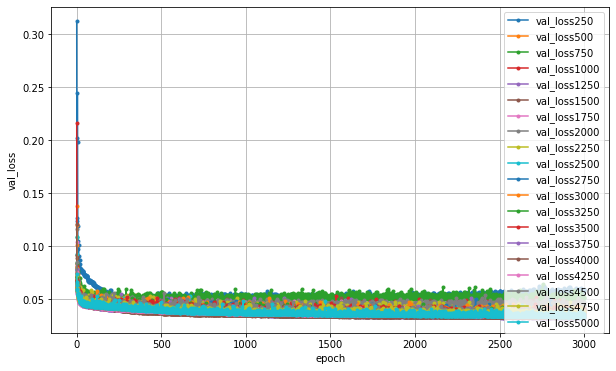

In [61]:
# 学習経過の可視化(大きさ)

val_loss_array = []
for i in range(len(history_position_array)):
    val_loss_array.append(history_position_array[i].history['val_loss'])
plt.figure(figsize=(10,6))
nb_epoch = len(val_loss_array[i])
for i in range(len(val_loss_array)):
    plt.plot(range(nb_epoch), val_loss_array[i], marker='.', label='val_loss%d'%(250*(i+1)))
plt.legend(loc='best', fontsize=10)
plt.grid()
plt.xlabel('epoch')
plt.ylabel('val_loss')
plt.show()


In [62]:
for i in range(len(val_loss_array)):
    print(val_loss_array[i][-1])

0.05850107967853546
0.03590530529618263
0.05238690599799156
0.04133649915456772
0.04060590639710426
0.04069499671459198
0.03931350260972977
0.0466931015253067
0.03854744881391525
0.039146263152360916
0.03674980625510216
0.03965692222118378
0.036366965621709824
0.03836681693792343
0.03524197265505791
0.03287630155682564
0.03414027765393257
0.03464183211326599
0.038914356380701065
0.033713918179273605
